In [1]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import matplotlib.pylab as pylab
pylab.rcParams['figure.figsize'] = (400., 150.)
%matplotlib inline

In [2]:
pft_treefra = '/users/global/cornkle/shared/figs/VERA/vegfrac.cci.2010.4km.3d.nc'
lai_treefra = '/users/global/cornkle/shared/figs/VERA/cci.GLASS_4km_Weight54244_BLfix-Max6.nc'

In [3]:
def cut_kernel(array, xpos, ypos, dist_from_point):
    """
     This function cuts out a kernel from an existing array and allows the kernel to exceed the edges of the input
     array. The cut-out area is shifted accordingly within the kernel window with NaNs filled in
    :param array: 2darray
    :param xpos: middle x point of kernel
    :param ypos: middle y point of kernel
    :param dist_from_point: distance to kernel edge to each side
    :return: 2d array of the chosen kernel size.
    """

    if array.ndim != 2:
        raise IndexError('Cut kernel only allows 2D arrays.')

    kernel = np.zeros((dist_from_point*2+1, dist_from_point*2+1)) * np.nan

    if xpos - dist_from_point >= 0:
        xmin = 0
        xmindist = dist_from_point
    else:
        xmin = (xpos - dist_from_point) * -1
        xmindist = dist_from_point + (xpos - dist_from_point)

    if ypos - dist_from_point >= 0:
        ymin = 0
        ymindist = dist_from_point
    else:
        ymin = (ypos - dist_from_point) * -1
        ymindist = dist_from_point + (ypos - dist_from_point)

    if xpos + dist_from_point < array.shape[1]:
        xmax = kernel.shape[1]
        xmaxdist = dist_from_point + 1
    else:
        xmax = dist_from_point - (xpos - array.shape[1])
        xmaxdist = dist_from_point - (xpos + dist_from_point - array.shape[1])

    if ypos + dist_from_point < array.shape[0]:
        ymax = kernel.shape[0]
        ymaxdist = dist_from_point + 1
    else:
        ymax = dist_from_point - (ypos - array.shape[0])
        ymaxdist = dist_from_point - (ypos + dist_from_point - array.shape[0])

    cutk = array[ypos - ymindist: ypos + ymaxdist, xpos - xmindist: xpos + xmaxdist]


    kernel[ymin: ymax, xmin:xmax] = cutk

    return kernel

In [4]:
pft = xr.open_dataset(pft_treefra)
treefra = pft['field1391'].values[0,:,:]

In [5]:
dlai = xr.open_dataset(lai_treefra, decode_times=False)
lai = dlai['leaf_area_index'].isel(dim1=0, time=3 ).values

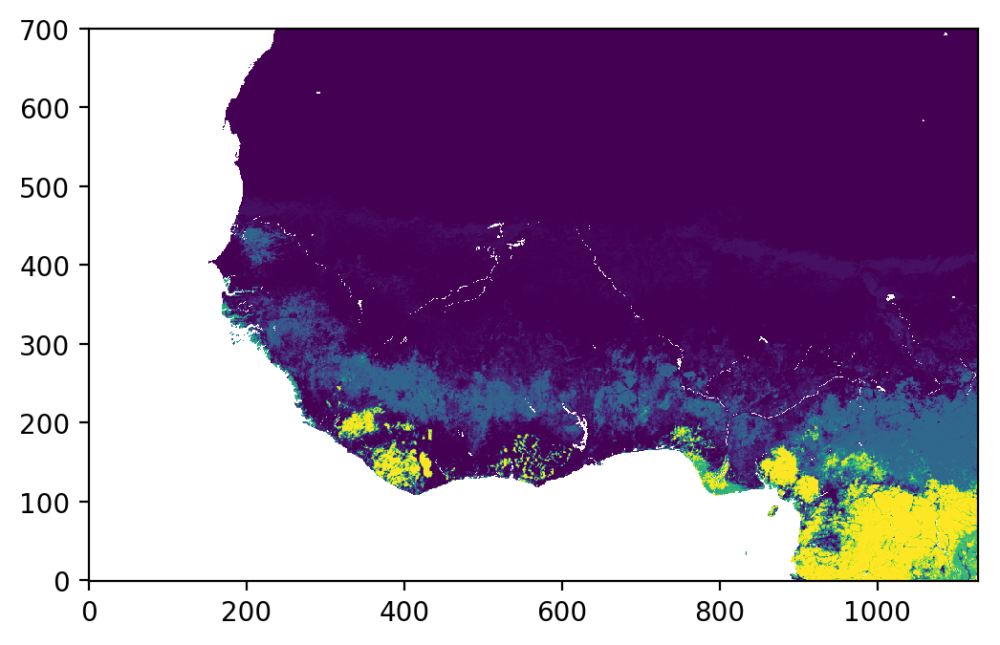

In [6]:
plt.figure(dpi=200)
plt.imshow(treefra, origin='lower')

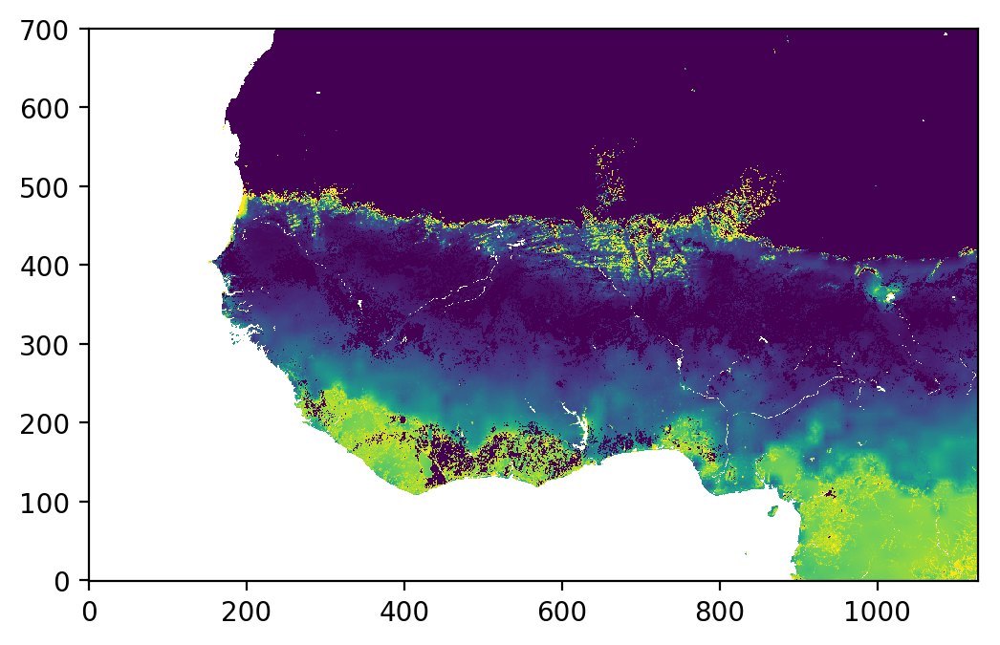

In [7]:
plt.figure(dpi=200)
plt.imshow(lai, origin='lower')

In [8]:
lai[(lai >=50)] = np.nan

/users/global/cornkle/miniconda3/lib/python3.5/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater_equal
  """Entry point for launching an IPython kernel.


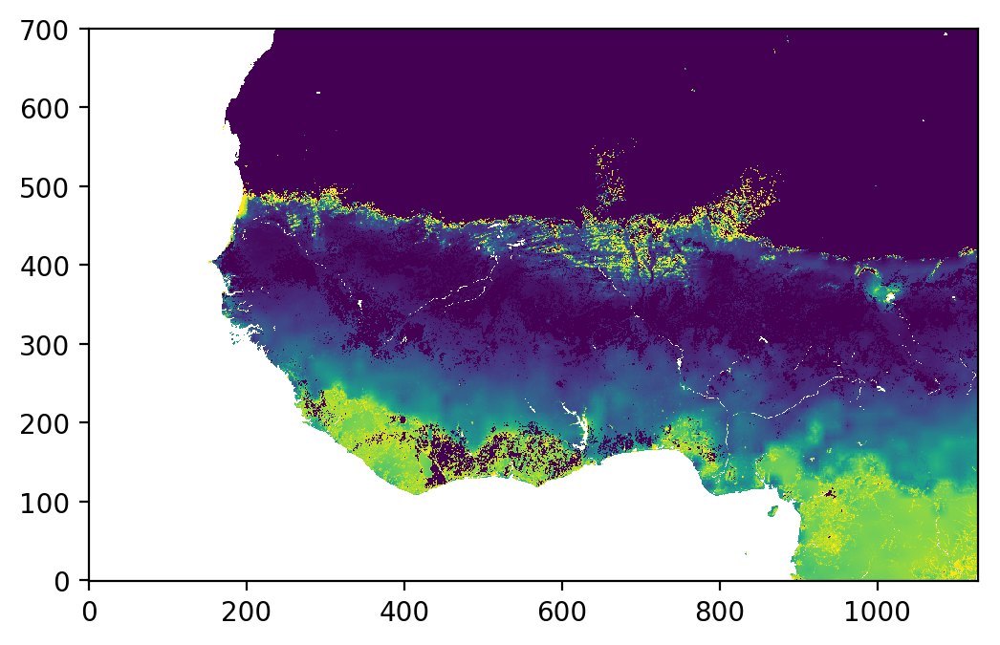

In [9]:
plt.figure(dpi=200)
plt.imshow(lai, origin='lower')

In [10]:
pos = np.where(np.isfinite(lai))

In [11]:
new_lai = np.zeros_like(lai)+np.nan

In [12]:
new_lai.shape

(701, 1128)

In [13]:
for y,x in zip(pos[0], pos[1]):
    
    print(y,x)
    box_lai = cut_kernel(lai, x, y, 25)  # 25 pixel ~ 110km
    box_frac = cut_kernel(treefra, x, y, 25)  # 25 pixel ~ 110km
    
    bigger = np.where(box_lai>0.1)
    new_point = np.sum((box_lai)[bigger])/len(bigger[0]) 
    
    new_lai[y,x] = new_point

0 812
0 813
0 814
0 889
0 895
0 896
0 897
0 898
0 899
0 900
0 901
0 902
0 903
0 904
0 905
0 906
0 907
0 908
0 909
0 910
0 911
0 912
0 913
0 914
0 915
0 916
0 917
0 918
0 919
0 920
0 921
0 922
0 923
0 924
0 925
0 926
0 927
0 928
0 929
0 930
0 931
0 932
0 933
0 934
0 935
0 936
0 937
0 938
0 939
0 940
0 941
0 942
0 943
0 944
0 945
0 946
0 947
0 948
0 949
0 950
0 951
0 952
0 953
0 954
0 955
0 956
0 957
0 958
0 959
0 960
0 961
0 962
0 963
0 964
0 965
0 966
0 967
0 968
0 969
0 970
0 971
0 972
0 973
0 974
0 975
0 976
0 977
0 978
0 979
0 980
0 981
0 982
0 983
0 984
0 985
0 986
0 987
0 988
0 989
0 990
0 991
0 992
0 993
0 994
0 995
0 996
0 997
0 998
0 999
0 1000
0 1001
0 1002
0 1003
0 1004
0 1005
0 1006
0 1007
0 1008
0 1009
0 1010
0 1011
0 1012
0 1013
0 1014
0 1015
0 1016
0 1017
0 1018
0 1019
0 1020
0 1021
0 1022
0 1023
0 1024
0 1025
0 1026
0 1027
0 1028
0 1029
0 1030
0 1031
0 1032
0 1033
0 1034
0 1035
0 1036
0 1037
0 1038
0 1039
0 1040
0 1041
0 1042
0 1043
0 1044
0 1045
0 1046
0 1047
0 1048
0 1

/users/global/cornkle/miniconda3/lib/python3.5/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in greater
  import sys


3 1058
3 1059
3 1060
3 1061
3 1062
3 1063
3 1064
3 1065
3 1066
3 1067
3 1068
3 1069
3 1070
3 1071
3 1072
3 1073
3 1074
3 1075
3 1076
3 1077
3 1078
3 1079
3 1080
3 1081
3 1082
3 1083
3 1084
3 1085
3 1086
3 1087
3 1088
3 1089
3 1090
3 1091
3 1092
3 1093
3 1094
3 1095
3 1096
3 1097
3 1098
3 1099
3 1100
3 1101
3 1102
3 1103
3 1104
3 1105
3 1106
3 1107
3 1108
3 1109
3 1110
3 1111
3 1112
3 1113
3 1114
3 1115
3 1116
3 1117
3 1118
3 1119
3 1120
3 1121
3 1122
3 1123
3 1124
3 1125
4 892
4 893
4 894
4 895
4 896
4 897
4 898
4 899
4 900
4 901
4 902
4 903
4 904
4 905
4 906
4 907
4 908
4 909
4 910
4 911
4 912
4 913
4 914
4 915
4 916
4 917
4 918
4 919
4 920
4 921
4 922
4 923
4 924
4 925
4 926
4 927
4 928
4 929
4 930
4 931
4 932
4 933
4 934
4 935
4 936
4 937
4 938
4 939
4 940
4 941
4 942
4 943
4 944
4 945
4 946
4 947
4 948
4 949
4 950
4 951
4 952
4 953
4 954
4 955
4 956
4 957
4 958
4 959
4 960
4 961
4 962
4 963
4 964
4 965
4 966
4 967
4 968
4 969
4 970
4 971
4 972
4 973
4 974
4 975
4 976
4 977
4 978
4 

12 898
12 899
12 900
12 901
12 902
12 903
12 904
12 905
12 906
12 907
12 908
12 909
12 910
12 911
12 912
12 913
12 914
12 915
12 916
12 917
12 918
12 919
12 920
12 921
12 922
12 923
12 924
12 925
12 926
12 927
12 928
12 929
12 930
12 931
12 932
12 933
12 934
12 935
12 936
12 937
12 938
12 939
12 940
12 941
12 942
12 943
12 944
12 945
12 946
12 947
12 948
12 949
12 950
12 951
12 952
12 953
12 954
12 955
12 956
12 957
12 958
12 959
12 960
12 961
12 962
12 963
12 964
12 965
12 966
12 967
12 968
12 969
12 970
12 971
12 972
12 973
12 974
12 975
12 976
12 977
12 978
12 979
12 980
12 981
12 982
12 983
12 984
12 985
12 986
12 987
12 988
12 989
12 990
12 991
12 992
12 993
12 994
12 995
12 996
12 997
12 998
12 999
12 1000
12 1001
12 1002
12 1003
12 1004
12 1005
12 1006
12 1007
12 1008
12 1009
12 1010
12 1011
12 1012
12 1013
12 1014
12 1015
12 1016
12 1017
12 1018
12 1019
12 1020
12 1021
12 1022
12 1023
12 1024
12 1025
12 1026
12 1027
12 1028
12 1029
12 1030
12 1031
12 1032
12 1033
12 1034
12 103

20 956
20 957
20 958
20 959
20 960
20 961
20 962
20 963
20 964
20 965
20 966
20 967
20 968
20 969
20 970
20 971
20 972
20 973
20 974
20 975
20 976
20 977
20 978
20 979
20 980
20 981
20 982
20 983
20 984
20 985
20 986
20 987
20 988
20 989
20 990
20 991
20 992
20 993
20 994
20 995
20 996
20 997
20 998
20 999
20 1000
20 1001
20 1002
20 1003
20 1004
20 1005
20 1006
20 1007
20 1008
20 1009
20 1010
20 1011
20 1012
20 1013
20 1014
20 1015
20 1016
20 1017
20 1018
20 1019
20 1020
20 1021
20 1022
20 1023
20 1024
20 1025
20 1026
20 1027
20 1028
20 1029
20 1030
20 1031
20 1032
20 1033
20 1034
20 1035
20 1036
20 1037
20 1038
20 1039
20 1040
20 1041
20 1042
20 1043
20 1044
20 1045
20 1046
20 1047
20 1048
20 1049
20 1050
20 1051
20 1052
20 1053
20 1054
20 1055
20 1056
20 1057
20 1058
20 1059
20 1060
20 1061
20 1062
20 1063
20 1064
20 1065
20 1066
20 1067
20 1068
20 1069
20 1070
20 1071
20 1072
20 1073
20 1074
20 1075
20 1076
20 1077
20 1078
20 1079
20 1080
20 1081
20 1082
20 1083
20 1084
20 1085
20 1

28 923
28 924
28 925
28 926
28 927
28 928
28 929
28 930
28 931
28 932
28 933
28 934
28 935
28 936
28 937
28 938
28 939
28 940
28 941
28 942
28 943
28 944
28 945
28 946
28 947
28 948
28 949
28 950
28 951
28 952
28 953
28 954
28 955
28 956
28 957
28 958
28 959
28 960
28 961
28 962
28 963
28 964
28 965
28 966
28 967
28 968
28 969
28 970
28 971
28 972
28 973
28 974
28 975
28 976
28 977
28 978
28 979
28 980
28 981
28 982
28 983
28 984
28 985
28 986
28 987
28 988
28 989
28 990
28 991
28 992
28 993
28 994
28 995
28 996
28 997
28 998
28 999
28 1000
28 1001
28 1002
28 1003
28 1004
28 1005
28 1006
28 1007
28 1008
28 1009
28 1010
28 1011
28 1012
28 1013
28 1014
28 1015
28 1016
28 1017
28 1018
28 1019
28 1020
28 1021
28 1022
28 1023
28 1024
28 1025
28 1026
28 1027
28 1028
28 1029
28 1030
28 1031
28 1032
28 1033
28 1034
28 1035
28 1036
28 1037
28 1038
28 1039
28 1040
28 1041
28 1042
28 1043
28 1044
28 1045
28 1046
28 1047
28 1048
28 1049
28 1050
28 1051
28 1052
28 1053
28 1054
28 1055
28 1056
28 10

35 1093
35 1094
35 1095
35 1096
35 1097
35 1098
35 1099
35 1100
35 1101
35 1102
35 1103
35 1104
35 1105
35 1106
35 1107
35 1108
35 1109
35 1110
35 1111
35 1112
35 1113
35 1114
35 1115
35 1116
35 1117
35 1118
35 1119
35 1120
35 1121
35 1122
35 1123
35 1124
35 1125
35 1126
35 1127
36 833
36 834
36 897
36 899
36 900
36 901
36 902
36 903
36 904
36 905
36 907
36 908
36 909
36 910
36 911
36 912
36 913
36 914
36 915
36 916
36 917
36 918
36 919
36 920
36 921
36 922
36 923
36 924
36 925
36 926
36 927
36 928
36 929
36 930
36 931
36 932
36 933
36 934
36 935
36 936
36 937
36 938
36 939
36 940
36 941
36 942
36 943
36 944
36 945
36 946
36 947
36 948
36 949
36 950
36 951
36 952
36 953
36 954
36 955
36 956
36 957
36 958
36 959
36 960
36 961
36 962
36 963
36 964
36 965
36 966
36 967
36 968
36 969
36 970
36 971
36 972
36 973
36 974
36 975
36 976
36 977
36 978
36 979
36 980
36 981
36 982
36 983
36 984
36 985
36 986
36 987
36 988
36 989
36 990
36 991
36 992
36 993
36 994
36 995
36 996
36 997
36 998
36 999

43 1092
43 1093
43 1094
43 1095
43 1096
43 1097
43 1098
43 1099
43 1100
43 1101
43 1102
43 1103
43 1104
43 1105
43 1106
43 1107
43 1108
43 1109
43 1110
43 1111
43 1112
43 1113
43 1114
43 1115
43 1116
43 1117
43 1118
43 1119
43 1120
43 1121
43 1122
43 1123
43 1124
43 1125
43 1126
43 1127
44 900
44 901
44 902
44 903
44 904
44 905
44 906
44 907
44 908
44 909
44 910
44 911
44 912
44 913
44 914
44 915
44 916
44 917
44 918
44 919
44 920
44 921
44 922
44 924
44 925
44 926
44 927
44 928
44 929
44 930
44 931
44 932
44 933
44 934
44 935
44 936
44 937
44 938
44 939
44 940
44 941
44 942
44 943
44 944
44 945
44 946
44 947
44 948
44 949
44 950
44 951
44 952
44 953
44 954
44 955
44 956
44 957
44 958
44 959
44 960
44 961
44 962
44 963
44 964
44 965
44 966
44 967
44 968
44 969
44 970
44 971
44 972
44 973
44 974
44 975
44 976
44 977
44 978
44 979
44 980
44 981
44 982
44 983
44 984
44 985
44 986
44 987
44 988
44 989
44 990
44 991
44 992
44 993
44 994
44 995
44 996
44 997
44 998
44 999
44 1000
44 1001
44 

51 1059
51 1060
51 1061
51 1062
51 1063
51 1064
51 1065
51 1066
51 1067
51 1068
51 1069
51 1070
51 1071
51 1072
51 1073
51 1074
51 1075
51 1076
51 1078
51 1079
51 1080
51 1081
51 1082
51 1083
51 1084
51 1085
51 1086
51 1087
51 1088
51 1089
51 1090
51 1091
51 1092
51 1093
51 1094
51 1095
51 1096
51 1097
51 1098
51 1099
51 1100
51 1101
51 1102
51 1103
51 1104
51 1105
51 1106
51 1107
51 1108
51 1109
51 1110
51 1111
51 1112
51 1113
51 1114
51 1115
51 1116
51 1117
51 1118
51 1119
51 1120
51 1121
51 1122
51 1123
51 1124
51 1125
51 1126
51 1127
52 900
52 901
52 902
52 903
52 904
52 905
52 906
52 907
52 908
52 909
52 910
52 911
52 912
52 913
52 914
52 915
52 916
52 917
52 918
52 919
52 920
52 921
52 922
52 923
52 924
52 925
52 926
52 927
52 928
52 929
52 930
52 931
52 932
52 933
52 934
52 935
52 936
52 937
52 938
52 939
52 940
52 941
52 942
52 943
52 944
52 945
52 946
52 947
52 948
52 949
52 950
52 951
52 952
52 953
52 954
52 955
52 956
52 957
52 958
52 959
52 960
52 961
52 962
52 963
52 964
5

59 1039
59 1040
59 1041
59 1042
59 1043
59 1044
59 1045
59 1046
59 1047
59 1048
59 1049
59 1050
59 1051
59 1052
59 1053
59 1054
59 1055
59 1056
59 1057
59 1058
59 1059
59 1060
59 1061
59 1062
59 1063
59 1064
59 1065
59 1066
59 1067
59 1068
59 1069
59 1070
59 1071
59 1072
59 1073
59 1074
59 1075
59 1076
59 1077
59 1078
59 1079
59 1080
59 1081
59 1082
59 1083
59 1084
59 1085
59 1086
59 1087
59 1088
59 1089
59 1090
59 1091
59 1092
59 1093
59 1094
59 1095
59 1096
59 1097
59 1098
59 1099
59 1100
59 1101
59 1102
59 1103
59 1104
59 1105
59 1106
59 1107
59 1108
59 1109
59 1110
59 1111
59 1112
59 1113
59 1114
59 1115
59 1116
59 1117
59 1118
59 1119
59 1120
59 1121
59 1122
59 1123
59 1124
59 1125
59 1126
59 1127
60 901
60 902
60 903
60 904
60 905
60 906
60 907
60 908
60 909
60 910
60 911
60 912
60 913
60 914
60 915
60 916
60 917
60 918
60 919
60 920
60 921
60 922
60 923
60 924
60 925
60 926
60 927
60 928
60 929
60 930
60 931
60 932
60 933
60 934
60 935
60 936
60 937
60 938
60 939
60 940
60 941
6

67 1033
67 1034
67 1035
67 1036
67 1037
67 1038
67 1039
67 1040
67 1041
67 1042
67 1043
67 1044
67 1045
67 1046
67 1047
67 1048
67 1049
67 1050
67 1051
67 1052
67 1053
67 1054
67 1055
67 1056
67 1057
67 1058
67 1059
67 1060
67 1061
67 1062
67 1063
67 1064
67 1065
67 1066
67 1067
67 1068
67 1069
67 1070
67 1071
67 1072
67 1073
67 1074
67 1075
67 1076
67 1077
67 1078
67 1079
67 1080
67 1081
67 1082
67 1083
67 1084
67 1085
67 1086
67 1087
67 1088
67 1089
67 1090
67 1091
67 1092
67 1093
67 1094
67 1095
67 1096
67 1097
67 1098
67 1099
67 1100
67 1101
67 1102
67 1103
67 1104
67 1105
67 1106
67 1107
67 1108
67 1109
67 1110
67 1111
67 1112
67 1113
67 1114
67 1115
67 1116
67 1117
67 1118
67 1119
67 1120
67 1121
67 1122
67 1123
67 1124
67 1125
67 1126
67 1127
68 902
68 903
68 904
68 905
68 906
68 907
68 908
68 909
68 910
68 911
68 912
68 913
68 914
68 915
68 916
68 917
68 918
68 919
68 920
68 921
68 922
68 923
68 924
68 925
68 926
68 927
68 928
68 929
68 930
68 931
68 932
68 933
68 934
68 935
68

75 1097
75 1098
75 1099
75 1100
75 1101
75 1102
75 1103
75 1104
75 1105
75 1106
75 1107
75 1108
75 1109
75 1110
75 1111
75 1112
75 1113
75 1114
75 1115
75 1116
75 1117
75 1118
75 1119
75 1120
75 1121
75 1122
75 1123
75 1124
75 1125
75 1126
75 1127
76 904
76 905
76 906
76 907
76 908
76 909
76 910
76 911
76 912
76 913
76 914
76 915
76 916
76 917
76 918
76 919
76 920
76 921
76 922
76 923
76 924
76 925
76 926
76 927
76 928
76 929
76 930
76 931
76 932
76 933
76 934
76 935
76 936
76 937
76 938
76 939
76 940
76 941
76 942
76 943
76 944
76 945
76 946
76 947
76 948
76 949
76 950
76 951
76 952
76 953
76 954
76 955
76 956
76 957
76 958
76 959
76 960
76 961
76 962
76 963
76 964
76 965
76 966
76 967
76 968
76 969
76 970
76 971
76 972
76 973
76 974
76 975
76 976
76 977
76 978
76 979
76 980
76 981
76 982
76 983
76 984
76 985
76 986
76 987
76 988
76 989
76 990
76 991
76 992
76 993
76 994
76 995
76 996
76 997
76 998
76 999
76 1000
76 1001
76 1002
76 1003
76 1004
76 1005
76 1006
76 1007
76 1008
76 1009


83 1097
83 1098
83 1099
83 1100
83 1101
83 1102
83 1103
83 1104
83 1105
83 1106
83 1107
83 1108
83 1109
83 1110
83 1111
83 1112
83 1113
83 1114
83 1115
83 1116
83 1117
83 1118
83 1119
83 1120
83 1121
83 1122
83 1123
83 1124
83 1125
83 1126
83 1127
84 861
84 862
84 863
84 864
84 865
84 866
84 867
84 868
84 869
84 870
84 902
84 903
84 904
84 905
84 906
84 907
84 908
84 909
84 910
84 911
84 912
84 913
84 914
84 915
84 916
84 917
84 918
84 919
84 920
84 921
84 922
84 923
84 924
84 925
84 926
84 927
84 928
84 929
84 930
84 931
84 932
84 933
84 934
84 935
84 936
84 937
84 938
84 939
84 940
84 941
84 942
84 943
84 944
84 945
84 946
84 947
84 948
84 949
84 950
84 951
84 952
84 953
84 954
84 955
84 956
84 957
84 958
84 959
84 960
84 961
84 962
84 963
84 964
84 965
84 966
84 967
84 968
84 969
84 970
84 971
84 972
84 973
84 974
84 975
84 976
84 977
84 978
84 979
84 980
84 981
84 982
84 983
84 984
84 985
84 986
84 987
84 988
84 989
84 990
84 991
84 992
84 993
84 994
84 995
84 996
84 997
84 998
84 

91 988
91 989
91 990
91 991
91 992
91 993
91 994
91 995
91 996
91 997
91 998
91 999
91 1000
91 1001
91 1002
91 1003
91 1004
91 1005
91 1006
91 1007
91 1008
91 1009
91 1010
91 1011
91 1012
91 1013
91 1014
91 1015
91 1016
91 1017
91 1018
91 1019
91 1020
91 1021
91 1022
91 1023
91 1024
91 1025
91 1026
91 1027
91 1028
91 1029
91 1030
91 1031
91 1032
91 1033
91 1034
91 1035
91 1036
91 1037
91 1038
91 1039
91 1040
91 1041
91 1042
91 1043
91 1044
91 1045
91 1046
91 1047
91 1048
91 1049
91 1050
91 1051
91 1052
91 1053
91 1054
91 1055
91 1056
91 1057
91 1058
91 1059
91 1060
91 1061
91 1062
91 1063
91 1064
91 1065
91 1066
91 1067
91 1068
91 1069
91 1070
91 1071
91 1072
91 1073
91 1074
91 1075
91 1076
91 1077
91 1078
91 1079
91 1080
91 1081
91 1082
91 1083
91 1084
91 1085
91 1086
91 1087
91 1088
91 1089
91 1090
91 1091
91 1092
91 1093
91 1094
91 1095
91 1096
91 1097
91 1098
91 1099
91 1100
91 1101
91 1102
91 1103
91 1104
91 1105
91 1106
91 1107
91 1108
91 1109
91 1110
91 1111
91 1112
91 1113
91 1

98 1122
98 1123
98 1124
98 1125
98 1126
98 1127
99 897
99 898
99 899
99 900
99 901
99 902
99 903
99 904
99 905
99 906
99 907
99 908
99 909
99 912
99 913
99 914
99 915
99 916
99 917
99 918
99 919
99 920
99 921
99 922
99 923
99 924
99 925
99 926
99 927
99 928
99 929
99 930
99 931
99 932
99 933
99 934
99 935
99 936
99 937
99 938
99 939
99 940
99 941
99 942
99 943
99 944
99 945
99 946
99 947
99 948
99 949
99 950
99 951
99 952
99 953
99 954
99 955
99 956
99 957
99 958
99 959
99 960
99 961
99 962
99 963
99 964
99 965
99 966
99 967
99 968
99 969
99 970
99 971
99 972
99 973
99 974
99 975
99 976
99 977
99 978
99 979
99 980
99 981
99 982
99 983
99 984
99 985
99 986
99 987
99 988
99 989
99 990
99 991
99 992
99 993
99 994
99 995
99 996
99 997
99 998
99 999
99 1000
99 1001
99 1002
99 1003
99 1004
99 1005
99 1006
99 1007
99 1008
99 1009
99 1010
99 1011
99 1012
99 1013
99 1014
99 1015
99 1016
99 1017
99 1018
99 1019
99 1020
99 1021
99 1022
99 1023
99 1024
99 1025
99 1026
99 1027
99 1028
99 1029
99 10

106 1011
106 1012
106 1013
106 1014
106 1015
106 1016
106 1017
106 1018
106 1019
106 1020
106 1021
106 1022
106 1023
106 1024
106 1025
106 1026
106 1027
106 1028
106 1029
106 1030
106 1031
106 1032
106 1033
106 1034
106 1035
106 1036
106 1037
106 1038
106 1039
106 1040
106 1041
106 1042
106 1043
106 1044
106 1045
106 1046
106 1047
106 1048
106 1049
106 1050
106 1051
106 1052
106 1053
106 1054
106 1055
106 1056
106 1057
106 1058
106 1059
106 1060
106 1061
106 1062
106 1063
106 1064
106 1065
106 1066
106 1067
106 1068
106 1069
106 1070
106 1071
106 1072
106 1073
106 1074
106 1075
106 1076
106 1077
106 1078
106 1079
106 1080
106 1081
106 1082
106 1083
106 1084
106 1085
106 1086
106 1087
106 1088
106 1089
106 1090
106 1091
106 1092
106 1093
106 1094
106 1095
106 1096
106 1097
106 1098
106 1099
106 1100
106 1101
106 1102
106 1103
106 1104
106 1105
106 1106
106 1107
106 1108
106 1109
106 1110
106 1111
106 1112
106 1113
106 1114
106 1115
106 1116
106 1117
106 1118
106 1119
106 1120
106 1121
1

113 812
113 813
113 814
113 815
113 816
113 817
113 818
113 819
113 825
113 826
113 827
113 828
113 873
113 874
113 875
113 876
113 877
113 878
113 879
113 880
113 881
113 882
113 883
113 884
113 885
113 886
113 887
113 888
113 889
113 890
113 891
113 892
113 893
113 894
113 895
113 896
113 897
113 898
113 899
113 900
113 901
113 902
113 903
113 904
113 905
113 906
113 907
113 908
113 909
113 910
113 911
113 912
113 913
113 914
113 915
113 916
113 917
113 918
113 919
113 920
113 921
113 922
113 923
113 924
113 925
113 926
113 927
113 928
113 929
113 930
113 931
113 933
113 934
113 935
113 936
113 938
113 939
113 940
113 941
113 942
113 943
113 944
113 945
113 946
113 947
113 948
113 949
113 950
113 951
113 952
113 953
113 954
113 955
113 956
113 957
113 958
113 959
113 960
113 961
113 962
113 963
113 964
113 965
113 966
113 967
113 968
113 969
113 970
113 971
113 972
113 973
113 974
113 975
113 976
113 977
113 978
113 979
113 980
113 981
113 982
113 983
113 984
113 985
113 986
113 987


118 910
118 911
118 912
118 913
118 914
118 915
118 916
118 917
118 918
118 919
118 920
118 921
118 922
118 923
118 924
118 925
118 926
118 927
118 928
118 929
118 930
118 931
118 932
118 933
118 934
118 935
118 936
118 937
118 938
118 939
118 940
118 941
118 942
118 943
118 944
118 945
118 946
118 947
118 948
118 949
118 950
118 951
118 952
118 953
118 954
118 955
118 956
118 957
118 958
118 959
118 960
118 961
118 962
118 963
118 964
118 965
118 966
118 967
118 968
118 969
118 970
118 971
118 972
118 973
118 974
118 975
118 976
118 977
118 978
118 979
118 980
118 981
118 982
118 983
118 984
118 985
118 986
118 987
118 988
118 989
118 990
118 991
118 992
118 993
118 994
118 995
118 996
118 997
118 998
118 999
118 1000
118 1001
118 1002
118 1003
118 1004
118 1005
118 1006
118 1007
118 1008
118 1009
118 1010
118 1011
118 1012
118 1013
118 1014
118 1015
118 1016
118 1017
118 1018
118 1019
118 1020
118 1021
118 1022
118 1023
118 1024
118 1025
118 1026
118 1027
118 1028
118 1029
118 1030
1

122 1059
122 1060
122 1061
122 1062
122 1063
122 1064
122 1065
122 1066
122 1067
122 1068
122 1069
122 1070
122 1071
122 1072
122 1073
122 1074
122 1075
122 1076
122 1077
122 1078
122 1079
122 1080
122 1081
122 1082
122 1083
122 1084
122 1085
122 1086
122 1087
122 1088
122 1089
122 1090
122 1091
122 1092
122 1093
122 1094
122 1095
122 1096
122 1097
122 1098
122 1099
122 1100
122 1101
122 1102
122 1103
122 1104
122 1105
122 1106
122 1107
122 1108
122 1109
122 1110
122 1111
122 1112
122 1113
122 1114
122 1115
122 1116
122 1117
122 1118
122 1119
122 1120
122 1121
122 1122
122 1123
122 1124
122 1125
122 1126
122 1127
123 382
123 383
123 384
123 385
123 386
123 387
123 388
123 389
123 390
123 391
123 392
123 393
123 394
123 395
123 396
123 397
123 398
123 399
123 400
123 401
123 402
123 403
123 404
123 405
123 406
123 407
123 408
123 409
123 410
123 411
123 412
123 413
123 414
123 415
123 416
123 417
123 418
123 419
123 420
123 421
123 422
123 423
123 424
123 425
123 426
123 427
123 428
123

127 391
127 392
127 393
127 394
127 395
127 396
127 397
127 398
127 399
127 400
127 401
127 402
127 403
127 404
127 405
127 406
127 407
127 408
127 409
127 410
127 411
127 412
127 413
127 414
127 415
127 416
127 417
127 418
127 419
127 420
127 421
127 422
127 423
127 424
127 425
127 426
127 427
127 428
127 429
127 430
127 431
127 432
127 433
127 434
127 435
127 436
127 437
127 438
127 439
127 440
127 441
127 442
127 443
127 444
127 445
127 446
127 447
127 448
127 449
127 450
127 451
127 452
127 453
127 454
127 455
127 456
127 457
127 458
127 459
127 460
127 461
127 462
127 463
127 464
127 465
127 542
127 544
127 545
127 546
127 547
127 548
127 549
127 550
127 551
127 552
127 553
127 554
127 555
127 556
127 557
127 558
127 559
127 560
127 561
127 562
127 563
127 564
127 565
127 566
127 567
127 568
127 569
127 570
127 571
127 572
127 573
127 574
127 575
127 576
127 577
127 578
127 579
127 580
127 581
127 582
127 583
127 584
127 585
127 777
127 778
127 779
127 780
127 781
127 782
127 783


130 986
130 987
130 988
130 989
130 990
130 991
130 992
130 993
130 994
130 995
130 996
130 997
130 998
130 999
130 1000
130 1001
130 1002
130 1003
130 1004
130 1005
130 1006
130 1007
130 1008
130 1009
130 1010
130 1011
130 1012
130 1013
130 1014
130 1015
130 1016
130 1017
130 1018
130 1019
130 1020
130 1021
130 1022
130 1023
130 1024
130 1025
130 1026
130 1027
130 1028
130 1029
130 1030
130 1031
130 1032
130 1033
130 1034
130 1035
130 1036
130 1037
130 1038
130 1039
130 1040
130 1041
130 1042
130 1043
130 1044
130 1045
130 1046
130 1047
130 1048
130 1049
130 1050
130 1051
130 1052
130 1053
130 1054
130 1055
130 1056
130 1057
130 1058
130 1059
130 1060
130 1061
130 1062
130 1063
130 1064
130 1065
130 1066
130 1067
130 1068
130 1069
130 1070
130 1071
130 1072
130 1073
130 1074
130 1075
130 1076
130 1077
130 1078
130 1079
130 1080
130 1081
130 1082
130 1083
130 1084
130 1085
130 1086
130 1087
130 1088
130 1089
130 1090
130 1091
130 1092
130 1093
130 1094
130 1095
130 1096
130 1097
130 10

134 388
134 389
134 390
134 391
134 392
134 393
134 394
134 395
134 396
134 397
134 398
134 399
134 400
134 401
134 402
134 403
134 404
134 405
134 406
134 407
134 408
134 409
134 410
134 411
134 412
134 413
134 414
134 415
134 416
134 417
134 418
134 419
134 420
134 421
134 422
134 423
134 424
134 425
134 426
134 427
134 428
134 429
134 430
134 431
134 432
134 433
134 434
134 435
134 436
134 437
134 438
134 439
134 440
134 441
134 442
134 443
134 444
134 445
134 446
134 447
134 448
134 449
134 450
134 451
134 452
134 453
134 454
134 455
134 456
134 457
134 458
134 459
134 460
134 461
134 462
134 463
134 464
134 465
134 466
134 467
134 468
134 469
134 470
134 471
134 472
134 473
134 474
134 475
134 476
134 477
134 478
134 479
134 480
134 481
134 482
134 483
134 484
134 485
134 486
134 487
134 488
134 489
134 490
134 491
134 492
134 493
134 494
134 495
134 496
134 497
134 498
134 499
134 500
134 501
134 502
134 503
134 504
134 505
134 506
134 507
134 508
134 509
134 510
134 511
134 512


137 476
137 477
137 478
137 479
137 480
137 481
137 482
137 483
137 484
137 485
137 486
137 487
137 488
137 489
137 490
137 492
137 493
137 494
137 495
137 496
137 497
137 498
137 499
137 500
137 501
137 502
137 503
137 504
137 505
137 506
137 507
137 508
137 509
137 510
137 511
137 512
137 513
137 514
137 515
137 516
137 518
137 519
137 520
137 521
137 522
137 523
137 524
137 525
137 526
137 527
137 528
137 529
137 530
137 531
137 532
137 533
137 534
137 535
137 536
137 537
137 538
137 539
137 540
137 541
137 542
137 543
137 544
137 545
137 546
137 547
137 548
137 549
137 550
137 551
137 552
137 553
137 554
137 555
137 556
137 557
137 558
137 559
137 560
137 561
137 562
137 563
137 564
137 565
137 566
137 567
137 568
137 569
137 570
137 571
137 572
137 573
137 574
137 575
137 576
137 577
137 578
137 579
137 580
137 581
137 582
137 583
137 584
137 585
137 586
137 587
137 588
137 589
137 590
137 591
137 592
137 593
137 594
137 595
137 596
137 597
137 598
137 599
137 600
137 601
137 602


140 512
140 513
140 514
140 515
140 516
140 517
140 518
140 519
140 520
140 521
140 522
140 523
140 524
140 525
140 526
140 527
140 528
140 529
140 530
140 531
140 532
140 533
140 534
140 536
140 537
140 538
140 539
140 540
140 541
140 542
140 543
140 544
140 545
140 546
140 547
140 548
140 549
140 550
140 551
140 552
140 553
140 554
140 555
140 556
140 557
140 558
140 559
140 560
140 561
140 562
140 563
140 564
140 565
140 566
140 567
140 568
140 569
140 570
140 571
140 572
140 573
140 574
140 575
140 576
140 577
140 578
140 579
140 580
140 581
140 582
140 583
140 584
140 585
140 586
140 587
140 588
140 589
140 590
140 591
140 592
140 593
140 594
140 595
140 596
140 597
140 598
140 599
140 600
140 601
140 602
140 603
140 604
140 605
140 606
140 607
140 608
140 609
140 610
140 611
140 612
140 613
140 614
140 615
140 616
140 617
140 618
140 619
140 771
140 772
140 773
140 774
140 775
140 776
140 777
140 778
140 779
140 780
140 781
140 782
140 783
140 784
140 785
140 786
140 787
140 788


143 413
143 414
143 415
143 416
143 417
143 418
143 419
143 420
143 421
143 422
143 423
143 424
143 425
143 426
143 427
143 428
143 429
143 430
143 431
143 432
143 433
143 434
143 435
143 436
143 437
143 438
143 439
143 440
143 441
143 442
143 443
143 444
143 446
143 447
143 448
143 449
143 450
143 451
143 452
143 453
143 454
143 455
143 456
143 457
143 458
143 459
143 460
143 461
143 462
143 463
143 464
143 465
143 466
143 467
143 468
143 469
143 470
143 471
143 472
143 473
143 474
143 475
143 476
143 477
143 478
143 479
143 480
143 481
143 482
143 483
143 484
143 485
143 486
143 487
143 488
143 489
143 490
143 491
143 492
143 493
143 494
143 495
143 496
143 497
143 498
143 499
143 500
143 501
143 502
143 503
143 504
143 505
143 506
143 507
143 508
143 509
143 510
143 511
143 512
143 513
143 514
143 515
143 516
143 517
143 518
143 519
143 520
143 521
143 522
143 523
143 524
143 525
143 526
143 527
143 528
143 529
143 530
143 531
143 532
143 533
143 534
143 535
143 536
143 539
143 540


146 374
146 375
146 376
146 377
146 378
146 379
146 380
146 381
146 382
146 383
146 384
146 385
146 386
146 387
146 388
146 389
146 390
146 391
146 392
146 393
146 394
146 395
146 396
146 397
146 398
146 399
146 400
146 401
146 402
146 403
146 404
146 405
146 406
146 407
146 408
146 409
146 410
146 411
146 412
146 413
146 414
146 415
146 416
146 417
146 418
146 419
146 420
146 421
146 422
146 423
146 424
146 425
146 426
146 427
146 428
146 429
146 430
146 431
146 432
146 433
146 434
146 435
146 436
146 437
146 438
146 439
146 440
146 441
146 442
146 443
146 444
146 445
146 446
146 447
146 448
146 449
146 450
146 451
146 452
146 453
146 454
146 455
146 456
146 457
146 458
146 459
146 460
146 461
146 462
146 463
146 464
146 465
146 466
146 467
146 468
146 469
146 470
146 471
146 472
146 473
146 474
146 475
146 476
146 477
146 478
146 479
146 480
146 481
146 482
146 483
146 484
146 485
146 486
146 487
146 488
146 489
146 490
146 491
146 492
146 493
146 494
146 495
146 496
146 497
146 498


148 1017
148 1018
148 1019
148 1020
148 1021
148 1022
148 1023
148 1024
148 1025
148 1026
148 1027
148 1028
148 1029
148 1030
148 1031
148 1032
148 1033
148 1034
148 1035
148 1036
148 1037
148 1038
148 1039
148 1040
148 1041
148 1042
148 1043
148 1044
148 1045
148 1046
148 1047
148 1048
148 1049
148 1050
148 1051
148 1052
148 1053
148 1054
148 1055
148 1056
148 1057
148 1058
148 1059
148 1060
148 1061
148 1062
148 1063
148 1064
148 1065
148 1066
148 1067
148 1068
148 1069
148 1070
148 1071
148 1072
148 1073
148 1074
148 1075
148 1076
148 1077
148 1078
148 1079
148 1080
148 1081
148 1082
148 1083
148 1084
148 1085
148 1086
148 1087
148 1088
148 1089
148 1090
148 1091
148 1092
148 1093
148 1094
148 1095
148 1096
148 1097
148 1098
148 1099
148 1100
148 1101
148 1102
148 1103
148 1104
148 1105
148 1106
148 1107
148 1108
148 1109
148 1110
148 1111
148 1112
148 1113
148 1114
148 1115
148 1116
148 1117
148 1118
148 1119
148 1120
148 1121
148 1122
148 1123
148 1124
148 1125
148 1126
148 1127
1

151 817
151 818
151 819
151 820
151 821
151 822
151 823
151 824
151 825
151 826
151 827
151 828
151 829
151 830
151 831
151 832
151 833
151 834
151 835
151 836
151 837
151 838
151 839
151 840
151 841
151 842
151 843
151 844
151 845
151 846
151 847
151 848
151 849
151 850
151 851
151 852
151 853
151 854
151 855
151 856
151 857
151 858
151 859
151 860
151 861
151 862
151 863
151 864
151 865
151 866
151 867
151 868
151 869
151 870
151 871
151 872
151 873
151 874
151 875
151 876
151 877
151 878
151 879
151 880
151 881
151 882
151 883
151 884
151 885
151 886
151 887
151 888
151 889
151 890
151 891
151 892
151 893
151 894
151 895
151 896
151 897
151 898
151 899
151 900
151 901
151 902
151 903
151 904
151 905
151 906
151 907
151 908
151 909
151 910
151 911
151 912
151 913
151 914
151 915
151 916
151 917
151 918
151 919
151 920
151 921
151 922
151 923
151 924
151 925
151 926
151 927
151 928
151 929
151 930
151 931
151 932
151 933
151 934
151 935
151 936
151 937
151 938
151 939
151 940
151 941


154 359
154 360
154 361
154 362
154 363
154 364
154 365
154 366
154 367
154 368
154 369
154 370
154 371
154 372
154 373
154 374
154 375
154 376
154 377
154 378
154 379
154 380
154 381
154 382
154 383
154 384
154 385
154 386
154 387
154 388
154 389
154 390
154 391
154 392
154 393
154 394
154 395
154 396
154 397
154 398
154 399
154 400
154 401
154 402
154 403
154 404
154 405
154 406
154 407
154 408
154 409
154 410
154 411
154 412
154 413
154 414
154 415
154 416
154 417
154 418
154 419
154 420
154 421
154 422
154 423
154 424
154 425
154 426
154 427
154 428
154 429
154 430
154 431
154 432
154 433
154 434
154 435
154 436
154 437
154 438
154 439
154 440
154 441
154 442
154 443
154 444
154 445
154 446
154 447
154 448
154 449
154 450
154 451
154 452
154 453
154 454
154 455
154 456
154 457
154 458
154 459
154 460
154 461
154 462
154 463
154 464
154 465
154 466
154 467
154 468
154 469
154 470
154 471
154 472
154 473
154 474
154 475
154 476
154 477
154 478
154 479
154 480
154 481
154 482
154 483


156 919
156 920
156 921
156 922
156 923
156 924
156 925
156 926
156 927
156 928
156 929
156 930
156 931
156 932
156 933
156 934
156 935
156 936
156 937
156 938
156 939
156 940
156 941
156 942
156 943
156 944
156 945
156 946
156 947
156 948
156 949
156 950
156 951
156 952
156 953
156 954
156 955
156 956
156 957
156 958
156 959
156 960
156 961
156 962
156 963
156 964
156 965
156 966
156 967
156 968
156 969
156 970
156 971
156 972
156 973
156 974
156 975
156 976
156 977
156 978
156 979
156 980
156 981
156 982
156 983
156 984
156 985
156 986
156 987
156 988
156 989
156 990
156 991
156 992
156 993
156 994
156 995
156 996
156 997
156 998
156 999
156 1000
156 1001
156 1002
156 1003
156 1004
156 1005
156 1006
156 1007
156 1008
156 1009
156 1010
156 1011
156 1012
156 1013
156 1014
156 1015
156 1016
156 1017
156 1018
156 1019
156 1020
156 1021
156 1022
156 1023
156 1024
156 1025
156 1026
156 1027
156 1028
156 1029
156 1030
156 1031
156 1032
156 1033
156 1034
156 1035
156 1036
156 1037
156 1038
1

159 566
159 567
159 568
159 569
159 570
159 571
159 572
159 573
159 574
159 575
159 576
159 577
159 578
159 579
159 580
159 581
159 582
159 583
159 584
159 585
159 586
159 587
159 588
159 589
159 590
159 591
159 592
159 593
159 594
159 595
159 596
159 597
159 598
159 599
159 600
159 601
159 602
159 603
159 604
159 605
159 606
159 607
159 608
159 609
159 610
159 611
159 612
159 613
159 614
159 615
159 616
159 617
159 618
159 619
159 620
159 621
159 622
159 623
159 624
159 625
159 626
159 627
159 628
159 629
159 630
159 631
159 632
159 633
159 634
159 635
159 636
159 637
159 638
159 639
159 640
159 641
159 642
159 643
159 644
159 645
159 646
159 647
159 648
159 649
159 650
159 651
159 652
159 653
159 654
159 655
159 656
159 657
159 658
159 659
159 660
159 661
159 662
159 663
159 664
159 665
159 756
159 757
159 758
159 759
159 760
159 761
159 762
159 763
159 764
159 765
159 766
159 767
159 768
159 769
159 770
159 771
159 772
159 773
159 774
159 775
159 776
159 777
159 778
159 779
159 780


161 1080
161 1081
161 1082
161 1083
161 1084
161 1085
161 1086
161 1087
161 1088
161 1089
161 1090
161 1091
161 1092
161 1093
161 1094
161 1095
161 1096
161 1097
161 1098
161 1099
161 1100
161 1101
161 1102
161 1103
161 1104
161 1105
161 1106
161 1107
161 1108
161 1109
161 1110
161 1111
161 1112
161 1113
161 1114
161 1115
161 1116
161 1117
161 1118
161 1119
161 1120
161 1121
161 1122
161 1123
161 1124
161 1125
161 1126
161 1127
162 330
162 331
162 332
162 333
162 334
162 335
162 336
162 337
162 338
162 339
162 340
162 341
162 342
162 343
162 344
162 345
162 346
162 347
162 348
162 349
162 350
162 351
162 352
162 353
162 354
162 355
162 356
162 357
162 358
162 359
162 360
162 361
162 362
162 363
162 364
162 365
162 366
162 367
162 368
162 369
162 370
162 371
162 372
162 373
162 374
162 375
162 376
162 377
162 378
162 379
162 380
162 381
162 382
162 383
162 384
162 385
162 386
162 387
162 388
162 389
162 390
162 391
162 392
162 393
162 394
162 395
162 396
162 397
162 398
162 399
162 400


164 598
164 599
164 600
164 601
164 602
164 603
164 604
164 605
164 606
164 607
164 608
164 609
164 610
164 611
164 612
164 613
164 614
164 615
164 616
164 617
164 618
164 619
164 620
164 621
164 622
164 623
164 624
164 626
164 627
164 628
164 629
164 630
164 631
164 632
164 633
164 634
164 635
164 636
164 637
164 638
164 639
164 640
164 641
164 642
164 643
164 644
164 645
164 646
164 647
164 648
164 649
164 650
164 651
164 652
164 653
164 654
164 655
164 656
164 657
164 658
164 659
164 660
164 661
164 662
164 663
164 664
164 665
164 666
164 667
164 668
164 669
164 670
164 671
164 672
164 673
164 674
164 675
164 676
164 677
164 678
164 679
164 680
164 681
164 682
164 683
164 684
164 685
164 686
164 687
164 688
164 689
164 690
164 691
164 692
164 693
164 694
164 695
164 696
164 749
164 750
164 751
164 752
164 753
164 754
164 755
164 756
164 757
164 758
164 759
164 760
164 761
164 762
164 763
164 764
164 765
164 766
164 767
164 768
164 769
164 770
164 771
164 772
164 773
164 774
164 775


166 947
166 948
166 949
166 950
166 951
166 952
166 953
166 954
166 955
166 956
166 957
166 958
166 959
166 960
166 961
166 962
166 963
166 964
166 965
166 966
166 967
166 968
166 969
166 970
166 971
166 972
166 973
166 974
166 975
166 976
166 977
166 978
166 979
166 980
166 981
166 982
166 983
166 984
166 985
166 986
166 987
166 988
166 989
166 990
166 991
166 992
166 993
166 994
166 995
166 996
166 997
166 998
166 999
166 1000
166 1001
166 1002
166 1003
166 1004
166 1005
166 1006
166 1007
166 1008
166 1009
166 1010
166 1011
166 1012
166 1013
166 1014
166 1015
166 1016
166 1017
166 1018
166 1019
166 1020
166 1021
166 1022
166 1023
166 1024
166 1025
166 1026
166 1027
166 1028
166 1029
166 1030
166 1031
166 1032
166 1033
166 1034
166 1035
166 1036
166 1037
166 1038
166 1039
166 1040
166 1041
166 1042
166 1043
166 1044
166 1045
166 1046
166 1047
166 1048
166 1049
166 1050
166 1051
166 1052
166 1053
166 1054
166 1055
166 1056
166 1057
166 1058
166 1059
166 1060
166 1061
166 1062
166 1063


169 358
169 359
169 360
169 361
169 362
169 363
169 364
169 365
169 366
169 367
169 368
169 369
169 370
169 371
169 372
169 373
169 374
169 375
169 376
169 377
169 378
169 379
169 380
169 381
169 382
169 383
169 384
169 385
169 386
169 387
169 388
169 389
169 390
169 391
169 392
169 393
169 394
169 395
169 396
169 397
169 398
169 399
169 400
169 401
169 402
169 403
169 404
169 405
169 406
169 407
169 408
169 409
169 410
169 411
169 412
169 413
169 414
169 415
169 416
169 417
169 418
169 419
169 420
169 421
169 422
169 423
169 424
169 425
169 426
169 427
169 428
169 429
169 430
169 431
169 432
169 433
169 434
169 435
169 436
169 437
169 438
169 439
169 440
169 441
169 442
169 443
169 444
169 445
169 446
169 447
169 448
169 449
169 450
169 451
169 452
169 453
169 454
169 455
169 456
169 457
169 458
169 459
169 460
169 461
169 462
169 463
169 464
169 465
169 466
169 467
169 468
169 469
169 470
169 471
169 472
169 473
169 474
169 475
169 476
169 477
169 478
169 479
169 480
169 481
169 482


171 600
171 601
171 602
171 603
171 604
171 605
171 606
171 607
171 608
171 609
171 610
171 611
171 612
171 613
171 620
171 621
171 622
171 623
171 624
171 630
171 631
171 632
171 633
171 634
171 635
171 636
171 637
171 638
171 639
171 640
171 641
171 642
171 643
171 644
171 645
171 646
171 647
171 648
171 649
171 650
171 651
171 652
171 653
171 654
171 655
171 656
171 657
171 658
171 659
171 660
171 661
171 662
171 663
171 664
171 665
171 666
171 667
171 668
171 669
171 670
171 671
171 672
171 673
171 674
171 675
171 676
171 677
171 678
171 679
171 680
171 681
171 682
171 683
171 684
171 685
171 686
171 687
171 688
171 689
171 690
171 691
171 692
171 693
171 694
171 695
171 696
171 697
171 698
171 699
171 700
171 701
171 702
171 703
171 704
171 705
171 706
171 707
171 708
171 709
171 710
171 711
171 712
171 713
171 714
171 715
171 716
171 717
171 718
171 719
171 720
171 721
171 722
171 723
171 724
171 725
171 726
171 730
171 731
171 732
171 733
171 734
171 735
171 736
171 737
171 738


173 775
173 776
173 777
173 778
173 779
173 780
173 781
173 782
173 783
173 784
173 785
173 786
173 787
173 788
173 789
173 790
173 791
173 792
173 793
173 794
173 795
173 796
173 797
173 798
173 799
173 800
173 801
173 802
173 803
173 804
173 805
173 806
173 807
173 808
173 809
173 810
173 811
173 812
173 813
173 814
173 815
173 816
173 817
173 818
173 819
173 820
173 821
173 822
173 823
173 824
173 825
173 826
173 827
173 828
173 829
173 830
173 831
173 832
173 833
173 834
173 835
173 836
173 837
173 838
173 839
173 840
173 841
173 842
173 843
173 844
173 845
173 846
173 847
173 848
173 849
173 850
173 851
173 852
173 853
173 854
173 855
173 856
173 857
173 858
173 859
173 860
173 861
173 862
173 863
173 864
173 865
173 866
173 867
173 868
173 869
173 870
173 871
173 872
173 873
173 874
173 875
173 876
173 877
173 878
173 879
173 880
173 881
173 882
173 883
173 884
173 885
173 886
173 887
173 888
173 889
173 890
173 891
173 892
173 893
173 894
173 895
173 896
173 897
173 898
173 899


175 1049
175 1050
175 1051
175 1052
175 1053
175 1054
175 1055
175 1056
175 1057
175 1058
175 1059
175 1060
175 1061
175 1062
175 1063
175 1064
175 1065
175 1066
175 1067
175 1068
175 1069
175 1070
175 1071
175 1072
175 1073
175 1074
175 1075
175 1076
175 1077
175 1078
175 1079
175 1080
175 1081
175 1082
175 1083
175 1084
175 1085
175 1086
175 1087
175 1088
175 1089
175 1090
175 1091
175 1092
175 1093
175 1094
175 1095
175 1096
175 1097
175 1098
175 1099
175 1100
175 1101
175 1102
175 1103
175 1104
175 1105
175 1106
175 1107
175 1108
175 1109
175 1110
175 1111
175 1112
175 1113
175 1114
175 1115
175 1116
175 1117
175 1118
175 1119
175 1120
175 1121
175 1122
175 1123
175 1124
175 1125
175 1126
175 1127
176 312
176 313
176 314
176 315
176 316
176 317
176 318
176 319
176 320
176 321
176 322
176 323
176 324
176 325
176 326
176 327
176 328
176 329
176 330
176 331
176 332
176 333
176 334
176 335
176 336
176 337
176 338
176 339
176 340
176 341
176 342
176 343
176 344
176 345
176 346
176 347
1

178 436
178 437
178 438
178 439
178 440
178 441
178 442
178 443
178 444
178 445
178 446
178 447
178 448
178 449
178 450
178 451
178 452
178 453
178 454
178 455
178 456
178 457
178 458
178 459
178 460
178 461
178 462
178 463
178 464
178 465
178 466
178 467
178 468
178 469
178 470
178 471
178 472
178 473
178 474
178 475
178 476
178 477
178 478
178 479
178 480
178 481
178 482
178 483
178 484
178 485
178 486
178 487
178 488
178 489
178 490
178 491
178 492
178 493
178 494
178 495
178 496
178 497
178 498
178 499
178 500
178 501
178 502
178 503
178 504
178 505
178 506
178 507
178 508
178 509
178 510
178 511
178 512
178 513
178 514
178 515
178 516
178 517
178 518
178 519
178 520
178 521
178 522
178 523
178 524
178 525
178 526
178 527
178 528
178 529
178 530
178 531
178 532
178 533
178 534
178 535
178 536
178 537
178 538
178 539
178 540
178 541
178 542
178 543
178 544
178 545
178 546
178 547
178 548
178 549
178 550
178 551
178 552
178 553
178 554
178 555
178 556
178 557
178 558
178 559
178 560


180 650
180 651
180 652
180 653
180 654
180 655
180 656
180 657
180 658
180 659
180 660
180 661
180 662
180 663
180 664
180 665
180 666
180 667
180 668
180 669
180 670
180 671
180 672
180 673
180 674
180 675
180 676
180 677
180 678
180 679
180 680
180 681
180 682
180 683
180 684
180 685
180 686
180 687
180 688
180 689
180 690
180 691
180 692
180 693
180 694
180 695
180 696
180 697
180 698
180 699
180 700
180 701
180 702
180 703
180 704
180 705
180 706
180 707
180 708
180 709
180 710
180 711
180 712
180 713
180 714
180 715
180 716
180 717
180 718
180 719
180 720
180 721
180 722
180 723
180 724
180 725
180 726
180 727
180 728
180 729
180 730
180 731
180 732
180 733
180 734
180 735
180 736
180 737
180 738
180 739
180 740
180 741
180 742
180 743
180 744
180 745
180 746
180 747
180 748
180 749
180 750
180 751
180 752
180 753
180 754
180 755
180 756
180 757
180 758
180 759
180 760
180 761
180 762
180 763
180 764
180 765
180 766
180 767
180 768
180 769
180 770
180 771
180 772
180 773
180 774


182 805
182 806
182 807
182 808
182 810
182 811
182 812
182 813
182 814
182 815
182 816
182 817
182 818
182 819
182 820
182 821
182 822
182 823
182 824
182 825
182 826
182 827
182 828
182 829
182 830
182 831
182 832
182 833
182 834
182 835
182 836
182 837
182 838
182 839
182 840
182 841
182 842
182 843
182 844
182 845
182 846
182 847
182 848
182 849
182 850
182 851
182 852
182 853
182 854
182 855
182 856
182 857
182 858
182 859
182 860
182 861
182 862
182 863
182 864
182 865
182 866
182 867
182 868
182 869
182 870
182 871
182 872
182 873
182 874
182 875
182 876
182 877
182 878
182 879
182 880
182 881
182 882
182 883
182 884
182 885
182 886
182 887
182 888
182 889
182 890
182 891
182 892
182 893
182 894
182 895
182 896
182 897
182 898
182 899
182 900
182 901
182 902
182 903
182 904
182 905
182 906
182 907
182 908
182 909
182 910
182 911
182 912
182 913
182 914
182 915
182 916
182 917
182 918
182 919
182 920
182 921
182 922
182 923
182 924
182 925
182 926
182 927
182 928
182 929
182 930


184 1004
184 1005
184 1006
184 1007
184 1008
184 1009
184 1010
184 1011
184 1012
184 1013
184 1014
184 1015
184 1016
184 1017
184 1018
184 1019
184 1020
184 1021
184 1022
184 1023
184 1024
184 1025
184 1026
184 1027
184 1028
184 1029
184 1030
184 1031
184 1032
184 1033
184 1034
184 1035
184 1036
184 1037
184 1038
184 1039
184 1040
184 1041
184 1042
184 1043
184 1044
184 1045
184 1046
184 1047
184 1048
184 1049
184 1050
184 1051
184 1052
184 1053
184 1054
184 1055
184 1056
184 1057
184 1058
184 1059
184 1060
184 1061
184 1062
184 1063
184 1064
184 1065
184 1066
184 1067
184 1068
184 1069
184 1070
184 1071
184 1072
184 1073
184 1074
184 1075
184 1076
184 1077
184 1078
184 1079
184 1080
184 1081
184 1082
184 1083
184 1084
184 1085
184 1086
184 1087
184 1088
184 1089
184 1090
184 1091
184 1092
184 1093
184 1094
184 1095
184 1096
184 1097
184 1098
184 1099
184 1100
184 1101
184 1102
184 1103
184 1104
184 1105
184 1106
184 1107
184 1108
184 1109
184 1110
184 1111
184 1112
184 1113
184 1114
1

187 369
187 370
187 371
187 372
187 373
187 374
187 375
187 376
187 377
187 378
187 379
187 380
187 381
187 382
187 383
187 384
187 385
187 386
187 387
187 388
187 389
187 390
187 391
187 392
187 393
187 394
187 395
187 396
187 397
187 398
187 399
187 400
187 401
187 402
187 403
187 404
187 405
187 406
187 407
187 408
187 409
187 410
187 411
187 412
187 413
187 414
187 415
187 416
187 417
187 418
187 419
187 420
187 421
187 422
187 423
187 424
187 425
187 426
187 427
187 428
187 429
187 430
187 431
187 432
187 433
187 434
187 435
187 436
187 437
187 438
187 439
187 440
187 441
187 442
187 443
187 444
187 445
187 446
187 447
187 448
187 449
187 450
187 451
187 452
187 453
187 454
187 455
187 456
187 457
187 458
187 459
187 460
187 461
187 462
187 463
187 464
187 465
187 466
187 467
187 468
187 470
187 471
187 472
187 474
187 475
187 476
187 477
187 478
187 479
187 480
187 481
187 482
187 483
187 484
187 485
187 486
187 487
187 488
187 489
187 490
187 491
187 492
187 493
187 494
187 495


189 582
189 583
189 584
189 585
189 586
189 587
189 588
189 589
189 590
189 591
189 592
189 593
189 594
189 595
189 596
189 597
189 598
189 599
189 600
189 601
189 602
189 603
189 604
189 605
189 606
189 607
189 608
189 609
189 610
189 611
189 612
189 613
189 614
189 615
189 616
189 617
189 618
189 619
189 620
189 621
189 622
189 623
189 624
189 625
189 626
189 627
189 628
189 629
189 632
189 633
189 634
189 635
189 636
189 637
189 638
189 639
189 640
189 641
189 642
189 643
189 644
189 645
189 646
189 647
189 648
189 649
189 650
189 651
189 652
189 653
189 654
189 655
189 656
189 657
189 658
189 659
189 660
189 661
189 662
189 663
189 664
189 665
189 666
189 667
189 668
189 669
189 670
189 671
189 672
189 673
189 674
189 675
189 676
189 677
189 678
189 679
189 680
189 681
189 682
189 683
189 684
189 685
189 686
189 687
189 688
189 689
189 690
189 691
189 692
189 693
189 694
189 695
189 696
189 697
189 698
189 699
189 700
189 701
189 702
189 703
189 704
189 705
189 706
189 707
189 708


191 730
191 731
191 732
191 733
191 734
191 735
191 736
191 737
191 738
191 739
191 740
191 741
191 742
191 743
191 744
191 745
191 746
191 747
191 748
191 749
191 750
191 751
191 752
191 753
191 754
191 755
191 756
191 757
191 758
191 759
191 760
191 761
191 762
191 763
191 764
191 765
191 766
191 767
191 768
191 769
191 770
191 771
191 772
191 773
191 774
191 775
191 776
191 777
191 778
191 779
191 780
191 781
191 782
191 783
191 784
191 785
191 786
191 787
191 788
191 789
191 790
191 791
191 792
191 793
191 794
191 795
191 796
191 797
191 798
191 799
191 800
191 801
191 802
191 803
191 804
191 805
191 806
191 807
191 808
191 809
191 810
191 811
191 812
191 813
191 814
191 815
191 816
191 817
191 818
191 819
191 820
191 821
191 822
191 823
191 824
191 825
191 826
191 827
191 828
191 829
191 830
191 831
191 832
191 833
191 834
191 835
191 836
191 837
191 838
191 839
191 840
191 841
191 842
191 843
191 844
191 845
191 846
191 847
191 848
191 849
191 850
191 851
191 852
191 853
191 854


193 932
193 933
193 934
193 935
193 936
193 937
193 938
193 939
193 940
193 941
193 942
193 943
193 944
193 945
193 946
193 947
193 948
193 949
193 950
193 951
193 952
193 953
193 954
193 955
193 956
193 957
193 958
193 959
193 960
193 961
193 962
193 963
193 964
193 965
193 966
193 967
193 968
193 969
193 970
193 971
193 972
193 973
193 974
193 975
193 976
193 977
193 978
193 979
193 980
193 981
193 982
193 983
193 984
193 985
193 986
193 987
193 988
193 989
193 990
193 991
193 992
193 993
193 994
193 995
193 996
193 997
193 998
193 999
193 1000
193 1001
193 1002
193 1003
193 1004
193 1005
193 1006
193 1007
193 1008
193 1009
193 1010
193 1011
193 1012
193 1013
193 1014
193 1015
193 1016
193 1017
193 1018
193 1019
193 1020
193 1021
193 1022
193 1023
193 1024
193 1025
193 1026
193 1027
193 1028
193 1029
193 1030
193 1031
193 1032
193 1033
193 1034
193 1035
193 1036
193 1037
193 1038
193 1039
193 1040
193 1041
193 1042
193 1043
193 1044
193 1045
193 1046
193 1047
193 1048
193 1049
193 10

195 1126
195 1127
196 279
196 284
196 285
196 286
196 287
196 288
196 289
196 290
196 291
196 292
196 293
196 294
196 295
196 296
196 297
196 298
196 299
196 300
196 301
196 302
196 303
196 304
196 305
196 306
196 307
196 308
196 309
196 310
196 311
196 313
196 314
196 315
196 316
196 317
196 318
196 319
196 320
196 321
196 322
196 323
196 324
196 325
196 326
196 327
196 328
196 329
196 330
196 331
196 332
196 333
196 334
196 335
196 336
196 337
196 338
196 339
196 340
196 341
196 342
196 343
196 344
196 345
196 346
196 347
196 348
196 349
196 350
196 351
196 352
196 353
196 354
196 355
196 356
196 357
196 358
196 359
196 360
196 361
196 362
196 363
196 364
196 365
196 366
196 367
196 368
196 369
196 370
196 371
196 372
196 373
196 374
196 375
196 376
196 377
196 378
196 379
196 380
196 381
196 382
196 383
196 384
196 385
196 386
196 387
196 388
196 389
196 390
196 391
196 392
196 393
196 394
196 395
196 396
196 397
196 398
196 399
196 400
196 401
196 402
196 403
196 404
196 405
196 40

198 486
198 487
198 488
198 489
198 490
198 491
198 492
198 493
198 494
198 495
198 496
198 497
198 498
198 499
198 500
198 501
198 502
198 503
198 504
198 505
198 506
198 507
198 508
198 509
198 510
198 511
198 512
198 513
198 514
198 515
198 516
198 517
198 518
198 519
198 520
198 521
198 522
198 523
198 524
198 525
198 526
198 527
198 528
198 529
198 530
198 531
198 532
198 533
198 534
198 535
198 536
198 537
198 538
198 539
198 540
198 541
198 542
198 543
198 544
198 545
198 546
198 547
198 548
198 549
198 550
198 551
198 552
198 553
198 554
198 555
198 556
198 557
198 558
198 559
198 560
198 561
198 562
198 563
198 564
198 565
198 566
198 567
198 568
198 569
198 570
198 571
198 572
198 573
198 574
198 575
198 576
198 577
198 578
198 579
198 580
198 581
198 582
198 583
198 584
198 585
198 586
198 587
198 588
198 589
198 590
198 591
198 592
198 593
198 594
198 595
198 596
198 597
198 598
198 599
198 600
198 601
198 602
198 603
198 604
198 605
198 606
198 607
198 608
198 609
198 610


200 687
200 688
200 689
200 690
200 691
200 692
200 693
200 694
200 695
200 696
200 697
200 698
200 699
200 700
200 701
200 702
200 703
200 704
200 705
200 706
200 707
200 708
200 709
200 710
200 711
200 712
200 713
200 714
200 715
200 716
200 717
200 718
200 719
200 720
200 721
200 722
200 723
200 724
200 725
200 726
200 727
200 728
200 729
200 730
200 731
200 732
200 733
200 734
200 735
200 736
200 737
200 738
200 739
200 740
200 741
200 742
200 743
200 744
200 745
200 746
200 747
200 748
200 749
200 750
200 751
200 752
200 753
200 754
200 755
200 756
200 757
200 758
200 759
200 760
200 761
200 762
200 763
200 764
200 765
200 766
200 767
200 768
200 769
200 770
200 771
200 772
200 773
200 774
200 775
200 776
200 777
200 778
200 779
200 780
200 781
200 782
200 783
200 784
200 785
200 786
200 787
200 788
200 789
200 790
200 791
200 792
200 793
200 794
200 795
200 796
200 797
200 798
200 799
200 800
200 801
200 802
200 803
200 804
200 805
200 806
200 807
200 808
200 809
200 810
200 811


202 850
202 851
202 852
202 853
202 854
202 855
202 856
202 857
202 858
202 859
202 860
202 861
202 862
202 863
202 864
202 865
202 866
202 867
202 868
202 869
202 870
202 871
202 872
202 873
202 874
202 875
202 876
202 877
202 878
202 879
202 880
202 881
202 882
202 883
202 884
202 885
202 886
202 887
202 888
202 889
202 890
202 891
202 892
202 893
202 894
202 895
202 896
202 897
202 898
202 899
202 900
202 901
202 902
202 903
202 904
202 905
202 906
202 907
202 908
202 909
202 910
202 911
202 912
202 913
202 914
202 915
202 916
202 917
202 918
202 919
202 920
202 921
202 922
202 923
202 924
202 925
202 926
202 927
202 928
202 929
202 930
202 931
202 932
202 933
202 934
202 935
202 936
202 937
202 938
202 939
202 940
202 941
202 942
202 943
202 944
202 945
202 946
202 947
202 948
202 949
202 950
202 951
202 952
202 953
202 954
202 955
202 956
202 957
202 958
202 959
202 960
202 961
202 962
202 963
202 964
202 965
202 966
202 967
202 968
202 969
202 970
202 971
202 972
202 973
202 974


204 756
204 757
204 758
204 759
204 760
204 761
204 762
204 763
204 764
204 765
204 766
204 767
204 768
204 769
204 770
204 771
204 772
204 773
204 774
204 775
204 776
204 777
204 778
204 779
204 780
204 781
204 782
204 783
204 784
204 785
204 786
204 787
204 788
204 789
204 790
204 791
204 792
204 793
204 794
204 795
204 796
204 797
204 798
204 799
204 800
204 801
204 802
204 803
204 804
204 805
204 806
204 807
204 808
204 809
204 810
204 812
204 813
204 814
204 815
204 816
204 817
204 818
204 819
204 820
204 821
204 822
204 823
204 824
204 825
204 826
204 827
204 828
204 829
204 830
204 831
204 832
204 833
204 834
204 835
204 836
204 837
204 838
204 839
204 840
204 841
204 842
204 843
204 844
204 845
204 846
204 847
204 848
204 849
204 850
204 851
204 852
204 853
204 854
204 855
204 856
204 857
204 858
204 859
204 860
204 861
204 862
204 863
204 864
204 865
204 866
204 867
204 868
204 869
204 870
204 871
204 872
204 873
204 874
204 875
204 876
204 877
204 878
204 879
204 880
204 881


206 711
206 712
206 713
206 714
206 715
206 716
206 717
206 718
206 719
206 720
206 721
206 722
206 723
206 724
206 725
206 726
206 727
206 728
206 729
206 730
206 731
206 732
206 733
206 734
206 735
206 736
206 737
206 738
206 739
206 740
206 741
206 742
206 743
206 744
206 745
206 746
206 747
206 748
206 749
206 750
206 751
206 752
206 753
206 754
206 755
206 756
206 757
206 758
206 759
206 760
206 761
206 762
206 763
206 764
206 765
206 766
206 767
206 768
206 769
206 770
206 771
206 772
206 773
206 774
206 775
206 776
206 777
206 778
206 779
206 780
206 781
206 782
206 783
206 784
206 785
206 786
206 787
206 788
206 789
206 790
206 791
206 792
206 793
206 794
206 795
206 796
206 797
206 798
206 799
206 800
206 801
206 802
206 803
206 804
206 805
206 806
206 807
206 808
206 809
206 810
206 812
206 813
206 814
206 815
206 816
206 817
206 818
206 819
206 820
206 821
206 822
206 823
206 824
206 825
206 826
206 827
206 828
206 829
206 830
206 831
206 832
206 833
206 834
206 835
206 836


208 901
208 902
208 903
208 904
208 905
208 906
208 907
208 908
208 909
208 910
208 911
208 912
208 913
208 914
208 915
208 916
208 917
208 918
208 919
208 920
208 921
208 922
208 923
208 924
208 925
208 926
208 927
208 928
208 929
208 930
208 931
208 932
208 933
208 934
208 935
208 936
208 937
208 938
208 939
208 940
208 941
208 942
208 943
208 944
208 945
208 946
208 947
208 948
208 949
208 950
208 951
208 952
208 953
208 954
208 955
208 956
208 957
208 958
208 959
208 960
208 961
208 962
208 963
208 964
208 965
208 966
208 967
208 968
208 969
208 970
208 971
208 972
208 973
208 974
208 975
208 976
208 977
208 978
208 979
208 980
208 981
208 982
208 983
208 984
208 985
208 986
208 987
208 988
208 989
208 990
208 991
208 992
208 993
208 994
208 995
208 996
208 997
208 998
208 999
208 1000
208 1001
208 1002
208 1003
208 1004
208 1005
208 1006
208 1007
208 1008
208 1009
208 1010
208 1011
208 1012
208 1013
208 1014
208 1015
208 1016
208 1017
208 1018
208 1019
208 1020
208 1021
208 1022
2

210 1010
210 1011
210 1012
210 1013
210 1014
210 1015
210 1016
210 1017
210 1018
210 1019
210 1020
210 1021
210 1022
210 1023
210 1024
210 1025
210 1026
210 1027
210 1028
210 1029
210 1030
210 1031
210 1032
210 1033
210 1034
210 1035
210 1036
210 1037
210 1038
210 1039
210 1040
210 1041
210 1042
210 1043
210 1044
210 1045
210 1046
210 1047
210 1048
210 1049
210 1050
210 1051
210 1052
210 1053
210 1054
210 1055
210 1056
210 1057
210 1058
210 1059
210 1060
210 1061
210 1062
210 1063
210 1064
210 1065
210 1066
210 1067
210 1068
210 1069
210 1070
210 1071
210 1072
210 1073
210 1074
210 1075
210 1076
210 1077
210 1078
210 1079
210 1080
210 1081
210 1082
210 1083
210 1084
210 1085
210 1086
210 1087
210 1088
210 1089
210 1090
210 1091
210 1092
210 1093
210 1094
210 1095
210 1096
210 1097
210 1098
210 1099
210 1100
210 1101
210 1102
210 1103
210 1104
210 1105
210 1106
210 1107
210 1108
210 1109
210 1110
210 1111
210 1112
210 1113
210 1114
210 1115
210 1116
210 1117
210 1118
210 1119
210 1120
2

213 346
213 347
213 348
213 349
213 350
213 351
213 352
213 353
213 354
213 355
213 356
213 357
213 358
213 359
213 360
213 361
213 362
213 363
213 364
213 365
213 366
213 367
213 368
213 369
213 370
213 371
213 372
213 373
213 374
213 375
213 376
213 377
213 378
213 379
213 380
213 381
213 382
213 383
213 384
213 385
213 386
213 387
213 388
213 389
213 390
213 391
213 392
213 393
213 394
213 395
213 396
213 397
213 398
213 399
213 400
213 401
213 402
213 403
213 404
213 405
213 406
213 407
213 408
213 409
213 410
213 411
213 412
213 413
213 414
213 415
213 416
213 417
213 418
213 419
213 420
213 421
213 422
213 423
213 424
213 425
213 426
213 427
213 428
213 429
213 430
213 431
213 432
213 433
213 434
213 435
213 436
213 437
213 438
213 439
213 440
213 441
213 442
213 443
213 444
213 445
213 446
213 447
213 448
213 449
213 450
213 451
213 452
213 453
213 454
213 455
213 456
213 457
213 458
213 459
213 460
213 461
213 462
213 463
213 464
213 465
213 466
213 467
213 468
213 469
213 470


215 522
215 523
215 524
215 525
215 526
215 527
215 528
215 529
215 530
215 531
215 532
215 533
215 534
215 535
215 536
215 537
215 538
215 539
215 540
215 541
215 542
215 543
215 544
215 545
215 546
215 547
215 548
215 549
215 550
215 551
215 552
215 553
215 554
215 555
215 556
215 557
215 558
215 559
215 560
215 561
215 562
215 563
215 566
215 567
215 568
215 569
215 570
215 571
215 572
215 573
215 574
215 575
215 576
215 577
215 578
215 579
215 580
215 581
215 582
215 583
215 584
215 585
215 586
215 587
215 588
215 589
215 590
215 591
215 592
215 593
215 594
215 595
215 596
215 597
215 598
215 599
215 600
215 601
215 602
215 603
215 604
215 605
215 606
215 610
215 611
215 612
215 613
215 614
215 615
215 616
215 617
215 618
215 619
215 620
215 621
215 622
215 623
215 624
215 625
215 626
215 627
215 628
215 629
215 630
215 631
215 632
215 633
215 634
215 635
215 636
215 637
215 638
215 639
215 640
215 641
215 642
215 643
215 644
215 645
215 646
215 647
215 648
215 649
215 650
215 651


217 658
217 659
217 660
217 661
217 662
217 663
217 664
217 665
217 666
217 667
217 668
217 669
217 670
217 671
217 672
217 673
217 674
217 675
217 676
217 677
217 678
217 679
217 680
217 681
217 682
217 683
217 684
217 685
217 686
217 687
217 688
217 689
217 690
217 691
217 692
217 693
217 694
217 695
217 696
217 697
217 698
217 699
217 700
217 701
217 702
217 703
217 704
217 705
217 706
217 707
217 708
217 709
217 710
217 711
217 712
217 713
217 714
217 715
217 716
217 717
217 718
217 719
217 720
217 721
217 722
217 723
217 724
217 725
217 726
217 727
217 728
217 729
217 730
217 731
217 732
217 733
217 734
217 735
217 736
217 737
217 738
217 739
217 740
217 741
217 742
217 743
217 744
217 745
217 746
217 747
217 748
217 749
217 750
217 751
217 752
217 753
217 754
217 755
217 756
217 757
217 758
217 759
217 760
217 761
217 762
217 763
217 764
217 765
217 766
217 767
217 768
217 769
217 770
217 771
217 772
217 773
217 774
217 775
217 776
217 777
217 778
217 779
217 780
217 781
217 782


219 791
219 792
219 793
219 794
219 795
219 796
219 797
219 798
219 799
219 800
219 801
219 802
219 803
219 804
219 805
219 806
219 808
219 809
219 810
219 811
219 812
219 813
219 814
219 815
219 816
219 817
219 818
219 819
219 820
219 821
219 822
219 823
219 824
219 825
219 826
219 827
219 828
219 829
219 830
219 831
219 832
219 833
219 834
219 835
219 836
219 837
219 838
219 839
219 840
219 841
219 842
219 843
219 844
219 845
219 846
219 847
219 848
219 849
219 850
219 851
219 852
219 853
219 854
219 855
219 856
219 857
219 858
219 859
219 860
219 861
219 862
219 863
219 864
219 865
219 866
219 867
219 868
219 869
219 870
219 871
219 872
219 873
219 874
219 875
219 876
219 877
219 878
219 879
219 880
219 881
219 882
219 883
219 884
219 885
219 886
219 887
219 888
219 889
219 891
219 892
219 893
219 894
219 895
219 896
219 897
219 898
219 899
219 900
219 901
219 902
219 903
219 904
219 905
219 906
219 907
219 908
219 909
219 910
219 911
219 912
219 913
219 914
219 915
219 916
219 917


221 849
221 850
221 851
221 852
221 853
221 854
221 855
221 856
221 857
221 858
221 859
221 860
221 861
221 862
221 863
221 864
221 865
221 866
221 867
221 868
221 869
221 870
221 871
221 872
221 873
221 874
221 875
221 876
221 877
221 878
221 879
221 880
221 881
221 882
221 883
221 884
221 885
221 886
221 887
221 888
221 889
221 890
221 891
221 892
221 893
221 895
221 896
221 897
221 898
221 899
221 900
221 901
221 902
221 903
221 904
221 905
221 906
221 907
221 908
221 909
221 910
221 911
221 912
221 913
221 914
221 915
221 916
221 917
221 918
221 919
221 920
221 921
221 922
221 923
221 924
221 925
221 926
221 927
221 928
221 929
221 930
221 931
221 932
221 933
221 934
221 935
221 936
221 937
221 938
221 939
221 940
221 941
221 942
221 943
221 944
221 945
221 946
221 947
221 948
221 949
221 950
221 951
221 952
221 953
221 954
221 955
221 956
221 957
221 958
221 959
221 960
221 961
221 962
221 963
221 964
221 965
221 966
221 967
221 968
221 969
221 970
221 971
221 972
221 973
221 974


223 910
223 911
223 912
223 913
223 914
223 915
223 916
223 917
223 918
223 919
223 920
223 921
223 922
223 923
223 924
223 925
223 926
223 927
223 928
223 929
223 930
223 931
223 932
223 933
223 934
223 935
223 936
223 937
223 938
223 939
223 940
223 941
223 942
223 943
223 944
223 945
223 946
223 947
223 948
223 949
223 950
223 951
223 952
223 953
223 954
223 955
223 956
223 957
223 958
223 959
223 960
223 961
223 962
223 963
223 964
223 965
223 966
223 967
223 968
223 969
223 970
223 971
223 972
223 973
223 974
223 975
223 976
223 977
223 978
223 979
223 980
223 981
223 982
223 983
223 984
223 985
223 986
223 987
223 988
223 989
223 990
223 991
223 992
223 993
223 994
223 995
223 996
223 997
223 998
223 999
223 1000
223 1001
223 1002
223 1003
223 1004
223 1005
223 1006
223 1007
223 1008
223 1009
223 1010
223 1011
223 1012
223 1013
223 1014
223 1015
223 1016
223 1017
223 1018
223 1019
223 1020
223 1021
223 1022
223 1023
223 1024
223 1025
223 1026
223 1027
223 1028
223 1029
223 1030
2

225 976
225 977
225 978
225 979
225 980
225 981
225 982
225 983
225 984
225 985
225 986
225 987
225 988
225 989
225 990
225 991
225 992
225 993
225 994
225 995
225 996
225 997
225 998
225 999
225 1000
225 1001
225 1002
225 1003
225 1004
225 1005
225 1006
225 1007
225 1008
225 1009
225 1010
225 1011
225 1012
225 1013
225 1014
225 1015
225 1016
225 1017
225 1018
225 1019
225 1020
225 1021
225 1022
225 1023
225 1024
225 1025
225 1026
225 1027
225 1028
225 1029
225 1030
225 1031
225 1032
225 1033
225 1034
225 1035
225 1036
225 1037
225 1038
225 1039
225 1040
225 1041
225 1042
225 1043
225 1044
225 1045
225 1046
225 1047
225 1048
225 1049
225 1050
225 1051
225 1052
225 1053
225 1054
225 1055
225 1056
225 1057
225 1058
225 1059
225 1060
225 1061
225 1062
225 1063
225 1064
225 1065
225 1066
225 1067
225 1068
225 1069
225 1070
225 1071
225 1072
225 1073
225 1074
225 1075
225 1076
225 1077
225 1078
225 1079
225 1080
225 1081
225 1082
225 1083
225 1084
225 1085
225 1086
225 1087
225 1088
225 108

227 1069
227 1070
227 1071
227 1072
227 1073
227 1074
227 1075
227 1076
227 1077
227 1078
227 1079
227 1080
227 1081
227 1082
227 1083
227 1084
227 1085
227 1086
227 1087
227 1088
227 1089
227 1090
227 1091
227 1092
227 1093
227 1094
227 1095
227 1096
227 1097
227 1098
227 1099
227 1100
227 1101
227 1102
227 1103
227 1104
227 1105
227 1106
227 1107
227 1108
227 1109
227 1110
227 1111
227 1112
227 1113
227 1114
227 1115
227 1116
227 1117
227 1118
227 1119
227 1120
227 1121
227 1122
227 1123
227 1124
227 1125
227 1126
227 1127
228 263
228 270
228 271
228 272
228 273
228 274
228 275
228 276
228 277
228 278
228 279
228 280
228 281
228 282
228 283
228 284
228 285
228 286
228 287
228 288
228 289
228 290
228 291
228 292
228 293
228 294
228 295
228 296
228 297
228 298
228 299
228 300
228 301
228 302
228 303
228 304
228 305
228 306
228 307
228 308
228 309
228 310
228 311
228 312
228 313
228 314
228 315
228 316
228 317
228 318
228 319
228 320
228 321
228 322
228 323
228 324
228 325
228 326
228 3

230 297
230 298
230 299
230 300
230 301
230 302
230 303
230 304
230 305
230 306
230 307
230 308
230 309
230 310
230 311
230 312
230 313
230 314
230 315
230 316
230 317
230 318
230 319
230 320
230 321
230 322
230 323
230 324
230 325
230 326
230 327
230 328
230 329
230 330
230 331
230 332
230 333
230 334
230 335
230 336
230 337
230 338
230 339
230 340
230 341
230 342
230 343
230 344
230 345
230 346
230 347
230 348
230 349
230 350
230 351
230 352
230 353
230 354
230 355
230 356
230 357
230 358
230 359
230 360
230 361
230 362
230 363
230 364
230 365
230 366
230 367
230 368
230 369
230 370
230 371
230 372
230 373
230 374
230 375
230 376
230 377
230 378
230 379
230 380
230 381
230 382
230 383
230 384
230 385
230 386
230 387
230 388
230 389
230 390
230 391
230 392
230 393
230 394
230 395
230 396
230 397
230 398
230 399
230 400
230 401
230 402
230 403
230 404
230 405
230 406
230 407
230 408
230 409
230 410
230 411
230 412
230 413
230 414
230 415
230 416
230 417
230 418
230 419
230 420
230 421


232 409
232 410
232 411
232 412
232 413
232 414
232 415
232 416
232 417
232 418
232 419
232 420
232 421
232 422
232 423
232 424
232 425
232 426
232 427
232 428
232 429
232 430
232 431
232 432
232 433
232 434
232 435
232 436
232 437
232 438
232 439
232 440
232 441
232 442
232 443
232 444
232 445
232 446
232 447
232 448
232 449
232 450
232 451
232 452
232 453
232 454
232 455
232 456
232 457
232 458
232 459
232 460
232 461
232 462
232 463
232 464
232 465
232 466
232 467
232 468
232 469
232 470
232 471
232 472
232 473
232 474
232 475
232 476
232 477
232 478
232 479
232 480
232 481
232 482
232 483
232 484
232 485
232 486
232 487
232 488
232 489
232 490
232 491
232 492
232 493
232 494
232 495
232 496
232 497
232 498
232 499
232 500
232 501
232 502
232 503
232 504
232 505
232 506
232 507
232 508
232 509
232 510
232 511
232 512
232 513
232 514
232 515
232 516
232 517
232 518
232 519
232 520
232 521
232 522
232 523
232 524
232 525
232 526
232 527
232 528
232 529
232 530
232 531
232 532
232 533


234 502
234 503
234 504
234 505
234 506
234 507
234 508
234 509
234 510
234 511
234 512
234 513
234 514
234 515
234 516
234 517
234 518
234 519
234 520
234 521
234 522
234 523
234 524
234 525
234 526
234 527
234 528
234 529
234 530
234 531
234 532
234 533
234 534
234 535
234 536
234 537
234 538
234 539
234 540
234 541
234 542
234 543
234 544
234 545
234 546
234 547
234 548
234 549
234 550
234 551
234 552
234 553
234 554
234 555
234 556
234 557
234 558
234 559
234 560
234 561
234 562
234 563
234 564
234 565
234 566
234 567
234 568
234 569
234 570
234 571
234 572
234 573
234 574
234 575
234 576
234 577
234 578
234 579
234 580
234 581
234 582
234 583
234 584
234 585
234 586
234 587
234 588
234 589
234 590
234 591
234 592
234 593
234 594
234 595
234 596
234 597
234 598
234 599
234 600
234 601
234 602
234 603
234 604
234 605
234 606
234 607
234 608
234 609
234 610
234 611
234 612
234 613
234 614
234 615
234 616
234 617
234 618
234 619
234 620
234 621
234 622
234 623
234 624
234 625
234 626


236 594
236 595
236 596
236 597
236 598
236 599
236 600
236 601
236 602
236 603
236 604
236 605
236 606
236 607
236 608
236 609
236 610
236 611
236 612
236 613
236 614
236 615
236 616
236 617
236 618
236 619
236 620
236 621
236 622
236 623
236 624
236 625
236 626
236 627
236 628
236 629
236 630
236 631
236 632
236 633
236 634
236 635
236 636
236 637
236 638
236 639
236 640
236 641
236 642
236 643
236 644
236 645
236 646
236 647
236 648
236 649
236 650
236 651
236 652
236 653
236 654
236 655
236 656
236 657
236 658
236 659
236 660
236 661
236 662
236 663
236 664
236 665
236 666
236 667
236 668
236 669
236 670
236 671
236 672
236 673
236 674
236 675
236 676
236 677
236 678
236 679
236 680
236 681
236 682
236 683
236 684
236 685
236 686
236 687
236 688
236 689
236 690
236 691
236 692
236 693
236 694
236 695
236 696
236 697
236 698
236 699
236 700
236 701
236 702
236 703
236 704
236 705
236 706
236 707
236 708
236 709
236 710
236 711
236 712
236 713
236 714
236 715
236 716
236 717
236 718


238 716
238 717
238 718
238 719
238 720
238 721
238 722
238 723
238 724
238 725
238 726
238 727
238 728
238 729
238 730
238 731
238 732
238 733
238 734
238 735
238 736
238 737
238 738
238 739
238 740
238 741
238 742
238 743
238 744
238 745
238 746
238 747
238 748
238 749
238 750
238 751
238 752
238 753
238 754
238 755
238 756
238 757
238 758
238 759
238 760
238 761
238 762
238 763
238 764
238 765
238 766
238 767
238 768
238 769
238 770
238 771
238 773
238 775
238 776
238 777
238 778
238 779
238 780
238 781
238 782
238 783
238 784
238 786
238 787
238 788
238 789
238 790
238 791
238 792
238 793
238 794
238 795
238 796
238 797
238 798
238 799
238 800
238 801
238 802
238 803
238 804
238 805
238 806
238 807
238 808
238 809
238 810
238 811
238 812
238 813
238 814
238 815
238 816
238 817
238 818
238 819
238 820
238 821
238 822
238 823
238 824
238 825
238 826
238 827
238 828
238 829
238 830
238 831
238 832
238 833
238 834
238 835
238 836
238 837
238 838
238 839
238 840
238 841
238 842
238 843


240 839
240 840
240 841
240 842
240 843
240 844
240 845
240 846
240 847
240 848
240 849
240 850
240 851
240 852
240 853
240 854
240 855
240 856
240 857
240 858
240 859
240 860
240 861
240 862
240 863
240 864
240 865
240 866
240 867
240 868
240 869
240 870
240 871
240 872
240 873
240 874
240 875
240 876
240 877
240 878
240 879
240 880
240 881
240 882
240 883
240 884
240 885
240 886
240 887
240 888
240 889
240 890
240 891
240 892
240 893
240 894
240 895
240 896
240 897
240 898
240 899
240 900
240 901
240 902
240 903
240 904
240 905
240 906
240 907
240 908
240 909
240 910
240 911
240 912
240 913
240 914
240 915
240 916
240 917
240 918
240 919
240 920
240 921
240 922
240 923
240 925
240 926
240 927
240 928
240 929
240 930
240 931
240 932
240 933
240 934
240 935
240 936
240 937
240 938
240 939
240 940
240 941
240 942
240 943
240 944
240 945
240 946
240 947
240 948
240 949
240 950
240 951
240 952
240 953
240 954
240 955
240 956
240 957
240 958
240 959
240 960
240 961
240 962
240 963
240 964


242 998
242 999
242 1000
242 1001
242 1002
242 1005
242 1008
242 1009
242 1010
242 1011
242 1012
242 1013
242 1014
242 1015
242 1016
242 1017
242 1018
242 1019
242 1020
242 1021
242 1022
242 1023
242 1024
242 1025
242 1026
242 1027
242 1028
242 1029
242 1030
242 1031
242 1032
242 1033
242 1034
242 1035
242 1036
242 1037
242 1038
242 1039
242 1040
242 1041
242 1042
242 1043
242 1044
242 1045
242 1046
242 1047
242 1048
242 1049
242 1050
242 1051
242 1052
242 1053
242 1054
242 1055
242 1056
242 1057
242 1058
242 1059
242 1060
242 1061
242 1062
242 1063
242 1064
242 1065
242 1066
242 1067
242 1068
242 1069
242 1070
242 1071
242 1072
242 1073
242 1074
242 1075
242 1076
242 1077
242 1078
242 1079
242 1080
242 1081
242 1082
242 1083
242 1084
242 1085
242 1086
242 1087
242 1088
242 1089
242 1090
242 1091
242 1092
242 1093
242 1094
242 1095
242 1096
242 1097
242 1098
242 1099
242 1100
242 1101
242 1102
242 1103
242 1104
242 1105
242 1106
242 1107
242 1108
242 1109
242 1110
242 1111
242 1112
242

245 295
245 296
245 297
245 298
245 299
245 300
245 301
245 302
245 303
245 304
245 305
245 306
245 307
245 308
245 309
245 310
245 311
245 312
245 313
245 314
245 315
245 316
245 317
245 318
245 319
245 320
245 321
245 322
245 323
245 324
245 325
245 326
245 327
245 328
245 329
245 330
245 331
245 332
245 333
245 334
245 335
245 336
245 337
245 338
245 339
245 340
245 341
245 342
245 343
245 344
245 345
245 346
245 347
245 348
245 349
245 350
245 351
245 352
245 353
245 354
245 355
245 356
245 357
245 358
245 359
245 360
245 361
245 362
245 363
245 364
245 365
245 366
245 367
245 368
245 369
245 370
245 371
245 372
245 373
245 374
245 375
245 376
245 377
245 378
245 379
245 380
245 381
245 382
245 383
245 384
245 385
245 386
245 387
245 388
245 389
245 390
245 391
245 392
245 393
245 394
245 395
245 396
245 397
245 398
245 399
245 400
245 401
245 402
245 403
245 404
245 405
245 406
245 407
245 408
245 409
245 410
245 411
245 412
245 413
245 414
245 415
245 416
245 417
245 418
245 419


247 392
247 393
247 394
247 395
247 396
247 397
247 398
247 399
247 400
247 401
247 402
247 403
247 404
247 405
247 406
247 407
247 408
247 409
247 410
247 411
247 412
247 413
247 414
247 415
247 416
247 417
247 418
247 419
247 420
247 421
247 422
247 423
247 424
247 425
247 426
247 427
247 428
247 429
247 430
247 431
247 432
247 433
247 434
247 435
247 436
247 437
247 438
247 439
247 440
247 441
247 442
247 443
247 444
247 445
247 446
247 447
247 448
247 449
247 450
247 451
247 452
247 453
247 454
247 455
247 456
247 457
247 458
247 459
247 460
247 461
247 462
247 463
247 464
247 465
247 466
247 467
247 468
247 469
247 470
247 471
247 472
247 473
247 474
247 475
247 476
247 477
247 478
247 479
247 480
247 481
247 482
247 483
247 484
247 485
247 486
247 487
247 488
247 489
247 490
247 491
247 492
247 493
247 494
247 495
247 496
247 497
247 498
247 499
247 500
247 501
247 502
247 503
247 504
247 505
247 506
247 507
247 508
247 509
247 510
247 511
247 512
247 513
247 514
247 515
247 516


249 530
249 531
249 532
249 533
249 534
249 535
249 536
249 537
249 538
249 539
249 540
249 541
249 542
249 543
249 544
249 545
249 546
249 547
249 548
249 549
249 550
249 551
249 552
249 553
249 554
249 555
249 556
249 557
249 558
249 559
249 560
249 561
249 562
249 563
249 564
249 565
249 566
249 567
249 568
249 569
249 570
249 571
249 572
249 573
249 574
249 575
249 576
249 577
249 578
249 579
249 580
249 581
249 582
249 583
249 584
249 585
249 586
249 587
249 588
249 589
249 590
249 591
249 592
249 593
249 594
249 595
249 596
249 597
249 598
249 599
249 600
249 601
249 602
249 603
249 604
249 605
249 606
249 607
249 608
249 609
249 610
249 611
249 612
249 613
249 614
249 615
249 616
249 617
249 618
249 619
249 620
249 621
249 622
249 623
249 624
249 625
249 626
249 627
249 628
249 629
249 630
249 631
249 632
249 633
249 634
249 635
249 636
249 637
249 638
249 639
249 640
249 641
249 642
249 643
249 644
249 645
249 646
249 647
249 648
249 649
249 650
249 651
249 652
249 653
249 654


251 627
251 628
251 629
251 630
251 631
251 632
251 633
251 634
251 635
251 636
251 637
251 638
251 639
251 640
251 641
251 642
251 643
251 644
251 645
251 646
251 647
251 648
251 649
251 650
251 651
251 652
251 653
251 654
251 655
251 656
251 657
251 658
251 659
251 660
251 661
251 662
251 663
251 664
251 665
251 666
251 667
251 668
251 669
251 670
251 671
251 672
251 673
251 674
251 675
251 676
251 677
251 678
251 679
251 680
251 681
251 682
251 683
251 684
251 685
251 686
251 687
251 688
251 689
251 690
251 691
251 692
251 693
251 694
251 695
251 696
251 697
251 698
251 699
251 700
251 701
251 702
251 703
251 704
251 705
251 706
251 707
251 708
251 709
251 710
251 711
251 712
251 713
251 714
251 715
251 716
251 717
251 718
251 719
251 720
251 721
251 722
251 723
251 724
251 725
251 726
251 727
251 728
251 729
251 730
251 731
251 732
251 733
251 734
251 735
251 736
251 737
251 738
251 739
251 740
251 741
251 742
251 743
251 744
251 745
251 746
251 747
251 748
251 749
251 750
251 751


253 755
253 756
253 757
253 758
253 759
253 760
253 761
253 762
253 763
253 764
253 765
253 766
253 767
253 768
253 769
253 770
253 771
253 772
253 773
253 774
253 775
253 776
253 777
253 778
253 779
253 780
253 781
253 782
253 783
253 784
253 785
253 786
253 787
253 788
253 789
253 790
253 791
253 792
253 793
253 794
253 795
253 796
253 797
253 798
253 799
253 800
253 801
253 802
253 803
253 804
253 805
253 806
253 807
253 808
253 809
253 810
253 811
253 812
253 813
253 814
253 815
253 816
253 817
253 818
253 819
253 820
253 821
253 822
253 823
253 824
253 825
253 826
253 827
253 828
253 829
253 830
253 831
253 832
253 833
253 834
253 835
253 836
253 837
253 838
253 839
253 840
253 841
253 842
253 843
253 844
253 845
253 846
253 847
253 848
253 849
253 850
253 851
253 852
253 853
253 854
253 855
253 856
253 857
253 858
253 859
253 860
253 861
253 862
253 863
253 864
253 865
253 866
253 867
253 868
253 869
253 870
253 871
253 872
253 873
253 874
253 875
253 876
253 877
253 878
253 879


255 859
255 860
255 861
255 862
255 863
255 864
255 865
255 866
255 867
255 868
255 869
255 870
255 871
255 872
255 873
255 874
255 875
255 876
255 877
255 878
255 879
255 880
255 881
255 882
255 883
255 884
255 885
255 886
255 887
255 888
255 889
255 890
255 891
255 892
255 893
255 894
255 895
255 896
255 897
255 898
255 899
255 900
255 901
255 902
255 903
255 904
255 905
255 906
255 907
255 908
255 909
255 910
255 911
255 912
255 913
255 914
255 915
255 916
255 917
255 918
255 919
255 920
255 921
255 922
255 923
255 924
255 925
255 926
255 927
255 928
255 929
255 930
255 931
255 932
255 933
255 934
255 935
255 936
255 937
255 938
255 939
255 940
255 942
255 943
255 944
255 945
255 946
255 947
255 948
255 949
255 950
255 951
255 952
255 953
255 954
255 955
255 956
255 957
255 958
255 959
255 960
255 961
255 962
255 963
255 964
255 965
255 966
255 967
255 968
255 969
255 970
255 971
255 972
255 974
255 975
255 976
255 977
255 979
255 980
255 981
255 982
255 983
255 984
255 985
255 986


257 940
257 941
257 942
257 943
257 945
257 946
257 947
257 948
257 949
257 950
257 951
257 952
257 953
257 954
257 955
257 956
257 957
257 958
257 959
257 960
257 961
257 962
257 963
257 964
257 965
257 966
257 967
257 968
257 969
257 970
257 971
257 972
257 973
257 974
257 975
257 976
257 977
257 978
257 979
257 980
257 981
257 982
257 983
257 984
257 985
257 986
257 987
257 988
257 989
257 990
257 991
257 992
257 993
257 994
257 995
257 996
257 997
257 998
257 999
257 1000
257 1001
257 1002
257 1003
257 1004
257 1005
257 1006
257 1007
257 1008
257 1009
257 1010
257 1011
257 1012
257 1013
257 1014
257 1015
257 1016
257 1017
257 1018
257 1019
257 1020
257 1021
257 1022
257 1023
257 1024
257 1025
257 1026
257 1027
257 1028
257 1029
257 1030
257 1031
257 1032
257 1033
257 1034
257 1035
257 1036
257 1037
257 1038
257 1039
257 1040
257 1041
257 1042
257 1043
257 1044
257 1045
257 1046
257 1047
257 1048
257 1049
257 1050
257 1051
257 1052
257 1053
257 1054
257 1055
257 1056
257 1057
257 10

259 1026
259 1027
259 1028
259 1029
259 1030
259 1031
259 1032
259 1033
259 1034
259 1035
259 1036
259 1037
259 1038
259 1039
259 1040
259 1041
259 1042
259 1043
259 1044
259 1045
259 1046
259 1047
259 1048
259 1049
259 1050
259 1051
259 1052
259 1053
259 1054
259 1055
259 1056
259 1057
259 1058
259 1059
259 1060
259 1061
259 1062
259 1063
259 1064
259 1065
259 1066
259 1067
259 1068
259 1069
259 1070
259 1071
259 1072
259 1073
259 1074
259 1075
259 1076
259 1077
259 1078
259 1079
259 1080
259 1081
259 1082
259 1083
259 1084
259 1085
259 1086
259 1087
259 1088
259 1089
259 1090
259 1091
259 1092
259 1093
259 1094
259 1095
259 1096
259 1097
259 1098
259 1099
259 1100
259 1101
259 1102
259 1103
259 1104
259 1105
259 1106
259 1107
259 1108
259 1109
259 1110
259 1111
259 1112
259 1113
259 1114
259 1115
259 1116
259 1117
259 1118
259 1119
259 1120
259 1121
259 1122
259 1123
259 1124
259 1125
259 1126
260 252
260 253
260 254
260 255
260 256
260 257
260 258
260 259
260 260
260 261
260 262
260

261 975
261 976
261 977
261 978
261 979
261 980
261 981
261 982
261 983
261 984
261 985
261 986
261 987
261 988
261 989
261 990
261 991
261 992
261 993
261 994
261 995
261 996
261 997
261 998
261 999
261 1000
261 1001
261 1002
261 1003
261 1004
261 1005
261 1006
261 1007
261 1008
261 1009
261 1010
261 1011
261 1012
261 1013
261 1014
261 1015
261 1016
261 1017
261 1018
261 1019
261 1020
261 1021
261 1022
261 1023
261 1024
261 1025
261 1026
261 1027
261 1028
261 1029
261 1030
261 1031
261 1032
261 1033
261 1034
261 1035
261 1036
261 1037
261 1038
261 1039
261 1040
261 1041
261 1042
261 1043
261 1044
261 1045
261 1046
261 1047
261 1048
261 1049
261 1050
261 1051
261 1052
261 1053
261 1054
261 1055
261 1056
261 1057
261 1058
261 1059
261 1060
261 1061
261 1062
261 1063
261 1064
261 1065
261 1066
261 1067
261 1068
261 1069
261 1070
261 1071
261 1072
261 1073
261 1074
261 1075
261 1076
261 1077
261 1078
261 1079
261 1080
261 1081
261 1082
261 1083
261 1084
261 1085
261 1086
261 1087
261 1088

263 910
263 911
263 912
263 913
263 914
263 915
263 916
263 917
263 918
263 919
263 920
263 921
263 922
263 923
263 924
263 925
263 926
263 927
263 928
263 929
263 930
263 931
263 932
263 933
263 934
263 935
263 936
263 937
263 938
263 939
263 940
263 941
263 942
263 943
263 944
263 945
263 946
263 947
263 948
263 949
263 950
263 951
263 952
263 953
263 955
263 956
263 957
263 958
263 959
263 960
263 961
263 962
263 963
263 964
263 965
263 966
263 967
263 968
263 969
263 970
263 971
263 972
263 973
263 974
263 975
263 976
263 977
263 978
263 979
263 980
263 981
263 982
263 983
263 984
263 985
263 986
263 987
263 988
263 989
263 990
263 991
263 992
263 993
263 994
263 995
263 996
263 997
263 998
263 999
263 1000
263 1001
263 1002
263 1003
263 1004
263 1005
263 1006
263 1007
263 1008
263 1009
263 1010
263 1011
263 1012
263 1013
263 1014
263 1015
263 1016
263 1017
263 1018
263 1019
263 1020
263 1021
263 1022
263 1023
263 1024
263 1025
263 1026
263 1027
263 1028
263 1029
263 1030
263 1031


265 936
265 937
265 938
265 939
265 940
265 941
265 942
265 943
265 944
265 945
265 946
265 947
265 948
265 949
265 950
265 951
265 952
265 954
265 955
265 956
265 957
265 958
265 959
265 960
265 961
265 962
265 963
265 964
265 965
265 966
265 967
265 968
265 969
265 970
265 971
265 972
265 973
265 974
265 975
265 976
265 977
265 978
265 979
265 980
265 981
265 982
265 983
265 984
265 985
265 986
265 987
265 988
265 989
265 990
265 991
265 992
265 993
265 994
265 995
265 996
265 997
265 998
265 999
265 1000
265 1001
265 1002
265 1003
265 1004
265 1005
265 1006
265 1007
265 1008
265 1009
265 1010
265 1011
265 1012
265 1013
265 1014
265 1015
265 1016
265 1017
265 1018
265 1019
265 1020
265 1021
265 1022
265 1023
265 1024
265 1025
265 1026
265 1027
265 1028
265 1029
265 1030
265 1031
265 1032
265 1033
265 1034
265 1035
265 1036
265 1037
265 1038
265 1039
265 1040
265 1041
265 1042
265 1043
265 1044
265 1045
265 1046
265 1047
265 1048
265 1049
265 1050
265 1051
265 1052
265 1053
265 1054
2

267 1035
267 1036
267 1037
267 1038
267 1039
267 1040
267 1041
267 1042
267 1043
267 1044
267 1045
267 1046
267 1047
267 1048
267 1049
267 1050
267 1051
267 1052
267 1053
267 1054
267 1055
267 1056
267 1057
267 1058
267 1059
267 1060
267 1061
267 1062
267 1063
267 1064
267 1065
267 1066
267 1067
267 1068
267 1069
267 1070
267 1071
267 1072
267 1073
267 1074
267 1075
267 1076
267 1077
267 1078
267 1079
267 1080
267 1081
267 1082
267 1083
267 1084
267 1085
267 1086
267 1087
267 1088
267 1089
267 1090
267 1091
267 1092
267 1093
267 1094
267 1095
267 1096
267 1097
267 1098
267 1099
267 1100
267 1101
267 1102
267 1103
267 1104
267 1105
267 1106
267 1107
267 1108
267 1109
267 1110
267 1111
267 1112
267 1113
267 1114
267 1115
267 1116
267 1117
267 1118
267 1119
267 1120
267 1121
267 1122
267 1123
267 1124
267 1125
267 1126
267 1127
268 243
268 244
268 245
268 246
268 247
268 248
268 249
268 250
268 251
268 252
268 253
268 254
268 255
268 256
268 257
268 258
268 259
268 260
268 261
268 262
268

270 264
270 265
270 266
270 267
270 268
270 269
270 270
270 271
270 272
270 273
270 274
270 275
270 276
270 277
270 278
270 279
270 280
270 281
270 282
270 283
270 284
270 285
270 286
270 287
270 288
270 289
270 290
270 291
270 292
270 293
270 294
270 295
270 296
270 297
270 298
270 299
270 300
270 301
270 302
270 303
270 304
270 305
270 306
270 307
270 308
270 309
270 310
270 311
270 312
270 313
270 314
270 315
270 316
270 317
270 318
270 319
270 320
270 321
270 322
270 323
270 324
270 325
270 326
270 327
270 328
270 329
270 330
270 331
270 332
270 333
270 334
270 335
270 336
270 337
270 338
270 339
270 340
270 341
270 342
270 343
270 344
270 345
270 346
270 347
270 348
270 349
270 350
270 351
270 352
270 353
270 354
270 355
270 356
270 357
270 358
270 359
270 360
270 361
270 362
270 363
270 364
270 365
270 366
270 367
270 368
270 369
270 370
270 371
270 372
270 373
270 374
270 375
270 376
270 377
270 378
270 379
270 380
270 381
270 382
270 383
270 384
270 385
270 386
270 387
270 388


272 313
272 314
272 315
272 316
272 317
272 318
272 319
272 320
272 321
272 322
272 323
272 324
272 325
272 326
272 327
272 328
272 329
272 330
272 331
272 332
272 333
272 334
272 335
272 336
272 337
272 338
272 339
272 340
272 341
272 342
272 343
272 344
272 345
272 346
272 347
272 348
272 349
272 350
272 351
272 352
272 353
272 354
272 355
272 356
272 357
272 358
272 359
272 360
272 361
272 362
272 363
272 364
272 365
272 366
272 367
272 368
272 369
272 370
272 371
272 372
272 373
272 374
272 375
272 376
272 377
272 378
272 379
272 380
272 381
272 382
272 383
272 384
272 385
272 386
272 387
272 388
272 389
272 390
272 391
272 392
272 393
272 394
272 395
272 396
272 397
272 398
272 399
272 400
272 401
272 402
272 403
272 404
272 405
272 406
272 407
272 408
272 409
272 410
272 411
272 412
272 413
272 414
272 415
272 416
272 417
272 418
272 419
272 420
272 421
272 422
272 423
272 424
272 425
272 426
272 427
272 428
272 429
272 430
272 431
272 432
272 433
272 434
272 435
272 436
272 437


274 341
274 342
274 343
274 344
274 345
274 346
274 347
274 348
274 349
274 350
274 351
274 352
274 353
274 354
274 355
274 356
274 357
274 358
274 359
274 360
274 361
274 362
274 363
274 364
274 365
274 366
274 367
274 368
274 369
274 370
274 371
274 372
274 373
274 374
274 375
274 376
274 377
274 378
274 379
274 380
274 381
274 382
274 383
274 384
274 385
274 386
274 387
274 388
274 389
274 390
274 391
274 392
274 393
274 394
274 395
274 396
274 397
274 398
274 399
274 400
274 401
274 402
274 403
274 404
274 405
274 406
274 407
274 408
274 409
274 410
274 411
274 412
274 413
274 414
274 415
274 416
274 417
274 418
274 419
274 420
274 421
274 422
274 423
274 424
274 425
274 426
274 427
274 428
274 429
274 430
274 431
274 432
274 433
274 434
274 435
274 436
274 437
274 438
274 439
274 440
274 441
274 442
274 443
274 444
274 445
274 446
274 447
274 448
274 449
274 450
274 451
274 452
274 453
274 454
274 455
274 456
274 457
274 458
274 459
274 460
274 461
274 462
274 463
274 464
274 465


276 419
276 420
276 421
276 422
276 423
276 424
276 425
276 426
276 427
276 428
276 429
276 430
276 431
276 432
276 433
276 434
276 435
276 436
276 437
276 438
276 439
276 440
276 441
276 442
276 443
276 444
276 445
276 446
276 447
276 448
276 449
276 450
276 451
276 452
276 453
276 454
276 455
276 456
276 457
276 458
276 459
276 460
276 461
276 462
276 463
276 464
276 465
276 466
276 467
276 468
276 469
276 470
276 471
276 472
276 473
276 474
276 475
276 476
276 477
276 478
276 479
276 480
276 481
276 482
276 483
276 484
276 485
276 486
276 487
276 488
276 489
276 490
276 491
276 492
276 493
276 494
276 495
276 496
276 497
276 498
276 499
276 500
276 501
276 502
276 503
276 504
276 505
276 506
276 507
276 508
276 509
276 510
276 511
276 512
276 513
276 514
276 515
276 516
276 517
276 518
276 519
276 520
276 521
276 522
276 523
276 524
276 525
276 526
276 527
276 528
276 529
276 530
276 531
276 532
276 533
276 534
276 535
276 536
276 537
276 538
276 539
276 540
276 541
276 542
276 543


278 458
278 459
278 460
278 461
278 462
278 463
278 464
278 465
278 466
278 467
278 468
278 469
278 470
278 471
278 472
278 473
278 474
278 475
278 476
278 477
278 478
278 479
278 480
278 481
278 482
278 483
278 484
278 485
278 486
278 487
278 488
278 489
278 490
278 491
278 492
278 493
278 494
278 495
278 496
278 497
278 498
278 499
278 500
278 501
278 502
278 503
278 504
278 505
278 506
278 507
278 508
278 509
278 510
278 511
278 512
278 513
278 514
278 515
278 516
278 517
278 518
278 519
278 520
278 521
278 522
278 523
278 524
278 525
278 526
278 527
278 528
278 529
278 530
278 531
278 532
278 533
278 534
278 535
278 536
278 537
278 538
278 539
278 540
278 541
278 542
278 543
278 544
278 545
278 546
278 547
278 548
278 549
278 550
278 551
278 552
278 553
278 554
278 555
278 556
278 557
278 558
278 559
278 560
278 561
278 562
278 563
278 564
278 565
278 566
278 567
278 568
278 569
278 570
278 571
278 572
278 573
278 574
278 575
278 576
278 577
278 578
278 579
278 580
278 581
278 582


280 508
280 509
280 510
280 511
280 512
280 513
280 514
280 515
280 516
280 517
280 518
280 519
280 520
280 521
280 522
280 523
280 524
280 525
280 526
280 527
280 528
280 529
280 530
280 531
280 532
280 533
280 534
280 535
280 536
280 537
280 538
280 539
280 540
280 541
280 542
280 543
280 544
280 545
280 546
280 547
280 548
280 549
280 550
280 551
280 552
280 553
280 554
280 555
280 556
280 557
280 558
280 559
280 560
280 561
280 562
280 563
280 564
280 565
280 566
280 567
280 568
280 569
280 570
280 571
280 572
280 573
280 574
280 575
280 576
280 577
280 578
280 579
280 580
280 581
280 582
280 583
280 584
280 585
280 586
280 587
280 588
280 589
280 590
280 591
280 592
280 593
280 594
280 595
280 596
280 597
280 598
280 599
280 600
280 601
280 602
280 603
280 604
280 605
280 606
280 607
280 608
280 609
280 610
280 611
280 612
280 613
280 614
280 615
280 616
280 617
280 618
280 619
280 620
280 621
280 622
280 623
280 624
280 625
280 626
280 627
280 628
280 629
280 630
280 631
280 632


282 604
282 605
282 606
282 607
282 608
282 609
282 610
282 611
282 612
282 613
282 614
282 615
282 616
282 617
282 618
282 619
282 620
282 621
282 622
282 623
282 624
282 625
282 626
282 627
282 628
282 629
282 630
282 631
282 632
282 633
282 634
282 635
282 636
282 637
282 638
282 639
282 640
282 641
282 642
282 643
282 644
282 645
282 646
282 647
282 648
282 649
282 650
282 651
282 652
282 653
282 654
282 655
282 656
282 657
282 658
282 659
282 660
282 661
282 662
282 663
282 664
282 665
282 666
282 667
282 668
282 669
282 670
282 671
282 672
282 673
282 674
282 675
282 676
282 677
282 678
282 679
282 680
282 681
282 682
282 683
282 684
282 685
282 686
282 687
282 688
282 689
282 690
282 691
282 692
282 693
282 694
282 695
282 696
282 697
282 698
282 699
282 700
282 701
282 702
282 703
282 704
282 705
282 706
282 707
282 708
282 709
282 710
282 711
282 712
282 713
282 714
282 715
282 716
282 717
282 718
282 719
282 720
282 721
282 722
282 723
282 724
282 725
282 726
282 727
282 728


284 696
284 697
284 698
284 699
284 700
284 701
284 702
284 703
284 704
284 705
284 706
284 707
284 708
284 709
284 710
284 711
284 712
284 713
284 714
284 715
284 716
284 717
284 718
284 719
284 720
284 721
284 722
284 723
284 724
284 725
284 726
284 727
284 728
284 729
284 730
284 731
284 732
284 733
284 734
284 735
284 736
284 737
284 738
284 739
284 740
284 741
284 742
284 743
284 744
284 745
284 746
284 747
284 748
284 749
284 750
284 751
284 752
284 754
284 755
284 756
284 757
284 758
284 759
284 760
284 761
284 762
284 763
284 764
284 765
284 766
284 767
284 768
284 769
284 770
284 771
284 772
284 773
284 774
284 775
284 776
284 777
284 778
284 779
284 780
284 781
284 782
284 783
284 784
284 785
284 786
284 787
284 788
284 789
284 790
284 791
284 792
284 793
284 794
284 795
284 796
284 797
284 798
284 799
284 800
284 801
284 802
284 803
284 804
284 805
284 806
284 807
284 808
284 809
284 810
284 811
284 812
284 813
284 814
284 815
284 816
284 817
284 818
284 819
284 820
284 821


286 770
286 771
286 772
286 773
286 774
286 775
286 776
286 777
286 778
286 779
286 780
286 781
286 782
286 783
286 784
286 785
286 786
286 787
286 788
286 789
286 790
286 791
286 792
286 793
286 794
286 795
286 796
286 797
286 798
286 799
286 800
286 801
286 802
286 803
286 804
286 805
286 806
286 807
286 808
286 809
286 810
286 811
286 812
286 813
286 814
286 815
286 816
286 817
286 818
286 819
286 820
286 821
286 822
286 823
286 824
286 825
286 826
286 827
286 828
286 829
286 830
286 831
286 832
286 833
286 835
286 836
286 837
286 838
286 839
286 840
286 841
286 842
286 843
286 844
286 845
286 846
286 847
286 848
286 849
286 850
286 851
286 852
286 853
286 854
286 855
286 856
286 857
286 858
286 859
286 860
286 861
286 862
286 863
286 864
286 865
286 866
286 867
286 868
286 869
286 870
286 871
286 872
286 873
286 874
286 875
286 876
286 877
286 878
286 879
286 880
286 881
286 882
286 883
286 884
286 885
286 886
286 887
286 888
286 889
286 890
286 891
286 892
286 893
286 894
286 895


288 855
288 856
288 857
288 858
288 859
288 860
288 861
288 862
288 863
288 864
288 865
288 866
288 867
288 868
288 869
288 870
288 871
288 872
288 873
288 874
288 875
288 876
288 877
288 878
288 879
288 880
288 881
288 882
288 883
288 884
288 885
288 886
288 887
288 888
288 889
288 890
288 891
288 892
288 893
288 894
288 895
288 896
288 897
288 898
288 899
288 900
288 901
288 902
288 903
288 904
288 905
288 906
288 907
288 908
288 909
288 911
288 912
288 913
288 914
288 915
288 916
288 917
288 918
288 919
288 920
288 921
288 922
288 923
288 924
288 925
288 926
288 927
288 928
288 929
288 930
288 931
288 932
288 933
288 934
288 935
288 936
288 937
288 938
288 939
288 940
288 941
288 942
288 943
288 944
288 945
288 946
288 947
288 948
288 949
288 950
288 951
288 952
288 953
288 954
288 955
288 956
288 957
288 958
288 959
288 960
288 961
288 962
288 963
288 964
288 965
288 966
288 967
288 968
288 969
288 971
288 972
288 973
288 974
288 975
288 976
288 977
288 978
288 979
288 980
288 981


290 928
290 929
290 930
290 931
290 932
290 933
290 934
290 935
290 936
290 937
290 938
290 939
290 940
290 941
290 942
290 943
290 944
290 945
290 946
290 947
290 948
290 949
290 950
290 951
290 952
290 953
290 954
290 955
290 956
290 957
290 958
290 959
290 960
290 961
290 962
290 963
290 964
290 965
290 966
290 967
290 968
290 969
290 970
290 971
290 972
290 973
290 974
290 975
290 976
290 977
290 978
290 979
290 980
290 981
290 982
290 983
290 984
290 985
290 986
290 987
290 988
290 989
290 990
290 991
290 992
290 993
290 994
290 995
290 996
290 997
290 998
290 999
290 1000
290 1001
290 1002
290 1003
290 1004
290 1005
290 1006
290 1007
290 1008
290 1009
290 1010
290 1011
290 1012
290 1013
290 1014
290 1015
290 1016
290 1017
290 1018
290 1019
290 1020
290 1021
290 1022
290 1023
290 1024
290 1025
290 1026
290 1027
290 1028
290 1029
290 1030
290 1031
290 1032
290 1033
290 1034
290 1035
290 1036
290 1037
290 1038
290 1039
290 1041
290 1042
290 1043
290 1044
290 1045
290 1046
290 1047
2

292 961
292 962
292 963
292 964
292 965
292 966
292 967
292 968
292 969
292 970
292 971
292 972
292 973
292 974
292 975
292 976
292 977
292 978
292 979
292 980
292 981
292 982
292 983
292 984
292 985
292 986
292 987
292 988
292 989
292 990
292 991
292 992
292 993
292 994
292 995
292 996
292 997
292 998
292 999
292 1000
292 1001
292 1002
292 1003
292 1004
292 1005
292 1006
292 1007
292 1008
292 1009
292 1010
292 1011
292 1012
292 1013
292 1014
292 1015
292 1016
292 1017
292 1018
292 1019
292 1020
292 1021
292 1022
292 1023
292 1024
292 1025
292 1026
292 1027
292 1028
292 1029
292 1030
292 1031
292 1032
292 1033
292 1034
292 1035
292 1036
292 1037
292 1038
292 1039
292 1040
292 1041
292 1042
292 1043
292 1044
292 1045
292 1046
292 1047
292 1048
292 1049
292 1050
292 1051
292 1052
292 1053
292 1054
292 1055
292 1056
292 1057
292 1058
292 1059
292 1060
292 1061
292 1062
292 1063
292 1064
292 1065
292 1066
292 1067
292 1068
292 1069
292 1070
292 1071
292 1072
292 1073
292 1074
292 1075
292 

294 1060
294 1061
294 1062
294 1063
294 1064
294 1065
294 1066
294 1067
294 1068
294 1069
294 1070
294 1071
294 1072
294 1073
294 1074
294 1075
294 1076
294 1077
294 1078
294 1079
294 1080
294 1081
294 1082
294 1083
294 1084
294 1085
294 1086
294 1087
294 1088
294 1089
294 1090
294 1091
294 1092
294 1093
294 1094
294 1095
294 1096
294 1097
294 1098
294 1099
294 1100
294 1101
294 1102
294 1103
294 1104
294 1105
294 1106
294 1107
294 1108
294 1109
294 1110
294 1111
294 1112
294 1113
294 1114
294 1115
294 1116
294 1117
294 1118
294 1119
294 1120
294 1121
294 1122
294 1123
294 1124
294 1125
294 1126
294 1127
295 214
295 215
295 216
295 221
295 222
295 223
295 224
295 225
295 226
295 227
295 228
295 229
295 230
295 231
295 232
295 233
295 234
295 235
295 236
295 237
295 238
295 239
295 240
295 241
295 242
295 243
295 244
295 245
295 246
295 247
295 248
295 249
295 250
295 251
295 252
295 253
295 254
295 255
295 256
295 257
295 258
295 259
295 260
295 261
295 262
295 263
295 264
295 265
295 

297 256
297 257
297 258
297 259
297 260
297 261
297 262
297 263
297 264
297 265
297 266
297 267
297 268
297 269
297 270
297 271
297 272
297 273
297 274
297 275
297 276
297 277
297 278
297 279
297 280
297 281
297 282
297 283
297 284
297 285
297 286
297 287
297 288
297 289
297 290
297 291
297 292
297 293
297 294
297 295
297 296
297 297
297 298
297 299
297 300
297 301
297 302
297 303
297 304
297 305
297 306
297 307
297 308
297 309
297 310
297 311
297 312
297 313
297 314
297 315
297 316
297 317
297 318
297 319
297 320
297 321
297 322
297 323
297 324
297 325
297 326
297 327
297 328
297 329
297 330
297 331
297 332
297 333
297 334
297 335
297 336
297 337
297 338
297 339
297 340
297 341
297 342
297 343
297 344
297 345
297 346
297 347
297 348
297 349
297 350
297 351
297 352
297 353
297 354
297 355
297 356
297 357
297 358
297 359
297 360
297 361
297 362
297 363
297 364
297 365
297 366
297 367
297 368
297 369
297 370
297 371
297 372
297 373
297 374
297 375
297 376
297 377
297 378
297 379
297 380


299 302
299 303
299 304
299 305
299 306
299 307
299 308
299 309
299 310
299 311
299 312
299 313
299 314
299 315
299 316
299 317
299 318
299 319
299 320
299 321
299 322
299 323
299 324
299 325
299 326
299 327
299 328
299 329
299 330
299 331
299 332
299 333
299 334
299 335
299 336
299 337
299 338
299 339
299 340
299 341
299 342
299 343
299 344
299 345
299 346
299 347
299 348
299 349
299 350
299 351
299 352
299 353
299 354
299 355
299 356
299 357
299 358
299 359
299 360
299 361
299 362
299 363
299 364
299 365
299 366
299 367
299 368
299 369
299 370
299 371
299 372
299 373
299 374
299 375
299 377
299 378
299 379
299 380
299 381
299 382
299 383
299 384
299 385
299 386
299 387
299 388
299 389
299 390
299 391
299 392
299 393
299 394
299 395
299 396
299 397
299 398
299 399
299 400
299 402
299 403
299 404
299 405
299 406
299 407
299 408
299 409
299 410
299 411
299 412
299 413
299 414
299 415
299 416
299 417
299 418
299 419
299 420
299 421
299 422
299 423
299 424
299 425
299 426
299 427
299 428


301 382
301 383
301 384
301 385
301 386
301 387
301 388
301 389
301 390
301 391
301 392
301 393
301 394
301 395
301 397
301 398
301 399
301 400
301 402
301 403
301 404
301 405
301 406
301 407
301 408
301 409
301 410
301 411
301 412
301 413
301 414
301 415
301 416
301 417
301 418
301 419
301 420
301 421
301 422
301 423
301 424
301 425
301 426
301 427
301 428
301 429
301 430
301 431
301 432
301 433
301 434
301 435
301 436
301 437
301 438
301 439
301 440
301 441
301 442
301 443
301 444
301 445
301 446
301 447
301 448
301 449
301 450
301 451
301 452
301 453
301 454
301 455
301 456
301 457
301 458
301 459
301 460
301 461
301 462
301 463
301 464
301 465
301 466
301 467
301 468
301 469
301 470
301 471
301 472
301 473
301 474
301 475
301 476
301 477
301 478
301 479
301 480
301 481
301 482
301 483
301 484
301 485
301 486
301 487
301 488
301 489
301 490
301 491
301 492
301 493
301 494
301 495
301 496
301 497
301 498
301 499
301 500
301 501
301 502
301 503
301 504
301 505
301 506
301 507
301 508


303 461
303 462
303 463
303 464
303 465
303 466
303 467
303 468
303 469
303 470
303 471
303 472
303 473
303 474
303 475
303 476
303 477
303 478
303 479
303 480
303 481
303 482
303 483
303 484
303 485
303 486
303 487
303 488
303 489
303 490
303 491
303 492
303 493
303 494
303 495
303 496
303 497
303 498
303 499
303 500
303 501
303 502
303 503
303 504
303 505
303 506
303 507
303 508
303 509
303 510
303 511
303 512
303 513
303 514
303 515
303 516
303 517
303 518
303 519
303 520
303 521
303 522
303 523
303 524
303 525
303 526
303 527
303 528
303 529
303 530
303 531
303 532
303 533
303 534
303 535
303 536
303 537
303 538
303 539
303 540
303 541
303 542
303 543
303 544
303 545
303 546
303 547
303 548
303 549
303 550
303 551
303 552
303 553
303 554
303 555
303 556
303 557
303 558
303 559
303 560
303 561
303 562
303 563
303 564
303 565
303 566
303 567
303 568
303 569
303 570
303 571
303 572
303 573
303 574
303 575
303 576
303 577
303 578
303 579
303 580
303 581
303 582
303 583
303 584
303 585


305 497
305 498
305 499
305 500
305 501
305 502
305 503
305 504
305 505
305 506
305 507
305 508
305 509
305 510
305 511
305 512
305 513
305 514
305 515
305 516
305 517
305 518
305 519
305 520
305 521
305 522
305 523
305 524
305 525
305 526
305 527
305 528
305 529
305 530
305 531
305 532
305 533
305 534
305 535
305 536
305 537
305 538
305 539
305 540
305 541
305 542
305 543
305 544
305 545
305 546
305 547
305 548
305 549
305 550
305 551
305 552
305 553
305 554
305 555
305 556
305 557
305 558
305 559
305 560
305 561
305 562
305 563
305 564
305 565
305 566
305 567
305 568
305 569
305 570
305 571
305 572
305 573
305 574
305 575
305 576
305 577
305 578
305 579
305 580
305 581
305 582
305 583
305 584
305 585
305 586
305 587
305 588
305 589
305 590
305 591
305 592
305 593
305 594
305 595
305 596
305 597
305 598
305 599
305 600
305 601
305 602
305 603
305 604
305 605
305 606
305 607
305 608
305 609
305 610
305 611
305 612
305 613
305 614
305 615
305 616
305 617
305 618
305 619
305 620
305 621


307 487
307 488
307 489
307 490
307 491
307 492
307 493
307 494
307 495
307 496
307 497
307 498
307 499
307 500
307 501
307 502
307 503
307 504
307 505
307 506
307 507
307 508
307 509
307 510
307 511
307 512
307 513
307 514
307 515
307 516
307 517
307 518
307 519
307 520
307 521
307 522
307 523
307 524
307 525
307 526
307 527
307 528
307 529
307 530
307 531
307 532
307 533
307 534
307 535
307 536
307 537
307 538
307 539
307 540
307 541
307 542
307 543
307 544
307 545
307 546
307 547
307 548
307 549
307 550
307 551
307 552
307 553
307 554
307 555
307 556
307 557
307 558
307 559
307 560
307 561
307 562
307 563
307 564
307 565
307 566
307 567
307 568
307 569
307 570
307 571
307 572
307 573
307 574
307 575
307 576
307 577
307 578
307 579
307 580
307 581
307 582
307 583
307 584
307 585
307 586
307 587
307 588
307 589
307 590
307 591
307 592
307 593
307 594
307 595
307 596
307 597
307 598
307 599
307 600
307 601
307 602
307 603
307 604
307 605
307 606
307 607
307 608
307 609
307 610
307 611


309 528
309 529
309 530
309 531
309 532
309 533
309 534
309 535
309 536
309 537
309 538
309 539
309 540
309 541
309 542
309 543
309 544
309 545
309 546
309 547
309 548
309 549
309 550
309 551
309 552
309 553
309 554
309 555
309 556
309 557
309 558
309 559
309 560
309 561
309 562
309 563
309 564
309 565
309 566
309 567
309 568
309 569
309 570
309 571
309 572
309 573
309 574
309 575
309 576
309 577
309 578
309 579
309 580
309 581
309 582
309 583
309 584
309 585
309 586
309 587
309 588
309 589
309 590
309 591
309 592
309 593
309 594
309 595
309 596
309 597
309 598
309 599
309 600
309 601
309 602
309 603
309 604
309 605
309 606
309 607
309 608
309 609
309 610
309 611
309 612
309 613
309 614
309 615
309 616
309 617
309 618
309 619
309 620
309 621
309 622
309 623
309 624
309 625
309 626
309 627
309 628
309 629
309 630
309 631
309 632
309 633
309 634
309 635
309 636
309 637
309 638
309 639
309 640
309 641
309 642
309 643
309 644
309 645
309 646
309 647
309 648
309 649
309 650
309 651
309 652


311 457
311 458
311 459
311 460
311 461
311 462
311 463
311 464
311 465
311 466
311 467
311 468
311 469
311 470
311 471
311 472
311 473
311 474
311 475
311 476
311 477
311 478
311 479
311 480
311 481
311 482
311 483
311 484
311 485
311 486
311 487
311 488
311 489
311 490
311 491
311 492
311 493
311 494
311 495
311 496
311 497
311 498
311 499
311 500
311 501
311 502
311 503
311 504
311 505
311 506
311 507
311 508
311 509
311 510
311 511
311 512
311 513
311 514
311 515
311 516
311 517
311 518
311 519
311 520
311 521
311 522
311 523
311 524
311 525
311 526
311 527
311 528
311 529
311 530
311 531
311 532
311 533
311 534
311 535
311 536
311 537
311 538
311 539
311 540
311 541
311 542
311 543
311 544
311 545
311 546
311 547
311 548
311 549
311 550
311 551
311 552
311 553
311 554
311 555
311 556
311 557
311 558
311 559
311 560
311 561
311 562
311 563
311 564
311 565
311 566
311 567
311 568
311 569
311 570
311 571
311 572
311 573
311 574
311 575
311 576
311 577
311 578
311 579
311 580
311 581


313 507
313 508
313 509
313 510
313 511
313 512
313 513
313 514
313 515
313 516
313 517
313 518
313 519
313 520
313 521
313 522
313 523
313 524
313 525
313 526
313 527
313 528
313 529
313 530
313 531
313 532
313 533
313 534
313 535
313 536
313 537
313 538
313 539
313 540
313 541
313 542
313 543
313 544
313 545
313 546
313 547
313 548
313 549
313 550
313 551
313 552
313 553
313 554
313 555
313 556
313 557
313 558
313 559
313 560
313 561
313 562
313 563
313 564
313 565
313 566
313 567
313 568
313 569
313 570
313 571
313 572
313 573
313 574
313 575
313 576
313 577
313 578
313 579
313 580
313 581
313 582
313 583
313 584
313 585
313 586
313 587
313 588
313 589
313 590
313 591
313 592
313 593
313 594
313 595
313 596
313 597
313 598
313 599
313 600
313 601
313 602
313 603
313 604
313 605
313 606
313 607
313 608
313 609
313 610
313 611
313 612
313 613
313 614
313 615
313 616
313 617
313 618
313 619
313 620
313 621
313 622
313 623
313 624
313 625
313 626
313 627
313 628
313 629
313 630
313 631


315 523
315 524
315 525
315 526
315 527
315 528
315 529
315 530
315 531
315 532
315 533
315 534
315 535
315 536
315 537
315 538
315 539
315 540
315 541
315 542
315 543
315 544
315 545
315 546
315 547
315 548
315 549
315 550
315 551
315 552
315 553
315 554
315 555
315 556
315 557
315 558
315 559
315 560
315 561
315 562
315 563
315 564
315 565
315 566
315 567
315 568
315 569
315 570
315 571
315 572
315 573
315 574
315 575
315 576
315 577
315 578
315 579
315 580
315 581
315 582
315 583
315 584
315 585
315 586
315 587
315 588
315 589
315 590
315 591
315 592
315 593
315 594
315 595
315 596
315 597
315 598
315 599
315 600
315 601
315 602
315 603
315 604
315 605
315 606
315 607
315 608
315 609
315 610
315 611
315 612
315 613
315 614
315 615
315 616
315 617
315 618
315 619
315 620
315 621
315 622
315 623
315 624
315 625
315 626
315 627
315 628
315 629
315 630
315 631
315 632
315 633
315 634
315 635
315 636
315 637
315 638
315 639
315 640
315 641
315 642
315 643
315 644
315 645
315 646
315 647


317 625
317 626
317 627
317 628
317 629
317 630
317 631
317 632
317 633
317 634
317 635
317 636
317 637
317 638
317 639
317 640
317 641
317 642
317 643
317 644
317 645
317 646
317 647
317 648
317 649
317 650
317 651
317 652
317 653
317 654
317 655
317 656
317 657
317 658
317 659
317 660
317 661
317 662
317 663
317 664
317 665
317 666
317 667
317 668
317 669
317 670
317 671
317 672
317 673
317 674
317 675
317 676
317 677
317 678
317 679
317 680
317 681
317 682
317 683
317 684
317 685
317 686
317 687
317 688
317 689
317 690
317 691
317 692
317 693
317 694
317 695
317 696
317 697
317 698
317 699
317 700
317 701
317 702
317 703
317 704
317 705
317 706
317 707
317 708
317 709
317 710
317 711
317 712
317 713
317 714
317 715
317 716
317 717
317 718
317 719
317 720
317 721
317 722
317 723
317 724
317 725
317 726
317 727
317 728
317 729
317 730
317 731
317 732
317 733
317 734
317 735
317 736
317 737
317 738
317 739
317 740
317 741
317 742
317 743
317 744
317 745
317 746
317 747
317 748
317 749


319 701
319 702
319 703
319 704
319 705
319 706
319 707
319 708
319 709
319 710
319 711
319 712
319 713
319 714
319 715
319 716
319 717
319 718
319 719
319 720
319 721
319 722
319 723
319 724
319 725
319 726
319 727
319 728
319 729
319 730
319 731
319 732
319 733
319 734
319 735
319 736
319 737
319 738
319 739
319 740
319 741
319 742
319 743
319 744
319 745
319 746
319 747
319 748
319 749
319 750
319 751
319 752
319 753
319 754
319 755
319 756
319 757
319 758
319 759
319 760
319 761
319 762
319 763
319 764
319 765
319 766
319 767
319 768
319 769
319 770
319 771
319 772
319 773
319 774
319 775
319 776
319 777
319 778
319 779
319 780
319 781
319 782
319 783
319 784
319 785
319 786
319 787
319 788
319 789
319 790
319 791
319 792
319 793
319 794
319 795
319 796
319 797
319 798
319 799
319 800
319 801
319 802
319 803
319 804
319 805
319 806
319 807
319 808
319 809
319 810
319 811
319 812
319 813
319 814
319 815
319 816
319 817
319 818
319 819
319 820
319 821
319 822
319 823
319 824
319 825


321 735
321 736
321 737
321 738
321 739
321 740
321 741
321 742
321 743
321 744
321 745
321 746
321 747
321 748
321 749
321 750
321 751
321 752
321 753
321 754
321 755
321 756
321 757
321 758
321 759
321 760
321 761
321 762
321 763
321 764
321 765
321 766
321 767
321 768
321 769
321 770
321 771
321 772
321 773
321 774
321 775
321 776
321 777
321 778
321 779
321 780
321 781
321 782
321 783
321 784
321 785
321 786
321 787
321 788
321 789
321 790
321 791
321 792
321 793
321 794
321 795
321 796
321 797
321 798
321 799
321 800
321 801
321 802
321 803
321 804
321 805
321 806
321 807
321 808
321 809
321 810
321 811
321 812
321 813
321 814
321 815
321 816
321 817
321 818
321 819
321 820
321 821
321 822
321 823
321 824
321 825
321 826
321 827
321 828
321 829
321 830
321 831
321 832
321 833
321 834
321 835
321 836
321 837
321 838
321 839
321 840
321 841
321 842
321 843
321 844
321 845
321 846
321 847
321 848
321 849
321 850
321 851
321 852
321 853
321 854
321 855
321 856
321 857
321 858
321 859


323 782
323 783
323 784
323 785
323 786
323 787
323 788
323 789
323 790
323 791
323 792
323 793
323 794
323 795
323 796
323 797
323 798
323 799
323 800
323 801
323 802
323 803
323 804
323 805
323 806
323 807
323 808
323 809
323 810
323 811
323 812
323 813
323 814
323 815
323 816
323 817
323 818
323 819
323 820
323 821
323 822
323 823
323 824
323 825
323 826
323 827
323 828
323 829
323 830
323 831
323 832
323 833
323 834
323 835
323 836
323 837
323 838
323 839
323 840
323 841
323 842
323 843
323 844
323 845
323 846
323 847
323 848
323 849
323 850
323 851
323 852
323 853
323 854
323 855
323 856
323 857
323 858
323 859
323 860
323 861
323 862
323 863
323 864
323 865
323 866
323 867
323 868
323 869
323 870
323 871
323 872
323 873
323 874
323 875
323 876
323 877
323 878
323 879
323 880
323 881
323 882
323 883
323 884
323 885
323 886
323 887
323 888
323 889
323 890
323 891
323 892
323 893
323 894
323 895
323 896
323 897
323 898
323 899
323 900
323 901
323 902
323 903
323 904
323 905
323 906


325 804
325 805
325 806
325 807
325 808
325 809
325 810
325 811
325 812
325 813
325 814
325 815
325 816
325 817
325 818
325 819
325 820
325 821
325 822
325 823
325 824
325 825
325 826
325 827
325 828
325 829
325 830
325 831
325 832
325 833
325 834
325 835
325 836
325 837
325 838
325 839
325 840
325 841
325 842
325 843
325 844
325 845
325 846
325 847
325 848
325 849
325 850
325 851
325 852
325 853
325 854
325 855
325 856
325 857
325 858
325 859
325 860
325 861
325 862
325 863
325 864
325 865
325 866
325 867
325 868
325 869
325 870
325 871
325 872
325 873
325 874
325 875
325 876
325 877
325 878
325 879
325 880
325 881
325 882
325 883
325 884
325 885
325 886
325 887
325 888
325 889
325 890
325 891
325 892
325 893
325 894
325 895
325 896
325 897
325 898
325 899
325 900
325 901
325 902
325 903
325 904
325 905
325 906
325 907
325 908
325 909
325 910
325 911
325 912
325 913
325 914
325 915
325 916
325 917
325 918
325 919
325 920
325 921
325 922
325 923
325 924
325 925
325 926
325 927
325 928


327 740
327 741
327 742
327 743
327 744
327 745
327 746
327 747
327 748
327 749
327 750
327 751
327 752
327 753
327 754
327 755
327 756
327 757
327 758
327 759
327 760
327 761
327 762
327 763
327 764
327 765
327 766
327 767
327 768
327 769
327 770
327 771
327 772
327 773
327 774
327 775
327 776
327 777
327 778
327 779
327 780
327 781
327 782
327 783
327 784
327 785
327 786
327 787
327 788
327 789
327 790
327 791
327 792
327 793
327 794
327 795
327 796
327 797
327 798
327 799
327 800
327 801
327 802
327 803
327 804
327 805
327 806
327 807
327 808
327 809
327 810
327 811
327 812
327 813
327 814
327 815
327 816
327 817
327 818
327 819
327 820
327 821
327 822
327 823
327 824
327 825
327 826
327 827
327 828
327 829
327 830
327 831
327 832
327 833
327 834
327 835
327 836
327 837
327 838
327 839
327 840
327 841
327 842
327 843
327 844
327 845
327 846
327 847
327 848
327 849
327 850
327 851
327 852
327 853
327 854
327 855
327 856
327 857
327 858
327 859
327 860
327 861
327 862
327 863
327 864


329 689
329 690
329 691
329 692
329 693
329 694
329 695
329 696
329 697
329 698
329 699
329 700
329 701
329 702
329 703
329 704
329 705
329 706
329 707
329 708
329 709
329 710
329 711
329 712
329 713
329 714
329 715
329 716
329 717
329 718
329 719
329 720
329 721
329 722
329 723
329 724
329 725
329 726
329 727
329 728
329 729
329 730
329 731
329 732
329 733
329 734
329 735
329 736
329 737
329 738
329 739
329 740
329 741
329 742
329 743
329 744
329 745
329 746
329 747
329 748
329 749
329 750
329 751
329 752
329 753
329 754
329 755
329 756
329 757
329 758
329 759
329 760
329 761
329 762
329 763
329 764
329 765
329 766
329 767
329 768
329 769
329 770
329 771
329 772
329 773
329 774
329 775
329 776
329 777
329 778
329 779
329 780
329 781
329 782
329 783
329 784
329 785
329 786
329 787
329 788
329 789
329 790
329 791
329 792
329 793
329 794
329 795
329 796
329 797
329 798
329 799
329 800
329 801
329 802
329 803
329 804
329 805
329 806
329 807
329 808
329 809
329 810
329 811
329 812
329 813


331 643
331 644
331 645
331 646
331 647
331 648
331 649
331 650
331 651
331 652
331 653
331 654
331 655
331 656
331 657
331 658
331 659
331 660
331 661
331 662
331 663
331 664
331 665
331 666
331 667
331 668
331 669
331 670
331 671
331 672
331 673
331 674
331 675
331 676
331 677
331 678
331 679
331 680
331 681
331 682
331 683
331 684
331 685
331 686
331 687
331 688
331 689
331 690
331 691
331 692
331 693
331 694
331 695
331 696
331 697
331 698
331 699
331 700
331 701
331 703
331 704
331 705
331 706
331 707
331 708
331 709
331 710
331 711
331 712
331 713
331 714
331 715
331 716
331 717
331 718
331 719
331 720
331 721
331 722
331 723
331 724
331 725
331 726
331 727
331 728
331 729
331 730
331 731
331 732
331 733
331 734
331 735
331 736
331 737
331 738
331 739
331 740
331 741
331 742
331 743
331 744
331 745
331 746
331 747
331 748
331 749
331 750
331 751
331 752
331 753
331 754
331 755
331 756
331 757
331 758
331 759
331 760
331 761
331 762
331 763
331 764
331 765
331 766
331 767
331 768


333 770
333 771
333 772
333 773
333 774
333 775
333 776
333 777
333 778
333 779
333 780
333 781
333 782
333 783
333 784
333 785
333 786
333 787
333 788
333 789
333 790
333 791
333 792
333 793
333 794
333 795
333 796
333 797
333 798
333 799
333 800
333 801
333 802
333 803
333 804
333 805
333 806
333 807
333 808
333 809
333 810
333 811
333 812
333 813
333 814
333 815
333 816
333 817
333 818
333 819
333 820
333 821
333 822
333 823
333 824
333 825
333 826
333 827
333 828
333 829
333 830
333 831
333 832
333 833
333 834
333 835
333 836
333 837
333 838
333 839
333 840
333 841
333 842
333 843
333 844
333 845
333 846
333 847
333 848
333 849
333 850
333 851
333 852
333 853
333 854
333 855
333 856
333 857
333 858
333 859
333 860
333 861
333 862
333 863
333 864
333 865
333 866
333 867
333 868
333 869
333 870
333 871
333 872
333 873
333 874
333 875
333 876
333 877
333 878
333 879
333 880
333 881
333 882
333 883
333 884
333 885
333 886
333 887
333 888
333 889
333 890
333 891
333 892
333 893
333 894


335 822
335 823
335 824
335 825
335 826
335 827
335 828
335 829
335 830
335 831
335 832
335 833
335 834
335 835
335 836
335 837
335 838
335 839
335 840
335 841
335 842
335 843
335 844
335 845
335 846
335 847
335 848
335 849
335 850
335 851
335 852
335 853
335 854
335 855
335 856
335 857
335 858
335 859
335 860
335 861
335 862
335 863
335 864
335 865
335 866
335 867
335 868
335 869
335 870
335 871
335 872
335 873
335 874
335 875
335 876
335 877
335 878
335 879
335 880
335 881
335 882
335 883
335 884
335 885
335 886
335 887
335 888
335 889
335 890
335 891
335 892
335 893
335 894
335 895
335 896
335 897
335 898
335 899
335 900
335 901
335 902
335 903
335 904
335 905
335 906
335 907
335 908
335 909
335 910
335 911
335 912
335 913
335 914
335 915
335 916
335 917
335 918
335 919
335 920
335 921
335 922
335 923
335 924
335 925
335 926
335 927
335 928
335 929
335 930
335 931
335 932
335 933
335 934
335 935
335 936
335 937
335 938
335 939
335 940
335 941
335 942
335 943
335 944
335 945
335 946


337 876
337 877
337 878
337 879
337 880
337 881
337 882
337 883
337 884
337 885
337 886
337 887
337 888
337 889
337 890
337 891
337 892
337 893
337 894
337 895
337 896
337 897
337 898
337 899
337 900
337 901
337 902
337 903
337 904
337 905
337 906
337 907
337 908
337 909
337 910
337 911
337 912
337 913
337 914
337 915
337 916
337 917
337 918
337 919
337 920
337 921
337 922
337 923
337 924
337 925
337 926
337 927
337 928
337 929
337 930
337 931
337 932
337 933
337 934
337 935
337 936
337 937
337 938
337 939
337 940
337 941
337 942
337 943
337 944
337 945
337 946
337 947
337 948
337 949
337 950
337 951
337 952
337 953
337 954
337 955
337 956
337 957
337 958
337 959
337 960
337 961
337 962
337 963
337 964
337 965
337 966
337 967
337 968
337 969
337 970
337 971
337 972
337 973
337 974
337 975
337 976
337 977
337 978
337 979
337 980
337 981
337 982
337 983
337 984
337 985
337 986
337 987
337 988
337 989
337 990
337 991
337 992
337 993
337 994
337 995
337 996
337 997
337 998
337 999
337 1000

339 910
339 911
339 912
339 913
339 914
339 915
339 916
339 917
339 918
339 919
339 920
339 921
339 922
339 923
339 924
339 925
339 926
339 927
339 928
339 929
339 930
339 931
339 932
339 933
339 934
339 935
339 936
339 937
339 938
339 939
339 940
339 941
339 942
339 943
339 944
339 945
339 946
339 947
339 948
339 949
339 950
339 951
339 952
339 953
339 954
339 955
339 956
339 957
339 958
339 959
339 960
339 961
339 962
339 963
339 964
339 965
339 966
339 967
339 968
339 969
339 970
339 971
339 972
339 973
339 974
339 975
339 976
339 977
339 978
339 979
339 980
339 981
339 982
339 983
339 984
339 985
339 986
339 987
339 988
339 989
339 990
339 991
339 992
339 993
339 994
339 995
339 996
339 997
339 998
339 999
339 1000
339 1001
339 1002
339 1003
339 1004
339 1005
339 1006
339 1007
339 1008
339 1009
339 1010
339 1011
339 1012
339 1013
339 1014
339 1015
339 1016
339 1017
339 1018
339 1019
339 1020
339 1021
339 1022
339 1023
339 1024
339 1025
339 1026
339 1027
339 1028
339 1029
339 1030
3

341 953
341 954
341 955
341 956
341 957
341 958
341 959
341 960
341 961
341 962
341 963
341 964
341 965
341 966
341 967
341 968
341 969
341 970
341 971
341 972
341 973
341 974
341 975
341 976
341 977
341 978
341 979
341 980
341 981
341 982
341 983
341 984
341 985
341 986
341 987
341 988
341 989
341 990
341 991
341 992
341 993
341 994
341 995
341 996
341 997
341 998
341 999
341 1000
341 1001
341 1002
341 1003
341 1004
341 1005
341 1006
341 1007
341 1008
341 1009
341 1010
341 1011
341 1012
341 1013
341 1014
341 1015
341 1016
341 1017
341 1018
341 1019
341 1020
341 1021
341 1022
341 1023
341 1024
341 1025
341 1026
341 1027
341 1028
341 1029
341 1030
341 1031
341 1032
341 1033
341 1034
341 1035
341 1036
341 1037
341 1038
341 1039
341 1040
341 1041
341 1042
341 1043
341 1044
341 1045
341 1046
341 1047
341 1048
341 1049
341 1050
341 1051
341 1052
341 1053
341 1054
341 1055
341 1056
341 1057
341 1058
341 1059
341 1060
341 1061
341 1062
341 1063
341 1064
341 1065
341 1066
341 1067
341 1068
341

343 984
343 985
343 986
343 987
343 988
343 989
343 990
343 991
343 992
343 993
343 994
343 995
343 996
343 997
343 998
343 999
343 1000
343 1001
343 1002
343 1003
343 1004
343 1005
343 1006
343 1007
343 1008
343 1009
343 1010
343 1011
343 1012
343 1013
343 1014
343 1015
343 1016
343 1017
343 1018
343 1019
343 1020
343 1021
343 1022
343 1023
343 1024
343 1025
343 1026
343 1027
343 1029
343 1030
343 1031
343 1032
343 1033
343 1034
343 1035
343 1036
343 1037
343 1038
343 1039
343 1040
343 1041
343 1042
343 1043
343 1044
343 1045
343 1046
343 1047
343 1048
343 1049
343 1050
343 1051
343 1052
343 1053
343 1054
343 1055
343 1056
343 1057
343 1058
343 1059
343 1060
343 1061
343 1062
343 1063
343 1064
343 1065
343 1066
343 1067
343 1068
343 1069
343 1070
343 1071
343 1072
343 1073
343 1074
343 1075
343 1076
343 1077
343 1078
343 1079
343 1080
343 1081
343 1082
343 1083
343 1084
343 1085
343 1086
343 1087
343 1088
343 1089
343 1090
343 1091
343 1092
343 1093
343 1094
343 1095
343 1096
343 1097

345 1005
345 1006
345 1007
345 1008
345 1009
345 1010
345 1011
345 1012
345 1013
345 1014
345 1015
345 1016
345 1017
345 1018
345 1019
345 1020
345 1021
345 1022
345 1023
345 1024
345 1025
345 1026
345 1028
345 1029
345 1030
345 1031
345 1032
345 1033
345 1034
345 1035
345 1036
345 1037
345 1038
345 1039
345 1040
345 1041
345 1042
345 1043
345 1044
345 1045
345 1046
345 1047
345 1048
345 1049
345 1050
345 1051
345 1052
345 1053
345 1054
345 1055
345 1056
345 1057
345 1058
345 1059
345 1060
345 1061
345 1062
345 1063
345 1064
345 1065
345 1066
345 1067
345 1068
345 1069
345 1070
345 1071
345 1072
345 1073
345 1074
345 1075
345 1076
345 1077
345 1078
345 1079
345 1080
345 1081
345 1082
345 1083
345 1084
345 1085
345 1086
345 1087
345 1088
345 1089
345 1090
345 1091
345 1092
345 1093
345 1094
345 1095
345 1096
345 1097
345 1098
345 1099
345 1100
345 1101
345 1102
345 1103
345 1104
345 1105
345 1106
345 1107
345 1108
345 1109
345 1110
345 1111
345 1112
345 1113
345 1114
345 1115
345 1116
3

347 1009
347 1010
347 1011
347 1012
347 1013
347 1014
347 1015
347 1016
347 1017
347 1018
347 1019
347 1020
347 1021
347 1022
347 1023
347 1024
347 1025
347 1026
347 1027
347 1028
347 1029
347 1030
347 1031
347 1032
347 1033
347 1034
347 1035
347 1036
347 1037
347 1038
347 1039
347 1040
347 1041
347 1042
347 1043
347 1044
347 1045
347 1046
347 1047
347 1048
347 1049
347 1050
347 1051
347 1052
347 1053
347 1054
347 1055
347 1056
347 1057
347 1058
347 1059
347 1060
347 1061
347 1062
347 1063
347 1064
347 1065
347 1066
347 1067
347 1068
347 1069
347 1070
347 1071
347 1072
347 1073
347 1074
347 1075
347 1076
347 1077
347 1078
347 1079
347 1080
347 1081
347 1082
347 1083
347 1084
347 1085
347 1086
347 1087
347 1088
347 1089
347 1090
347 1091
347 1092
347 1093
347 1094
347 1095
347 1096
347 1097
347 1098
347 1099
347 1100
347 1101
347 1102
347 1103
347 1104
347 1105
347 1106
347 1107
347 1108
347 1109
347 1110
347 1111
347 1112
347 1113
347 1114
347 1115
347 1116
347 1117
347 1118
347 1119
3

349 1044
349 1045
349 1046
349 1047
349 1048
349 1049
349 1050
349 1051
349 1052
349 1053
349 1054
349 1055
349 1056
349 1057
349 1058
349 1059
349 1060
349 1061
349 1062
349 1063
349 1064
349 1065
349 1066
349 1067
349 1068
349 1069
349 1070
349 1071
349 1072
349 1073
349 1074
349 1075
349 1076
349 1077
349 1078
349 1079
349 1080
349 1081
349 1082
349 1083
349 1084
349 1085
349 1086
349 1087
349 1088
349 1089
349 1090
349 1091
349 1092
349 1093
349 1094
349 1095
349 1096
349 1097
349 1098
349 1099
349 1100
349 1101
349 1102
349 1103
349 1104
349 1105
349 1106
349 1107
349 1108
349 1109
349 1110
349 1111
349 1112
349 1113
349 1114
349 1115
349 1116
349 1117
349 1118
349 1119
349 1120
349 1121
349 1122
349 1123
349 1124
349 1125
349 1126
349 1127
350 169
350 170
350 171
350 172
350 173
350 174
350 175
350 176
350 177
350 178
350 179
350 180
350 181
350 182
350 183
350 184
350 185
350 186
350 187
350 188
350 189
350 191
350 192
350 193
350 194
350 195
350 196
350 197
350 198
350 199
350 

351 1082
351 1083
351 1084
351 1085
351 1086
351 1087
351 1088
351 1089
351 1090
351 1091
351 1092
351 1093
351 1094
351 1095
351 1096
351 1097
351 1098
351 1099
351 1100
351 1101
351 1102
351 1103
351 1104
351 1105
351 1106
351 1107
351 1108
351 1109
351 1110
351 1111
351 1112
351 1113
351 1114
351 1115
351 1116
351 1117
351 1118
351 1119
351 1120
351 1121
351 1122
351 1123
351 1124
351 1125
351 1126
351 1127
352 170
352 171
352 172
352 173
352 174
352 175
352 176
352 177
352 178
352 179
352 180
352 181
352 182
352 183
352 184
352 185
352 186
352 187
352 188
352 189
352 190
352 191
352 194
352 196
352 197
352 198
352 199
352 200
352 201
352 202
352 203
352 204
352 205
352 206
352 207
352 208
352 209
352 210
352 211
352 212
352 213
352 214
352 215
352 216
352 217
352 218
352 219
352 220
352 221
352 222
352 223
352 224
352 225
352 226
352 227
352 228
352 229
352 230
352 231
352 232
352 233
352 234
352 235
352 236
352 237
352 238
352 239
352 240
352 241
352 242
352 243
352 244
352 245
35

353 1084
353 1085
353 1086
353 1087
353 1088
353 1089
353 1090
353 1091
353 1092
353 1093
353 1094
353 1095
353 1096
353 1097
353 1098
353 1099
353 1100
353 1101
353 1102
353 1103
353 1104
353 1105
353 1106
353 1107
353 1108
353 1109
353 1110
353 1111
353 1112
353 1113
353 1114
353 1115
353 1116
353 1117
353 1118
353 1119
353 1120
353 1121
353 1122
353 1123
353 1124
353 1125
353 1126
353 1127
354 170
354 171
354 172
354 173
354 174
354 175
354 176
354 177
354 178
354 179
354 180
354 181
354 182
354 183
354 184
354 185
354 186
354 187
354 188
354 189
354 190
354 191
354 192
354 193
354 194
354 195
354 196
354 197
354 199
354 200
354 201
354 202
354 203
354 204
354 205
354 206
354 207
354 208
354 209
354 210
354 211
354 212
354 213
354 214
354 215
354 216
354 217
354 218
354 219
354 220
354 221
354 222
354 223
354 224
354 225
354 226
354 227
354 228
354 229
354 230
354 231
354 232
354 233
354 234
354 235
354 236
354 237
354 238
354 239
354 240
354 241
354 242
354 243
354 244
354 245
354 

355 1120
355 1121
355 1122
355 1123
355 1124
355 1125
355 1126
355 1127
356 170
356 171
356 172
356 173
356 174
356 175
356 176
356 177
356 178
356 179
356 180
356 181
356 182
356 183
356 184
356 185
356 186
356 187
356 188
356 189
356 190
356 191
356 192
356 193
356 194
356 195
356 196
356 197
356 198
356 199
356 200
356 201
356 202
356 203
356 204
356 205
356 206
356 207
356 208
356 209
356 210
356 211
356 212
356 213
356 214
356 215
356 216
356 217
356 218
356 219
356 220
356 221
356 222
356 223
356 224
356 225
356 226
356 227
356 228
356 229
356 230
356 231
356 232
356 233
356 234
356 235
356 236
356 237
356 238
356 239
356 240
356 241
356 242
356 243
356 244
356 245
356 246
356 247
356 248
356 249
356 250
356 251
356 252
356 253
356 254
356 255
356 256
356 257
356 258
356 259
356 260
356 261
356 262
356 263
356 264
356 265
356 266
356 267
356 268
356 269
356 270
356 271
356 272
356 273
356 274
356 275
356 276
356 277
356 278
356 279
356 280
356 281
356 282
356 283
356 284
356 285


358 195
358 196
358 197
358 198
358 199
358 200
358 201
358 202
358 203
358 204
358 205
358 206
358 207
358 208
358 209
358 210
358 211
358 212
358 213
358 214
358 215
358 216
358 217
358 218
358 219
358 220
358 221
358 222
358 223
358 224
358 225
358 226
358 227
358 228
358 229
358 230
358 231
358 232
358 233
358 234
358 235
358 236
358 237
358 238
358 239
358 240
358 241
358 242
358 243
358 244
358 245
358 246
358 247
358 248
358 249
358 250
358 251
358 252
358 253
358 254
358 255
358 256
358 257
358 258
358 259
358 260
358 261
358 262
358 263
358 264
358 265
358 266
358 267
358 268
358 269
358 270
358 271
358 272
358 273
358 274
358 275
358 276
358 277
358 278
358 279
358 280
358 281
358 282
358 283
358 284
358 285
358 286
358 287
358 288
358 289
358 290
358 291
358 292
358 293
358 294
358 295
358 296
358 297
358 298
358 299
358 300
358 301
358 302
358 303
358 304
358 305
358 306
358 307
358 308
358 309
358 310
358 311
358 312
358 313
358 314
358 315
358 316
358 317
358 318
358 319


360 248
360 249
360 250
360 251
360 252
360 253
360 254
360 255
360 256
360 257
360 258
360 259
360 260
360 261
360 262
360 263
360 264
360 265
360 266
360 267
360 268
360 269
360 270
360 271
360 272
360 273
360 274
360 275
360 276
360 277
360 278
360 279
360 280
360 281
360 282
360 283
360 284
360 285
360 286
360 287
360 288
360 289
360 290
360 291
360 292
360 293
360 294
360 295
360 296
360 297
360 298
360 299
360 300
360 301
360 302
360 303
360 304
360 305
360 306
360 307
360 308
360 309
360 310
360 311
360 312
360 313
360 314
360 315
360 316
360 317
360 318
360 319
360 320
360 321
360 322
360 323
360 324
360 325
360 326
360 327
360 328
360 329
360 330
360 332
360 333
360 334
360 335
360 336
360 337
360 338
360 339
360 340
360 341
360 342
360 343
360 344
360 345
360 346
360 347
360 348
360 349
360 350
360 351
360 352
360 353
360 354
360 355
360 356
360 357
360 358
360 359
360 360
360 361
360 362
360 363
360 364
360 365
360 366
360 367
360 368
360 369
360 370
360 371
360 372
360 373


362 249
362 250
362 251
362 252
362 253
362 254
362 255
362 256
362 257
362 258
362 259
362 260
362 261
362 262
362 263
362 264
362 265
362 266
362 267
362 268
362 269
362 270
362 271
362 272
362 273
362 274
362 275
362 276
362 277
362 278
362 279
362 280
362 281
362 282
362 283
362 284
362 285
362 286
362 287
362 288
362 289
362 290
362 291
362 292
362 293
362 294
362 295
362 296
362 297
362 298
362 299
362 300
362 301
362 302
362 303
362 304
362 305
362 306
362 307
362 308
362 309
362 310
362 311
362 312
362 313
362 314
362 315
362 316
362 317
362 318
362 319
362 320
362 321
362 322
362 323
362 324
362 325
362 326
362 327
362 328
362 329
362 330
362 331
362 334
362 335
362 336
362 337
362 338
362 339
362 340
362 341
362 342
362 343
362 344
362 345
362 346
362 347
362 348
362 349
362 350
362 351
362 352
362 353
362 354
362 355
362 356
362 357
362 358
362 359
362 360
362 361
362 362
362 363
362 364
362 365
362 366
362 367
362 368
362 369
362 370
362 371
362 372
362 373
362 374
362 375


364 266
364 267
364 268
364 269
364 270
364 271
364 272
364 273
364 274
364 275
364 276
364 277
364 278
364 279
364 280
364 281
364 282
364 283
364 284
364 285
364 286
364 287
364 288
364 289
364 290
364 291
364 292
364 293
364 294
364 295
364 296
364 297
364 298
364 299
364 300
364 301
364 302
364 303
364 304
364 305
364 306
364 307
364 308
364 309
364 310
364 311
364 312
364 313
364 314
364 315
364 316
364 317
364 318
364 319
364 320
364 321
364 322
364 323
364 324
364 325
364 326
364 327
364 328
364 329
364 330
364 331
364 332
364 333
364 334
364 335
364 336
364 337
364 338
364 339
364 340
364 341
364 342
364 343
364 344
364 345
364 346
364 347
364 348
364 349
364 350
364 351
364 352
364 353
364 354
364 355
364 356
364 357
364 358
364 359
364 360
364 361
364 362
364 363
364 364
364 365
364 366
364 367
364 368
364 369
364 370
364 371
364 372
364 373
364 374
364 375
364 376
364 377
364 378
364 379
364 380
364 381
364 382
364 383
364 384
364 385
364 386
364 387
364 388
364 389
364 390


366 318
366 319
366 320
366 321
366 322
366 323
366 324
366 325
366 326
366 327
366 328
366 329
366 330
366 332
366 333
366 334
366 335
366 336
366 337
366 338
366 339
366 340
366 341
366 342
366 343
366 344
366 345
366 346
366 347
366 348
366 349
366 350
366 351
366 352
366 353
366 354
366 355
366 356
366 357
366 358
366 359
366 360
366 361
366 362
366 363
366 364
366 365
366 366
366 367
366 368
366 369
366 370
366 371
366 372
366 373
366 374
366 375
366 376
366 377
366 378
366 379
366 380
366 381
366 382
366 383
366 384
366 385
366 386
366 387
366 388
366 389
366 390
366 391
366 392
366 393
366 394
366 395
366 396
366 397
366 398
366 399
366 400
366 401
366 402
366 403
366 404
366 405
366 406
366 407
366 408
366 409
366 410
366 411
366 412
366 413
366 414
366 415
366 416
366 417
366 418
366 419
366 420
366 421
366 422
366 423
366 424
366 425
366 426
366 427
366 428
366 429
366 430
366 431
366 432
366 433
366 434
366 435
366 436
366 437
366 438
366 439
366 440
366 441
366 442
366 443


368 339
368 340
368 341
368 342
368 343
368 344
368 345
368 346
368 347
368 348
368 349
368 350
368 351
368 352
368 353
368 354
368 355
368 356
368 357
368 358
368 359
368 360
368 361
368 362
368 363
368 364
368 365
368 366
368 367
368 368
368 369
368 370
368 371
368 372
368 373
368 374
368 375
368 376
368 377
368 378
368 379
368 380
368 381
368 382
368 383
368 384
368 385
368 386
368 387
368 388
368 389
368 390
368 391
368 392
368 393
368 394
368 395
368 396
368 397
368 398
368 399
368 400
368 401
368 402
368 403
368 404
368 405
368 406
368 407
368 408
368 409
368 410
368 411
368 412
368 413
368 414
368 415
368 416
368 417
368 418
368 419
368 420
368 421
368 422
368 423
368 424
368 425
368 426
368 427
368 428
368 429
368 430
368 431
368 432
368 433
368 434
368 435
368 436
368 437
368 438
368 439
368 440
368 441
368 442
368 443
368 444
368 445
368 446
368 447
368 448
368 449
368 450
368 451
368 452
368 453
368 454
368 455
368 456
368 457
368 458
368 461
368 462
368 463
368 464
368 465


370 347
370 348
370 349
370 350
370 351
370 352
370 353
370 354
370 355
370 356
370 357
370 358
370 359
370 360
370 361
370 362
370 363
370 364
370 365
370 366
370 367
370 368
370 369
370 370
370 371
370 372
370 373
370 374
370 375
370 376
370 377
370 378
370 379
370 380
370 381
370 382
370 383
370 384
370 385
370 386
370 387
370 388
370 389
370 390
370 391
370 392
370 393
370 394
370 395
370 396
370 397
370 398
370 399
370 400
370 401
370 402
370 403
370 404
370 405
370 406
370 407
370 408
370 409
370 410
370 411
370 412
370 413
370 414
370 415
370 416
370 417
370 418
370 419
370 420
370 421
370 422
370 423
370 424
370 425
370 426
370 427
370 428
370 429
370 430
370 431
370 432
370 433
370 434
370 435
370 436
370 437
370 438
370 439
370 440
370 441
370 442
370 443
370 444
370 445
370 446
370 447
370 448
370 449
370 450
370 451
370 452
370 453
370 454
370 455
370 456
370 457
370 458
370 459
370 460
370 461
370 462
370 463
370 464
370 465
370 466
370 467
370 468
370 470
370 471
370 472


372 311
372 312
372 313
372 314
372 315
372 316
372 317
372 318
372 319
372 320
372 321
372 322
372 323
372 324
372 325
372 326
372 327
372 328
372 329
372 330
372 331
372 332
372 333
372 334
372 335
372 336
372 337
372 338
372 339
372 340
372 341
372 342
372 343
372 344
372 345
372 346
372 347
372 348
372 349
372 350
372 351
372 352
372 353
372 354
372 355
372 356
372 357
372 358
372 359
372 360
372 362
372 363
372 364
372 365
372 366
372 367
372 368
372 369
372 370
372 371
372 372
372 373
372 374
372 375
372 376
372 377
372 378
372 379
372 380
372 381
372 382
372 383
372 384
372 385
372 386
372 387
372 388
372 389
372 390
372 391
372 392
372 393
372 394
372 395
372 396
372 397
372 398
372 399
372 400
372 401
372 402
372 403
372 404
372 405
372 406
372 407
372 408
372 409
372 410
372 411
372 412
372 413
372 414
372 415
372 416
372 417
372 418
372 419
372 420
372 421
372 422
372 423
372 424
372 425
372 426
372 427
372 428
372 429
372 430
372 431
372 432
372 433
372 434
372 435
372 436


374 292
374 293
374 294
374 295
374 296
374 297
374 298
374 299
374 300
374 301
374 302
374 303
374 304
374 305
374 306
374 307
374 308
374 309
374 310
374 311
374 312
374 313
374 314
374 315
374 316
374 317
374 318
374 319
374 320
374 321
374 322
374 323
374 324
374 325
374 326
374 327
374 328
374 329
374 330
374 331
374 332
374 333
374 334
374 335
374 336
374 337
374 338
374 339
374 340
374 341
374 342
374 343
374 344
374 345
374 346
374 347
374 348
374 349
374 350
374 351
374 352
374 353
374 354
374 355
374 356
374 357
374 358
374 359
374 360
374 361
374 362
374 363
374 364
374 365
374 366
374 367
374 368
374 369
374 370
374 371
374 372
374 373
374 374
374 375
374 376
374 377
374 378
374 379
374 380
374 381
374 382
374 383
374 384
374 385
374 386
374 387
374 388
374 389
374 390
374 391
374 392
374 393
374 394
374 395
374 396
374 397
374 398
374 399
374 400
374 401
374 402
374 403
374 404
374 405
374 406
374 407
374 408
374 409
374 410
374 411
374 412
374 413
374 414
374 415
374 416


376 248
376 249
376 250
376 251
376 252
376 253
376 254
376 255
376 256
376 257
376 258
376 259
376 260
376 261
376 262
376 263
376 264
376 265
376 266
376 267
376 268
376 269
376 270
376 271
376 272
376 273
376 274
376 275
376 276
376 277
376 278
376 279
376 280
376 281
376 282
376 283
376 284
376 285
376 286
376 287
376 288
376 289
376 290
376 291
376 292
376 293
376 294
376 295
376 296
376 297
376 298
376 299
376 300
376 301
376 302
376 303
376 304
376 305
376 306
376 307
376 308
376 309
376 310
376 311
376 312
376 313
376 314
376 315
376 316
376 317
376 318
376 319
376 320
376 321
376 322
376 323
376 325
376 326
376 327
376 328
376 329
376 330
376 331
376 332
376 333
376 334
376 335
376 336
376 337
376 338
376 339
376 340
376 341
376 342
376 343
376 344
376 345
376 346
376 347
376 348
376 349
376 350
376 351
376 352
376 353
376 354
376 355
376 356
376 357
376 358
376 359
376 360
376 361
376 362
376 363
376 364
376 365
376 366
376 367
376 368
376 369
376 370
376 371
376 372
376 373


378 216
378 217
378 218
378 219
378 220
378 221
378 222
378 223
378 224
378 225
378 226
378 227
378 228
378 229
378 230
378 231
378 232
378 233
378 234
378 235
378 236
378 237
378 238
378 239
378 240
378 241
378 242
378 243
378 244
378 245
378 246
378 247
378 248
378 249
378 250
378 251
378 252
378 253
378 254
378 255
378 256
378 257
378 258
378 259
378 260
378 261
378 262
378 263
378 264
378 265
378 266
378 267
378 268
378 269
378 270
378 271
378 272
378 273
378 274
378 275
378 276
378 277
378 278
378 279
378 280
378 281
378 282
378 283
378 284
378 285
378 286
378 287
378 288
378 289
378 290
378 291
378 292
378 293
378 294
378 295
378 296
378 297
378 298
378 299
378 300
378 301
378 302
378 303
378 304
378 305
378 306
378 307
378 308
378 309
378 310
378 311
378 312
378 313
378 314
378 315
378 316
378 317
378 318
378 319
378 320
378 321
378 322
378 323
378 324
378 325
378 326
378 327
378 328
378 329
378 330
378 331
378 332
378 333
378 334
378 335
378 336
378 337
378 338
378 339
378 340


379 1124
379 1125
379 1126
379 1127
380 172
380 173
380 174
380 175
380 179
380 180
380 181
380 182
380 183
380 184
380 185
380 186
380 187
380 188
380 189
380 190
380 191
380 192
380 193
380 194
380 195
380 196
380 197
380 198
380 199
380 200
380 201
380 202
380 203
380 204
380 205
380 206
380 207
380 208
380 209
380 210
380 211
380 212
380 213
380 214
380 215
380 216
380 217
380 218
380 219
380 220
380 221
380 222
380 223
380 224
380 225
380 226
380 227
380 228
380 229
380 230
380 231
380 232
380 233
380 234
380 235
380 236
380 237
380 238
380 239
380 240
380 241
380 242
380 243
380 244
380 245
380 246
380 247
380 248
380 249
380 250
380 251
380 252
380 253
380 254
380 255
380 256
380 257
380 258
380 259
380 260
380 261
380 262
380 263
380 264
380 265
380 266
380 267
380 268
380 269
380 270
380 271
380 272
380 273
380 274
380 275
380 276
380 277
380 278
380 279
380 280
380 281
380 282
380 283
380 284
380 285
380 286
380 287
380 288
380 289
380 290
380 291
380 292
380 293
380 294
380 

382 182
382 183
382 184
382 185
382 186
382 187
382 188
382 189
382 190
382 191
382 192
382 193
382 194
382 195
382 196
382 197
382 198
382 199
382 200
382 201
382 202
382 203
382 204
382 205
382 206
382 207
382 208
382 209
382 210
382 211
382 212
382 213
382 214
382 215
382 216
382 217
382 218
382 219
382 220
382 221
382 222
382 223
382 224
382 225
382 226
382 227
382 228
382 229
382 230
382 231
382 232
382 233
382 234
382 235
382 236
382 237
382 238
382 239
382 240
382 241
382 242
382 243
382 244
382 245
382 246
382 247
382 248
382 249
382 250
382 251
382 252
382 253
382 254
382 255
382 256
382 257
382 258
382 259
382 260
382 261
382 262
382 263
382 264
382 265
382 266
382 267
382 268
382 269
382 270
382 271
382 272
382 273
382 274
382 275
382 276
382 277
382 278
382 279
382 280
382 281
382 282
382 283
382 284
382 285
382 286
382 287
382 288
382 289
382 290
382 291
382 292
382 293
382 294
382 295
382 296
382 297
382 298
382 299
382 300
382 301
382 302
382 303
382 304
382 305
382 306


384 192
384 193
384 194
384 195
384 196
384 197
384 198
384 199
384 200
384 201
384 202
384 203
384 204
384 205
384 206
384 207
384 208
384 209
384 210
384 211
384 212
384 213
384 214
384 215
384 216
384 217
384 218
384 219
384 220
384 221
384 222
384 223
384 224
384 225
384 226
384 227
384 228
384 229
384 230
384 231
384 232
384 233
384 234
384 235
384 236
384 237
384 238
384 239
384 240
384 241
384 242
384 243
384 244
384 245
384 246
384 247
384 248
384 249
384 250
384 251
384 252
384 253
384 254
384 255
384 256
384 257
384 258
384 259
384 260
384 261
384 262
384 263
384 264
384 265
384 266
384 267
384 268
384 269
384 270
384 271
384 272
384 273
384 274
384 275
384 276
384 277
384 278
384 279
384 280
384 281
384 282
384 283
384 284
384 285
384 286
384 287
384 288
384 289
384 290
384 291
384 292
384 293
384 294
384 295
384 296
384 297
384 298
384 299
384 300
384 301
384 302
384 303
384 304
384 305
384 306
384 307
384 308
384 309
384 310
384 311
384 312
384 313
384 314
384 315
384 316


385 1101
385 1102
385 1103
385 1104
385 1105
385 1106
385 1107
385 1108
385 1109
385 1110
385 1111
385 1112
385 1113
385 1114
385 1115
385 1116
385 1117
385 1118
385 1119
385 1120
385 1121
385 1122
385 1123
385 1124
385 1125
385 1126
385 1127
386 170
386 171
386 172
386 174
386 175
386 176
386 178
386 179
386 180
386 181
386 182
386 183
386 184
386 185
386 186
386 187
386 188
386 189
386 190
386 191
386 192
386 193
386 194
386 195
386 196
386 197
386 198
386 199
386 200
386 201
386 202
386 203
386 204
386 205
386 206
386 207
386 208
386 209
386 210
386 211
386 212
386 213
386 214
386 215
386 216
386 217
386 218
386 219
386 220
386 221
386 222
386 223
386 224
386 225
386 226
386 227
386 228
386 229
386 230
386 231
386 232
386 233
386 234
386 235
386 236
386 237
386 238
386 239
386 240
386 241
386 242
386 243
386 244
386 245
386 246
386 247
386 248
386 249
386 250
386 251
386 252
386 253
386 254
386 255
386 256
386 257
386 258
386 259
386 260
386 261
386 262
386 263
386 264
386 265
386 2

387 1112
387 1113
387 1114
387 1115
387 1116
387 1117
387 1118
387 1119
387 1120
387 1121
387 1122
387 1123
387 1124
387 1125
387 1126
387 1127
388 168
388 169
388 170
388 171
388 172
388 173
388 174
388 175
388 176
388 177
388 178
388 180
388 181
388 182
388 183
388 184
388 185
388 186
388 187
388 188
388 189
388 190
388 191
388 192
388 193
388 194
388 195
388 196
388 197
388 198
388 199
388 200
388 201
388 202
388 203
388 204
388 205
388 206
388 207
388 208
388 209
388 210
388 211
388 212
388 213
388 214
388 215
388 216
388 217
388 218
388 219
388 220
388 221
388 222
388 223
388 224
388 225
388 226
388 227
388 228
388 229
388 230
388 231
388 232
388 233
388 234
388 235
388 236
388 237
388 238
388 239
388 240
388 241
388 242
388 243
388 244
388 245
388 246
388 247
388 248
388 249
388 250
388 251
388 252
388 253
388 254
388 255
388 256
388 257
388 258
388 259
388 260
388 261
388 262
388 263
388 264
388 265
388 266
388 267
388 268
388 269
388 270
388 271
388 272
388 273
388 274
388 275


389 1100
389 1101
389 1102
389 1103
389 1104
389 1105
389 1106
389 1107
389 1108
389 1109
389 1110
389 1111
389 1112
389 1113
389 1114
389 1115
389 1116
389 1117
389 1118
389 1119
389 1120
389 1121
389 1122
389 1123
389 1124
389 1125
389 1126
389 1127
390 168
390 169
390 170
390 171
390 172
390 173
390 174
390 175
390 176
390 177
390 178
390 179
390 180
390 181
390 182
390 183
390 184
390 185
390 186
390 187
390 188
390 189
390 190
390 191
390 192
390 193
390 194
390 195
390 196
390 197
390 198
390 199
390 200
390 201
390 202
390 203
390 204
390 205
390 206
390 207
390 208
390 209
390 210
390 211
390 212
390 213
390 214
390 215
390 216
390 217
390 218
390 219
390 220
390 221
390 222
390 223
390 224
390 225
390 226
390 227
390 228
390 229
390 230
390 231
390 232
390 233
390 234
390 235
390 236
390 237
390 238
390 239
390 240
390 241
390 242
390 243
390 244
390 245
390 246
390 247
390 248
390 249
390 250
390 251
390 252
390 253
390 254
390 255
390 256
390 257
390 258
390 259
390 260
390 

391 1108
391 1109
391 1110
391 1111
391 1112
391 1113
391 1114
391 1115
391 1116
391 1117
391 1118
391 1119
391 1120
391 1121
391 1122
391 1123
391 1124
391 1125
391 1126
391 1127
392 166
392 167
392 168
392 169
392 170
392 171
392 172
392 173
392 174
392 175
392 176
392 177
392 178
392 179
392 180
392 181
392 182
392 183
392 184
392 185
392 186
392 187
392 188
392 189
392 190
392 191
392 192
392 193
392 194
392 195
392 196
392 197
392 198
392 199
392 200
392 201
392 202
392 203
392 204
392 205
392 206
392 207
392 208
392 209
392 210
392 211
392 212
392 213
392 214
392 215
392 216
392 217
392 218
392 219
392 220
392 221
392 222
392 223
392 224
392 225
392 226
392 227
392 228
392 229
392 230
392 231
392 232
392 233
392 234
392 235
392 236
392 237
392 238
392 239
392 240
392 241
392 242
392 243
392 244
392 245
392 246
392 247
392 248
392 249
392 250
392 251
392 252
392 253
392 254
392 255
392 256
392 257
392 258
392 259
392 260
392 261
392 262
392 263
392 264
392 265
392 266
392 267
392 

393 1115
393 1116
393 1117
393 1118
393 1119
393 1120
393 1121
393 1122
393 1123
393 1124
393 1125
393 1126
393 1127
394 166
394 167
394 168
394 169
394 170
394 171
394 172
394 173
394 174
394 175
394 176
394 177
394 178
394 179
394 180
394 181
394 182
394 183
394 184
394 185
394 186
394 187
394 188
394 189
394 190
394 191
394 192
394 193
394 194
394 195
394 196
394 197
394 198
394 199
394 200
394 201
394 202
394 203
394 204
394 205
394 206
394 207
394 208
394 209
394 210
394 211
394 212
394 213
394 214
394 215
394 216
394 217
394 218
394 219
394 220
394 221
394 222
394 223
394 224
394 225
394 226
394 227
394 228
394 229
394 230
394 231
394 232
394 233
394 234
394 235
394 236
394 237
394 238
394 239
394 240
394 241
394 242
394 243
394 244
394 245
394 246
394 247
394 248
394 249
394 250
394 251
394 252
394 253
394 254
394 255
394 256
394 257
394 258
394 259
394 260
394 261
394 262
394 263
394 264
394 265
394 266
394 267
394 268
394 269
394 270
394 271
394 272
394 273
394 274
394 275
394

395 1060
395 1061
395 1062
395 1063
395 1064
395 1065
395 1066
395 1067
395 1068
395 1069
395 1070
395 1071
395 1072
395 1073
395 1074
395 1075
395 1076
395 1077
395 1078
395 1079
395 1080
395 1081
395 1082
395 1083
395 1084
395 1085
395 1086
395 1087
395 1088
395 1089
395 1090
395 1091
395 1092
395 1093
395 1094
395 1095
395 1096
395 1097
395 1098
395 1099
395 1100
395 1101
395 1102
395 1103
395 1104
395 1105
395 1106
395 1107
395 1108
395 1109
395 1110
395 1111
395 1112
395 1113
395 1114
395 1115
395 1116
395 1117
395 1118
395 1119
395 1120
395 1121
395 1122
395 1123
395 1124
395 1125
395 1126
395 1127
396 163
396 164
396 165
396 166
396 167
396 168
396 169
396 170
396 171
396 172
396 173
396 174
396 175
396 176
396 177
396 178
396 179
396 180
396 181
396 182
396 183
396 184
396 185
396 186
396 187
396 188
396 189
396 190
396 191
396 192
396 193
396 194
396 195
396 196
396 197
396 198
396 199
396 200
396 201
396 202
396 203
396 204
396 205
396 206
396 207
396 208
396 209
396 210
396 

397 1023
397 1024
397 1025
397 1026
397 1027
397 1028
397 1029
397 1030
397 1031
397 1032
397 1033
397 1034
397 1035
397 1036
397 1037
397 1038
397 1039
397 1040
397 1041
397 1042
397 1043
397 1044
397 1045
397 1046
397 1047
397 1048
397 1049
397 1050
397 1051
397 1052
397 1053
397 1054
397 1055
397 1056
397 1057
397 1058
397 1059
397 1060
397 1061
397 1062
397 1063
397 1064
397 1065
397 1066
397 1067
397 1068
397 1069
397 1070
397 1071
397 1072
397 1073
397 1074
397 1075
397 1076
397 1077
397 1078
397 1079
397 1080
397 1081
397 1082
397 1083
397 1084
397 1085
397 1086
397 1087
397 1088
397 1089
397 1090
397 1091
397 1092
397 1093
397 1094
397 1095
397 1096
397 1097
397 1098
397 1099
397 1100
397 1101
397 1102
397 1103
397 1104
397 1105
397 1106
397 1107
397 1108
397 1109
397 1110
397 1111
397 1112
397 1113
397 1114
397 1115
397 1116
397 1117
397 1118
397 1119
397 1120
397 1121
397 1122
397 1123
397 1124
397 1125
397 1126
397 1127
398 162
398 163
398 164
398 165
398 166
398 167
398 168

399 1019
399 1020
399 1021
399 1022
399 1023
399 1024
399 1025
399 1026
399 1027
399 1028
399 1029
399 1030
399 1031
399 1032
399 1033
399 1034
399 1035
399 1036
399 1037
399 1038
399 1039
399 1040
399 1041
399 1042
399 1043
399 1044
399 1045
399 1046
399 1047
399 1048
399 1049
399 1050
399 1051
399 1052
399 1053
399 1054
399 1055
399 1056
399 1057
399 1058
399 1059
399 1060
399 1061
399 1062
399 1063
399 1064
399 1065
399 1066
399 1067
399 1068
399 1069
399 1070
399 1071
399 1072
399 1073
399 1074
399 1075
399 1076
399 1077
399 1078
399 1079
399 1080
399 1081
399 1082
399 1083
399 1084
399 1085
399 1086
399 1087
399 1088
399 1089
399 1090
399 1091
399 1092
399 1093
399 1094
399 1095
399 1096
399 1097
399 1098
399 1099
399 1100
399 1101
399 1102
399 1103
399 1104
399 1105
399 1106
399 1107
399 1108
399 1109
399 1110
399 1111
399 1112
399 1113
399 1114
399 1115
399 1116
399 1117
399 1118
399 1119
399 1120
399 1121
399 1122
399 1123
399 1124
399 1125
399 1126
399 1127
400 161
400 162
400

401 1004
401 1005
401 1006
401 1007
401 1008
401 1009
401 1010
401 1011
401 1012
401 1013
401 1014
401 1015
401 1016
401 1017
401 1018
401 1019
401 1020
401 1021
401 1022
401 1023
401 1024
401 1025
401 1026
401 1027
401 1028
401 1029
401 1030
401 1031
401 1032
401 1033
401 1034
401 1035
401 1036
401 1037
401 1038
401 1039
401 1040
401 1041
401 1042
401 1043
401 1044
401 1045
401 1046
401 1047
401 1048
401 1049
401 1050
401 1051
401 1052
401 1053
401 1054
401 1055
401 1056
401 1057
401 1058
401 1059
401 1060
401 1061
401 1062
401 1063
401 1064
401 1065
401 1066
401 1067
401 1068
401 1069
401 1070
401 1071
401 1072
401 1073
401 1074
401 1075
401 1076
401 1077
401 1078
401 1079
401 1080
401 1081
401 1082
401 1083
401 1084
401 1085
401 1086
401 1087
401 1088
401 1089
401 1090
401 1091
401 1092
401 1093
401 1094
401 1095
401 1096
401 1097
401 1098
401 1099
401 1100
401 1101
401 1102
401 1103
401 1104
401 1105
401 1106
401 1107
401 1108
401 1109
401 1110
401 1111
401 1112
401 1113
401 1114
4

403 1008
403 1009
403 1010
403 1011
403 1012
403 1013
403 1014
403 1015
403 1016
403 1017
403 1018
403 1019
403 1020
403 1021
403 1022
403 1023
403 1024
403 1025
403 1026
403 1027
403 1028
403 1029
403 1030
403 1031
403 1032
403 1033
403 1034
403 1035
403 1036
403 1037
403 1038
403 1039
403 1040
403 1041
403 1042
403 1043
403 1044
403 1045
403 1046
403 1047
403 1048
403 1049
403 1050
403 1051
403 1052
403 1053
403 1054
403 1055
403 1056
403 1057
403 1058
403 1059
403 1060
403 1061
403 1062
403 1063
403 1064
403 1065
403 1066
403 1067
403 1068
403 1069
403 1070
403 1071
403 1072
403 1073
403 1074
403 1075
403 1076
403 1077
403 1078
403 1079
403 1080
403 1081
403 1082
403 1083
403 1084
403 1085
403 1086
403 1087
403 1088
403 1089
403 1090
403 1091
403 1092
403 1093
403 1094
403 1095
403 1096
403 1097
403 1098
403 1099
403 1100
403 1101
403 1102
403 1103
403 1104
403 1105
403 1106
403 1107
403 1108
403 1109
403 1110
403 1111
403 1112
403 1113
403 1114
403 1115
403 1116
403 1117
403 1118
4

405 995
405 996
405 997
405 998
405 999
405 1000
405 1001
405 1002
405 1003
405 1004
405 1005
405 1006
405 1007
405 1008
405 1009
405 1010
405 1011
405 1012
405 1013
405 1014
405 1015
405 1016
405 1017
405 1018
405 1019
405 1020
405 1021
405 1022
405 1023
405 1024
405 1025
405 1026
405 1027
405 1028
405 1029
405 1030
405 1031
405 1032
405 1033
405 1034
405 1035
405 1036
405 1037
405 1038
405 1039
405 1040
405 1041
405 1042
405 1043
405 1044
405 1045
405 1046
405 1047
405 1048
405 1049
405 1050
405 1051
405 1052
405 1053
405 1054
405 1055
405 1056
405 1057
405 1058
405 1059
405 1060
405 1061
405 1062
405 1063
405 1064
405 1065
405 1066
405 1067
405 1068
405 1069
405 1070
405 1071
405 1072
405 1073
405 1074
405 1075
405 1076
405 1077
405 1078
405 1079
405 1080
405 1081
405 1082
405 1083
405 1084
405 1085
405 1086
405 1087
405 1088
405 1089
405 1090
405 1091
405 1092
405 1093
405 1094
405 1095
405 1096
405 1097
405 1098
405 1099
405 1100
405 1101
405 1102
405 1103
405 1104
405 1105
405 11

407 890
407 891
407 892
407 893
407 894
407 895
407 896
407 897
407 898
407 899
407 900
407 901
407 902
407 903
407 904
407 905
407 906
407 907
407 908
407 909
407 910
407 911
407 912
407 913
407 914
407 915
407 916
407 917
407 918
407 919
407 920
407 921
407 922
407 923
407 924
407 925
407 926
407 927
407 928
407 929
407 930
407 931
407 932
407 933
407 934
407 935
407 936
407 937
407 938
407 939
407 940
407 941
407 942
407 943
407 944
407 945
407 946
407 947
407 948
407 949
407 950
407 951
407 952
407 953
407 954
407 955
407 956
407 957
407 958
407 959
407 960
407 961
407 962
407 963
407 964
407 965
407 966
407 967
407 968
407 969
407 970
407 971
407 972
407 973
407 974
407 975
407 976
407 977
407 978
407 979
407 980
407 981
407 982
407 983
407 984
407 985
407 986
407 987
407 988
407 989
407 990
407 991
407 992
407 993
407 994
407 995
407 996
407 997
407 998
407 999
407 1000
407 1001
407 1002
407 1003
407 1004
407 1005
407 1006
407 1007
407 1008
407 1009
407 1010
407 1011
407 1012
407

409 821
409 822
409 823
409 824
409 825
409 826
409 827
409 828
409 829
409 830
409 831
409 832
409 833
409 834
409 835
409 836
409 837
409 838
409 839
409 840
409 841
409 842
409 843
409 844
409 845
409 846
409 847
409 848
409 849
409 850
409 851
409 852
409 853
409 854
409 855
409 856
409 857
409 858
409 859
409 860
409 861
409 862
409 863
409 864
409 865
409 866
409 867
409 868
409 869
409 870
409 871
409 872
409 873
409 874
409 875
409 876
409 877
409 878
409 879
409 880
409 881
409 882
409 883
409 884
409 885
409 886
409 887
409 888
409 889
409 890
409 891
409 892
409 893
409 894
409 895
409 896
409 897
409 898
409 899
409 900
409 901
409 902
409 903
409 904
409 905
409 906
409 907
409 908
409 909
409 910
409 911
409 912
409 913
409 914
409 915
409 916
409 917
409 918
409 919
409 920
409 921
409 922
409 923
409 924
409 925
409 926
409 927
409 928
409 929
409 930
409 931
409 932
409 933
409 934
409 935
409 936
409 937
409 938
409 939
409 940
409 941
409 942
409 943
409 944
409 945


411 736
411 737
411 738
411 739
411 740
411 741
411 742
411 743
411 744
411 745
411 746
411 747
411 748
411 749
411 750
411 751
411 752
411 753
411 754
411 755
411 756
411 757
411 758
411 759
411 760
411 761
411 762
411 763
411 764
411 765
411 766
411 767
411 768
411 769
411 770
411 771
411 772
411 773
411 774
411 775
411 776
411 777
411 778
411 779
411 780
411 781
411 782
411 783
411 784
411 785
411 786
411 787
411 788
411 789
411 790
411 791
411 792
411 793
411 794
411 795
411 796
411 797
411 798
411 799
411 800
411 801
411 802
411 803
411 804
411 805
411 806
411 807
411 808
411 809
411 810
411 811
411 812
411 813
411 814
411 815
411 816
411 817
411 818
411 819
411 820
411 821
411 822
411 823
411 824
411 825
411 826
411 827
411 828
411 829
411 830
411 831
411 832
411 833
411 834
411 835
411 836
411 837
411 838
411 839
411 840
411 841
411 842
411 843
411 844
411 845
411 846
411 847
411 848
411 849
411 850
411 851
411 852
411 853
411 854
411 855
411 856
411 857
411 858
411 859
411 860


413 642
413 643
413 644
413 645
413 646
413 647
413 648
413 649
413 650
413 651
413 652
413 653
413 654
413 655
413 656
413 657
413 658
413 659
413 660
413 661
413 662
413 663
413 664
413 665
413 666
413 667
413 668
413 669
413 670
413 671
413 672
413 673
413 674
413 675
413 676
413 677
413 678
413 679
413 680
413 681
413 682
413 683
413 684
413 685
413 686
413 687
413 688
413 689
413 690
413 691
413 692
413 693
413 694
413 695
413 696
413 697
413 698
413 699
413 700
413 701
413 702
413 703
413 704
413 705
413 706
413 707
413 708
413 709
413 710
413 711
413 712
413 713
413 714
413 715
413 716
413 717
413 718
413 719
413 720
413 721
413 722
413 723
413 724
413 725
413 726
413 727
413 728
413 729
413 730
413 731
413 732
413 733
413 734
413 735
413 736
413 737
413 738
413 739
413 740
413 741
413 742
413 743
413 744
413 745
413 746
413 747
413 748
413 749
413 750
413 751
413 752
413 753
413 754
413 755
413 756
413 757
413 758
413 759
413 760
413 761
413 762
413 763
413 764
413 765
413 766


415 511
415 512
415 514
415 515
415 516
415 517
415 518
415 519
415 520
415 521
415 522
415 523
415 524
415 525
415 526
415 527
415 528
415 529
415 530
415 531
415 532
415 533
415 534
415 535
415 536
415 537
415 538
415 539
415 540
415 541
415 542
415 543
415 544
415 545
415 546
415 547
415 548
415 549
415 550
415 551
415 552
415 553
415 554
415 555
415 556
415 557
415 558
415 559
415 560
415 561
415 562
415 563
415 564
415 565
415 566
415 567
415 568
415 569
415 570
415 571
415 572
415 573
415 574
415 575
415 576
415 577
415 578
415 579
415 580
415 581
415 582
415 583
415 584
415 585
415 586
415 587
415 588
415 589
415 590
415 591
415 592
415 593
415 594
415 595
415 596
415 597
415 598
415 599
415 600
415 601
415 602
415 603
415 604
415 605
415 606
415 607
415 608
415 609
415 610
415 611
415 612
415 613
415 614
415 615
415 616
415 617
415 618
415 619
415 620
415 621
415 622
415 623
415 624
415 625
415 626
415 627
415 628
415 629
415 630
415 631
415 632
415 633
415 634
415 635
415 636


417 452
417 453
417 454
417 455
417 456
417 457
417 458
417 459
417 460
417 461
417 462
417 463
417 464
417 465
417 466
417 467
417 468
417 469
417 470
417 471
417 472
417 473
417 474
417 475
417 476
417 477
417 478
417 479
417 480
417 481
417 482
417 483
417 484
417 485
417 486
417 487
417 488
417 489
417 490
417 491
417 492
417 493
417 494
417 495
417 496
417 497
417 498
417 499
417 500
417 501
417 502
417 503
417 504
417 505
417 506
417 507
417 508
417 509
417 510
417 511
417 512
417 514
417 515
417 516
417 517
417 518
417 519
417 520
417 521
417 522
417 523
417 524
417 525
417 526
417 527
417 528
417 529
417 530
417 531
417 532
417 533
417 534
417 535
417 536
417 537
417 538
417 539
417 540
417 541
417 542
417 543
417 544
417 545
417 546
417 547
417 548
417 549
417 550
417 551
417 552
417 553
417 554
417 555
417 556
417 557
417 558
417 559
417 560
417 561
417 562
417 563
417 564
417 565
417 566
417 567
417 568
417 569
417 570
417 571
417 572
417 573
417 574
417 575
417 576
417 577


419 481
419 482
419 483
419 484
419 485
419 486
419 487
419 488
419 489
419 490
419 491
419 492
419 493
419 494
419 495
419 496
419 497
419 498
419 499
419 500
419 501
419 502
419 503
419 504
419 505
419 507
419 508
419 509
419 510
419 511
419 512
419 513
419 514
419 515
419 516
419 517
419 518
419 519
419 520
419 521
419 522
419 523
419 524
419 525
419 526
419 527
419 528
419 529
419 530
419 531
419 532
419 533
419 534
419 535
419 536
419 537
419 538
419 539
419 540
419 541
419 542
419 543
419 544
419 545
419 546
419 547
419 548
419 549
419 550
419 551
419 552
419 553
419 554
419 555
419 556
419 557
419 558
419 559
419 560
419 561
419 562
419 563
419 564
419 565
419 566
419 567
419 568
419 569
419 570
419 571
419 572
419 573
419 574
419 575
419 576
419 577
419 578
419 579
419 580
419 581
419 582
419 583
419 584
419 585
419 586
419 587
419 588
419 589
419 590
419 591
419 592
419 593
419 594
419 595
419 596
419 597
419 598
419 599
419 600
419 601
419 602
419 603
419 604
419 605
419 606


421 397
421 398
421 399
421 400
421 401
421 402
421 403
421 404
421 405
421 406
421 407
421 408
421 409
421 410
421 411
421 412
421 413
421 414
421 415
421 416
421 417
421 418
421 419
421 420
421 421
421 422
421 423
421 424
421 425
421 426
421 427
421 428
421 429
421 430
421 431
421 432
421 433
421 434
421 435
421 436
421 437
421 438
421 439
421 440
421 441
421 442
421 443
421 444
421 445
421 446
421 447
421 448
421 449
421 450
421 451
421 452
421 453
421 454
421 455
421 456
421 457
421 458
421 459
421 460
421 461
421 462
421 463
421 464
421 465
421 466
421 467
421 468
421 469
421 470
421 471
421 472
421 473
421 474
421 475
421 476
421 477
421 478
421 479
421 480
421 481
421 482
421 483
421 484
421 485
421 486
421 487
421 488
421 489
421 490
421 492
421 493
421 496
421 497
421 498
421 499
421 500
421 501
421 502
421 503
421 504
421 505
421 507
421 508
421 509
421 510
421 511
421 512
421 514
421 515
421 516
421 517
421 518
421 519
421 520
421 521
421 522
421 523
421 524
421 525
421 526


423 371
423 372
423 373
423 374
423 375
423 376
423 377
423 378
423 379
423 380
423 381
423 382
423 383
423 384
423 385
423 386
423 387
423 388
423 389
423 390
423 391
423 392
423 393
423 394
423 395
423 396
423 397
423 398
423 399
423 400
423 401
423 402
423 403
423 404
423 405
423 406
423 407
423 408
423 409
423 410
423 411
423 412
423 413
423 414
423 415
423 416
423 417
423 418
423 419
423 420
423 421
423 422
423 423
423 424
423 425
423 426
423 427
423 428
423 429
423 430
423 431
423 432
423 433
423 434
423 435
423 436
423 437
423 438
423 439
423 440
423 441
423 442
423 443
423 444
423 445
423 446
423 447
423 448
423 449
423 450
423 451
423 452
423 453
423 454
423 455
423 456
423 457
423 458
423 459
423 460
423 461
423 462
423 463
423 464
423 465
423 466
423 467
423 468
423 469
423 470
423 471
423 472
423 473
423 474
423 475
423 476
423 477
423 478
423 479
423 480
423 481
423 482
423 483
423 484
423 485
423 486
423 487
423 488
423 489
423 490
423 491
423 496
423 497
423 499
423 500


425 265
425 266
425 267
425 268
425 269
425 270
425 271
425 272
425 273
425 274
425 275
425 276
425 277
425 278
425 279
425 280
425 281
425 282
425 283
425 284
425 285
425 286
425 287
425 288
425 289
425 290
425 291
425 292
425 293
425 294
425 295
425 296
425 297
425 298
425 299
425 300
425 301
425 302
425 303
425 304
425 305
425 306
425 307
425 308
425 309
425 310
425 311
425 312
425 313
425 314
425 315
425 316
425 317
425 318
425 319
425 320
425 321
425 322
425 323
425 324
425 325
425 326
425 327
425 328
425 329
425 330
425 331
425 332
425 333
425 334
425 335
425 336
425 337
425 338
425 339
425 340
425 341
425 342
425 343
425 344
425 345
425 346
425 347
425 348
425 349
425 350
425 351
425 352
425 353
425 354
425 355
425 356
425 357
425 358
425 359
425 360
425 361
425 362
425 363
425 364
425 365
425 366
425 367
425 368
425 369
425 370
425 371
425 372
425 373
425 374
425 375
425 376
425 377
425 378
425 379
425 380
425 381
425 382
425 383
425 384
425 385
425 386
425 387
425 388
425 389


427 262
427 263
427 264
427 265
427 266
427 267
427 268
427 269
427 270
427 271
427 272
427 273
427 274
427 275
427 276
427 277
427 278
427 279
427 280
427 281
427 282
427 283
427 284
427 285
427 286
427 287
427 288
427 289
427 290
427 291
427 292
427 293
427 294
427 295
427 296
427 297
427 298
427 299
427 300
427 301
427 302
427 303
427 304
427 305
427 306
427 307
427 308
427 309
427 310
427 311
427 312
427 313
427 314
427 315
427 316
427 317
427 318
427 319
427 320
427 321
427 322
427 323
427 324
427 325
427 326
427 327
427 328
427 329
427 330
427 331
427 332
427 333
427 334
427 335
427 336
427 337
427 338
427 339
427 340
427 341
427 342
427 343
427 344
427 345
427 346
427 347
427 348
427 349
427 350
427 351
427 352
427 353
427 354
427 355
427 356
427 357
427 358
427 359
427 360
427 361
427 362
427 363
427 364
427 365
427 366
427 367
427 368
427 369
427 370
427 371
427 372
427 373
427 374
427 375
427 376
427 377
427 378
427 379
427 380
427 381
427 382
427 383
427 384
427 385
427 386


429 324
429 325
429 326
429 327
429 328
429 329
429 330
429 331
429 332
429 333
429 334
429 335
429 336
429 337
429 338
429 339
429 340
429 341
429 342
429 343
429 344
429 345
429 346
429 347
429 348
429 349
429 350
429 351
429 352
429 353
429 354
429 355
429 356
429 357
429 358
429 359
429 360
429 361
429 362
429 363
429 364
429 365
429 366
429 367
429 368
429 369
429 370
429 371
429 372
429 373
429 374
429 375
429 376
429 377
429 378
429 379
429 380
429 381
429 382
429 383
429 384
429 385
429 386
429 387
429 388
429 389
429 390
429 391
429 392
429 393
429 394
429 395
429 396
429 397
429 398
429 399
429 400
429 401
429 402
429 403
429 404
429 405
429 406
429 407
429 408
429 409
429 410
429 411
429 412
429 413
429 414
429 415
429 416
429 417
429 418
429 419
429 420
429 421
429 422
429 423
429 424
429 425
429 426
429 427
429 428
429 429
429 430
429 431
429 432
429 433
429 434
429 435
429 436
429 437
429 438
429 439
429 440
429 441
429 442
429 443
429 444
429 445
429 446
429 447
429 448


431 327
431 328
431 329
431 330
431 331
431 332
431 333
431 334
431 335
431 336
431 337
431 338
431 339
431 340
431 341
431 342
431 343
431 344
431 345
431 346
431 347
431 348
431 349
431 350
431 351
431 352
431 353
431 354
431 355
431 356
431 357
431 358
431 359
431 360
431 361
431 362
431 363
431 364
431 365
431 366
431 367
431 368
431 369
431 370
431 371
431 372
431 373
431 374
431 375
431 376
431 377
431 378
431 379
431 380
431 381
431 382
431 383
431 384
431 385
431 386
431 387
431 388
431 389
431 390
431 391
431 392
431 393
431 394
431 395
431 396
431 397
431 398
431 399
431 400
431 401
431 402
431 403
431 404
431 405
431 406
431 407
431 408
431 409
431 410
431 411
431 412
431 413
431 414
431 415
431 416
431 417
431 418
431 419
431 420
431 421
431 422
431 423
431 424
431 425
431 426
431 427
431 428
431 429
431 430
431 431
431 432
431 433
431 434
431 435
431 436
431 437
431 438
431 439
431 440
431 441
431 442
431 443
431 444
431 445
431 446
431 447
431 448
431 449
431 450
431 451


433 396
433 397
433 398
433 399
433 400
433 401
433 402
433 403
433 404
433 405
433 406
433 407
433 408
433 409
433 410
433 411
433 412
433 413
433 414
433 415
433 416
433 417
433 418
433 419
433 420
433 421
433 422
433 423
433 424
433 425
433 426
433 427
433 428
433 429
433 430
433 431
433 432
433 433
433 434
433 435
433 436
433 437
433 438
433 439
433 440
433 441
433 442
433 443
433 444
433 445
433 446
433 447
433 448
433 449
433 450
433 451
433 452
433 453
433 454
433 455
433 456
433 457
433 458
433 459
433 460
433 461
433 462
433 463
433 464
433 465
433 466
433 467
433 468
433 469
433 470
433 471
433 472
433 473
433 474
433 475
433 476
433 477
433 478
433 479
433 480
433 481
433 482
433 483
433 484
433 485
433 486
433 487
433 488
433 489
433 490
433 491
433 492
433 493
433 494
433 495
433 496
433 497
433 498
433 499
433 500
433 501
433 502
433 503
433 504
433 505
433 506
433 507
433 508
433 509
433 510
433 511
433 512
433 513
433 514
433 515
433 516
433 517
433 518
433 519
433 520


435 428
435 429
435 430
435 431
435 432
435 433
435 434
435 435
435 436
435 437
435 438
435 439
435 440
435 441
435 442
435 443
435 444
435 445
435 446
435 447
435 448
435 449
435 450
435 451
435 452
435 453
435 454
435 455
435 456
435 457
435 458
435 459
435 460
435 461
435 462
435 463
435 464
435 465
435 466
435 467
435 468
435 469
435 470
435 471
435 472
435 473
435 474
435 475
435 476
435 477
435 478
435 479
435 480
435 481
435 482
435 483
435 484
435 485
435 486
435 487
435 488
435 489
435 490
435 491
435 492
435 493
435 494
435 495
435 496
435 497
435 498
435 499
435 500
435 501
435 502
435 503
435 504
435 505
435 506
435 507
435 508
435 509
435 510
435 511
435 512
435 513
435 514
435 515
435 516
435 517
435 518
435 519
435 520
435 521
435 522
435 523
435 524
435 525
435 526
435 527
435 528
435 529
435 530
435 531
435 532
435 533
435 534
435 535
435 536
435 537
435 538
435 539
435 540
435 541
435 542
435 543
435 544
435 545
435 546
435 547
435 548
435 549
435 550
435 551
435 552


/users/global/cornkle/miniconda3/lib/python3.5/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in double_scalars
  


437 462
437 463
437 464
437 465
437 466
437 467
437 468
437 469
437 470
437 471
437 472
437 473
437 474
437 475
437 476
437 477
437 478
437 479
437 480
437 481
437 482
437 483
437 484
437 485
437 486
437 487
437 488
437 489
437 490
437 491
437 492
437 493
437 494
437 495
437 496
437 497
437 498
437 499
437 500
437 501
437 502
437 503
437 504
437 505
437 506
437 507
437 508
437 509
437 510
437 511
437 512
437 513
437 514
437 515
437 516
437 517
437 521
437 522
437 523
437 525
437 526
437 527
437 528
437 529
437 530
437 531
437 532
437 533
437 534
437 535
437 536
437 537
437 538
437 539
437 540
437 541
437 542
437 543
437 544
437 545
437 546
437 547
437 548
437 549
437 550
437 551
437 552
437 553
437 554
437 555
437 556
437 557
437 558
437 559
437 560
437 561
437 562
437 563
437 564
437 565
437 566
437 567
437 568
437 569
437 570
437 571
437 572
437 573
437 574
437 575
437 576
437 577
437 578
437 579
437 580
437 581
437 582
437 583
437 584
437 585
437 586
437 587
437 588
437 589
437 590


439 495
439 496
439 497
439 498
439 499
439 500
439 501
439 502
439 503
439 504
439 505
439 506
439 507
439 508
439 509
439 510
439 511
439 512
439 513
439 514
439 515
439 516
439 517
439 518
439 519
439 520
439 521
439 522
439 523
439 524
439 525
439 526
439 527
439 528
439 529
439 530
439 531
439 532
439 533
439 534
439 535
439 536
439 537
439 538
439 539
439 540
439 541
439 542
439 543
439 544
439 545
439 546
439 547
439 548
439 549
439 550
439 551
439 552
439 553
439 554
439 555
439 556
439 557
439 558
439 559
439 560
439 561
439 562
439 563
439 564
439 565
439 566
439 567
439 568
439 569
439 570
439 571
439 572
439 573
439 574
439 575
439 576
439 577
439 578
439 579
439 580
439 581
439 582
439 583
439 584
439 585
439 586
439 587
439 588
439 589
439 590
439 591
439 592
439 593
439 594
439 595
439 596
439 597
439 598
439 599
439 600
439 601
439 602
439 603
439 604
439 605
439 606
439 607
439 608
439 609
439 610
439 611
439 612
439 613
439 614
439 615
439 616
439 617
439 618
439 619


441 481
441 482
441 483
441 484
441 485
441 486
441 487
441 488
441 489
441 490
441 491
441 492
441 493
441 494
441 495
441 496
441 497
441 498
441 499
441 500
441 501
441 502
441 503
441 504
441 505
441 506
441 507
441 508
441 509
441 510
441 511
441 512
441 513
441 514
441 515
441 516
441 517
441 518
441 519
441 520
441 521
441 522
441 523
441 524
441 525
441 526
441 527
441 528
441 529
441 530
441 531
441 532
441 533
441 534
441 535
441 536
441 537
441 538
441 539
441 540
441 541
441 542
441 543
441 544
441 545
441 546
441 547
441 548
441 549
441 550
441 551
441 552
441 553
441 554
441 555
441 556
441 557
441 558
441 559
441 560
441 561
441 562
441 563
441 564
441 565
441 566
441 567
441 568
441 569
441 570
441 571
441 572
441 573
441 574
441 575
441 576
441 577
441 578
441 579
441 580
441 581
441 582
441 583
441 584
441 585
441 586
441 587
441 588
441 589
441 590
441 591
441 592
441 593
441 594
441 595
441 596
441 597
441 598
441 599
441 600
441 601
441 602
441 603
441 604
441 605


443 544
443 545
443 546
443 547
443 548
443 549
443 550
443 551
443 552
443 553
443 554
443 555
443 556
443 557
443 558
443 559
443 560
443 561
443 562
443 563
443 564
443 565
443 566
443 567
443 568
443 569
443 570
443 571
443 572
443 573
443 574
443 575
443 576
443 577
443 578
443 579
443 580
443 581
443 582
443 583
443 584
443 585
443 586
443 587
443 588
443 589
443 590
443 591
443 592
443 593
443 594
443 595
443 596
443 597
443 598
443 599
443 600
443 601
443 602
443 603
443 604
443 605
443 606
443 607
443 608
443 609
443 610
443 611
443 612
443 613
443 614
443 615
443 616
443 617
443 618
443 619
443 620
443 621
443 622
443 623
443 624
443 625
443 626
443 627
443 628
443 629
443 630
443 631
443 632
443 633
443 634
443 635
443 636
443 637
443 638
443 639
443 640
443 641
443 642
443 643
443 644
443 645
443 646
443 647
443 648
443 649
443 650
443 651
443 652
443 653
443 654
443 655
443 656
443 657
443 658
443 659
443 660
443 661
443 662
443 663
443 664
443 665
443 666
443 667
443 668


445 538
445 539
445 540
445 541
445 542
445 543
445 544
445 545
445 546
445 547
445 548
445 549
445 550
445 551
445 552
445 553
445 554
445 555
445 556
445 557
445 558
445 559
445 560
445 561
445 562
445 563
445 564
445 565
445 566
445 567
445 568
445 569
445 570
445 571
445 572
445 573
445 574
445 575
445 576
445 577
445 578
445 579
445 580
445 581
445 582
445 583
445 584
445 585
445 586
445 587
445 588
445 589
445 590
445 591
445 592
445 593
445 594
445 595
445 596
445 597
445 598
445 599
445 600
445 601
445 602
445 603
445 604
445 605
445 606
445 607
445 608
445 609
445 610
445 611
445 612
445 613
445 614
445 615
445 616
445 617
445 618
445 620
445 621
445 622
445 623
445 624
445 625
445 626
445 627
445 628
445 629
445 630
445 631
445 632
445 633
445 634
445 635
445 636
445 637
445 638
445 639
445 640
445 641
445 642
445 643
445 644
445 645
445 646
445 647
445 648
445 649
445 650
445 651
445 652
445 653
445 654
445 655
445 656
445 657
445 658
445 659
445 660
445 661
445 662
445 663


447 467
447 468
447 469
447 470
447 471
447 472
447 473
447 474
447 475
447 476
447 477
447 478
447 479
447 480
447 481
447 482
447 483
447 484
447 485
447 486
447 487
447 488
447 489
447 490
447 491
447 492
447 493
447 494
447 495
447 496
447 497
447 498
447 499
447 500
447 501
447 502
447 503
447 504
447 505
447 506
447 507
447 508
447 509
447 510
447 511
447 512
447 513
447 514
447 515
447 516
447 517
447 518
447 519
447 520
447 521
447 523
447 524
447 525
447 526
447 527
447 528
447 529
447 530
447 531
447 532
447 533
447 534
447 535
447 536
447 537
447 538
447 539
447 540
447 541
447 542
447 543
447 544
447 545
447 546
447 547
447 548
447 549
447 550
447 551
447 552
447 553
447 554
447 555
447 556
447 557
447 558
447 559
447 560
447 561
447 562
447 563
447 564
447 565
447 566
447 567
447 568
447 569
447 570
447 571
447 572
447 573
447 574
447 575
447 576
447 577
447 578
447 579
447 580
447 581
447 582
447 583
447 584
447 585
447 586
447 587
447 588
447 589
447 590
447 591
447 592


449 332
449 333
449 334
449 335
449 336
449 337
449 338
449 339
449 340
449 341
449 342
449 343
449 344
449 345
449 346
449 347
449 348
449 349
449 350
449 351
449 352
449 353
449 354
449 355
449 356
449 357
449 358
449 359
449 360
449 361
449 362
449 363
449 364
449 365
449 366
449 367
449 368
449 369
449 370
449 371
449 372
449 373
449 374
449 375
449 376
449 377
449 378
449 379
449 380
449 381
449 382
449 383
449 384
449 385
449 386
449 387
449 388
449 389
449 390
449 391
449 392
449 393
449 394
449 395
449 396
449 397
449 398
449 399
449 400
449 401
449 402
449 403
449 404
449 405
449 406
449 407
449 408
449 409
449 410
449 411
449 412
449 413
449 414
449 415
449 416
449 417
449 418
449 419
449 420
449 421
449 422
449 423
449 424
449 425
449 426
449 427
449 428
449 429
449 430
449 431
449 432
449 433
449 434
449 435
449 436
449 437
449 438
449 439
449 440
449 441
449 442
449 443
449 444
449 445
449 446
449 447
449 448
449 449
449 450
449 451
449 452
449 453
449 454
449 455
449 456


451 399
451 400
451 401
451 402
451 403
451 404
451 405
451 406
451 407
451 408
451 409
451 410
451 411
451 412
451 413
451 414
451 415
451 416
451 417
451 418
451 419
451 420
451 421
451 422
451 423
451 424
451 425
451 426
451 427
451 428
451 429
451 430
451 431
451 432
451 433
451 434
451 435
451 436
451 437
451 438
451 439
451 440
451 441
451 442
451 443
451 444
451 445
451 446
451 447
451 448
451 449
451 450
451 451
451 452
451 453
451 454
451 455
451 456
451 457
451 458
451 459
451 460
451 461
451 462
451 463
451 464
451 465
451 466
451 467
451 468
451 469
451 470
451 471
451 472
451 473
451 474
451 475
451 476
451 477
451 478
451 479
451 480
451 481
451 482
451 483
451 484
451 485
451 486
451 487
451 488
451 489
451 490
451 491
451 492
451 493
451 494
451 495
451 496
451 497
451 498
451 499
451 500
451 501
451 502
451 503
451 504
451 505
451 506
451 507
451 508
451 509
451 510
451 511
451 520
451 524
451 525
451 526
451 527
451 528
451 529
451 530
451 531
451 532
451 533
451 534


453 441
453 442
453 443
453 444
453 445
453 446
453 447
453 448
453 449
453 450
453 451
453 452
453 453
453 454
453 455
453 456
453 457
453 458
453 459
453 460
453 461
453 462
453 463
453 464
453 465
453 466
453 467
453 468
453 469
453 470
453 471
453 472
453 473
453 474
453 475
453 476
453 477
453 478
453 479
453 480
453 481
453 482
453 483
453 484
453 485
453 486
453 487
453 488
453 489
453 490
453 491
453 492
453 493
453 494
453 495
453 496
453 497
453 498
453 499
453 500
453 501
453 502
453 503
453 504
453 505
453 506
453 507
453 508
453 509
453 510
453 511
453 512
453 513
453 514
453 515
453 516
453 522
453 523
453 527
453 528
453 529
453 530
453 531
453 532
453 533
453 534
453 535
453 536
453 537
453 538
453 539
453 540
453 541
453 542
453 543
453 544
453 545
453 546
453 547
453 548
453 549
453 550
453 551
453 552
453 553
453 554
453 555
453 556
453 557
453 558
453 559
453 560
453 561
453 562
453 563
453 564
453 565
453 566
453 567
453 568
453 569
453 570
453 571
453 572
453 573


455 540
455 541
455 542
455 543
455 544
455 545
455 546
455 547
455 548
455 549
455 550
455 551
455 552
455 553
455 554
455 555
455 556
455 557
455 558
455 559
455 560
455 561
455 562
455 563
455 564
455 565
455 566
455 567
455 568
455 569
455 571
455 572
455 573
455 574
455 575
455 576
455 577
455 578
455 579
455 580
455 581
455 582
455 583
455 584
455 585
455 586
455 587
455 588
455 589
455 590
455 591
455 592
455 593
455 594
455 595
455 596
455 597
455 598
455 599
455 600
455 601
455 602
455 603
455 604
455 605
455 606
455 607
455 608
455 609
455 610
455 611
455 612
455 613
455 614
455 615
455 616
455 617
455 618
455 619
455 620
455 621
455 622
455 623
455 624
455 625
455 626
455 627
455 628
455 629
455 630
455 631
455 632
455 633
455 634
455 635
455 636
455 637
455 638
455 639
455 640
455 641
455 642
455 643
455 644
455 645
455 646
455 647
455 648
455 649
455 650
455 651
455 652
455 653
455 654
455 655
455 656
455 657
455 658
455 659
455 660
455 661
455 662
455 663
455 664
455 665


457 630
457 631
457 632
457 633
457 634
457 635
457 636
457 637
457 638
457 639
457 640
457 641
457 642
457 643
457 644
457 645
457 646
457 647
457 648
457 649
457 650
457 651
457 652
457 653
457 654
457 655
457 656
457 657
457 658
457 659
457 660
457 661
457 662
457 663
457 664
457 665
457 666
457 667
457 668
457 669
457 670
457 671
457 672
457 673
457 674
457 675
457 676
457 677
457 678
457 679
457 680
457 681
457 682
457 683
457 684
457 685
457 686
457 687
457 688
457 689
457 690
457 691
457 692
457 693
457 694
457 695
457 696
457 697
457 698
457 699
457 700
457 701
457 702
457 703
457 704
457 705
457 706
457 707
457 708
457 709
457 710
457 711
457 712
457 713
457 714
457 715
457 716
457 717
457 718
457 719
457 720
457 721
457 722
457 723
457 724
457 725
457 726
457 727
457 728
457 729
457 730
457 731
457 732
457 733
457 734
457 735
457 736
457 737
457 738
457 739
457 740
457 741
457 742
457 743
457 744
457 745
457 746
457 747
457 748
457 749
457 750
457 751
457 752
457 753
457 754


459 747
459 748
459 749
459 750
459 751
459 752
459 753
459 754
459 755
459 756
459 757
459 758
459 759
459 760
459 761
459 762
459 763
459 764
459 765
459 766
459 767
459 768
459 769
459 770
459 771
459 772
459 773
459 774
459 775
459 776
459 777
459 778
459 779
459 780
459 781
459 782
459 783
459 784
459 785
459 786
459 787
459 788
459 789
459 790
459 791
459 792
459 793
459 794
459 795
459 796
459 797
459 798
459 799
459 800
459 801
459 802
459 803
459 804
459 805
459 806
459 807
459 808
459 809
459 810
459 811
459 812
459 813
459 814
459 815
459 816
459 817
459 818
459 819
459 820
459 821
459 822
459 823
459 824
459 825
459 826
459 827
459 828
459 829
459 830
459 831
459 832
459 833
459 834
459 835
459 836
459 837
459 838
459 839
459 840
459 841
459 842
459 843
459 844
459 845
459 846
459 847
459 848
459 849
459 850
459 851
459 852
459 853
459 854
459 855
459 856
459 857
459 858
459 859
459 860
459 861
459 862
459 863
459 864
459 865
459 866
459 867
459 868
459 869
459 870
459 871


461 828
461 829
461 830
461 831
461 832
461 833
461 834
461 835
461 836
461 837
461 838
461 839
461 840
461 841
461 842
461 843
461 844
461 845
461 846
461 847
461 848
461 849
461 850
461 851
461 852
461 853
461 854
461 855
461 856
461 857
461 858
461 859
461 860
461 861
461 862
461 863
461 864
461 865
461 866
461 867
461 868
461 869
461 870
461 871
461 872
461 873
461 874
461 875
461 876
461 877
461 878
461 879
461 880
461 881
461 882
461 883
461 884
461 885
461 886
461 887
461 888
461 889
461 890
461 891
461 892
461 893
461 894
461 895
461 896
461 897
461 898
461 899
461 900
461 901
461 902
461 903
461 904
461 905
461 906
461 907
461 908
461 909
461 910
461 911
461 912
461 913
461 914
461 915
461 916
461 917
461 918
461 919
461 920
461 921
461 922
461 923
461 924
461 925
461 926
461 927
461 928
461 929
461 930
461 931
461 932
461 933
461 934
461 935
461 936
461 937
461 938
461 939
461 940
461 941
461 942
461 943
461 944
461 945
461 946
461 947
461 948
461 949
461 950
461 951
461 952


463 844
463 845
463 846
463 847
463 848
463 849
463 850
463 851
463 852
463 853
463 854
463 855
463 856
463 857
463 858
463 859
463 860
463 861
463 862
463 863
463 864
463 865
463 866
463 867
463 868
463 869
463 870
463 871
463 872
463 873
463 874
463 875
463 876
463 877
463 878
463 879
463 880
463 881
463 882
463 883
463 884
463 885
463 886
463 887
463 888
463 889
463 890
463 891
463 892
463 893
463 894
463 895
463 896
463 897
463 898
463 899
463 900
463 901
463 902
463 903
463 904
463 905
463 906
463 907
463 908
463 909
463 910
463 911
463 912
463 913
463 914
463 915
463 916
463 917
463 918
463 919
463 920
463 921
463 922
463 923
463 924
463 925
463 926
463 927
463 928
463 929
463 930
463 931
463 932
463 933
463 934
463 935
463 936
463 937
463 938
463 939
463 940
463 941
463 942
463 943
463 944
463 945
463 946
463 947
463 948
463 949
463 950
463 951
463 952
463 953
463 954
463 955
463 956
463 957
463 958
463 959
463 960
463 961
463 962
463 963
463 964
463 965
463 966
463 967
463 968


465 949
465 950
465 951
465 952
465 953
465 954
465 955
465 956
465 957
465 958
465 959
465 960
465 961
465 962
465 963
465 964
465 965
465 966
465 967
465 968
465 969
465 970
465 971
465 972
465 973
465 974
465 975
465 976
465 977
465 978
465 979
465 980
465 981
465 982
465 983
465 984
465 985
465 986
465 987
465 988
465 989
465 990
465 991
465 992
465 993
465 994
465 995
465 996
465 997
465 998
465 999
465 1000
465 1001
465 1002
465 1003
465 1004
465 1005
465 1006
465 1007
465 1008
465 1009
465 1010
465 1011
465 1012
465 1013
465 1014
465 1015
465 1016
465 1017
465 1018
465 1019
465 1020
465 1021
465 1022
465 1023
465 1024
465 1025
465 1026
465 1027
465 1028
465 1029
465 1030
465 1031
465 1032
465 1033
465 1034
465 1035
465 1036
465 1037
465 1038
465 1039
465 1040
465 1041
465 1042
465 1043
465 1044
465 1045
465 1046
465 1047
465 1048
465 1049
465 1050
465 1051
465 1052
465 1053
465 1054
465 1055
465 1056
465 1057
465 1058
465 1059
465 1060
465 1061
465 1062
465 1063
465 1064
465 106

467 1079
467 1080
467 1081
467 1082
467 1083
467 1084
467 1085
467 1086
467 1087
467 1088
467 1089
467 1090
467 1091
467 1092
467 1093
467 1094
467 1095
467 1096
467 1097
467 1098
467 1099
467 1100
467 1101
467 1102
467 1103
467 1104
467 1105
467 1106
467 1107
467 1108
467 1109
467 1110
467 1111
467 1112
467 1113
467 1114
467 1115
467 1116
467 1117
467 1118
467 1119
467 1120
467 1121
467 1122
467 1123
467 1124
467 1125
467 1126
467 1127
468 189
468 190
468 191
468 192
468 193
468 194
468 195
468 196
468 197
468 198
468 199
468 200
468 201
468 202
468 203
468 204
468 205
468 206
468 207
468 208
468 209
468 210
468 211
468 212
468 213
468 214
468 215
468 216
468 217
468 218
468 219
468 220
468 221
468 222
468 223
468 224
468 225
468 226
468 227
468 228
468 229
468 230
468 231
468 232
468 233
468 234
468 235
468 236
468 237
468 238
468 239
468 240
468 241
468 242
468 243
468 244
468 245
468 246
468 247
468 248
468 249
468 250
468 251
468 252
468 253
468 254
468 255
468 256
468 257
468 258

469 204
469 205
469 206
469 207
469 208
469 209
469 210
469 211
469 212
469 213
469 214
469 215
469 216
469 217
469 218
469 219
469 220
469 221
469 222
469 223
469 224
469 225
469 226
469 227
469 228
469 229
469 230
469 231
469 232
469 233
469 234
469 235
469 236
469 237
469 238
469 239
469 240
469 241
469 242
469 243
469 244
469 245
469 246
469 247
469 248
469 249
469 250
469 251
469 252
469 253
469 254
469 255
469 256
469 257
469 258
469 259
469 260
469 261
469 262
469 263
469 264
469 265
469 266
469 267
469 268
469 269
469 270
469 271
469 272
469 273
469 274
469 275
469 276
469 277
469 278
469 279
469 280
469 281
469 282
469 283
469 284
469 285
469 286
469 287
469 288
469 289
469 290
469 291
469 292
469 293
469 294
469 295
469 296
469 297
469 298
469 299
469 300
469 301
469 302
469 303
469 304
469 305
469 306
469 307
469 308
469 309
469 310
469 311
469 312
469 313
469 314
469 315
469 316
469 317
469 318
469 319
469 320
469 321
469 322
469 323
469 324
469 325
469 326
469 327
469 328


471 305
471 306
471 307
471 308
471 309
471 310
471 311
471 312
471 313
471 314
471 315
471 316
471 317
471 318
471 319
471 320
471 321
471 322
471 323
471 324
471 325
471 326
471 327
471 328
471 329
471 330
471 331
471 332
471 333
471 334
471 335
471 336
471 337
471 338
471 339
471 340
471 341
471 342
471 343
471 344
471 345
471 346
471 347
471 348
471 349
471 350
471 351
471 352
471 353
471 354
471 355
471 356
471 357
471 358
471 359
471 360
471 361
471 362
471 363
471 364
471 365
471 366
471 367
471 368
471 369
471 370
471 371
471 372
471 373
471 374
471 375
471 376
471 377
471 378
471 379
471 380
471 381
471 382
471 383
471 384
471 385
471 386
471 387
471 388
471 389
471 390
471 391
471 392
471 393
471 394
471 395
471 396
471 397
471 398
471 399
471 400
471 401
471 402
471 403
471 404
471 405
471 406
471 407
471 408
471 409
471 410
471 411
471 412
471 413
471 414
471 415
471 416
471 417
471 418
471 419
471 420
471 421
471 422
471 423
471 424
471 425
471 426
471 427
471 428
471 429


473 372
473 373
473 374
473 375
473 376
473 377
473 378
473 379
473 380
473 381
473 382
473 383
473 384
473 385
473 386
473 387
473 388
473 389
473 390
473 391
473 392
473 393
473 394
473 395
473 396
473 397
473 398
473 399
473 400
473 401
473 402
473 403
473 404
473 405
473 406
473 407
473 408
473 409
473 410
473 411
473 412
473 413
473 414
473 415
473 416
473 417
473 418
473 419
473 420
473 421
473 422
473 423
473 424
473 425
473 426
473 427
473 428
473 429
473 430
473 431
473 432
473 433
473 434
473 435
473 436
473 437
473 438
473 439
473 440
473 441
473 442
473 443
473 444
473 445
473 446
473 447
473 448
473 449
473 450
473 451
473 452
473 453
473 454
473 455
473 456
473 457
473 458
473 459
473 460
473 461
473 462
473 463
473 464
473 465
473 466
473 467
473 468
473 469
473 470
473 471
473 472
473 473
473 474
473 475
473 476
473 477
473 478
473 479
473 480
473 481
473 482
473 483
473 484
473 485
473 486
473 487
473 488
473 489
473 490
473 491
473 492
473 493
473 494
473 495
473 496


475 429
475 430
475 431
475 432
475 433
475 434
475 435
475 436
475 437
475 438
475 439
475 440
475 441
475 442
475 443
475 444
475 445
475 446
475 447
475 448
475 449
475 450
475 451
475 452
475 453
475 454
475 455
475 456
475 457
475 458
475 459
475 460
475 461
475 462
475 463
475 464
475 465
475 466
475 467
475 468
475 469
475 470
475 471
475 472
475 473
475 474
475 475
475 476
475 477
475 478
475 479
475 480
475 481
475 482
475 483
475 484
475 485
475 486
475 487
475 488
475 489
475 490
475 491
475 492
475 493
475 494
475 495
475 496
475 497
475 498
475 499
475 500
475 501
475 502
475 503
475 504
475 505
475 506
475 507
475 508
475 509
475 510
475 511
475 512
475 513
475 514
475 515
475 516
475 517
475 518
475 519
475 520
475 521
475 522
475 523
475 524
475 525
475 526
475 527
475 528
475 529
475 530
475 531
475 532
475 533
475 534
475 535
475 536
475 537
475 538
475 539
475 540
475 541
475 542
475 543
475 544
475 545
475 546
475 547
475 548
475 549
475 550
475 551
475 552
475 553


477 480
477 481
477 482
477 483
477 484
477 485
477 486
477 487
477 488
477 489
477 490
477 491
477 492
477 493
477 494
477 495
477 496
477 497
477 498
477 499
477 500
477 501
477 502
477 503
477 504
477 505
477 506
477 507
477 508
477 509
477 510
477 511
477 512
477 513
477 514
477 515
477 516
477 517
477 518
477 519
477 520
477 521
477 522
477 523
477 524
477 525
477 526
477 527
477 528
477 529
477 530
477 531
477 532
477 533
477 534
477 535
477 536
477 537
477 538
477 539
477 540
477 541
477 542
477 543
477 544
477 545
477 546
477 547
477 548
477 549
477 550
477 551
477 552
477 553
477 554
477 555
477 556
477 557
477 558
477 559
477 560
477 561
477 562
477 563
477 564
477 565
477 566
477 567
477 568
477 569
477 570
477 571
477 572
477 573
477 574
477 575
477 576
477 577
477 578
477 579
477 580
477 581
477 582
477 583
477 584
477 585
477 586
477 587
477 588
477 589
477 590
477 591
477 592
477 593
477 594
477 595
477 596
477 597
477 598
477 599
477 600
477 601
477 602
477 603
477 604


479 547
479 548
479 549
479 550
479 551
479 552
479 553
479 554
479 555
479 556
479 557
479 558
479 559
479 560
479 561
479 562
479 563
479 564
479 565
479 566
479 567
479 568
479 569
479 570
479 571
479 572
479 573
479 574
479 575
479 576
479 577
479 578
479 579
479 580
479 581
479 582
479 583
479 584
479 585
479 586
479 587
479 588
479 589
479 590
479 591
479 592
479 593
479 594
479 595
479 596
479 597
479 598
479 599
479 600
479 601
479 602
479 603
479 604
479 605
479 606
479 607
479 608
479 609
479 610
479 611
479 612
479 613
479 614
479 615
479 616
479 617
479 618
479 619
479 620
479 621
479 622
479 623
479 624
479 625
479 626
479 627
479 628
479 629
479 630
479 631
479 632
479 633
479 634
479 635
479 636
479 637
479 638
479 639
479 640
479 641
479 642
479 643
479 644
479 645
479 646
479 647
479 648
479 649
479 650
479 651
479 652
479 653
479 654
479 655
479 656
479 657
479 658
479 659
479 660
479 661
479 662
479 663
479 664
479 665
479 666
479 667
479 668
479 669
479 670
479 671


481 633
481 634
481 635
481 636
481 637
481 638
481 639
481 640
481 641
481 642
481 643
481 644
481 645
481 646
481 647
481 648
481 649
481 650
481 651
481 652
481 653
481 654
481 655
481 656
481 657
481 658
481 659
481 660
481 661
481 662
481 663
481 664
481 665
481 666
481 667
481 668
481 669
481 670
481 671
481 672
481 673
481 674
481 675
481 676
481 677
481 678
481 679
481 680
481 681
481 682
481 683
481 684
481 685
481 686
481 687
481 688
481 689
481 690
481 691
481 692
481 693
481 694
481 695
481 696
481 697
481 698
481 699
481 700
481 701
481 702
481 703
481 704
481 705
481 706
481 707
481 708
481 709
481 710
481 711
481 712
481 713
481 714
481 715
481 716
481 717
481 718
481 719
481 720
481 721
481 722
481 723
481 724
481 725
481 726
481 727
481 728
481 729
481 730
481 731
481 732
481 733
481 734
481 735
481 736
481 737
481 738
481 739
481 740
481 741
481 742
481 743
481 744
481 745
481 746
481 747
481 748
481 749
481 750
481 751
481 752
481 753
481 754
481 755
481 756
481 757


484 793
484 794
484 795
484 796
484 797
484 798
484 799
484 800
484 801
484 802
484 803
484 804
484 805
484 806
484 807
484 808
484 809
484 810
484 811
484 812
484 813
484 814
484 815
484 816
484 817
484 818
484 819
484 820
484 821
484 822
484 823
484 824
484 825
484 826
484 827
484 828
484 829
484 830
484 831
484 832
484 833
484 834
484 835
484 836
484 837
484 838
484 839
484 840
484 841
484 842
484 843
484 844
484 845
484 846
484 847
484 848
484 849
484 850
484 851
484 852
484 853
484 854
484 855
484 856
484 857
484 858
484 859
484 860
484 861
484 862
484 863
484 864
484 865
484 866
484 867
484 868
484 869
484 870
484 871
484 872
484 873
484 874
484 875
484 876
484 877
484 878
484 879
484 880
484 881
484 882
484 883
484 884
484 885
484 886
484 887
484 888
484 889
484 890
484 891
484 892
484 893
484 894
484 895
484 896
484 897
484 898
484 899
484 900
484 901
484 902
484 903
484 904
484 905
484 906
484 907
484 908
484 909
484 910
484 911
484 912
484 913
484 914
484 915
484 916
484 917


486 948
486 949
486 950
486 951
486 952
486 953
486 954
486 955
486 956
486 957
486 958
486 959
486 960
486 961
486 962
486 963
486 964
486 965
486 966
486 967
486 968
486 969
486 970
486 971
486 972
486 973
486 974
486 975
486 976
486 977
486 978
486 979
486 980
486 981
486 982
486 983
486 984
486 985
486 986
486 987
486 988
486 989
486 990
486 991
486 992
486 993
486 994
486 995
486 996
486 997
486 998
486 999
486 1000
486 1001
486 1002
486 1003
486 1004
486 1005
486 1006
486 1007
486 1008
486 1009
486 1010
486 1011
486 1012
486 1013
486 1014
486 1015
486 1016
486 1017
486 1018
486 1019
486 1020
486 1021
486 1022
486 1023
486 1024
486 1025
486 1026
486 1027
486 1028
486 1029
486 1030
486 1031
486 1032
486 1033
486 1034
486 1035
486 1036
486 1037
486 1038
486 1039
486 1040
486 1041
486 1042
486 1043
486 1044
486 1045
486 1046
486 1047
486 1048
486 1049
486 1050
486 1051
486 1052
486 1053
486 1054
486 1055
486 1056
486 1057
486 1058
486 1059
486 1060
486 1061
486 1062
486 1063
486 1064

487 1047
487 1048
487 1049
487 1050
487 1051
487 1052
487 1053
487 1054
487 1055
487 1056
487 1057
487 1058
487 1059
487 1060
487 1061
487 1062
487 1063
487 1064
487 1065
487 1066
487 1067
487 1068
487 1069
487 1070
487 1071
487 1072
487 1073
487 1074
487 1075
487 1076
487 1077
487 1078
487 1079
487 1080
487 1081
487 1082
487 1083
487 1084
487 1085
487 1086
487 1087
487 1088
487 1089
487 1090
487 1091
487 1092
487 1093
487 1094
487 1095
487 1096
487 1097
487 1098
487 1099
487 1100
487 1101
487 1102
487 1103
487 1104
487 1105
487 1106
487 1107
487 1108
487 1109
487 1110
487 1111
487 1112
487 1113
487 1114
487 1115
487 1116
487 1117
487 1118
487 1119
487 1120
487 1121
487 1122
487 1123
487 1124
487 1125
487 1126
487 1127
488 195
488 196
488 197
488 198
488 199
488 200
488 201
488 202
488 203
488 204
488 205
488 206
488 207
488 208
488 209
488 210
488 211
488 212
488 213
488 214
488 215
488 216
488 217
488 218
488 219
488 220
488 221
488 222
488 223
488 224
488 225
488 226
488 227
488 228

489 223
489 224
489 225
489 226
489 227
489 228
489 229
489 230
489 231
489 232
489 233
489 234
489 235
489 236
489 237
489 238
489 239
489 240
489 241
489 242
489 243
489 244
489 245
489 246
489 247
489 248
489 249
489 250
489 251
489 252
489 253
489 254
489 255
489 256
489 257
489 258
489 259
489 260
489 261
489 262
489 263
489 264
489 265
489 266
489 267
489 268
489 269
489 270
489 271
489 272
489 273
489 274
489 275
489 276
489 277
489 278
489 279
489 280
489 281
489 282
489 283
489 284
489 285
489 286
489 287
489 288
489 289
489 290
489 291
489 292
489 293
489 294
489 295
489 296
489 297
489 298
489 299
489 300
489 301
489 302
489 303
489 304
489 305
489 306
489 307
489 308
489 309
489 310
489 311
489 312
489 313
489 314
489 315
489 316
489 317
489 318
489 319
489 320
489 321
489 322
489 323
489 324
489 325
489 326
489 327
489 328
489 329
489 330
489 331
489 332
489 333
489 334
489 335
489 336
489 337
489 338
489 339
489 340
489 341
489 342
489 343
489 344
489 345
489 346
489 347


490 336
490 337
490 338
490 339
490 340
490 341
490 342
490 343
490 344
490 345
490 346
490 347
490 348
490 349
490 350
490 351
490 352
490 353
490 354
490 355
490 356
490 357
490 358
490 359
490 360
490 361
490 362
490 363
490 364
490 365
490 366
490 367
490 368
490 369
490 370
490 371
490 372
490 373
490 374
490 375
490 376
490 377
490 378
490 379
490 380
490 381
490 382
490 383
490 384
490 385
490 386
490 387
490 388
490 389
490 390
490 391
490 392
490 393
490 394
490 395
490 396
490 397
490 398
490 399
490 400
490 401
490 402
490 403
490 404
490 405
490 406
490 407
490 408
490 409
490 410
490 411
490 412
490 413
490 414
490 415
490 416
490 417
490 418
490 419
490 420
490 421
490 422
490 423
490 424
490 425
490 426
490 427
490 428
490 429
490 430
490 431
490 432
490 433
490 434
490 435
490 436
490 437
490 438
490 439
490 440
490 441
490 442
490 443
490 444
490 445
490 446
490 447
490 448
490 449
490 450
490 451
490 452
490 453
490 454
490 455
490 456
490 457
490 458
490 459
490 460


491 442
491 443
491 444
491 445
491 446
491 447
491 448
491 449
491 450
491 451
491 452
491 453
491 454
491 455
491 456
491 457
491 458
491 459
491 460
491 461
491 462
491 463
491 464
491 465
491 466
491 467
491 468
491 469
491 470
491 471
491 472
491 473
491 474
491 475
491 476
491 477
491 478
491 479
491 480
491 481
491 482
491 483
491 484
491 485
491 486
491 487
491 488
491 489
491 490
491 491
491 492
491 493
491 494
491 495
491 496
491 497
491 498
491 499
491 500
491 501
491 502
491 503
491 504
491 505
491 506
491 507
491 508
491 509
491 510
491 511
491 512
491 513
491 514
491 515
491 516
491 517
491 518
491 519
491 520
491 521
491 522
491 523
491 524
491 525
491 526
491 527
491 528
491 529
491 530
491 531
491 532
491 533
491 534
491 535
491 536
491 537
491 538
491 539
491 540
491 541
491 542
491 543
491 544
491 545
491 546
491 547
491 548
491 549
491 550
491 551
491 552
491 553
491 554
491 555
491 556
491 557
491 558
491 559
491 560
491 561
491 562
491 563
491 564
491 565
491 566


492 531
492 532
492 533
492 534
492 535
492 536
492 537
492 538
492 539
492 540
492 541
492 542
492 543
492 544
492 545
492 546
492 547
492 548
492 549
492 550
492 551
492 552
492 553
492 554
492 555
492 556
492 557
492 558
492 559
492 560
492 561
492 562
492 563
492 564
492 565
492 566
492 567
492 568
492 569
492 570
492 571
492 572
492 573
492 574
492 575
492 576
492 577
492 578
492 579
492 580
492 581
492 582
492 583
492 584
492 585
492 586
492 587
492 588
492 589
492 590
492 591
492 592
492 593
492 594
492 595
492 596
492 597
492 598
492 599
492 600
492 601
492 602
492 603
492 604
492 605
492 606
492 607
492 608
492 609
492 610
492 611
492 612
492 613
492 614
492 615
492 616
492 617
492 618
492 619
492 620
492 621
492 622
492 623
492 624
492 625
492 626
492 627
492 628
492 629
492 630
492 631
492 632
492 633
492 634
492 635
492 636
492 637
492 638
492 639
492 640
492 641
492 642
492 643
492 644
492 645
492 646
492 647
492 648
492 649
492 650
492 651
492 652
492 653
492 654
492 655


493 641
493 642
493 643
493 644
493 645
493 646
493 647
493 648
493 649
493 650
493 651
493 652
493 653
493 654
493 655
493 656
493 657
493 658
493 659
493 660
493 661
493 662
493 663
493 664
493 665
493 666
493 667
493 668
493 669
493 670
493 671
493 672
493 673
493 674
493 675
493 676
493 677
493 678
493 679
493 680
493 681
493 682
493 683
493 684
493 685
493 686
493 687
493 688
493 689
493 690
493 691
493 692
493 693
493 694
493 695
493 696
493 697
493 698
493 699
493 700
493 701
493 702
493 703
493 704
493 705
493 706
493 707
493 708
493 709
493 710
493 711
493 712
493 713
493 714
493 715
493 716
493 717
493 718
493 719
493 720
493 721
493 722
493 723
493 724
493 725
493 726
493 727
493 728
493 729
493 730
493 731
493 732
493 733
493 734
493 735
493 736
493 737
493 738
493 739
493 740
493 741
493 742
493 743
493 744
493 745
493 746
493 747
493 748
493 749
493 750
493 751
493 752
493 753
493 754
493 755
493 756
493 757
493 758
493 759
493 760
493 761
493 762
493 763
493 764
493 765


494 752
494 753
494 754
494 755
494 756
494 757
494 758
494 759
494 760
494 761
494 762
494 763
494 764
494 765
494 766
494 767
494 768
494 769
494 770
494 771
494 772
494 773
494 774
494 775
494 776
494 777
494 778
494 779
494 780
494 781
494 782
494 783
494 784
494 785
494 786
494 787
494 788
494 789
494 790
494 791
494 792
494 793
494 794
494 795
494 796
494 797
494 798
494 799
494 800
494 801
494 802
494 803
494 804
494 805
494 806
494 807
494 808
494 809
494 810
494 811
494 812
494 813
494 814
494 815
494 816
494 817
494 818
494 819
494 820
494 821
494 822
494 823
494 824
494 825
494 826
494 827
494 828
494 829
494 830
494 831
494 832
494 833
494 834
494 835
494 836
494 837
494 838
494 839
494 840
494 841
494 842
494 843
494 844
494 845
494 846
494 847
494 848
494 849
494 850
494 851
494 852
494 853
494 854
494 855
494 856
494 857
494 858
494 859
494 860
494 861
494 862
494 863
494 864
494 865
494 866
494 867
494 868
494 869
494 870
494 871
494 872
494 873
494 874
494 875
494 876


495 845
495 846
495 847
495 848
495 849
495 850
495 851
495 852
495 853
495 854
495 855
495 856
495 857
495 858
495 859
495 860
495 861
495 862
495 863
495 864
495 865
495 866
495 867
495 868
495 869
495 870
495 871
495 872
495 873
495 874
495 875
495 876
495 877
495 878
495 879
495 880
495 881
495 882
495 883
495 884
495 885
495 886
495 887
495 888
495 889
495 890
495 891
495 892
495 893
495 894
495 895
495 896
495 897
495 898
495 899
495 900
495 901
495 902
495 903
495 904
495 905
495 906
495 907
495 908
495 909
495 910
495 911
495 912
495 913
495 914
495 915
495 916
495 917
495 918
495 919
495 920
495 921
495 922
495 923
495 924
495 925
495 926
495 927
495 928
495 929
495 930
495 931
495 932
495 933
495 934
495 935
495 936
495 937
495 938
495 939
495 940
495 941
495 942
495 943
495 944
495 945
495 946
495 947
495 948
495 949
495 950
495 951
495 952
495 953
495 954
495 955
495 956
495 957
495 958
495 959
495 960
495 961
495 962
495 963
495 964
495 965
495 966
495 967
495 968
495 969


496 931
496 932
496 933
496 934
496 935
496 936
496 937
496 938
496 939
496 940
496 941
496 942
496 943
496 944
496 945
496 946
496 947
496 948
496 949
496 950
496 951
496 952
496 953
496 954
496 955
496 956
496 957
496 958
496 959
496 960
496 961
496 962
496 963
496 964
496 965
496 966
496 967
496 968
496 969
496 970
496 971
496 972
496 973
496 974
496 975
496 976
496 977
496 978
496 979
496 980
496 981
496 982
496 983
496 984
496 985
496 986
496 987
496 988
496 989
496 990
496 991
496 992
496 993
496 994
496 995
496 996
496 997
496 998
496 999
496 1000
496 1001
496 1002
496 1003
496 1004
496 1005
496 1006
496 1007
496 1008
496 1009
496 1010
496 1011
496 1012
496 1013
496 1014
496 1015
496 1016
496 1017
496 1018
496 1019
496 1020
496 1021
496 1022
496 1023
496 1024
496 1025
496 1026
496 1027
496 1028
496 1029
496 1030
496 1031
496 1032
496 1033
496 1034
496 1035
496 1036
496 1037
496 1038
496 1039
496 1040
496 1041
496 1042
496 1043
496 1044
496 1045
496 1046
496 1047
496 1048
496 104

497 1018
497 1019
497 1020
497 1021
497 1022
497 1023
497 1024
497 1025
497 1026
497 1027
497 1028
497 1029
497 1030
497 1031
497 1032
497 1033
497 1034
497 1035
497 1036
497 1037
497 1038
497 1039
497 1040
497 1041
497 1042
497 1043
497 1044
497 1045
497 1046
497 1047
497 1048
497 1049
497 1050
497 1051
497 1052
497 1053
497 1054
497 1055
497 1056
497 1057
497 1058
497 1059
497 1060
497 1061
497 1062
497 1063
497 1064
497 1065
497 1066
497 1067
497 1068
497 1069
497 1070
497 1071
497 1072
497 1073
497 1074
497 1075
497 1076
497 1077
497 1078
497 1079
497 1080
497 1081
497 1082
497 1083
497 1084
497 1085
497 1086
497 1087
497 1088
497 1089
497 1090
497 1091
497 1092
497 1093
497 1094
497 1095
497 1096
497 1097
497 1098
497 1099
497 1100
497 1101
497 1102
497 1103
497 1104
497 1105
497 1106
497 1107
497 1108
497 1109
497 1110
497 1111
497 1112
497 1113
497 1114
497 1115
497 1116
497 1117
497 1118
497 1119
497 1120
497 1121
497 1122
497 1123
497 1124
497 1125
497 1126
497 1127
498 195
49

498 1114
498 1115
498 1116
498 1117
498 1118
498 1119
498 1120
498 1121
498 1122
498 1123
498 1124
498 1125
498 1126
498 1127
499 195
499 196
499 197
499 198
499 199
499 200
499 201
499 202
499 203
499 204
499 205
499 206
499 207
499 208
499 209
499 210
499 211
499 212
499 213
499 214
499 215
499 216
499 217
499 218
499 219
499 220
499 221
499 222
499 223
499 224
499 225
499 226
499 227
499 228
499 229
499 230
499 231
499 232
499 233
499 234
499 235
499 236
499 237
499 238
499 239
499 240
499 241
499 242
499 243
499 244
499 245
499 246
499 247
499 248
499 249
499 250
499 251
499 252
499 253
499 254
499 255
499 256
499 257
499 258
499 259
499 260
499 261
499 262
499 263
499 264
499 265
499 266
499 267
499 268
499 269
499 270
499 271
499 272
499 273
499 274
499 275
499 276
499 277
499 278
499 279
499 280
499 281
499 282
499 283
499 284
499 285
499 286
499 287
499 288
499 289
499 290
499 291
499 292
499 293
499 294
499 295
499 296
499 297
499 298
499 299
499 300
499 301
499 302
499 303
49

500 255
500 256
500 257
500 258
500 259
500 260
500 261
500 262
500 263
500 264
500 265
500 266
500 267
500 268
500 269
500 270
500 271
500 272
500 273
500 274
500 275
500 276
500 277
500 278
500 279
500 280
500 281
500 282
500 283
500 284
500 285
500 286
500 287
500 288
500 289
500 290
500 291
500 292
500 293
500 294
500 295
500 296
500 297
500 298
500 299
500 300
500 301
500 302
500 303
500 304
500 305
500 306
500 307
500 308
500 309
500 310
500 311
500 312
500 313
500 314
500 315
500 316
500 317
500 318
500 319
500 320
500 321
500 322
500 323
500 324
500 325
500 326
500 327
500 328
500 329
500 330
500 331
500 332
500 333
500 334
500 335
500 336
500 337
500 338
500 339
500 340
500 341
500 342
500 343
500 344
500 345
500 346
500 347
500 348
500 349
500 350
500 351
500 352
500 353
500 354
500 355
500 356
500 357
500 358
500 359
500 360
500 361
500 362
500 363
500 364
500 365
500 366
500 367
500 368
500 369
500 370
500 371
500 372
500 373
500 374
500 375
500 376
500 377
500 378
500 379


501 331
501 332
501 333
501 334
501 335
501 336
501 337
501 338
501 339
501 340
501 341
501 342
501 343
501 344
501 345
501 346
501 347
501 348
501 349
501 350
501 351
501 352
501 353
501 354
501 355
501 356
501 357
501 358
501 359
501 360
501 361
501 362
501 363
501 364
501 365
501 366
501 367
501 368
501 369
501 370
501 371
501 372
501 373
501 374
501 375
501 376
501 377
501 378
501 379
501 380
501 381
501 382
501 383
501 384
501 385
501 386
501 387
501 388
501 389
501 390
501 391
501 392
501 393
501 394
501 395
501 396
501 397
501 398
501 399
501 400
501 401
501 402
501 403
501 404
501 405
501 406
501 407
501 408
501 409
501 410
501 411
501 412
501 413
501 414
501 415
501 416
501 417
501 418
501 419
501 420
501 421
501 422
501 423
501 424
501 425
501 426
501 427
501 428
501 429
501 430
501 431
501 432
501 433
501 434
501 435
501 436
501 437
501 438
501 439
501 440
501 441
501 442
501 443
501 444
501 445
501 446
501 447
501 448
501 449
501 450
501 451
501 452
501 453
501 454
501 455


502 433
502 434
502 435
502 436
502 437
502 438
502 439
502 440
502 441
502 442
502 443
502 444
502 445
502 446
502 447
502 448
502 449
502 450
502 451
502 452
502 453
502 454
502 455
502 456
502 457
502 458
502 459
502 460
502 461
502 462
502 463
502 464
502 465
502 466
502 467
502 468
502 469
502 470
502 471
502 472
502 473
502 474
502 475
502 476
502 477
502 478
502 479
502 480
502 481
502 482
502 483
502 484
502 485
502 486
502 487
502 488
502 489
502 490
502 491
502 492
502 493
502 494
502 495
502 496
502 497
502 498
502 499
502 500
502 501
502 502
502 503
502 504
502 505
502 506
502 507
502 508
502 509
502 510
502 511
502 512
502 513
502 514
502 515
502 516
502 517
502 518
502 519
502 520
502 521
502 522
502 523
502 524
502 525
502 526
502 527
502 528
502 529
502 530
502 531
502 532
502 533
502 534
502 535
502 536
502 537
502 538
502 539
502 540
502 541
502 542
502 543
502 544
502 545
502 546
502 547
502 548
502 549
502 550
502 551
502 552
502 553
502 554
502 555
502 556
502 557


503 577
503 578
503 579
503 580
503 581
503 582
503 583
503 584
503 585
503 586
503 587
503 588
503 589
503 590
503 591
503 592
503 593
503 594
503 595
503 596
503 597
503 598
503 599
503 600
503 601
503 602
503 603
503 604
503 605
503 606
503 607
503 608
503 609
503 610
503 611
503 612
503 613
503 614
503 615
503 616
503 617
503 618
503 619
503 620
503 621
503 622
503 623
503 624
503 625
503 626
503 627
503 628
503 629
503 630
503 631
503 632
503 633
503 634
503 635
503 636
503 637
503 638
503 639
503 640
503 641
503 642
503 643
503 644
503 645
503 646
503 647
503 648
503 649
503 650
503 651
503 652
503 653
503 654
503 655
503 656
503 657
503 658
503 659
503 660
503 661
503 662
503 663
503 664
503 665
503 666
503 667
503 668
503 669
503 670
503 671
503 672
503 673
503 674
503 675
503 676
503 677
503 678
503 679
503 680
503 681
503 682
503 683
503 684
503 685
503 686
503 687
503 688
503 689
503 690
503 691
503 692
503 693
503 694
503 695
503 696
503 697
503 698
503 699
503 700
503 701


505 704
505 705
505 706
505 707
505 708
505 709
505 710
505 711
505 712
505 713
505 714
505 715
505 716
505 717
505 718
505 719
505 720
505 721
505 722
505 723
505 724
505 725
505 726
505 727
505 728
505 729
505 730
505 731
505 732
505 733
505 734
505 735
505 736
505 737
505 738
505 739
505 740
505 741
505 742
505 743
505 744
505 745
505 746
505 747
505 748
505 749
505 750
505 751
505 752
505 753
505 754
505 755
505 756
505 757
505 758
505 759
505 760
505 761
505 762
505 763
505 764
505 765
505 766
505 767
505 768
505 769
505 770
505 771
505 772
505 773
505 774
505 775
505 776
505 777
505 778
505 779
505 780
505 781
505 782
505 783
505 784
505 785
505 786
505 787
505 788
505 789
505 790
505 791
505 792
505 793
505 794
505 795
505 796
505 797
505 798
505 799
505 800
505 801
505 802
505 803
505 804
505 805
505 806
505 807
505 808
505 809
505 810
505 811
505 812
505 813
505 814
505 815
505 816
505 817
505 818
505 819
505 820
505 821
505 822
505 823
505 824
505 825
505 826
505 827
505 828


506 808
506 809
506 810
506 811
506 812
506 813
506 814
506 815
506 816
506 817
506 818
506 819
506 820
506 821
506 822
506 823
506 824
506 825
506 826
506 827
506 828
506 829
506 830
506 831
506 832
506 833
506 834
506 835
506 836
506 837
506 838
506 839
506 840
506 841
506 842
506 843
506 844
506 845
506 846
506 847
506 848
506 849
506 850
506 851
506 852
506 853
506 854
506 855
506 856
506 857
506 858
506 859
506 860
506 861
506 862
506 863
506 864
506 865
506 866
506 867
506 868
506 869
506 870
506 871
506 872
506 873
506 874
506 875
506 876
506 877
506 878
506 879
506 880
506 881
506 882
506 883
506 884
506 885
506 886
506 887
506 888
506 889
506 890
506 891
506 892
506 893
506 894
506 895
506 896
506 897
506 898
506 899
506 900
506 901
506 902
506 903
506 904
506 905
506 906
506 907
506 908
506 909
506 910
506 911
506 912
506 913
506 914
506 915
506 916
506 917
506 918
506 919
506 920
506 921
506 922
506 923
506 924
506 925
506 926
506 927
506 928
506 929
506 930
506 931
506 932


508 958
508 959
508 960
508 961
508 962
508 963
508 964
508 965
508 966
508 967
508 968
508 969
508 970
508 971
508 972
508 973
508 974
508 975
508 976
508 977
508 978
508 979
508 980
508 981
508 982
508 983
508 984
508 985
508 986
508 987
508 988
508 989
508 990
508 991
508 992
508 993
508 994
508 995
508 996
508 997
508 998
508 999
508 1000
508 1001
508 1002
508 1003
508 1004
508 1005
508 1006
508 1007
508 1008
508 1009
508 1010
508 1011
508 1012
508 1013
508 1014
508 1015
508 1016
508 1017
508 1018
508 1019
508 1020
508 1021
508 1022
508 1023
508 1024
508 1025
508 1026
508 1027
508 1028
508 1029
508 1030
508 1031
508 1032
508 1033
508 1034
508 1035
508 1036
508 1037
508 1038
508 1039
508 1040
508 1041
508 1042
508 1043
508 1044
508 1045
508 1046
508 1047
508 1048
508 1049
508 1050
508 1051
508 1052
508 1053
508 1054
508 1055
508 1056
508 1057
508 1058
508 1059
508 1060
508 1061
508 1062
508 1063
508 1064
508 1065
508 1066
508 1067
508 1068
508 1069
508 1070
508 1071
508 1072
508 107

509 1056
509 1057
509 1058
509 1059
509 1060
509 1061
509 1062
509 1063
509 1064
509 1065
509 1066
509 1067
509 1068
509 1069
509 1070
509 1071
509 1072
509 1073
509 1074
509 1075
509 1076
509 1077
509 1078
509 1079
509 1080
509 1081
509 1082
509 1083
509 1084
509 1085
509 1086
509 1087
509 1088
509 1089
509 1090
509 1091
509 1092
509 1093
509 1094
509 1095
509 1096
509 1097
509 1098
509 1099
509 1100
509 1101
509 1102
509 1103
509 1104
509 1105
509 1106
509 1107
509 1108
509 1109
509 1110
509 1111
509 1112
509 1113
509 1114
509 1115
509 1116
509 1117
509 1118
509 1119
509 1120
509 1121
509 1122
509 1123
509 1124
509 1125
509 1126
509 1127
510 194
510 195
510 196
510 197
510 198
510 199
510 200
510 201
510 202
510 203
510 204
510 205
510 206
510 207
510 208
510 209
510 210
510 211
510 212
510 213
510 214
510 215
510 216
510 217
510 218
510 219
510 220
510 221
510 222
510 223
510 224
510 225
510 226
510 227
510 228
510 229
510 230
510 231
510 232
510 233
510 234
510 235
510 236
510 237


512 221
512 222
512 223
512 224
512 225
512 226
512 227
512 228
512 229
512 230
512 231
512 232
512 233
512 234
512 235
512 236
512 237
512 238
512 239
512 240
512 241
512 242
512 243
512 244
512 245
512 246
512 247
512 248
512 249
512 250
512 251
512 252
512 253
512 254
512 255
512 256
512 257
512 258
512 259
512 260
512 261
512 262
512 263
512 264
512 265
512 266
512 267
512 268
512 269
512 270
512 271
512 272
512 273
512 274
512 275
512 276
512 277
512 278
512 279
512 280
512 281
512 282
512 283
512 284
512 285
512 286
512 287
512 288
512 289
512 290
512 291
512 292
512 293
512 294
512 295
512 296
512 297
512 298
512 299
512 300
512 301
512 302
512 303
512 304
512 305
512 306
512 307
512 308
512 309
512 310
512 311
512 312
512 313
512 314
512 315
512 316
512 317
512 318
512 319
512 320
512 321
512 322
512 323
512 324
512 325
512 326
512 327
512 328
512 329
512 330
512 331
512 332
512 333
512 334
512 335
512 336
512 337
512 338
512 339
512 340
512 341
512 342
512 343
512 344
512 345


513 306
513 307
513 308
513 309
513 310
513 311
513 312
513 313
513 314
513 315
513 316
513 317
513 318
513 319
513 320
513 321
513 322
513 323
513 324
513 325
513 326
513 327
513 328
513 329
513 330
513 331
513 332
513 333
513 334
513 335
513 336
513 337
513 338
513 339
513 340
513 341
513 342
513 343
513 344
513 345
513 346
513 347
513 348
513 349
513 350
513 351
513 352
513 353
513 354
513 355
513 356
513 357
513 358
513 359
513 360
513 361
513 362
513 363
513 364
513 365
513 366
513 367
513 368
513 369
513 370
513 371
513 372
513 373
513 374
513 375
513 376
513 377
513 378
513 379
513 380
513 381
513 382
513 383
513 384
513 385
513 386
513 387
513 388
513 389
513 390
513 391
513 392
513 393
513 394
513 395
513 396
513 397
513 398
513 399
513 400
513 401
513 402
513 403
513 404
513 405
513 406
513 407
513 408
513 409
513 410
513 411
513 412
513 413
513 414
513 415
513 416
513 417
513 418
513 419
513 420
513 421
513 422
513 423
513 424
513 425
513 426
513 427
513 428
513 429
513 430


515 484
515 485
515 486
515 487
515 488
515 489
515 490
515 491
515 492
515 493
515 494
515 495
515 496
515 497
515 498
515 499
515 500
515 501
515 502
515 503
515 504
515 505
515 506
515 507
515 508
515 509
515 510
515 511
515 512
515 513
515 514
515 515
515 516
515 517
515 518
515 519
515 520
515 521
515 522
515 523
515 524
515 525
515 526
515 527
515 528
515 529
515 530
515 531
515 532
515 533
515 534
515 535
515 536
515 537
515 538
515 539
515 540
515 541
515 542
515 543
515 544
515 545
515 546
515 547
515 548
515 549
515 550
515 551
515 552
515 553
515 554
515 555
515 556
515 557
515 558
515 559
515 560
515 561
515 562
515 563
515 564
515 565
515 566
515 567
515 568
515 569
515 570
515 571
515 572
515 573
515 574
515 575
515 576
515 577
515 578
515 579
515 580
515 581
515 582
515 583
515 584
515 585
515 586
515 587
515 588
515 589
515 590
515 591
515 592
515 593
515 594
515 595
515 596
515 597
515 598
515 599
515 600
515 601
515 602
515 603
515 604
515 605
515 606
515 607
515 608


516 591
516 592
516 593
516 594
516 595
516 596
516 597
516 598
516 599
516 600
516 601
516 602
516 603
516 604
516 605
516 606
516 607
516 608
516 609
516 610
516 611
516 612
516 613
516 614
516 615
516 616
516 617
516 618
516 619
516 620
516 621
516 622
516 623
516 624
516 625
516 626
516 627
516 628
516 629
516 630
516 631
516 632
516 633
516 634
516 635
516 636
516 637
516 638
516 639
516 640
516 641
516 642
516 643
516 644
516 645
516 646
516 647
516 648
516 649
516 650
516 651
516 652
516 653
516 654
516 655
516 656
516 657
516 658
516 659
516 660
516 661
516 662
516 663
516 664
516 665
516 666
516 667
516 668
516 669
516 670
516 671
516 672
516 673
516 674
516 675
516 676
516 677
516 678
516 679
516 680
516 681
516 682
516 683
516 684
516 685
516 686
516 687
516 688
516 689
516 690
516 691
516 692
516 693
516 694
516 695
516 696
516 697
516 698
516 699
516 700
516 701
516 702
516 703
516 704
516 705
516 706
516 707
516 708
516 709
516 710
516 711
516 712
516 713
516 714
516 715


517 698
517 699
517 700
517 701
517 702
517 703
517 704
517 705
517 706
517 707
517 708
517 709
517 710
517 711
517 712
517 713
517 714
517 715
517 716
517 717
517 718
517 719
517 720
517 721
517 722
517 723
517 724
517 725
517 726
517 727
517 728
517 729
517 730
517 731
517 732
517 733
517 734
517 735
517 736
517 737
517 738
517 739
517 740
517 741
517 742
517 743
517 744
517 745
517 746
517 747
517 748
517 749
517 750
517 751
517 752
517 753
517 754
517 755
517 756
517 757
517 758
517 759
517 760
517 761
517 762
517 763
517 764
517 765
517 766
517 767
517 768
517 769
517 770
517 771
517 772
517 773
517 774
517 775
517 776
517 777
517 778
517 779
517 780
517 781
517 782
517 783
517 784
517 785
517 786
517 787
517 788
517 789
517 790
517 791
517 792
517 793
517 794
517 795
517 796
517 797
517 798
517 799
517 800
517 801
517 802
517 803
517 804
517 805
517 806
517 807
517 808
517 809
517 810
517 811
517 812
517 813
517 814
517 815
517 816
517 817
517 818
517 819
517 820
517 821
517 822


518 794
518 795
518 796
518 797
518 798
518 799
518 800
518 801
518 802
518 803
518 804
518 805
518 806
518 807
518 808
518 809
518 810
518 811
518 812
518 813
518 814
518 815
518 816
518 817
518 818
518 819
518 820
518 821
518 822
518 823
518 824
518 825
518 826
518 827
518 828
518 829
518 830
518 831
518 832
518 833
518 834
518 835
518 836
518 837
518 838
518 839
518 840
518 841
518 842
518 843
518 844
518 845
518 846
518 847
518 848
518 849
518 850
518 851
518 852
518 853
518 854
518 855
518 856
518 857
518 858
518 859
518 860
518 861
518 862
518 863
518 864
518 865
518 866
518 867
518 868
518 869
518 870
518 871
518 872
518 873
518 874
518 875
518 876
518 877
518 878
518 879
518 880
518 881
518 882
518 883
518 884
518 885
518 886
518 887
518 888
518 889
518 890
518 891
518 892
518 893
518 894
518 895
518 896
518 897
518 898
518 899
518 900
518 901
518 902
518 903
518 904
518 905
518 906
518 907
518 908
518 909
518 910
518 911
518 912
518 913
518 914
518 915
518 916
518 917
518 918


519 895
519 896
519 897
519 898
519 899
519 900
519 901
519 902
519 903
519 904
519 905
519 906
519 907
519 908
519 909
519 910
519 911
519 912
519 913
519 914
519 915
519 916
519 917
519 918
519 919
519 920
519 921
519 922
519 923
519 924
519 925
519 926
519 927
519 928
519 929
519 930
519 931
519 932
519 933
519 934
519 935
519 936
519 937
519 938
519 939
519 940
519 941
519 942
519 943
519 944
519 945
519 946
519 947
519 948
519 949
519 950
519 951
519 952
519 953
519 954
519 955
519 956
519 957
519 958
519 959
519 960
519 961
519 962
519 963
519 964
519 965
519 966
519 967
519 968
519 969
519 970
519 971
519 972
519 973
519 974
519 975
519 976
519 977
519 978
519 979
519 980
519 981
519 982
519 983
519 984
519 985
519 986
519 987
519 988
519 989
519 990
519 991
519 992
519 993
519 994
519 995
519 996
519 997
519 998
519 999
519 1000
519 1001
519 1002
519 1003
519 1004
519 1005
519 1006
519 1007
519 1008
519 1009
519 1010
519 1011
519 1012
519 1013
519 1014
519 1015
519 1016
519 101

521 584
521 585
521 586
521 587
521 588
521 589
521 590
521 591
521 592
521 593
521 594
521 595
521 596
521 597
521 598
521 599
521 600
521 601
521 602
521 603
521 604
521 605
521 606
521 607
521 608
521 609
521 610
521 611
521 612
521 613
521 614
521 615
521 616
521 617
521 618
521 619
521 620
521 621
521 622
521 623
521 624
521 625
521 626
521 627
521 628
521 629
521 630
521 631
521 632
521 633
521 634
521 635
521 636
521 637
521 638
521 639
521 640
521 641
521 642
521 643
521 644
521 645
521 646
521 647
521 648
521 649
521 650
521 651
521 652
521 653
521 654
521 655
521 656
521 657
521 658
521 659
521 660
521 661
521 662
521 663
521 664
521 665
521 666
521 667
521 668
521 669
521 670
521 671
521 672
521 673
521 674
521 675
521 676
521 677
521 678
521 679
521 680
521 681
521 682
521 683
521 684
521 685
521 686
521 687
521 688
521 689
521 690
521 691
521 692
521 693
521 694
521 695
521 696
521 697
521 698
521 699
521 700
521 701
521 702
521 703
521 704
521 705
521 706
521 707
521 708


523 237
523 238
523 239
523 240
523 241
523 242
523 243
523 244
523 245
523 246
523 247
523 248
523 249
523 250
523 251
523 252
523 253
523 254
523 255
523 256
523 257
523 258
523 259
523 260
523 261
523 262
523 263
523 264
523 265
523 266
523 267
523 268
523 269
523 270
523 271
523 272
523 273
523 274
523 275
523 276
523 277
523 278
523 279
523 280
523 281
523 282
523 283
523 284
523 285
523 286
523 287
523 288
523 289
523 290
523 291
523 292
523 293
523 294
523 295
523 296
523 297
523 298
523 299
523 300
523 301
523 302
523 303
523 304
523 305
523 306
523 307
523 308
523 309
523 310
523 311
523 312
523 313
523 314
523 315
523 316
523 317
523 318
523 319
523 320
523 321
523 322
523 323
523 324
523 325
523 326
523 327
523 328
523 329
523 330
523 331
523 332
523 333
523 334
523 335
523 336
523 337
523 338
523 339
523 340
523 341
523 342
523 343
523 344
523 345
523 346
523 347
523 348
523 349
523 350
523 351
523 352
523 353
523 354
523 355
523 356
523 357
523 358
523 359
523 360
523 361


524 805
524 806
524 807
524 808
524 809
524 810
524 811
524 812
524 813
524 814
524 815
524 816
524 817
524 818
524 819
524 820
524 821
524 822
524 823
524 824
524 825
524 826
524 827
524 828
524 829
524 830
524 831
524 832
524 833
524 834
524 835
524 836
524 837
524 838
524 839
524 840
524 841
524 842
524 843
524 844
524 845
524 846
524 847
524 848
524 849
524 850
524 851
524 852
524 853
524 854
524 855
524 856
524 857
524 858
524 859
524 860
524 861
524 862
524 863
524 864
524 865
524 866
524 867
524 868
524 869
524 870
524 871
524 872
524 873
524 874
524 875
524 876
524 877
524 878
524 879
524 880
524 881
524 882
524 883
524 884
524 885
524 886
524 887
524 888
524 889
524 890
524 891
524 892
524 893
524 894
524 895
524 896
524 897
524 898
524 899
524 900
524 901
524 902
524 903
524 904
524 905
524 906
524 907
524 908
524 909
524 910
524 911
524 912
524 913
524 914
524 915
524 916
524 917
524 918
524 919
524 920
524 921
524 922
524 923
524 924
524 925
524 926
524 927
524 928
524 929


526 433
526 434
526 435
526 436
526 437
526 438
526 439
526 440
526 441
526 442
526 443
526 444
526 445
526 446
526 447
526 448
526 449
526 450
526 451
526 452
526 453
526 454
526 455
526 456
526 457
526 458
526 459
526 460
526 461
526 462
526 463
526 464
526 465
526 466
526 467
526 468
526 469
526 470
526 471
526 472
526 473
526 474
526 475
526 476
526 477
526 478
526 479
526 480
526 481
526 482
526 483
526 484
526 485
526 486
526 487
526 488
526 489
526 490
526 491
526 492
526 493
526 494
526 495
526 496
526 497
526 498
526 499
526 500
526 501
526 502
526 503
526 504
526 505
526 506
526 507
526 508
526 509
526 510
526 511
526 512
526 513
526 514
526 515
526 516
526 517
526 518
526 519
526 520
526 521
526 522
526 523
526 524
526 525
526 526
526 527
526 528
526 529
526 530
526 531
526 532
526 533
526 534
526 535
526 536
526 537
526 538
526 539
526 540
526 541
526 542
526 543
526 544
526 545
526 546
526 547
526 548
526 549
526 550
526 551
526 552
526 553
526 554
526 555
526 556
526 557


527 504
527 505
527 506
527 507
527 508
527 509
527 510
527 511
527 512
527 513
527 514
527 515
527 516
527 517
527 518
527 519
527 520
527 521
527 522
527 523
527 524
527 525
527 526
527 527
527 528
527 529
527 530
527 531
527 532
527 533
527 534
527 535
527 536
527 537
527 538
527 539
527 540
527 541
527 542
527 543
527 544
527 545
527 546
527 547
527 548
527 549
527 550
527 551
527 552
527 553
527 554
527 555
527 556
527 557
527 558
527 559
527 560
527 561
527 562
527 563
527 564
527 565
527 566
527 567
527 568
527 569
527 570
527 571
527 572
527 573
527 574
527 575
527 576
527 577
527 578
527 579
527 580
527 581
527 582
527 583
527 584
527 585
527 586
527 587
527 588
527 589
527 590
527 591
527 592
527 593
527 594
527 595
527 596
527 597
527 598
527 599
527 600
527 601
527 602
527 603
527 604
527 605
527 606
527 607
527 608
527 609
527 610
527 611
527 612
527 613
527 614
527 615
527 616
527 617
527 618
527 619
527 620
527 621
527 622
527 623
527 624
527 625
527 626
527 627
527 628


529 656
529 657
529 658
529 659
529 660
529 661
529 662
529 663
529 664
529 665
529 666
529 667
529 668
529 669
529 670
529 671
529 672
529 673
529 674
529 675
529 676
529 677
529 678
529 679
529 680
529 681
529 682
529 683
529 684
529 685
529 686
529 687
529 688
529 689
529 690
529 691
529 692
529 693
529 694
529 695
529 696
529 697
529 698
529 699
529 700
529 701
529 702
529 703
529 704
529 705
529 706
529 707
529 708
529 709
529 710
529 711
529 712
529 713
529 714
529 715
529 716
529 717
529 718
529 719
529 720
529 721
529 722
529 723
529 724
529 725
529 726
529 727
529 728
529 729
529 730
529 731
529 732
529 733
529 734
529 735
529 736
529 737
529 738
529 739
529 740
529 741
529 742
529 743
529 744
529 745
529 746
529 747
529 748
529 749
529 750
529 751
529 752
529 753
529 754
529 755
529 756
529 757
529 758
529 759
529 760
529 761
529 762
529 763
529 764
529 765
529 766
529 767
529 768
529 769
529 770
529 771
529 772
529 773
529 774
529 775
529 776
529 777
529 778
529 779
529 780


531 743
531 744
531 745
531 746
531 747
531 748
531 749
531 750
531 751
531 752
531 753
531 754
531 755
531 756
531 757
531 758
531 759
531 760
531 761
531 762
531 763
531 764
531 765
531 766
531 767
531 768
531 769
531 770
531 771
531 772
531 773
531 774
531 775
531 776
531 777
531 778
531 779
531 780
531 781
531 782
531 783
531 784
531 785
531 786
531 787
531 788
531 789
531 790
531 791
531 792
531 793
531 794
531 795
531 796
531 797
531 798
531 799
531 800
531 801
531 802
531 803
531 804
531 805
531 806
531 807
531 808
531 809
531 810
531 811
531 812
531 813
531 814
531 815
531 816
531 817
531 818
531 819
531 820
531 821
531 822
531 823
531 824
531 825
531 826
531 827
531 828
531 829
531 830
531 831
531 832
531 833
531 834
531 835
531 836
531 837
531 838
531 839
531 840
531 841
531 842
531 843
531 844
531 845
531 846
531 847
531 848
531 849
531 850
531 851
531 852
531 853
531 854
531 855
531 856
531 857
531 858
531 859
531 860
531 861
531 862
531 863
531 864
531 865
531 866
531 867


533 854
533 855
533 856
533 857
533 858
533 859
533 860
533 861
533 862
533 863
533 864
533 865
533 866
533 867
533 868
533 869
533 870
533 871
533 872
533 873
533 874
533 875
533 876
533 877
533 878
533 879
533 880
533 881
533 882
533 883
533 884
533 885
533 886
533 887
533 888
533 889
533 890
533 891
533 892
533 893
533 894
533 895
533 896
533 897
533 898
533 899
533 900
533 901
533 902
533 903
533 904
533 905
533 906
533 907
533 908
533 909
533 910
533 911
533 912
533 913
533 914
533 915
533 916
533 917
533 918
533 919
533 920
533 921
533 922
533 923
533 924
533 925
533 926
533 927
533 928
533 929
533 930
533 931
533 932
533 933
533 934
533 935
533 936
533 937
533 938
533 939
533 940
533 941
533 942
533 943
533 944
533 945
533 946
533 947
533 948
533 949
533 950
533 951
533 952
533 953
533 954
533 955
533 956
533 957
533 958
533 959
533 960
533 961
533 962
533 963
533 964
533 965
533 966
533 967
533 968
533 969
533 970
533 971
533 972
533 973
533 974
533 975
533 976
533 977
533 978


534 959
534 960
534 961
534 962
534 963
534 964
534 965
534 966
534 967
534 968
534 969
534 970
534 971
534 972
534 973
534 974
534 975
534 976
534 977
534 978
534 979
534 980
534 981
534 982
534 983
534 984
534 985
534 986
534 987
534 988
534 989
534 990
534 991
534 992
534 993
534 994
534 995
534 996
534 997
534 998
534 999
534 1000
534 1001
534 1002
534 1003
534 1004
534 1005
534 1006
534 1007
534 1008
534 1009
534 1010
534 1011
534 1012
534 1013
534 1014
534 1015
534 1016
534 1017
534 1018
534 1019
534 1020
534 1021
534 1022
534 1023
534 1024
534 1025
534 1026
534 1027
534 1028
534 1029
534 1030
534 1031
534 1032
534 1033
534 1034
534 1035
534 1036
534 1037
534 1038
534 1039
534 1040
534 1041
534 1042
534 1043
534 1044
534 1045
534 1046
534 1047
534 1048
534 1049
534 1050
534 1051
534 1052
534 1053
534 1054
534 1055
534 1056
534 1057
534 1058
534 1059
534 1060
534 1061
534 1062
534 1063
534 1064
534 1065
534 1066
534 1067
534 1068
534 1069
534 1070
534 1071
534 1072
534 1073
534 10

536 548
536 549
536 550
536 551
536 552
536 553
536 554
536 555
536 556
536 557
536 558
536 559
536 560
536 561
536 562
536 563
536 564
536 565
536 566
536 567
536 568
536 569
536 570
536 571
536 572
536 573
536 574
536 575
536 576
536 577
536 578
536 579
536 580
536 581
536 582
536 583
536 584
536 585
536 586
536 587
536 588
536 589
536 590
536 591
536 592
536 593
536 594
536 595
536 596
536 597
536 598
536 599
536 600
536 601
536 602
536 603
536 604
536 605
536 606
536 607
536 608
536 609
536 610
536 611
536 612
536 613
536 614
536 615
536 616
536 617
536 618
536 619
536 620
536 621
536 622
536 623
536 624
536 625
536 626
536 627
536 628
536 629
536 630
536 631
536 632
536 633
536 634
536 635
536 636
536 637
536 638
536 639
536 640
536 641
536 642
536 643
536 644
536 645
536 646
536 647
536 648
536 649
536 650
536 651
536 652
536 653
536 654
536 655
536 656
536 657
536 658
536 659
536 660
536 661
536 662
536 663
536 664
536 665
536 666
536 667
536 668
536 669
536 670
536 671
536 672


538 450
538 451
538 452
538 453
538 454
538 455
538 456
538 457
538 458
538 459
538 460
538 461
538 462
538 463
538 464
538 465
538 466
538 467
538 468
538 469
538 470
538 471
538 472
538 473
538 474
538 475
538 476
538 477
538 478
538 479
538 480
538 481
538 482
538 483
538 484
538 485
538 486
538 487
538 488
538 489
538 490
538 491
538 492
538 493
538 494
538 495
538 496
538 497
538 498
538 499
538 500
538 501
538 502
538 503
538 504
538 505
538 506
538 507
538 508
538 509
538 510
538 511
538 512
538 513
538 514
538 515
538 516
538 517
538 518
538 519
538 520
538 521
538 522
538 523
538 524
538 525
538 526
538 527
538 528
538 529
538 530
538 531
538 532
538 533
538 534
538 535
538 536
538 537
538 538
538 539
538 540
538 541
538 542
538 543
538 544
538 545
538 546
538 547
538 548
538 549
538 550
538 551
538 552
538 553
538 554
538 555
538 556
538 557
538 558
538 559
538 560
538 561
538 562
538 563
538 564
538 565
538 566
538 567
538 568
538 569
538 570
538 571
538 572
538 573
538 574


539 519
539 520
539 521
539 522
539 523
539 524
539 525
539 526
539 527
539 528
539 529
539 530
539 531
539 532
539 533
539 534
539 535
539 536
539 537
539 538
539 539
539 540
539 541
539 542
539 543
539 544
539 545
539 546
539 547
539 548
539 549
539 550
539 551
539 552
539 553
539 554
539 555
539 556
539 557
539 558
539 559
539 560
539 561
539 562
539 563
539 564
539 565
539 566
539 567
539 568
539 569
539 570
539 571
539 572
539 573
539 574
539 575
539 576
539 577
539 578
539 579
539 580
539 581
539 582
539 583
539 584
539 585
539 586
539 587
539 588
539 589
539 590
539 591
539 592
539 593
539 594
539 595
539 596
539 597
539 598
539 599
539 600
539 601
539 602
539 603
539 604
539 605
539 606
539 607
539 608
539 609
539 610
539 611
539 612
539 613
539 614
539 615
539 616
539 617
539 618
539 619
539 620
539 621
539 622
539 623
539 624
539 625
539 626
539 627
539 628
539 629
539 630
539 631
539 632
539 633
539 634
539 635
539 636
539 637
539 638
539 639
539 640
539 641
539 642
539 643


541 695
541 696
541 697
541 698
541 699
541 700
541 701
541 702
541 703
541 704
541 705
541 706
541 707
541 708
541 709
541 710
541 711
541 712
541 713
541 714
541 715
541 716
541 717
541 718
541 719
541 720
541 721
541 722
541 723
541 724
541 725
541 726
541 727
541 728
541 729
541 730
541 731
541 732
541 733
541 734
541 735
541 736
541 737
541 738
541 739
541 740
541 741
541 742
541 743
541 744
541 745
541 746
541 747
541 748
541 749
541 750
541 751
541 752
541 753
541 754
541 755
541 756
541 757
541 758
541 759
541 760
541 761
541 762
541 763
541 764
541 765
541 766
541 767
541 768
541 769
541 770
541 771
541 772
541 773
541 774
541 775
541 776
541 777
541 778
541 779
541 780
541 781
541 782
541 783
541 784
541 785
541 786
541 787
541 788
541 789
541 790
541 791
541 792
541 793
541 794
541 795
541 796
541 797
541 798
541 799
541 800
541 801
541 802
541 803
541 804
541 805
541 806
541 807
541 808
541 809
541 810
541 811
541 812
541 813
541 814
541 815
541 816
541 817
541 818
541 819


543 849
543 850
543 851
543 852
543 853
543 854
543 855
543 856
543 857
543 858
543 859
543 860
543 861
543 862
543 863
543 864
543 865
543 866
543 867
543 868
543 869
543 870
543 871
543 872
543 873
543 874
543 875
543 876
543 877
543 878
543 879
543 880
543 881
543 882
543 883
543 884
543 885
543 886
543 887
543 888
543 889
543 890
543 891
543 892
543 893
543 894
543 895
543 896
543 897
543 898
543 899
543 900
543 901
543 902
543 903
543 904
543 905
543 906
543 907
543 908
543 909
543 910
543 911
543 912
543 913
543 914
543 915
543 916
543 917
543 918
543 919
543 920
543 921
543 922
543 923
543 924
543 925
543 926
543 927
543 928
543 929
543 930
543 931
543 932
543 933
543 934
543 935
543 936
543 937
543 938
543 939
543 940
543 941
543 942
543 943
543 944
543 945
543 946
543 947
543 948
543 949
543 950
543 951
543 952
543 953
543 954
543 955
543 956
543 957
543 958
543 959
543 960
543 961
543 962
543 963
543 964
543 965
543 966
543 967
543 968
543 969
543 970
543 971
543 972
543 973


545 930
545 931
545 932
545 933
545 934
545 935
545 936
545 937
545 938
545 939
545 940
545 941
545 942
545 943
545 944
545 945
545 946
545 947
545 948
545 949
545 950
545 951
545 952
545 953
545 954
545 955
545 956
545 957
545 958
545 959
545 960
545 961
545 962
545 963
545 964
545 965
545 966
545 967
545 968
545 969
545 970
545 971
545 972
545 973
545 974
545 975
545 976
545 977
545 978
545 979
545 980
545 981
545 982
545 983
545 984
545 985
545 986
545 987
545 988
545 989
545 990
545 991
545 992
545 993
545 994
545 995
545 996
545 997
545 998
545 999
545 1000
545 1001
545 1002
545 1003
545 1004
545 1005
545 1006
545 1007
545 1008
545 1009
545 1010
545 1011
545 1012
545 1013
545 1014
545 1015
545 1016
545 1017
545 1018
545 1019
545 1020
545 1021
545 1022
545 1023
545 1024
545 1025
545 1026
545 1027
545 1028
545 1029
545 1030
545 1031
545 1032
545 1033
545 1034
545 1035
545 1036
545 1037
545 1038
545 1039
545 1040
545 1041
545 1042
545 1043
545 1044
545 1045
545 1046
545 1047
545 1048

547 1048
547 1049
547 1050
547 1051
547 1052
547 1053
547 1054
547 1055
547 1056
547 1057
547 1058
547 1059
547 1060
547 1061
547 1062
547 1063
547 1064
547 1065
547 1066
547 1067
547 1068
547 1069
547 1070
547 1071
547 1072
547 1073
547 1074
547 1075
547 1076
547 1077
547 1078
547 1079
547 1080
547 1081
547 1082
547 1083
547 1084
547 1085
547 1086
547 1087
547 1088
547 1089
547 1090
547 1091
547 1092
547 1093
547 1094
547 1095
547 1096
547 1097
547 1098
547 1099
547 1100
547 1101
547 1102
547 1103
547 1104
547 1105
547 1106
547 1107
547 1108
547 1109
547 1110
547 1111
547 1112
547 1113
547 1114
547 1115
547 1116
547 1117
547 1118
547 1119
547 1120
547 1121
547 1122
547 1123
547 1124
547 1125
547 1126
547 1127
548 192
548 193
548 194
548 195
548 196
548 197
548 198
548 199
548 200
548 201
548 202
548 203
548 204
548 205
548 206
548 207
548 208
548 209
548 210
548 211
548 212
548 213
548 214
548 215
548 216
548 217
548 218
548 219
548 220
548 221
548 222
548 223
548 224
548 225
548 226


550 286
550 287
550 288
550 289
550 290
550 291
550 292
550 293
550 294
550 295
550 296
550 297
550 298
550 299
550 300
550 301
550 302
550 303
550 304
550 305
550 306
550 307
550 308
550 309
550 310
550 311
550 312
550 313
550 314
550 315
550 316
550 317
550 318
550 319
550 320
550 321
550 322
550 323
550 324
550 325
550 326
550 327
550 328
550 329
550 330
550 331
550 332
550 333
550 334
550 335
550 336
550 337
550 338
550 339
550 340
550 341
550 342
550 343
550 344
550 345
550 346
550 347
550 348
550 349
550 350
550 351
550 352
550 353
550 354
550 355
550 356
550 357
550 358
550 359
550 360
550 361
550 362
550 363
550 364
550 365
550 366
550 367
550 368
550 369
550 370
550 371
550 372
550 373
550 374
550 375
550 376
550 377
550 378
550 379
550 380
550 381
550 382
550 383
550 384
550 385
550 386
550 387
550 388
550 389
550 390
550 391
550 392
550 393
550 394
550 395
550 396
550 397
550 398
550 399
550 400
550 401
550 402
550 403
550 404
550 405
550 406
550 407
550 408
550 409
550 410


551 377
551 378
551 379
551 380
551 381
551 382
551 383
551 384
551 385
551 386
551 387
551 388
551 389
551 390
551 391
551 392
551 393
551 394
551 395
551 396
551 397
551 398
551 399
551 400
551 401
551 402
551 403
551 404
551 405
551 406
551 407
551 408
551 409
551 410
551 411
551 412
551 413
551 414
551 415
551 416
551 417
551 418
551 419
551 420
551 421
551 422
551 423
551 424
551 425
551 426
551 427
551 428
551 429
551 430
551 431
551 432
551 433
551 434
551 435
551 436
551 437
551 438
551 439
551 440
551 441
551 442
551 443
551 444
551 445
551 446
551 447
551 448
551 449
551 450
551 451
551 452
551 453
551 454
551 455
551 456
551 457
551 458
551 459
551 460
551 461
551 462
551 463
551 464
551 465
551 466
551 467
551 468
551 469
551 470
551 471
551 472
551 473
551 474
551 475
551 476
551 477
551 478
551 479
551 480
551 481
551 482
551 483
551 484
551 485
551 486
551 487
551 488
551 489
551 490
551 491
551 492
551 493
551 494
551 495
551 496
551 497
551 498
551 499
551 500
551 501


552 476
552 477
552 478
552 479
552 480
552 481
552 482
552 483
552 484
552 485
552 486
552 487
552 488
552 489
552 490
552 491
552 492
552 493
552 494
552 495
552 496
552 497
552 498
552 499
552 500
552 501
552 502
552 503
552 504
552 505
552 506
552 507
552 508
552 509
552 510
552 511
552 512
552 513
552 514
552 515
552 516
552 517
552 518
552 519
552 520
552 521
552 522
552 523
552 524
552 525
552 526
552 527
552 528
552 529
552 530
552 531
552 532
552 533
552 534
552 535
552 536
552 537
552 538
552 539
552 540
552 541
552 542
552 543
552 544
552 545
552 546
552 547
552 548
552 549
552 550
552 551
552 552
552 553
552 554
552 555
552 556
552 557
552 558
552 559
552 560
552 561
552 562
552 563
552 564
552 565
552 566
552 567
552 568
552 569
552 570
552 571
552 572
552 573
552 574
552 575
552 576
552 577
552 578
552 579
552 580
552 581
552 582
552 583
552 584
552 585
552 586
552 587
552 588
552 589
552 590
552 591
552 592
552 593
552 594
552 595
552 596
552 597
552 598
552 599
552 600


553 581
553 582
553 583
553 584
553 585
553 586
553 587
553 588
553 589
553 590
553 591
553 592
553 593
553 594
553 595
553 596
553 597
553 598
553 599
553 600
553 601
553 602
553 603
553 604
553 605
553 606
553 607
553 608
553 609
553 610
553 611
553 612
553 613
553 614
553 615
553 616
553 617
553 618
553 619
553 620
553 621
553 622
553 623
553 624
553 625
553 626
553 627
553 628
553 629
553 630
553 631
553 632
553 633
553 634
553 635
553 636
553 637
553 638
553 639
553 640
553 641
553 642
553 643
553 644
553 645
553 646
553 647
553 648
553 649
553 650
553 651
553 652
553 653
553 654
553 655
553 656
553 657
553 658
553 659
553 660
553 661
553 662
553 663
553 664
553 665
553 666
553 667
553 668
553 669
553 670
553 671
553 672
553 673
553 674
553 675
553 676
553 677
553 678
553 679
553 680
553 681
553 682
553 683
553 684
553 685
553 686
553 687
553 688
553 689
553 690
553 691
553 692
553 693
553 694
553 695
553 696
553 697
553 698
553 699
553 700
553 701
553 702
553 703
553 704
553 705


554 688
554 689
554 690
554 691
554 692
554 693
554 694
554 695
554 696
554 697
554 698
554 699
554 700
554 701
554 702
554 703
554 704
554 705
554 706
554 707
554 708
554 709
554 710
554 711
554 712
554 713
554 714
554 715
554 716
554 717
554 718
554 719
554 720
554 721
554 722
554 723
554 724
554 725
554 726
554 727
554 728
554 729
554 730
554 731
554 732
554 733
554 734
554 735
554 736
554 737
554 738
554 739
554 740
554 741
554 742
554 743
554 744
554 745
554 746
554 747
554 748
554 749
554 750
554 751
554 752
554 753
554 754
554 755
554 756
554 757
554 758
554 759
554 760
554 761
554 762
554 763
554 764
554 765
554 766
554 767
554 768
554 769
554 770
554 771
554 772
554 773
554 774
554 775
554 776
554 777
554 778
554 779
554 780
554 781
554 782
554 783
554 784
554 785
554 786
554 787
554 788
554 789
554 790
554 791
554 792
554 793
554 794
554 795
554 796
554 797
554 798
554 799
554 800
554 801
554 802
554 803
554 804
554 805
554 806
554 807
554 808
554 809
554 810
554 811
554 812


555 780
555 781
555 782
555 783
555 784
555 785
555 786
555 787
555 788
555 789
555 790
555 791
555 792
555 793
555 794
555 795
555 796
555 797
555 798
555 799
555 800
555 801
555 802
555 803
555 804
555 805
555 806
555 807
555 808
555 809
555 810
555 811
555 812
555 813
555 814
555 815
555 816
555 817
555 818
555 819
555 820
555 821
555 822
555 823
555 824
555 825
555 826
555 827
555 828
555 829
555 830
555 831
555 832
555 833
555 834
555 835
555 836
555 837
555 838
555 839
555 840
555 841
555 842
555 843
555 844
555 845
555 846
555 847
555 848
555 849
555 850
555 851
555 852
555 853
555 854
555 855
555 856
555 857
555 858
555 859
555 860
555 861
555 862
555 863
555 864
555 865
555 866
555 867
555 868
555 869
555 870
555 871
555 872
555 873
555 874
555 875
555 876
555 877
555 878
555 879
555 880
555 881
555 882
555 883
555 884
555 885
555 886
555 887
555 888
555 889
555 890
555 891
555 892
555 893
555 894
555 895
555 896
555 897
555 898
555 899
555 900
555 901
555 902
555 903
555 904


556 874
556 875
556 876
556 877
556 878
556 879
556 880
556 881
556 882
556 883
556 884
556 885
556 886
556 887
556 888
556 889
556 890
556 891
556 892
556 893
556 894
556 895
556 896
556 897
556 898
556 899
556 900
556 901
556 902
556 903
556 904
556 905
556 906
556 907
556 908
556 909
556 910
556 911
556 912
556 913
556 914
556 915
556 916
556 917
556 918
556 919
556 920
556 921
556 922
556 923
556 924
556 925
556 926
556 927
556 928
556 929
556 930
556 931
556 932
556 933
556 934
556 935
556 936
556 937
556 938
556 939
556 940
556 941
556 942
556 943
556 944
556 945
556 946
556 947
556 948
556 949
556 950
556 951
556 952
556 953
556 954
556 955
556 956
556 957
556 958
556 959
556 960
556 961
556 962
556 963
556 964
556 965
556 966
556 967
556 968
556 969
556 970
556 971
556 972
556 973
556 974
556 975
556 976
556 977
556 978
556 979
556 980
556 981
556 982
556 983
556 984
556 985
556 986
556 987
556 988
556 989
556 990
556 991
556 992
556 993
556 994
556 995
556 996
556 997
556 998


557 980
557 981
557 982
557 983
557 984
557 985
557 986
557 987
557 988
557 989
557 990
557 991
557 992
557 993
557 994
557 995
557 996
557 997
557 998
557 999
557 1000
557 1001
557 1002
557 1003
557 1004
557 1005
557 1006
557 1007
557 1008
557 1009
557 1010
557 1011
557 1012
557 1013
557 1014
557 1015
557 1016
557 1017
557 1018
557 1019
557 1020
557 1021
557 1022
557 1023
557 1024
557 1025
557 1026
557 1027
557 1028
557 1029
557 1030
557 1031
557 1032
557 1033
557 1034
557 1035
557 1036
557 1037
557 1038
557 1039
557 1040
557 1041
557 1042
557 1043
557 1044
557 1045
557 1046
557 1047
557 1048
557 1049
557 1050
557 1051
557 1052
557 1053
557 1054
557 1055
557 1056
557 1057
557 1058
557 1059
557 1060
557 1061
557 1062
557 1063
557 1064
557 1065
557 1066
557 1067
557 1068
557 1069
557 1070
557 1071
557 1072
557 1073
557 1074
557 1075
557 1076
557 1077
557 1078
557 1079
557 1080
557 1081
557 1082
557 1083
557 1084
557 1085
557 1086
557 1087
557 1088
557 1089
557 1090
557 1091
557 1092
557

558 1075
558 1076
558 1077
558 1078
558 1079
558 1080
558 1081
558 1082
558 1083
558 1084
558 1085
558 1086
558 1087
558 1088
558 1089
558 1090
558 1091
558 1092
558 1093
558 1094
558 1095
558 1096
558 1097
558 1098
558 1099
558 1100
558 1101
558 1102
558 1103
558 1104
558 1105
558 1106
558 1107
558 1108
558 1109
558 1110
558 1111
558 1112
558 1113
558 1114
558 1115
558 1116
558 1117
558 1118
558 1119
558 1120
558 1121
558 1122
558 1123
558 1124
558 1125
558 1126
558 1127
559 190
559 191
559 192
559 193
559 194
559 195
559 196
559 197
559 198
559 199
559 200
559 201
559 202
559 203
559 204
559 205
559 206
559 207
559 208
559 209
559 210
559 211
559 212
559 213
559 214
559 215
559 216
559 217
559 218
559 219
559 220
559 221
559 222
559 223
559 224
559 225
559 226
559 227
559 228
559 229
559 230
559 231
559 232
559 233
559 234
559 235
559 236
559 237
559 238
559 239
559 240
559 241
559 242
559 243
559 244
559 245
559 246
559 247
559 248
559 249
559 250
559 251
559 252
559 253
559 254
559

560 216
560 217
560 218
560 219
560 220
560 221
560 222
560 223
560 224
560 225
560 226
560 227
560 228
560 229
560 230
560 231
560 232
560 233
560 234
560 235
560 236
560 237
560 238
560 239
560 240
560 241
560 242
560 243
560 244
560 245
560 246
560 247
560 248
560 249
560 250
560 251
560 252
560 253
560 254
560 255
560 256
560 257
560 258
560 259
560 260
560 261
560 262
560 263
560 264
560 265
560 266
560 267
560 268
560 269
560 270
560 271
560 272
560 273
560 274
560 275
560 276
560 277
560 278
560 279
560 280
560 281
560 282
560 283
560 284
560 285
560 286
560 287
560 288
560 289
560 290
560 291
560 292
560 293
560 294
560 295
560 296
560 297
560 298
560 299
560 300
560 301
560 302
560 303
560 304
560 305
560 306
560 307
560 308
560 309
560 310
560 311
560 312
560 313
560 314
560 315
560 316
560 317
560 318
560 319
560 320
560 321
560 322
560 323
560 324
560 325
560 326
560 327
560 328
560 329
560 330
560 331
560 332
560 333
560 334
560 335
560 336
560 337
560 338
560 339
560 340


562 378
562 379
562 380
562 381
562 382
562 383
562 384
562 385
562 386
562 387
562 388
562 389
562 390
562 391
562 392
562 393
562 394
562 395
562 396
562 397
562 398
562 399
562 400
562 401
562 402
562 403
562 404
562 405
562 406
562 407
562 408
562 409
562 410
562 411
562 412
562 413
562 414
562 415
562 416
562 417
562 418
562 419
562 420
562 421
562 422
562 423
562 424
562 425
562 426
562 427
562 428
562 429
562 430
562 431
562 432
562 433
562 434
562 435
562 436
562 437
562 438
562 439
562 440
562 441
562 442
562 443
562 444
562 445
562 446
562 447
562 448
562 449
562 450
562 451
562 452
562 453
562 454
562 455
562 456
562 457
562 458
562 459
562 460
562 461
562 462
562 463
562 464
562 465
562 466
562 467
562 468
562 469
562 470
562 471
562 472
562 473
562 474
562 475
562 476
562 477
562 478
562 479
562 480
562 481
562 482
562 483
562 484
562 485
562 486
562 487
562 488
562 489
562 490
562 491
562 492
562 493
562 494
562 495
562 496
562 497
562 498
562 499
562 500
562 501
562 502


563 481
563 482
563 483
563 484
563 485
563 486
563 487
563 488
563 489
563 490
563 491
563 492
563 493
563 494
563 495
563 496
563 497
563 498
563 499
563 500
563 501
563 502
563 503
563 504
563 505
563 506
563 507
563 508
563 509
563 510
563 511
563 512
563 513
563 514
563 515
563 516
563 517
563 518
563 519
563 520
563 521
563 522
563 523
563 524
563 525
563 526
563 527
563 528
563 529
563 530
563 531
563 532
563 533
563 534
563 535
563 536
563 537
563 538
563 539
563 540
563 541
563 542
563 543
563 544
563 545
563 546
563 547
563 548
563 549
563 550
563 551
563 552
563 553
563 554
563 555
563 556
563 557
563 558
563 559
563 560
563 561
563 562
563 563
563 564
563 565
563 566
563 567
563 568
563 569
563 570
563 571
563 572
563 573
563 574
563 575
563 576
563 577
563 578
563 579
563 580
563 581
563 582
563 583
563 584
563 585
563 586
563 587
563 588
563 589
563 590
563 591
563 592
563 593
563 594
563 595
563 596
563 597
563 598
563 599
563 600
563 601
563 602
563 603
563 604
563 605


564 591
564 592
564 593
564 594
564 595
564 596
564 597
564 598
564 599
564 600
564 601
564 602
564 603
564 604
564 605
564 606
564 607
564 608
564 609
564 610
564 611
564 612
564 613
564 614
564 615
564 616
564 617
564 618
564 619
564 620
564 621
564 622
564 623
564 624
564 625
564 626
564 627
564 628
564 629
564 630
564 631
564 632
564 633
564 634
564 635
564 636
564 637
564 638
564 639
564 640
564 641
564 642
564 643
564 644
564 645
564 646
564 647
564 648
564 649
564 650
564 651
564 652
564 653
564 654
564 655
564 656
564 657
564 658
564 659
564 660
564 661
564 662
564 663
564 664
564 665
564 666
564 667
564 668
564 669
564 670
564 671
564 672
564 673
564 674
564 675
564 676
564 677
564 678
564 679
564 680
564 681
564 682
564 683
564 684
564 685
564 686
564 687
564 688
564 689
564 690
564 691
564 692
564 693
564 694
564 695
564 696
564 697
564 698
564 699
564 700
564 701
564 702
564 703
564 704
564 705
564 706
564 707
564 708
564 709
564 710
564 711
564 712
564 713
564 714
564 715


566 659
566 660
566 661
566 662
566 663
566 664
566 665
566 666
566 667
566 668
566 669
566 670
566 671
566 672
566 673
566 674
566 675
566 676
566 677
566 678
566 679
566 680
566 681
566 682
566 683
566 684
566 685
566 686
566 687
566 688
566 689
566 690
566 691
566 692
566 693
566 694
566 695
566 696
566 697
566 698
566 699
566 700
566 701
566 702
566 703
566 704
566 705
566 706
566 707
566 708
566 709
566 710
566 711
566 712
566 713
566 714
566 715
566 716
566 717
566 718
566 719
566 720
566 721
566 722
566 723
566 724
566 725
566 726
566 727
566 728
566 729
566 730
566 731
566 732
566 733
566 734
566 735
566 736
566 737
566 738
566 739
566 740
566 741
566 742
566 743
566 744
566 745
566 746
566 747
566 748
566 749
566 750
566 751
566 752
566 753
566 754
566 755
566 756
566 757
566 758
566 759
566 760
566 761
566 762
566 763
566 764
566 765
566 766
566 767
566 768
566 769
566 770
566 771
566 772
566 773
566 774
566 775
566 776
566 777
566 778
566 779
566 780
566 781
566 782
566 783


568 762
568 763
568 764
568 765
568 766
568 767
568 768
568 769
568 770
568 771
568 772
568 773
568 774
568 775
568 776
568 777
568 778
568 779
568 780
568 781
568 782
568 783
568 784
568 785
568 786
568 787
568 788
568 789
568 790
568 791
568 792
568 793
568 794
568 795
568 796
568 797
568 798
568 799
568 800
568 801
568 802
568 803
568 804
568 805
568 806
568 807
568 808
568 809
568 810
568 811
568 812
568 813
568 814
568 815
568 816
568 817
568 818
568 819
568 820
568 821
568 822
568 823
568 824
568 825
568 826
568 827
568 828
568 829
568 830
568 831
568 832
568 833
568 834
568 835
568 836
568 837
568 838
568 839
568 840
568 841
568 842
568 843
568 844
568 845
568 846
568 847
568 848
568 849
568 850
568 851
568 852
568 853
568 854
568 855
568 856
568 857
568 858
568 859
568 860
568 861
568 862
568 863
568 864
568 865
568 866
568 867
568 868
568 869
568 870
568 871
568 872
568 873
568 874
568 875
568 876
568 877
568 878
568 879
568 880
568 881
568 882
568 883
568 884
568 885
568 886


569 866
569 867
569 868
569 869
569 870
569 871
569 872
569 873
569 874
569 875
569 876
569 877
569 878
569 879
569 880
569 881
569 882
569 883
569 884
569 885
569 886
569 887
569 888
569 889
569 890
569 891
569 892
569 893
569 894
569 895
569 896
569 897
569 898
569 899
569 900
569 901
569 902
569 903
569 904
569 905
569 906
569 907
569 908
569 909
569 910
569 911
569 912
569 913
569 914
569 915
569 916
569 917
569 918
569 919
569 920
569 921
569 922
569 923
569 924
569 925
569 926
569 927
569 928
569 929
569 930
569 931
569 932
569 933
569 934
569 935
569 936
569 937
569 938
569 939
569 940
569 941
569 942
569 943
569 944
569 945
569 946
569 947
569 948
569 949
569 950
569 951
569 952
569 953
569 954
569 955
569 956
569 957
569 958
569 959
569 960
569 961
569 962
569 963
569 964
569 965
569 966
569 967
569 968
569 969
569 970
569 971
569 972
569 973
569 974
569 975
569 976
569 977
569 978
569 979
569 980
569 981
569 982
569 983
569 984
569 985
569 986
569 987
569 988
569 989
569 990


570 930
570 931
570 932
570 933
570 934
570 935
570 936
570 937
570 938
570 939
570 940
570 941
570 942
570 943
570 944
570 945
570 946
570 947
570 948
570 949
570 950
570 951
570 952
570 953
570 954
570 955
570 956
570 957
570 958
570 959
570 960
570 961
570 962
570 963
570 964
570 965
570 966
570 967
570 968
570 969
570 970
570 971
570 972
570 973
570 974
570 975
570 976
570 977
570 978
570 979
570 980
570 981
570 982
570 983
570 984
570 985
570 986
570 987
570 988
570 989
570 990
570 991
570 992
570 993
570 994
570 995
570 996
570 997
570 998
570 999
570 1000
570 1001
570 1002
570 1003
570 1004
570 1005
570 1006
570 1007
570 1008
570 1009
570 1010
570 1011
570 1012
570 1013
570 1014
570 1015
570 1016
570 1017
570 1018
570 1019
570 1020
570 1021
570 1022
570 1023
570 1024
570 1025
570 1026
570 1027
570 1028
570 1029
570 1030
570 1031
570 1032
570 1033
570 1034
570 1035
570 1036
570 1037
570 1038
570 1039
570 1040
570 1041
570 1042
570 1043
570 1044
570 1045
570 1046
570 1047
570 1048

571 1010
571 1011
571 1012
571 1013
571 1014
571 1015
571 1016
571 1017
571 1018
571 1019
571 1020
571 1021
571 1022
571 1023
571 1024
571 1025
571 1026
571 1027
571 1028
571 1029
571 1030
571 1031
571 1032
571 1033
571 1034
571 1035
571 1036
571 1037
571 1038
571 1039
571 1040
571 1041
571 1042
571 1043
571 1044
571 1045
571 1046
571 1047
571 1048
571 1049
571 1050
571 1051
571 1052
571 1053
571 1054
571 1055
571 1056
571 1057
571 1058
571 1059
571 1060
571 1061
571 1062
571 1063
571 1064
571 1065
571 1066
571 1067
571 1068
571 1069
571 1070
571 1071
571 1072
571 1073
571 1074
571 1075
571 1076
571 1077
571 1078
571 1079
571 1080
571 1081
571 1082
571 1083
571 1084
571 1085
571 1086
571 1087
571 1088
571 1089
571 1090
571 1091
571 1092
571 1093
571 1094
571 1095
571 1096
571 1097
571 1098
571 1099
571 1100
571 1101
571 1102
571 1103
571 1104
571 1105
571 1106
571 1107
571 1108
571 1109
571 1110
571 1111
571 1112
571 1113
571 1114
571 1115
571 1116
571 1117
571 1118
571 1119
571 1120
5

573 1061
573 1062
573 1063
573 1064
573 1065
573 1066
573 1067
573 1068
573 1069
573 1070
573 1071
573 1072
573 1073
573 1074
573 1075
573 1076
573 1077
573 1078
573 1079
573 1080
573 1081
573 1082
573 1083
573 1084
573 1085
573 1086
573 1087
573 1088
573 1089
573 1090
573 1091
573 1092
573 1093
573 1094
573 1095
573 1096
573 1097
573 1098
573 1099
573 1100
573 1101
573 1102
573 1103
573 1104
573 1105
573 1106
573 1107
573 1108
573 1109
573 1110
573 1111
573 1112
573 1113
573 1114
573 1115
573 1116
573 1117
573 1118
573 1119
573 1120
573 1121
573 1122
573 1123
573 1124
573 1125
573 1126
573 1127
574 179
574 180
574 181
574 182
574 183
574 184
574 185
574 186
574 187
574 188
574 189
574 190
574 191
574 192
574 193
574 194
574 195
574 196
574 197
574 198
574 199
574 200
574 201
574 202
574 203
574 204
574 205
574 206
574 207
574 208
574 209
574 210
574 211
574 212
574 213
574 214
574 215
574 216
574 217
574 218
574 219
574 220
574 221
574 222
574 223
574 224
574 225
574 226
574 227
574 2

576 193
576 194
576 195
576 196
576 197
576 198
576 199
576 200
576 201
576 202
576 203
576 204
576 205
576 206
576 207
576 208
576 209
576 210
576 211
576 212
576 213
576 214
576 215
576 216
576 217
576 218
576 219
576 220
576 221
576 222
576 223
576 224
576 225
576 226
576 227
576 228
576 229
576 230
576 231
576 232
576 233
576 234
576 235
576 236
576 237
576 238
576 239
576 240
576 241
576 242
576 243
576 244
576 245
576 246
576 247
576 248
576 249
576 250
576 251
576 252
576 253
576 254
576 255
576 256
576 257
576 258
576 259
576 260
576 261
576 262
576 263
576 264
576 265
576 266
576 267
576 268
576 269
576 270
576 271
576 272
576 273
576 274
576 275
576 276
576 277
576 278
576 279
576 280
576 281
576 282
576 283
576 284
576 285
576 286
576 287
576 288
576 289
576 290
576 291
576 292
576 293
576 294
576 295
576 296
576 297
576 298
576 299
576 300
576 301
576 302
576 303
576 304
576 305
576 306
576 307
576 308
576 309
576 310
576 311
576 312
576 313
576 314
576 315
576 316
576 317


577 292
577 293
577 294
577 295
577 296
577 297
577 298
577 299
577 300
577 301
577 302
577 303
577 304
577 305
577 306
577 307
577 308
577 309
577 310
577 311
577 312
577 313
577 314
577 315
577 316
577 317
577 318
577 319
577 320
577 321
577 322
577 323
577 324
577 325
577 326
577 327
577 328
577 329
577 330
577 331
577 332
577 333
577 334
577 335
577 336
577 337
577 338
577 339
577 340
577 341
577 342
577 343
577 344
577 345
577 346
577 347
577 348
577 349
577 350
577 351
577 352
577 353
577 354
577 355
577 356
577 357
577 358
577 359
577 360
577 361
577 362
577 363
577 364
577 365
577 366
577 367
577 368
577 369
577 370
577 371
577 372
577 373
577 374
577 375
577 376
577 377
577 378
577 379
577 380
577 381
577 382
577 383
577 384
577 385
577 386
577 387
577 388
577 389
577 390
577 391
577 392
577 393
577 394
577 395
577 396
577 397
577 398
577 399
577 400
577 401
577 402
577 403
577 404
577 405
577 406
577 407
577 408
577 409
577 410
577 411
577 412
577 413
577 414
577 415
577 416


578 398
578 399
578 400
578 401
578 402
578 403
578 404
578 405
578 406
578 407
578 408
578 409
578 410
578 411
578 412
578 413
578 414
578 415
578 416
578 417
578 418
578 419
578 420
578 421
578 422
578 423
578 424
578 425
578 426
578 427
578 428
578 429
578 430
578 431
578 432
578 433
578 434
578 435
578 436
578 437
578 438
578 439
578 440
578 441
578 442
578 443
578 444
578 445
578 446
578 447
578 448
578 449
578 450
578 451
578 452
578 453
578 454
578 455
578 456
578 457
578 458
578 459
578 460
578 461
578 462
578 463
578 464
578 465
578 466
578 467
578 468
578 469
578 470
578 471
578 472
578 473
578 474
578 475
578 476
578 477
578 478
578 479
578 480
578 481
578 482
578 483
578 484
578 485
578 486
578 487
578 488
578 489
578 490
578 491
578 492
578 493
578 494
578 495
578 496
578 497
578 498
578 499
578 500
578 501
578 502
578 503
578 504
578 505
578 506
578 507
578 508
578 509
578 510
578 511
578 512
578 513
578 514
578 515
578 516
578 517
578 518
578 519
578 520
578 521
578 522


580 540
580 541
580 542
580 543
580 544
580 545
580 546
580 547
580 548
580 549
580 550
580 551
580 552
580 553
580 554
580 555
580 556
580 557
580 558
580 559
580 560
580 561
580 562
580 563
580 564
580 565
580 566
580 567
580 568
580 569
580 570
580 571
580 572
580 573
580 574
580 575
580 576
580 577
580 578
580 579
580 580
580 581
580 582
580 583
580 584
580 585
580 586
580 587
580 588
580 589
580 590
580 591
580 592
580 593
580 594
580 595
580 596
580 597
580 598
580 599
580 600
580 601
580 602
580 603
580 604
580 605
580 606
580 607
580 608
580 609
580 610
580 611
580 612
580 613
580 614
580 615
580 616
580 617
580 618
580 619
580 620
580 621
580 622
580 623
580 624
580 625
580 626
580 627
580 628
580 629
580 630
580 631
580 632
580 633
580 634
580 635
580 636
580 637
580 638
580 639
580 640
580 641
580 642
580 643
580 644
580 645
580 646
580 647
580 648
580 649
580 650
580 651
580 652
580 653
580 654
580 655
580 656
580 657
580 658
580 659
580 660
580 661
580 662
580 663
580 664


582 651
582 652
582 653
582 654
582 655
582 656
582 657
582 658
582 659
582 660
582 661
582 662
582 663
582 664
582 665
582 666
582 667
582 668
582 669
582 670
582 671
582 672
582 673
582 674
582 675
582 676
582 677
582 678
582 679
582 680
582 681
582 682
582 683
582 684
582 685
582 686
582 687
582 688
582 689
582 690
582 691
582 692
582 693
582 694
582 695
582 696
582 697
582 698
582 699
582 700
582 701
582 702
582 703
582 704
582 705
582 706
582 707
582 708
582 709
582 710
582 711
582 712
582 713
582 714
582 715
582 716
582 717
582 718
582 719
582 720
582 721
582 722
582 723
582 724
582 725
582 726
582 727
582 728
582 729
582 730
582 731
582 732
582 733
582 734
582 735
582 736
582 737
582 738
582 739
582 740
582 741
582 742
582 743
582 744
582 745
582 746
582 747
582 748
582 749
582 750
582 751
582 752
582 753
582 754
582 755
582 756
582 757
582 758
582 759
582 760
582 761
582 762
582 763
582 764
582 765
582 766
582 767
582 768
582 769
582 770
582 771
582 772
582 773
582 774
582 775


583 715
583 716
583 717
583 718
583 719
583 720
583 721
583 722
583 723
583 724
583 725
583 726
583 727
583 728
583 729
583 730
583 731
583 732
583 733
583 734
583 735
583 736
583 737
583 738
583 739
583 740
583 741
583 742
583 743
583 744
583 745
583 746
583 747
583 748
583 749
583 750
583 751
583 752
583 753
583 754
583 755
583 756
583 757
583 758
583 759
583 760
583 761
583 762
583 763
583 764
583 765
583 766
583 767
583 768
583 769
583 770
583 771
583 772
583 773
583 774
583 775
583 776
583 777
583 778
583 779
583 780
583 781
583 782
583 783
583 784
583 785
583 786
583 787
583 788
583 789
583 790
583 791
583 792
583 793
583 794
583 795
583 796
583 797
583 798
583 799
583 800
583 801
583 802
583 803
583 804
583 805
583 806
583 807
583 808
583 809
583 810
583 811
583 812
583 813
583 814
583 815
583 816
583 817
583 818
583 819
583 820
583 821
583 822
583 823
583 824
583 825
583 826
583 827
583 828
583 829
583 830
583 831
583 832
583 833
583 834
583 835
583 836
583 837
583 838
583 839


584 805
584 806
584 807
584 808
584 809
584 810
584 811
584 812
584 813
584 814
584 815
584 816
584 817
584 818
584 819
584 820
584 821
584 822
584 823
584 824
584 825
584 826
584 827
584 828
584 829
584 830
584 831
584 832
584 833
584 834
584 835
584 836
584 837
584 838
584 839
584 840
584 841
584 842
584 843
584 844
584 845
584 846
584 847
584 848
584 849
584 850
584 851
584 852
584 853
584 854
584 855
584 856
584 857
584 858
584 859
584 860
584 861
584 862
584 863
584 864
584 865
584 866
584 867
584 868
584 869
584 870
584 871
584 872
584 873
584 874
584 875
584 876
584 877
584 878
584 879
584 880
584 881
584 882
584 883
584 884
584 885
584 886
584 887
584 888
584 889
584 890
584 891
584 892
584 893
584 894
584 895
584 896
584 897
584 898
584 899
584 900
584 901
584 902
584 903
584 904
584 905
584 906
584 907
584 908
584 909
584 910
584 911
584 912
584 913
584 914
584 915
584 916
584 917
584 918
584 919
584 920
584 921
584 922
584 923
584 924
584 925
584 926
584 927
584 928
584 929


586 873
586 874
586 875
586 876
586 877
586 878
586 879
586 880
586 881
586 882
586 883
586 884
586 885
586 886
586 887
586 888
586 889
586 890
586 891
586 892
586 893
586 894
586 895
586 896
586 897
586 898
586 899
586 900
586 901
586 902
586 903
586 904
586 905
586 906
586 907
586 908
586 909
586 910
586 911
586 912
586 913
586 914
586 915
586 916
586 917
586 918
586 919
586 920
586 921
586 922
586 923
586 924
586 925
586 926
586 927
586 928
586 929
586 930
586 931
586 932
586 933
586 934
586 935
586 936
586 937
586 938
586 939
586 940
586 941
586 942
586 943
586 944
586 945
586 946
586 947
586 948
586 949
586 950
586 951
586 952
586 953
586 954
586 955
586 956
586 957
586 958
586 959
586 960
586 961
586 962
586 963
586 964
586 965
586 966
586 967
586 968
586 969
586 970
586 971
586 972
586 973
586 974
586 975
586 976
586 977
586 978
586 979
586 980
586 981
586 982
586 983
586 984
586 985
586 986
586 987
586 988
586 989
586 990
586 991
586 992
586 993
586 994
586 995
586 996
586 997


588 902
588 903
588 904
588 905
588 906
588 907
588 908
588 909
588 910
588 911
588 912
588 913
588 914
588 915
588 916
588 917
588 918
588 919
588 920
588 921
588 922
588 923
588 924
588 925
588 926
588 927
588 928
588 929
588 930
588 931
588 932
588 933
588 934
588 935
588 936
588 937
588 938
588 939
588 940
588 941
588 942
588 943
588 944
588 945
588 946
588 947
588 948
588 949
588 950
588 951
588 952
588 953
588 954
588 955
588 956
588 957
588 958
588 959
588 960
588 961
588 962
588 963
588 964
588 965
588 966
588 967
588 968
588 969
588 970
588 971
588 972
588 973
588 974
588 975
588 976
588 977
588 978
588 979
588 980
588 981
588 982
588 983
588 984
588 985
588 986
588 987
588 988
588 989
588 990
588 991
588 992
588 993
588 994
588 995
588 996
588 997
588 998
588 999
588 1000
588 1001
588 1002
588 1003
588 1004
588 1005
588 1006
588 1007
588 1008
588 1009
588 1010
588 1011
588 1012
588 1013
588 1014
588 1015
588 1016
588 1017
588 1018
588 1019
588 1020
588 1021
588 1022
588 1023


589 977
589 978
589 979
589 980
589 981
589 982
589 983
589 984
589 985
589 986
589 987
589 988
589 989
589 990
589 991
589 992
589 993
589 994
589 995
589 996
589 997
589 998
589 999
589 1000
589 1001
589 1002
589 1003
589 1004
589 1005
589 1006
589 1007
589 1008
589 1009
589 1010
589 1011
589 1012
589 1013
589 1014
589 1015
589 1016
589 1017
589 1018
589 1019
589 1020
589 1021
589 1022
589 1023
589 1024
589 1025
589 1026
589 1027
589 1028
589 1029
589 1030
589 1031
589 1032
589 1033
589 1034
589 1035
589 1036
589 1037
589 1038
589 1039
589 1040
589 1041
589 1042
589 1043
589 1044
589 1045
589 1046
589 1047
589 1048
589 1049
589 1050
589 1051
589 1052
589 1053
589 1054
589 1055
589 1056
589 1057
589 1058
589 1059
589 1060
589 1061
589 1062
589 1063
589 1064
589 1065
589 1066
589 1067
589 1068
589 1069
589 1070
589 1071
589 1072
589 1073
589 1074
589 1075
589 1076
589 1077
589 1078
589 1079
589 1080
589 1081
589 1082
589 1083
589 1084
589 1085
589 1086
589 1087
589 1088
589 1089
589 10

590 1053
590 1054
590 1055
590 1056
590 1057
590 1058
590 1059
590 1060
590 1061
590 1062
590 1063
590 1064
590 1065
590 1066
590 1067
590 1068
590 1069
590 1070
590 1071
590 1072
590 1073
590 1074
590 1075
590 1076
590 1077
590 1078
590 1079
590 1080
590 1081
590 1082
590 1083
590 1084
590 1085
590 1086
590 1087
590 1088
590 1089
590 1090
590 1091
590 1092
590 1093
590 1094
590 1095
590 1096
590 1097
590 1098
590 1099
590 1100
590 1101
590 1102
590 1103
590 1104
590 1105
590 1106
590 1107
590 1108
590 1109
590 1110
590 1111
590 1112
590 1113
590 1114
590 1115
590 1116
590 1117
590 1118
590 1119
590 1120
590 1121
590 1122
590 1123
590 1124
590 1125
590 1126
590 1127
591 173
591 174
591 175
591 176
591 177
591 178
591 179
591 180
591 181
591 182
591 183
591 184
591 185
591 186
591 187
591 188
591 189
591 190
591 191
591 192
591 193
591 194
591 195
591 196
591 197
591 198
591 199
591 200
591 201
591 202
591 203
591 204
591 205
591 206
591 207
591 208
591 209
591 210
591 211
591 212
591 2

592 203
592 204
592 205
592 206
592 207
592 208
592 209
592 210
592 211
592 212
592 213
592 214
592 215
592 216
592 217
592 218
592 219
592 220
592 221
592 222
592 223
592 224
592 225
592 226
592 227
592 228
592 229
592 230
592 231
592 232
592 233
592 234
592 235
592 236
592 237
592 238
592 239
592 240
592 241
592 242
592 243
592 244
592 245
592 246
592 247
592 248
592 249
592 250
592 251
592 252
592 253
592 254
592 255
592 256
592 257
592 258
592 259
592 260
592 261
592 262
592 263
592 264
592 265
592 266
592 267
592 268
592 269
592 270
592 271
592 272
592 273
592 274
592 275
592 276
592 277
592 278
592 279
592 280
592 281
592 282
592 283
592 284
592 285
592 286
592 287
592 288
592 289
592 290
592 291
592 292
592 293
592 294
592 295
592 296
592 297
592 298
592 299
592 300
592 301
592 302
592 303
592 304
592 305
592 306
592 307
592 308
592 309
592 310
592 311
592 312
592 313
592 314
592 315
592 316
592 317
592 318
592 319
592 320
592 321
592 322
592 323
592 324
592 325
592 326
592 327


593 301
593 302
593 303
593 304
593 305
593 306
593 307
593 308
593 309
593 310
593 311
593 312
593 313
593 314
593 315
593 316
593 317
593 318
593 319
593 320
593 321
593 322
593 323
593 324
593 325
593 326
593 327
593 328
593 329
593 330
593 331
593 332
593 333
593 334
593 335
593 336
593 337
593 338
593 339
593 340
593 341
593 342
593 343
593 344
593 345
593 346
593 347
593 348
593 349
593 350
593 351
593 352
593 353
593 354
593 355
593 356
593 357
593 358
593 359
593 360
593 361
593 362
593 363
593 364
593 365
593 366
593 367
593 368
593 369
593 370
593 371
593 372
593 373
593 374
593 375
593 376
593 377
593 378
593 379
593 380
593 381
593 382
593 383
593 384
593 385
593 386
593 387
593 388
593 389
593 390
593 391
593 392
593 393
593 394
593 395
593 396
593 397
593 398
593 399
593 400
593 401
593 402
593 403
593 404
593 405
593 406
593 407
593 408
593 409
593 410
593 411
593 412
593 413
593 414
593 415
593 416
593 417
593 418
593 419
593 420
593 421
593 422
593 423
593 424
593 425


594 400
594 401
594 402
594 403
594 404
594 405
594 406
594 407
594 408
594 409
594 410
594 411
594 412
594 413
594 414
594 415
594 416
594 417
594 418
594 419
594 420
594 421
594 422
594 423
594 424
594 425
594 426
594 427
594 428
594 429
594 430
594 431
594 432
594 433
594 434
594 435
594 436
594 437
594 438
594 439
594 440
594 441
594 442
594 443
594 444
594 445
594 446
594 447
594 448
594 449
594 450
594 451
594 452
594 453
594 454
594 455
594 456
594 457
594 458
594 459
594 460
594 461
594 462
594 463
594 464
594 465
594 466
594 467
594 468
594 469
594 470
594 471
594 472
594 473
594 474
594 475
594 476
594 477
594 478
594 479
594 480
594 481
594 482
594 483
594 484
594 485
594 486
594 487
594 488
594 489
594 490
594 491
594 492
594 493
594 494
594 495
594 496
594 497
594 498
594 499
594 500
594 501
594 502
594 503
594 504
594 505
594 506
594 507
594 508
594 509
594 510
594 511
594 512
594 513
594 514
594 515
594 516
594 517
594 518
594 519
594 520
594 521
594 522
594 523
594 524


595 483
595 484
595 485
595 486
595 487
595 488
595 489
595 490
595 491
595 492
595 493
595 494
595 495
595 496
595 497
595 498
595 499
595 500
595 501
595 502
595 503
595 504
595 505
595 506
595 507
595 508
595 509
595 510
595 511
595 512
595 513
595 514
595 515
595 516
595 517
595 518
595 519
595 520
595 521
595 522
595 523
595 524
595 525
595 526
595 527
595 528
595 529
595 530
595 531
595 532
595 533
595 534
595 535
595 536
595 537
595 538
595 539
595 540
595 541
595 542
595 543
595 544
595 545
595 546
595 547
595 548
595 549
595 550
595 551
595 552
595 553
595 554
595 555
595 556
595 557
595 558
595 559
595 560
595 561
595 562
595 563
595 564
595 565
595 566
595 567
595 568
595 569
595 570
595 571
595 572
595 573
595 574
595 575
595 576
595 577
595 578
595 579
595 580
595 581
595 582
595 583
595 584
595 585
595 586
595 587
595 588
595 589
595 590
595 591
595 592
595 593
595 594
595 595
595 596
595 597
595 598
595 599
595 600
595 601
595 602
595 603
595 604
595 605
595 606
595 607


596 558
596 559
596 560
596 561
596 562
596 563
596 564
596 565
596 566
596 567
596 568
596 569
596 570
596 571
596 572
596 573
596 574
596 575
596 576
596 577
596 578
596 579
596 580
596 581
596 582
596 583
596 584
596 585
596 586
596 587
596 588
596 589
596 590
596 591
596 592
596 593
596 594
596 595
596 596
596 597
596 598
596 599
596 600
596 601
596 602
596 603
596 604
596 605
596 606
596 607
596 608
596 609
596 610
596 611
596 612
596 613
596 614
596 615
596 616
596 617
596 618
596 619
596 620
596 621
596 622
596 623
596 624
596 625
596 626
596 627
596 628
596 629
596 630
596 631
596 632
596 633
596 634
596 635
596 636
596 637
596 638
596 639
596 640
596 641
596 642
596 643
596 644
596 645
596 646
596 647
596 648
596 649
596 650
596 651
596 652
596 653
596 654
596 655
596 656
596 657
596 658
596 659
596 660
596 661
596 662
596 663
596 664
596 665
596 666
596 667
596 668
596 669
596 670
596 671
596 672
596 673
596 674
596 675
596 676
596 677
596 678
596 679
596 680
596 681
596 682


598 666
598 667
598 668
598 669
598 670
598 671
598 672
598 673
598 674
598 675
598 676
598 677
598 678
598 679
598 680
598 681
598 682
598 683
598 684
598 685
598 686
598 687
598 688
598 689
598 690
598 691
598 692
598 693
598 694
598 695
598 696
598 697
598 698
598 699
598 700
598 701
598 702
598 703
598 704
598 705
598 706
598 707
598 708
598 709
598 710
598 711
598 712
598 713
598 714
598 715
598 716
598 717
598 718
598 719
598 720
598 721
598 722
598 723
598 724
598 725
598 726
598 727
598 728
598 729
598 730
598 731
598 732
598 733
598 734
598 735
598 736
598 737
598 738
598 739
598 740
598 741
598 742
598 743
598 744
598 745
598 746
598 747
598 748
598 749
598 750
598 751
598 752
598 753
598 754
598 755
598 756
598 757
598 758
598 759
598 760
598 761
598 762
598 763
598 764
598 765
598 766
598 767
598 768
598 769
598 770
598 771
598 772
598 773
598 774
598 775
598 776
598 777
598 778
598 779
598 780
598 781
598 782
598 783
598 784
598 785
598 786
598 787
598 788
598 789
598 790


600 771
600 772
600 773
600 774
600 775
600 776
600 777
600 778
600 779
600 780
600 781
600 782
600 783
600 784
600 785
600 786
600 787
600 788
600 789
600 790
600 791
600 792
600 793
600 794
600 795
600 796
600 797
600 798
600 799
600 800
600 801
600 802
600 803
600 804
600 805
600 806
600 807
600 808
600 809
600 810
600 811
600 812
600 813
600 814
600 815
600 816
600 817
600 818
600 819
600 820
600 821
600 822
600 823
600 824
600 825
600 826
600 827
600 828
600 829
600 830
600 831
600 832
600 833
600 834
600 835
600 836
600 837
600 838
600 839
600 840
600 841
600 842
600 843
600 844
600 845
600 846
600 847
600 848
600 849
600 850
600 851
600 852
600 853
600 854
600 855
600 856
600 857
600 858
600 859
600 860
600 861
600 862
600 863
600 864
600 865
600 866
600 867
600 868
600 869
600 870
600 871
600 872
600 873
600 874
600 875
600 876
600 877
600 878
600 879
600 880
600 881
600 882
600 883
600 884
600 885
600 886
600 887
600 888
600 889
600 890
600 891
600 892
600 893
600 894
600 895


601 855
601 856
601 857
601 858
601 859
601 860
601 861
601 862
601 863
601 864
601 865
601 866
601 867
601 868
601 869
601 870
601 871
601 872
601 873
601 874
601 875
601 876
601 877
601 878
601 879
601 880
601 881
601 882
601 883
601 884
601 885
601 886
601 887
601 888
601 889
601 890
601 891
601 892
601 893
601 894
601 895
601 896
601 897
601 898
601 899
601 900
601 901
601 902
601 903
601 904
601 905
601 906
601 907
601 908
601 909
601 910
601 911
601 912
601 913
601 914
601 915
601 916
601 917
601 918
601 919
601 920
601 921
601 922
601 923
601 924
601 925
601 926
601 927
601 928
601 929
601 930
601 931
601 932
601 933
601 934
601 935
601 936
601 937
601 938
601 939
601 940
601 941
601 942
601 943
601 944
601 945
601 946
601 947
601 948
601 949
601 950
601 951
601 952
601 953
601 954
601 955
601 956
601 957
601 958
601 959
601 960
601 961
601 962
601 963
601 964
601 965
601 966
601 967
601 968
601 969
601 970
601 971
601 972
601 973
601 974
601 975
601 976
601 977
601 978
601 979


602 930
602 931
602 932
602 933
602 934
602 935
602 936
602 937
602 938
602 939
602 940
602 941
602 942
602 943
602 944
602 945
602 946
602 947
602 948
602 949
602 950
602 951
602 952
602 953
602 954
602 955
602 956
602 957
602 958
602 959
602 960
602 961
602 962
602 963
602 964
602 965
602 966
602 967
602 968
602 969
602 970
602 971
602 972
602 973
602 974
602 975
602 976
602 977
602 978
602 979
602 980
602 981
602 982
602 983
602 984
602 985
602 986
602 987
602 988
602 989
602 990
602 991
602 992
602 993
602 994
602 995
602 996
602 997
602 998
602 999
602 1000
602 1001
602 1002
602 1003
602 1004
602 1005
602 1006
602 1007
602 1008
602 1009
602 1010
602 1011
602 1012
602 1013
602 1014
602 1015
602 1016
602 1017
602 1018
602 1019
602 1020
602 1021
602 1022
602 1023
602 1024
602 1025
602 1026
602 1027
602 1028
602 1029
602 1030
602 1031
602 1032
602 1033
602 1034
602 1035
602 1036
602 1037
602 1038
602 1039
602 1040
602 1041
602 1042
602 1043
602 1044
602 1045
602 1046
602 1047
602 1048

604 1062
604 1063
604 1064
604 1065
604 1066
604 1067
604 1068
604 1069
604 1070
604 1071
604 1072
604 1073
604 1074
604 1075
604 1076
604 1077
604 1078
604 1079
604 1080
604 1081
604 1082
604 1083
604 1084
604 1085
604 1086
604 1087
604 1088
604 1089
604 1090
604 1091
604 1092
604 1093
604 1094
604 1095
604 1096
604 1097
604 1098
604 1099
604 1100
604 1101
604 1102
604 1103
604 1104
604 1105
604 1106
604 1107
604 1108
604 1109
604 1110
604 1111
604 1112
604 1113
604 1114
604 1115
604 1116
604 1117
604 1118
604 1119
604 1120
604 1121
604 1122
604 1123
604 1124
604 1125
604 1126
604 1127
605 177
605 178
605 179
605 180
605 181
605 182
605 183
605 184
605 185
605 186
605 187
605 188
605 189
605 190
605 191
605 192
605 193
605 194
605 195
605 196
605 197
605 198
605 199
605 200
605 201
605 202
605 203
605 204
605 205
605 206
605 207
605 208
605 209
605 210
605 211
605 212
605 213
605 214
605 215
605 216
605 217
605 218
605 219
605 220
605 221
605 222
605 223
605 224
605 225
605 226
605 22

606 191
606 192
606 193
606 194
606 195
606 196
606 197
606 198
606 199
606 200
606 201
606 202
606 203
606 204
606 205
606 206
606 207
606 208
606 209
606 210
606 211
606 212
606 213
606 214
606 215
606 216
606 217
606 218
606 219
606 220
606 221
606 222
606 223
606 224
606 225
606 226
606 227
606 228
606 229
606 230
606 231
606 232
606 233
606 234
606 235
606 236
606 237
606 238
606 239
606 240
606 241
606 242
606 243
606 244
606 245
606 246
606 247
606 248
606 249
606 250
606 251
606 252
606 253
606 254
606 255
606 256
606 257
606 258
606 259
606 260
606 261
606 262
606 263
606 264
606 265
606 266
606 267
606 268
606 269
606 270
606 271
606 272
606 273
606 274
606 275
606 276
606 277
606 278
606 279
606 280
606 281
606 282
606 283
606 284
606 285
606 286
606 287
606 288
606 289
606 290
606 291
606 292
606 293
606 294
606 295
606 296
606 297
606 298
606 299
606 300
606 301
606 302
606 303
606 304
606 305
606 306
606 307
606 308
606 309
606 310
606 311
606 312
606 313
606 314
606 315


607 264
607 265
607 266
607 267
607 268
607 269
607 270
607 271
607 272
607 273
607 274
607 275
607 276
607 277
607 278
607 279
607 280
607 281
607 282
607 283
607 284
607 285
607 286
607 287
607 288
607 289
607 290
607 291
607 292
607 293
607 294
607 295
607 296
607 297
607 298
607 299
607 300
607 301
607 302
607 303
607 304
607 305
607 306
607 307
607 308
607 309
607 310
607 311
607 312
607 313
607 314
607 315
607 316
607 317
607 318
607 319
607 320
607 321
607 322
607 323
607 324
607 325
607 326
607 327
607 328
607 329
607 330
607 331
607 332
607 333
607 334
607 335
607 336
607 337
607 338
607 339
607 340
607 341
607 342
607 343
607 344
607 345
607 346
607 347
607 348
607 349
607 350
607 351
607 352
607 353
607 354
607 355
607 356
607 357
607 358
607 359
607 360
607 361
607 362
607 363
607 364
607 365
607 366
607 367
607 368
607 369
607 370
607 371
607 372
607 373
607 374
607 375
607 376
607 377
607 378
607 379
607 380
607 381
607 382
607 383
607 384
607 385
607 386
607 387
607 388


608 348
608 349
608 350
608 351
608 352
608 353
608 354
608 355
608 356
608 357
608 358
608 359
608 360
608 361
608 362
608 363
608 364
608 365
608 366
608 367
608 368
608 369
608 370
608 371
608 372
608 373
608 374
608 375
608 376
608 377
608 378
608 379
608 380
608 381
608 382
608 383
608 384
608 385
608 386
608 387
608 388
608 389
608 390
608 391
608 392
608 393
608 394
608 395
608 396
608 397
608 398
608 399
608 400
608 401
608 402
608 403
608 404
608 405
608 406
608 407
608 408
608 409
608 410
608 411
608 412
608 413
608 414
608 415
608 416
608 417
608 418
608 419
608 420
608 421
608 422
608 423
608 424
608 425
608 426
608 427
608 428
608 429
608 430
608 431
608 432
608 433
608 434
608 435
608 436
608 437
608 438
608 439
608 440
608 441
608 442
608 443
608 444
608 445
608 446
608 447
608 448
608 449
608 450
608 451
608 452
608 453
608 454
608 455
608 456
608 457
608 458
608 459
608 460
608 461
608 462
608 463
608 464
608 465
608 466
608 467
608 468
608 469
608 470
608 471
608 472


609 430
609 431
609 432
609 433
609 434
609 435
609 436
609 437
609 438
609 439
609 440
609 441
609 442
609 443
609 444
609 445
609 446
609 447
609 448
609 449
609 450
609 451
609 452
609 453
609 454
609 455
609 456
609 457
609 458
609 459
609 460
609 461
609 462
609 463
609 464
609 465
609 466
609 467
609 468
609 469
609 470
609 471
609 472
609 473
609 474
609 475
609 476
609 477
609 478
609 479
609 480
609 481
609 482
609 483
609 484
609 485
609 486
609 487
609 488
609 489
609 490
609 491
609 492
609 493
609 494
609 495
609 496
609 497
609 498
609 499
609 500
609 501
609 502
609 503
609 504
609 505
609 506
609 507
609 508
609 509
609 510
609 511
609 512
609 513
609 514
609 515
609 516
609 517
609 518
609 519
609 520
609 521
609 522
609 523
609 524
609 525
609 526
609 527
609 528
609 529
609 530
609 531
609 532
609 533
609 534
609 535
609 536
609 537
609 538
609 539
609 540
609 541
609 542
609 543
609 544
609 545
609 546
609 547
609 548
609 549
609 550
609 551
609 552
609 553
609 554


610 522
610 523
610 524
610 525
610 526
610 527
610 528
610 529
610 530
610 531
610 532
610 533
610 534
610 535
610 536
610 537
610 538
610 539
610 540
610 541
610 542
610 543
610 544
610 545
610 546
610 547
610 548
610 549
610 550
610 551
610 552
610 553
610 554
610 555
610 556
610 557
610 558
610 559
610 560
610 561
610 562
610 563
610 564
610 565
610 566
610 567
610 568
610 569
610 570
610 571
610 572
610 573
610 574
610 575
610 576
610 577
610 578
610 579
610 580
610 581
610 582
610 583
610 584
610 585
610 586
610 587
610 588
610 589
610 590
610 591
610 592
610 593
610 594
610 595
610 596
610 597
610 598
610 599
610 600
610 601
610 602
610 603
610 604
610 605
610 606
610 607
610 608
610 609
610 610
610 611
610 612
610 613
610 614
610 615
610 616
610 617
610 618
610 619
610 620
610 621
610 622
610 623
610 624
610 625
610 626
610 627
610 628
610 629
610 630
610 631
610 632
610 633
610 634
610 635
610 636
610 637
610 638
610 639
610 640
610 641
610 642
610 643
610 644
610 645
610 646


611 614
611 615
611 616
611 617
611 618
611 619
611 620
611 621
611 622
611 623
611 624
611 625
611 626
611 627
611 628
611 629
611 630
611 631
611 632
611 633
611 634
611 635
611 636
611 637
611 638
611 639
611 640
611 641
611 642
611 643
611 644
611 645
611 646
611 647
611 648
611 649
611 650
611 651
611 652
611 653
611 654
611 655
611 656
611 657
611 658
611 659
611 660
611 661
611 662
611 663
611 664
611 665
611 666
611 667
611 668
611 669
611 670
611 671
611 672
611 673
611 674
611 675
611 676
611 677
611 678
611 679
611 680
611 681
611 682
611 683
611 684
611 685
611 686
611 687
611 688
611 689
611 690
611 691
611 692
611 693
611 694
611 695
611 696
611 697
611 698
611 699
611 700
611 701
611 702
611 703
611 704
611 705
611 706
611 707
611 708
611 709
611 710
611 711
611 712
611 713
611 714
611 715
611 716
611 717
611 718
611 719
611 720
611 721
611 722
611 723
611 724
611 725
611 726
611 727
611 728
611 729
611 730
611 731
611 732
611 733
611 734
611 735
611 736
611 737
611 738


612 704
612 705
612 706
612 707
612 708
612 709
612 710
612 711
612 712
612 713
612 714
612 715
612 716
612 717
612 718
612 719
612 720
612 721
612 722
612 723
612 724
612 725
612 726
612 727
612 728
612 729
612 730
612 731
612 732
612 733
612 734
612 735
612 736
612 737
612 738
612 739
612 740
612 741
612 742
612 743
612 744
612 745
612 746
612 747
612 748
612 749
612 750
612 751
612 752
612 753
612 754
612 755
612 756
612 757
612 758
612 759
612 760
612 761
612 762
612 763
612 764
612 765
612 766
612 767
612 768
612 769
612 770
612 771
612 772
612 773
612 774
612 775
612 776
612 777
612 778
612 779
612 780
612 781
612 782
612 783
612 784
612 785
612 786
612 787
612 788
612 789
612 790
612 791
612 792
612 793
612 794
612 795
612 796
612 797
612 798
612 799
612 800
612 801
612 802
612 803
612 804
612 805
612 806
612 807
612 808
612 809
612 810
612 811
612 812
612 813
612 814
612 815
612 816
612 817
612 818
612 819
612 820
612 821
612 822
612 823
612 824
612 825
612 826
612 827
612 828


613 812
613 813
613 814
613 815
613 816
613 817
613 818
613 819
613 820
613 821
613 822
613 823
613 824
613 825
613 826
613 827
613 828
613 829
613 830
613 831
613 832
613 833
613 834
613 835
613 836
613 837
613 838
613 839
613 840
613 841
613 842
613 843
613 844
613 845
613 846
613 847
613 848
613 849
613 850
613 851
613 852
613 853
613 854
613 855
613 856
613 857
613 858
613 859
613 860
613 861
613 862
613 863
613 864
613 865
613 866
613 867
613 868
613 869
613 870
613 871
613 872
613 873
613 874
613 875
613 876
613 877
613 878
613 879
613 880
613 881
613 882
613 883
613 884
613 885
613 886
613 887
613 888
613 889
613 890
613 891
613 892
613 893
613 894
613 895
613 896
613 897
613 898
613 899
613 900
613 901
613 902
613 903
613 904
613 905
613 906
613 907
613 908
613 909
613 910
613 911
613 912
613 913
613 914
613 915
613 916
613 917
613 918
613 919
613 920
613 921
613 922
613 923
613 924
613 925
613 926
613 927
613 928
613 929
613 930
613 931
613 932
613 933
613 934
613 935
613 936


614 909
614 910
614 911
614 912
614 913
614 914
614 915
614 916
614 917
614 918
614 919
614 920
614 921
614 922
614 923
614 924
614 925
614 926
614 927
614 928
614 929
614 930
614 931
614 932
614 933
614 934
614 935
614 936
614 937
614 938
614 939
614 940
614 941
614 942
614 943
614 944
614 945
614 946
614 947
614 948
614 949
614 950
614 951
614 952
614 953
614 954
614 955
614 956
614 957
614 958
614 959
614 960
614 961
614 962
614 963
614 964
614 965
614 966
614 967
614 968
614 969
614 970
614 971
614 972
614 973
614 974
614 975
614 976
614 977
614 978
614 979
614 980
614 981
614 982
614 983
614 984
614 985
614 986
614 987
614 988
614 989
614 990
614 991
614 992
614 993
614 994
614 995
614 996
614 997
614 998
614 999
614 1000
614 1001
614 1002
614 1003
614 1004
614 1005
614 1006
614 1007
614 1008
614 1009
614 1010
614 1011
614 1012
614 1013
614 1014
614 1015
614 1016
614 1017
614 1018
614 1019
614 1020
614 1021
614 1022
614 1023
614 1024
614 1025
614 1026
614 1027
614 1028
614 1029
61

616 1060
616 1061
616 1062
616 1063
616 1064
616 1065
616 1066
616 1067
616 1068
616 1069
616 1070
616 1071
616 1072
616 1073
616 1074
616 1075
616 1076
616 1077
616 1078
616 1079
616 1080
616 1081
616 1082
616 1083
616 1084
616 1085
616 1086
616 1087
616 1088
616 1089
616 1090
616 1091
616 1092
616 1093
616 1094
616 1095
616 1096
616 1097
616 1098
616 1099
616 1100
616 1101
616 1102
616 1103
616 1104
616 1105
616 1106
616 1107
616 1108
616 1109
616 1110
616 1111
616 1112
616 1113
616 1114
616 1115
616 1116
616 1117
616 1118
616 1119
616 1120
616 1121
616 1122
616 1123
616 1124
616 1125
616 1126
616 1127
617 189
617 190
617 191
617 192
617 193
617 194
617 195
617 196
617 197
617 198
617 199
617 200
617 201
617 202
617 203
617 204
617 205
617 206
617 207
617 208
617 209
617 210
617 211
617 212
617 213
617 214
617 215
617 216
617 217
617 218
617 219
617 220
617 221
617 222
617 223
617 224
617 225
617 226
617 227
617 228
617 229
617 230
617 231
617 232
617 233
617 234
617 235
617 236
617 

618 191
618 192
618 193
618 194
618 195
618 196
618 197
618 198
618 199
618 200
618 201
618 202
618 203
618 204
618 205
618 206
618 207
618 208
618 209
618 210
618 211
618 212
618 213
618 214
618 215
618 216
618 217
618 218
618 219
618 220
618 221
618 222
618 223
618 224
618 225
618 226
618 227
618 228
618 229
618 230
618 231
618 232
618 233
618 234
618 235
618 236
618 237
618 238
618 239
618 240
618 241
618 242
618 243
618 244
618 245
618 246
618 247
618 248
618 249
618 250
618 251
618 252
618 253
618 254
618 255
618 256
618 257
618 258
618 259
618 260
618 261
618 262
618 263
618 264
618 265
618 266
618 267
618 268
618 269
618 270
618 271
618 272
618 273
618 274
618 275
618 276
618 277
618 278
618 279
618 280
618 281
618 282
618 283
618 284
618 285
618 286
618 287
618 288
618 289
618 290
618 291
618 292
618 293
618 294
618 295
618 296
618 297
618 298
618 299
618 300
618 301
618 302
618 303
618 304
618 305
618 306
618 307
618 308
618 309
618 310
618 311
618 312
618 313
618 314
618 315


619 284
619 285
619 286
619 287
619 288
619 293
619 294
619 295
619 296
619 297
619 298
619 299
619 300
619 301
619 302
619 303
619 304
619 305
619 306
619 307
619 308
619 309
619 310
619 311
619 312
619 313
619 314
619 315
619 316
619 317
619 318
619 319
619 320
619 321
619 322
619 323
619 324
619 325
619 326
619 327
619 328
619 329
619 330
619 331
619 332
619 333
619 334
619 335
619 336
619 337
619 338
619 339
619 340
619 341
619 342
619 343
619 344
619 345
619 346
619 347
619 348
619 349
619 350
619 351
619 352
619 353
619 354
619 355
619 356
619 357
619 358
619 359
619 360
619 361
619 362
619 363
619 364
619 365
619 366
619 367
619 368
619 369
619 370
619 371
619 372
619 373
619 374
619 375
619 376
619 377
619 378
619 379
619 380
619 381
619 382
619 383
619 384
619 385
619 386
619 387
619 388
619 389
619 390
619 391
619 392
619 393
619 394
619 395
619 396
619 397
619 398
619 399
619 400
619 401
619 402
619 403
619 404
619 405
619 406
619 407
619 408
619 409
619 410
619 411
619 412


620 384
620 385
620 386
620 387
620 388
620 389
620 390
620 391
620 392
620 393
620 394
620 395
620 396
620 397
620 398
620 399
620 400
620 401
620 402
620 403
620 404
620 405
620 406
620 407
620 408
620 409
620 410
620 411
620 412
620 413
620 414
620 415
620 416
620 417
620 418
620 419
620 420
620 421
620 422
620 423
620 424
620 425
620 426
620 427
620 428
620 429
620 430
620 431
620 432
620 433
620 434
620 435
620 436
620 437
620 438
620 439
620 440
620 441
620 442
620 443
620 444
620 445
620 446
620 447
620 448
620 449
620 450
620 451
620 452
620 453
620 454
620 455
620 456
620 457
620 458
620 459
620 460
620 461
620 462
620 463
620 464
620 465
620 466
620 467
620 468
620 469
620 470
620 471
620 472
620 473
620 474
620 475
620 476
620 477
620 478
620 479
620 480
620 481
620 482
620 483
620 484
620 485
620 486
620 487
620 488
620 489
620 490
620 491
620 492
620 493
620 494
620 495
620 496
620 497
620 498
620 499
620 500
620 501
620 502
620 503
620 504
620 505
620 506
620 507
620 508


621 468
621 469
621 470
621 471
621 472
621 473
621 474
621 475
621 476
621 477
621 478
621 479
621 480
621 481
621 482
621 483
621 484
621 485
621 486
621 487
621 488
621 489
621 490
621 491
621 492
621 493
621 494
621 495
621 496
621 497
621 498
621 499
621 500
621 501
621 502
621 503
621 504
621 505
621 506
621 507
621 508
621 509
621 510
621 511
621 512
621 513
621 514
621 515
621 516
621 517
621 518
621 519
621 520
621 521
621 522
621 523
621 524
621 525
621 526
621 527
621 528
621 529
621 530
621 531
621 532
621 533
621 534
621 535
621 536
621 537
621 538
621 539
621 540
621 541
621 542
621 543
621 544
621 545
621 546
621 547
621 548
621 549
621 550
621 551
621 552
621 553
621 554
621 555
621 556
621 557
621 558
621 559
621 560
621 561
621 562
621 563
621 564
621 565
621 566
621 567
621 568
621 569
621 570
621 571
621 572
621 573
621 574
621 575
621 576
621 577
621 578
621 579
621 580
621 581
621 582
621 583
621 584
621 585
621 586
621 587
621 588
621 589
621 590
621 591
621 592


622 573
622 574
622 575
622 576
622 577
622 578
622 579
622 580
622 581
622 582
622 583
622 584
622 585
622 586
622 587
622 588
622 589
622 590
622 591
622 592
622 593
622 594
622 595
622 596
622 597
622 598
622 599
622 600
622 601
622 602
622 603
622 604
622 605
622 606
622 607
622 608
622 609
622 610
622 611
622 612
622 613
622 614
622 615
622 616
622 617
622 618
622 619
622 620
622 621
622 622
622 623
622 624
622 625
622 626
622 627
622 628
622 629
622 630
622 631
622 632
622 633
622 634
622 635
622 636
622 637
622 638
622 639
622 640
622 641
622 642
622 643
622 644
622 645
622 646
622 647
622 648
622 649
622 650
622 651
622 652
622 653
622 654
622 655
622 656
622 657
622 658
622 659
622 660
622 661
622 662
622 663
622 664
622 665
622 666
622 667
622 668
622 669
622 670
622 671
622 672
622 673
622 674
622 675
622 676
622 677
622 678
622 679
622 680
622 681
622 682
622 683
622 684
622 685
622 686
622 687
622 688
622 689
622 690
622 691
622 692
622 693
622 694
622 695
622 696
622 697


623 682
623 683
623 684
623 685
623 686
623 687
623 688
623 689
623 690
623 691
623 692
623 693
623 694
623 695
623 696
623 697
623 698
623 699
623 700
623 701
623 702
623 703
623 704
623 705
623 706
623 707
623 708
623 709
623 710
623 711
623 712
623 713
623 714
623 715
623 716
623 717
623 718
623 719
623 720
623 721
623 722
623 723
623 724
623 725
623 726
623 727
623 728
623 729
623 730
623 731
623 732
623 733
623 734
623 735
623 736
623 737
623 738
623 739
623 740
623 741
623 742
623 743
623 744
623 745
623 746
623 747
623 748
623 749
623 750
623 751
623 752
623 753
623 754
623 755
623 756
623 757
623 758
623 759
623 760
623 761
623 762
623 763
623 764
623 765
623 766
623 767
623 768
623 769
623 770
623 771
623 772
623 773
623 774
623 775
623 776
623 777
623 778
623 779
623 780
623 781
623 782
623 783
623 784
623 785
623 786
623 787
623 788
623 789
623 790
623 791
623 792
623 793
623 794
623 795
623 796
623 797
623 798
623 799
623 800
623 801
623 802
623 803
623 804
623 805
623 806


625 771
625 772
625 773
625 774
625 775
625 776
625 777
625 778
625 779
625 780
625 781
625 782
625 783
625 784
625 785
625 786
625 787
625 788
625 789
625 790
625 791
625 792
625 793
625 794
625 795
625 796
625 797
625 798
625 799
625 800
625 801
625 802
625 803
625 804
625 805
625 806
625 807
625 808
625 809
625 810
625 811
625 812
625 813
625 814
625 815
625 816
625 817
625 818
625 819
625 820
625 821
625 822
625 823
625 824
625 825
625 826
625 827
625 828
625 829
625 830
625 831
625 832
625 833
625 834
625 835
625 836
625 837
625 838
625 839
625 840
625 841
625 842
625 843
625 844
625 845
625 846
625 847
625 848
625 849
625 850
625 851
625 852
625 853
625 854
625 855
625 856
625 857
625 858
625 859
625 860
625 861
625 862
625 863
625 864
625 865
625 866
625 867
625 868
625 869
625 870
625 871
625 872
625 873
625 874
625 875
625 876
625 877
625 878
625 879
625 880
625 881
625 882
625 883
625 884
625 885
625 886
625 887
625 888
625 889
625 890
625 891
625 892
625 893
625 894
625 895


626 871
626 872
626 873
626 874
626 875
626 876
626 877
626 878
626 879
626 880
626 881
626 882
626 883
626 884
626 885
626 886
626 887
626 888
626 889
626 890
626 891
626 892
626 893
626 894
626 895
626 896
626 897
626 898
626 899
626 900
626 901
626 902
626 903
626 904
626 905
626 906
626 907
626 908
626 909
626 910
626 911
626 912
626 913
626 914
626 915
626 916
626 917
626 918
626 919
626 920
626 921
626 922
626 923
626 924
626 925
626 926
626 927
626 928
626 929
626 930
626 931
626 932
626 933
626 934
626 935
626 936
626 937
626 938
626 939
626 940
626 941
626 942
626 943
626 944
626 945
626 946
626 947
626 948
626 949
626 950
626 951
626 952
626 953
626 954
626 955
626 956
626 957
626 958
626 959
626 960
626 961
626 962
626 963
626 964
626 965
626 966
626 967
626 968
626 969
626 970
626 971
626 972
626 973
626 974
626 975
626 976
626 977
626 978
626 979
626 980
626 981
626 982
626 983
626 984
626 985
626 986
626 987
626 988
626 989
626 990
626 991
626 992
626 993
626 994
626 995


628 1003
628 1004
628 1005
628 1006
628 1007
628 1008
628 1009
628 1010
628 1011
628 1012
628 1013
628 1014
628 1015
628 1016
628 1017
628 1018
628 1019
628 1020
628 1021
628 1022
628 1023
628 1024
628 1025
628 1026
628 1027
628 1028
628 1029
628 1030
628 1031
628 1032
628 1033
628 1034
628 1035
628 1036
628 1037
628 1038
628 1039
628 1040
628 1041
628 1042
628 1043
628 1044
628 1045
628 1046
628 1047
628 1048
628 1049
628 1050
628 1051
628 1052
628 1053
628 1054
628 1055
628 1056
628 1057
628 1058
628 1059
628 1060
628 1061
628 1062
628 1063
628 1064
628 1065
628 1066
628 1067
628 1068
628 1069
628 1070
628 1071
628 1072
628 1073
628 1074
628 1075
628 1076
628 1077
628 1078
628 1079
628 1080
628 1081
628 1082
628 1083
628 1084
628 1085
628 1086
628 1087
628 1088
628 1089
628 1090
628 1091
628 1092
628 1093
628 1094
628 1095
628 1096
628 1097
628 1098
628 1099
628 1100
628 1101
628 1102
628 1103
628 1104
628 1105
628 1106
628 1107
628 1108
628 1109
628 1110
628 1111
628 1112
628 1113
6

631 248
631 249
631 250
631 251
631 252
631 253
631 254
631 255
631 256
631 257
631 258
631 259
631 260
631 261
631 262
631 263
631 264
631 265
631 266
631 267
631 268
631 269
631 270
631 271
631 272
631 273
631 274
631 275
631 276
631 277
631 278
631 279
631 280
631 281
631 282
631 283
631 284
631 285
631 286
631 287
631 288
631 289
631 290
631 291
631 292
631 293
631 294
631 295
631 296
631 297
631 298
631 299
631 300
631 301
631 302
631 303
631 304
631 305
631 306
631 307
631 308
631 309
631 310
631 311
631 312
631 313
631 314
631 315
631 316
631 317
631 318
631 319
631 320
631 321
631 322
631 323
631 324
631 325
631 326
631 327
631 328
631 329
631 330
631 331
631 332
631 333
631 334
631 335
631 336
631 337
631 338
631 339
631 340
631 341
631 342
631 343
631 344
631 345
631 346
631 347
631 348
631 349
631 350
631 351
631 352
631 353
631 354
631 355
631 356
631 357
631 358
631 359
631 360
631 361
631 362
631 363
631 364
631 365
631 366
631 367
631 368
631 369
631 370
631 371
631 372


632 375
632 376
632 377
632 378
632 379
632 380
632 381
632 382
632 383
632 384
632 385
632 386
632 387
632 388
632 389
632 390
632 391
632 392
632 393
632 394
632 395
632 396
632 397
632 398
632 399
632 400
632 401
632 402
632 403
632 404
632 405
632 406
632 407
632 408
632 409
632 410
632 411
632 412
632 413
632 414
632 415
632 416
632 417
632 418
632 419
632 420
632 421
632 422
632 423
632 424
632 425
632 426
632 427
632 428
632 429
632 430
632 431
632 432
632 433
632 434
632 435
632 436
632 437
632 438
632 439
632 440
632 441
632 442
632 443
632 444
632 445
632 446
632 447
632 448
632 449
632 450
632 451
632 452
632 453
632 454
632 455
632 456
632 457
632 458
632 459
632 460
632 461
632 462
632 463
632 464
632 465
632 466
632 467
632 468
632 469
632 470
632 471
632 472
632 473
632 474
632 475
632 476
632 477
632 478
632 479
632 480
632 481
632 482
632 483
632 484
632 485
632 486
632 487
632 488
632 489
632 490
632 491
632 492
632 493
632 494
632 495
632 496
632 497
632 498
632 499


633 479
633 480
633 481
633 482
633 483
633 484
633 485
633 486
633 487
633 488
633 489
633 490
633 491
633 492
633 493
633 494
633 495
633 496
633 497
633 498
633 499
633 500
633 501
633 502
633 503
633 504
633 505
633 506
633 507
633 508
633 509
633 510
633 511
633 512
633 513
633 514
633 515
633 516
633 517
633 518
633 519
633 520
633 521
633 522
633 523
633 524
633 525
633 526
633 527
633 528
633 529
633 530
633 531
633 532
633 533
633 534
633 535
633 536
633 537
633 538
633 539
633 540
633 541
633 542
633 543
633 544
633 545
633 546
633 547
633 548
633 549
633 550
633 551
633 552
633 553
633 554
633 555
633 556
633 557
633 558
633 559
633 560
633 561
633 562
633 563
633 564
633 565
633 566
633 567
633 568
633 569
633 570
633 571
633 572
633 573
633 574
633 575
633 576
633 577
633 578
633 579
633 580
633 581
633 582
633 583
633 584
633 585
633 586
633 587
633 588
633 589
633 590
633 591
633 592
633 593
633 594
633 595
633 596
633 597
633 598
633 599
633 600
633 601
633 602
633 603


634 584
634 585
634 586
634 587
634 588
634 589
634 590
634 591
634 592
634 593
634 594
634 595
634 596
634 597
634 598
634 599
634 600
634 601
634 602
634 603
634 604
634 605
634 606
634 607
634 608
634 609
634 610
634 611
634 612
634 613
634 614
634 615
634 616
634 617
634 618
634 619
634 620
634 621
634 622
634 623
634 624
634 625
634 626
634 627
634 628
634 629
634 630
634 631
634 632
634 633
634 634
634 635
634 636
634 637
634 638
634 639
634 640
634 641
634 642
634 643
634 644
634 645
634 646
634 647
634 648
634 649
634 650
634 651
634 652
634 653
634 654
634 655
634 656
634 657
634 658
634 659
634 660
634 661
634 662
634 663
634 664
634 665
634 666
634 667
634 668
634 669
634 670
634 671
634 672
634 673
634 674
634 675
634 676
634 677
634 678
634 679
634 680
634 681
634 682
634 683
634 684
634 685
634 686
634 687
634 688
634 689
634 690
634 691
634 692
634 693
634 694
634 695
634 696
634 697
634 698
634 699
634 700
634 701
634 702
634 703
634 704
634 705
634 706
634 707
634 708


635 694
635 695
635 696
635 697
635 698
635 699
635 700
635 701
635 702
635 703
635 704
635 705
635 706
635 707
635 708
635 709
635 710
635 711
635 712
635 713
635 714
635 715
635 716
635 717
635 718
635 719
635 720
635 721
635 722
635 723
635 724
635 725
635 726
635 727
635 728
635 729
635 730
635 731
635 732
635 733
635 734
635 735
635 736
635 737
635 738
635 739
635 740
635 741
635 742
635 743
635 744
635 745
635 746
635 747
635 748
635 749
635 750
635 751
635 752
635 753
635 754
635 755
635 756
635 757
635 758
635 759
635 760
635 761
635 762
635 763
635 764
635 765
635 766
635 767
635 768
635 769
635 770
635 771
635 772
635 773
635 774
635 775
635 776
635 777
635 778
635 779
635 780
635 781
635 782
635 783
635 784
635 785
635 786
635 787
635 788
635 789
635 790
635 791
635 792
635 793
635 794
635 795
635 796
635 797
635 798
635 799
635 800
635 801
635 802
635 803
635 804
635 805
635 806
635 807
635 808
635 809
635 810
635 811
635 812
635 813
635 814
635 815
635 816
635 817
635 818


636 773
636 774
636 775
636 776
636 777
636 778
636 779
636 780
636 781
636 782
636 783
636 784
636 785
636 786
636 787
636 788
636 789
636 790
636 791
636 792
636 793
636 794
636 795
636 796
636 797
636 798
636 799
636 800
636 801
636 802
636 803
636 804
636 805
636 806
636 807
636 808
636 809
636 810
636 811
636 812
636 813
636 814
636 815
636 816
636 817
636 818
636 819
636 820
636 821
636 822
636 823
636 824
636 825
636 826
636 827
636 828
636 829
636 830
636 831
636 832
636 833
636 834
636 835
636 836
636 837
636 838
636 839
636 840
636 841
636 842
636 843
636 844
636 845
636 846
636 847
636 848
636 849
636 850
636 851
636 852
636 853
636 854
636 855
636 856
636 857
636 858
636 859
636 860
636 861
636 862
636 863
636 864
636 865
636 866
636 867
636 868
636 869
636 870
636 871
636 872
636 873
636 874
636 875
636 876
636 877
636 878
636 879
636 880
636 881
636 882
636 883
636 884
636 885
636 886
636 887
636 888
636 889
636 890
636 891
636 892
636 893
636 894
636 895
636 896
636 897


638 877
638 878
638 879
638 880
638 881
638 882
638 883
638 884
638 885
638 886
638 887
638 888
638 889
638 890
638 891
638 892
638 893
638 894
638 895
638 896
638 897
638 898
638 899
638 900
638 901
638 902
638 903
638 904
638 905
638 906
638 907
638 908
638 909
638 910
638 911
638 912
638 913
638 914
638 915
638 916
638 917
638 918
638 919
638 920
638 921
638 922
638 923
638 924
638 925
638 926
638 927
638 928
638 929
638 930
638 931
638 932
638 933
638 934
638 935
638 936
638 937
638 938
638 939
638 940
638 941
638 942
638 943
638 944
638 945
638 946
638 947
638 948
638 949
638 950
638 951
638 952
638 953
638 954
638 955
638 956
638 957
638 958
638 959
638 960
638 961
638 962
638 963
638 964
638 965
638 966
638 967
638 968
638 969
638 970
638 971
638 972
638 973
638 974
638 975
638 976
638 977
638 978
638 979
638 980
638 981
638 982
638 983
638 984
638 985
638 986
638 987
638 988
638 989
638 990
638 991
638 992
638 993
638 994
638 995
638 996
638 997
638 998
638 999
638 1000
638 100

639 979
639 980
639 981
639 982
639 983
639 984
639 985
639 986
639 987
639 988
639 989
639 990
639 991
639 992
639 993
639 994
639 995
639 996
639 997
639 998
639 999
639 1000
639 1001
639 1002
639 1003
639 1004
639 1005
639 1006
639 1007
639 1008
639 1009
639 1010
639 1011
639 1012
639 1013
639 1014
639 1015
639 1016
639 1017
639 1018
639 1019
639 1020
639 1021
639 1022
639 1023
639 1024
639 1025
639 1026
639 1027
639 1028
639 1029
639 1030
639 1031
639 1032
639 1033
639 1034
639 1035
639 1036
639 1037
639 1038
639 1039
639 1040
639 1041
639 1042
639 1043
639 1044
639 1045
639 1046
639 1047
639 1048
639 1049
639 1050
639 1051
639 1052
639 1053
639 1054
639 1055
639 1056
639 1057
639 1058
639 1059
639 1060
639 1061
639 1062
639 1063
639 1064
639 1065
639 1066
639 1067
639 1068
639 1069
639 1070
639 1071
639 1072
639 1073
639 1074
639 1075
639 1076
639 1077
639 1078
639 1079
639 1080
639 1081
639 1082
639 1083
639 1084
639 1085
639 1086
639 1087
639 1088
639 1089
639 1090
639 1091
639 

640 1058
640 1059
640 1060
640 1061
640 1062
640 1063
640 1064
640 1065
640 1066
640 1067
640 1068
640 1069
640 1070
640 1071
640 1072
640 1073
640 1074
640 1075
640 1076
640 1077
640 1078
640 1079
640 1080
640 1081
640 1082
640 1083
640 1084
640 1085
640 1086
640 1087
640 1088
640 1089
640 1090
640 1091
640 1092
640 1093
640 1094
640 1095
640 1096
640 1097
640 1098
640 1099
640 1100
640 1101
640 1102
640 1103
640 1104
640 1105
640 1106
640 1107
640 1108
640 1109
640 1110
640 1111
640 1112
640 1113
640 1114
640 1115
640 1116
640 1117
640 1118
640 1119
640 1120
640 1121
640 1122
640 1123
640 1124
640 1125
640 1126
640 1127
641 200
641 201
641 202
641 203
641 204
641 205
641 206
641 207
641 208
641 209
641 210
641 211
641 212
641 213
641 214
641 215
641 216
641 217
641 218
641 219
641 220
641 221
641 222
641 223
641 224
641 225
641 226
641 227
641 228
641 229
641 230
641 231
641 232
641 233
641 234
641 235
641 236
641 237
641 238
641 239
641 240
641 241
641 242
641 243
641 244
641 245
64

642 227
642 228
642 229
642 230
642 231
642 232
642 233
642 234
642 235
642 236
642 237
642 238
642 239
642 240
642 241
642 242
642 243
642 244
642 245
642 246
642 247
642 248
642 249
642 250
642 251
642 252
642 253
642 254
642 255
642 256
642 257
642 258
642 259
642 260
642 261
642 262
642 263
642 264
642 265
642 266
642 267
642 268
642 269
642 270
642 271
642 272
642 273
642 274
642 275
642 276
642 277
642 278
642 279
642 280
642 281
642 282
642 283
642 284
642 285
642 286
642 287
642 288
642 289
642 290
642 291
642 292
642 293
642 294
642 295
642 296
642 297
642 298
642 299
642 300
642 301
642 302
642 303
642 304
642 305
642 306
642 307
642 308
642 309
642 310
642 311
642 312
642 313
642 314
642 315
642 316
642 317
642 318
642 319
642 320
642 321
642 322
642 323
642 324
642 325
642 326
642 327
642 328
642 329
642 330
642 331
642 332
642 333
642 334
642 335
642 336
642 337
642 338
642 339
642 340
642 341
642 342
642 343
642 344
642 345
642 346
642 347
642 348
642 349
642 350
642 351


644 297
644 298
644 299
644 300
644 301
644 302
644 303
644 304
644 305
644 306
644 307
644 308
644 309
644 310
644 311
644 312
644 313
644 314
644 315
644 316
644 317
644 318
644 319
644 320
644 321
644 322
644 323
644 324
644 325
644 326
644 327
644 328
644 329
644 330
644 331
644 332
644 333
644 334
644 335
644 336
644 337
644 338
644 339
644 340
644 341
644 342
644 343
644 344
644 345
644 346
644 347
644 348
644 349
644 350
644 351
644 352
644 353
644 354
644 355
644 356
644 357
644 358
644 359
644 360
644 361
644 362
644 363
644 364
644 365
644 366
644 367
644 368
644 369
644 370
644 371
644 372
644 373
644 374
644 375
644 376
644 377
644 378
644 379
644 380
644 381
644 382
644 383
644 384
644 385
644 386
644 387
644 388
644 389
644 390
644 391
644 392
644 393
644 394
644 395
644 396
644 397
644 398
644 399
644 400
644 401
644 402
644 403
644 404
644 405
644 406
644 407
644 408
644 409
644 410
644 411
644 412
644 413
644 414
644 415
644 416
644 417
644 418
644 419
644 420
644 421


646 348
646 349
646 350
646 351
646 352
646 353
646 354
646 355
646 356
646 357
646 358
646 359
646 360
646 361
646 362
646 363
646 364
646 365
646 366
646 367
646 368
646 369
646 370
646 371
646 372
646 373
646 374
646 375
646 376
646 377
646 378
646 379
646 380
646 381
646 382
646 383
646 384
646 385
646 386
646 387
646 388
646 389
646 390
646 391
646 392
646 393
646 394
646 395
646 396
646 397
646 398
646 399
646 400
646 401
646 402
646 403
646 404
646 405
646 406
646 407
646 408
646 409
646 410
646 411
646 412
646 413
646 414
646 415
646 416
646 417
646 418
646 419
646 420
646 421
646 422
646 423
646 424
646 425
646 426
646 427
646 428
646 429
646 430
646 431
646 432
646 433
646 434
646 435
646 436
646 437
646 438
646 439
646 440
646 441
646 442
646 443
646 444
646 445
646 446
646 447
646 448
646 449
646 450
646 451
646 452
646 453
646 454
646 455
646 456
646 457
646 458
646 459
646 460
646 461
646 462
646 463
646 464
646 465
646 466
646 467
646 468
646 469
646 470
646 471
646 472


648 447
648 448
648 449
648 450
648 451
648 452
648 453
648 454
648 455
648 456
648 457
648 458
648 459
648 460
648 461
648 462
648 463
648 464
648 465
648 466
648 467
648 468
648 469
648 470
648 471
648 472
648 473
648 474
648 475
648 476
648 477
648 478
648 479
648 480
648 481
648 482
648 483
648 484
648 485
648 486
648 487
648 488
648 489
648 490
648 491
648 492
648 493
648 494
648 495
648 496
648 497
648 498
648 499
648 500
648 501
648 502
648 503
648 504
648 505
648 506
648 507
648 508
648 509
648 510
648 511
648 512
648 513
648 514
648 515
648 516
648 517
648 518
648 519
648 520
648 521
648 522
648 523
648 524
648 525
648 526
648 527
648 528
648 529
648 530
648 531
648 532
648 533
648 534
648 535
648 536
648 537
648 538
648 539
648 540
648 541
648 542
648 543
648 544
648 545
648 546
648 547
648 548
648 549
648 550
648 551
648 552
648 553
648 554
648 555
648 556
648 557
648 558
648 559
648 560
648 561
648 562
648 563
648 564
648 565
648 566
648 567
648 568
648 569
648 570
648 571


650 580
650 581
650 582
650 583
650 584
650 585
650 586
650 587
650 588
650 589
650 590
650 591
650 592
650 593
650 594
650 595
650 596
650 597
650 598
650 599
650 600
650 601
650 602
650 603
650 604
650 605
650 606
650 607
650 608
650 609
650 610
650 611
650 612
650 613
650 614
650 615
650 616
650 617
650 618
650 619
650 620
650 621
650 622
650 623
650 624
650 625
650 626
650 627
650 628
650 629
650 630
650 631
650 632
650 633
650 634
650 635
650 636
650 637
650 638
650 639
650 640
650 641
650 642
650 643
650 644
650 645
650 646
650 647
650 648
650 649
650 650
650 651
650 652
650 653
650 654
650 655
650 656
650 657
650 658
650 659
650 660
650 661
650 662
650 663
650 664
650 665
650 666
650 667
650 668
650 669
650 670
650 671
650 672
650 673
650 674
650 675
650 676
650 677
650 678
650 679
650 680
650 681
650 682
650 683
650 684
650 685
650 686
650 687
650 688
650 689
650 690
650 691
650 692
650 693
650 694
650 695
650 696
650 697
650 698
650 699
650 700
650 701
650 702
650 703
650 704


651 694
651 695
651 696
651 697
651 698
651 699
651 700
651 701
651 702
651 703
651 704
651 705
651 706
651 707
651 708
651 709
651 710
651 711
651 712
651 713
651 714
651 715
651 716
651 717
651 718
651 719
651 720
651 721
651 722
651 723
651 724
651 725
651 726
651 727
651 728
651 729
651 730
651 731
651 732
651 733
651 734
651 735
651 736
651 737
651 738
651 739
651 740
651 741
651 742
651 743
651 744
651 745
651 746
651 747
651 748
651 749
651 750
651 751
651 752
651 753
651 754
651 755
651 756
651 757
651 758
651 759
651 760
651 761
651 762
651 763
651 764
651 765
651 766
651 767
651 768
651 769
651 770
651 771
651 772
651 773
651 774
651 775
651 776
651 777
651 778
651 779
651 780
651 781
651 782
651 783
651 784
651 785
651 786
651 787
651 788
651 789
651 790
651 791
651 792
651 793
651 794
651 795
651 796
651 797
651 798
651 799
651 800
651 801
651 802
651 803
651 804
651 805
651 806
651 807
651 808
651 809
651 810
651 811
651 812
651 813
651 814
651 815
651 816
651 817
651 818


652 803
652 804
652 805
652 806
652 807
652 808
652 809
652 810
652 811
652 812
652 813
652 814
652 815
652 816
652 817
652 818
652 819
652 820
652 821
652 822
652 823
652 824
652 825
652 826
652 827
652 828
652 829
652 830
652 831
652 832
652 833
652 834
652 835
652 836
652 837
652 838
652 839
652 840
652 841
652 842
652 843
652 844
652 845
652 846
652 847
652 848
652 849
652 850
652 851
652 852
652 853
652 854
652 855
652 856
652 857
652 858
652 859
652 860
652 861
652 862
652 863
652 864
652 865
652 866
652 867
652 868
652 869
652 870
652 871
652 872
652 873
652 874
652 875
652 876
652 877
652 878
652 879
652 880
652 881
652 882
652 883
652 884
652 885
652 886
652 887
652 888
652 889
652 890
652 891
652 892
652 893
652 894
652 895
652 896
652 897
652 898
652 899
652 900
652 901
652 902
652 903
652 904
652 905
652 906
652 907
652 908
652 909
652 910
652 911
652 912
652 913
652 914
652 915
652 916
652 917
652 918
652 919
652 920
652 921
652 922
652 923
652 924
652 925
652 926
652 927


653 928
653 929
653 930
653 931
653 932
653 933
653 934
653 935
653 936
653 937
653 938
653 939
653 940
653 941
653 942
653 943
653 944
653 945
653 946
653 947
653 948
653 949
653 950
653 951
653 952
653 953
653 954
653 955
653 956
653 957
653 958
653 959
653 960
653 961
653 962
653 963
653 964
653 965
653 966
653 967
653 968
653 969
653 970
653 971
653 972
653 973
653 974
653 975
653 976
653 977
653 978
653 979
653 980
653 981
653 982
653 983
653 984
653 985
653 986
653 987
653 988
653 989
653 990
653 991
653 992
653 993
653 994
653 995
653 996
653 997
653 998
653 999
653 1000
653 1001
653 1002
653 1003
653 1004
653 1005
653 1006
653 1007
653 1008
653 1009
653 1010
653 1011
653 1012
653 1013
653 1014
653 1015
653 1016
653 1017
653 1018
653 1019
653 1020
653 1021
653 1022
653 1023
653 1024
653 1025
653 1026
653 1027
653 1028
653 1029
653 1030
653 1031
653 1032
653 1033
653 1034
653 1035
653 1036
653 1037
653 1038
653 1039
653 1040
653 1041
653 1042
653 1043
653 1044
653 1045
653 1046
6

654 1063
654 1064
654 1065
654 1066
654 1067
654 1068
654 1069
654 1070
654 1071
654 1072
654 1073
654 1074
654 1075
654 1076
654 1077
654 1078
654 1079
654 1080
654 1081
654 1082
654 1083
654 1084
654 1085
654 1086
654 1087
654 1088
654 1089
654 1090
654 1091
654 1092
654 1093
654 1094
654 1095
654 1096
654 1097
654 1098
654 1099
654 1100
654 1101
654 1102
654 1103
654 1104
654 1105
654 1106
654 1107
654 1108
654 1109
654 1110
654 1111
654 1112
654 1113
654 1114
654 1115
654 1116
654 1117
654 1118
654 1119
654 1120
654 1121
654 1122
654 1123
654 1124
654 1125
654 1126
654 1127
655 205
655 209
655 210
655 211
655 212
655 213
655 214
655 215
655 216
655 217
655 218
655 219
655 220
655 221
655 222
655 223
655 224
655 225
655 226
655 227
655 228
655 229
655 230
655 231
655 232
655 233
655 234
655 235
655 236
655 237
655 238
655 239
655 240
655 241
655 242
655 243
655 244
655 245
655 246
655 247
655 248
655 249
655 250
655 251
655 252
655 253
655 254
655 255
655 256
655 257
655 258
655 259

657 296
657 297
657 298
657 299
657 300
657 301
657 302
657 303
657 304
657 305
657 306
657 307
657 308
657 309
657 310
657 311
657 312
657 313
657 314
657 315
657 316
657 317
657 318
657 319
657 320
657 321
657 322
657 323
657 324
657 325
657 326
657 327
657 328
657 329
657 330
657 331
657 332
657 333
657 334
657 335
657 336
657 337
657 338
657 339
657 340
657 341
657 342
657 343
657 344
657 345
657 346
657 347
657 348
657 349
657 350
657 351
657 352
657 353
657 354
657 355
657 356
657 357
657 358
657 359
657 360
657 361
657 362
657 363
657 364
657 365
657 366
657 367
657 368
657 369
657 370
657 371
657 372
657 373
657 374
657 375
657 376
657 377
657 378
657 379
657 380
657 381
657 382
657 383
657 384
657 385
657 386
657 387
657 388
657 389
657 390
657 391
657 392
657 393
657 394
657 395
657 396
657 397
657 398
657 399
657 400
657 401
657 402
657 403
657 404
657 405
657 406
657 407
657 408
657 409
657 410
657 411
657 412
657 413
657 414
657 415
657 416
657 417
657 418
657 419
657 420


659 446
659 447
659 448
659 449
659 450
659 451
659 452
659 453
659 454
659 455
659 456
659 457
659 458
659 459
659 460
659 461
659 462
659 463
659 464
659 465
659 466
659 467
659 468
659 469
659 470
659 471
659 472
659 473
659 474
659 475
659 476
659 477
659 478
659 479
659 480
659 481
659 482
659 483
659 484
659 485
659 486
659 487
659 488
659 489
659 490
659 491
659 492
659 493
659 494
659 495
659 496
659 497
659 498
659 499
659 500
659 501
659 502
659 503
659 504
659 505
659 506
659 507
659 508
659 509
659 510
659 511
659 512
659 513
659 514
659 515
659 516
659 517
659 518
659 519
659 520
659 521
659 522
659 523
659 524
659 525
659 526
659 527
659 528
659 529
659 530
659 531
659 532
659 533
659 534
659 535
659 536
659 537
659 538
659 539
659 540
659 541
659 542
659 543
659 544
659 545
659 546
659 547
659 548
659 549
659 550
659 551
659 552
659 553
659 554
659 555
659 556
659 557
659 558
659 559
659 560
659 561
659 562
659 563
659 564
659 565
659 566
659 567
659 568
659 569
659 570


660 576
660 577
660 578
660 579
660 580
660 581
660 582
660 583
660 584
660 585
660 586
660 587
660 588
660 589
660 590
660 591
660 592
660 593
660 594
660 595
660 596
660 597
660 598
660 599
660 600
660 601
660 602
660 603
660 604
660 605
660 606
660 607
660 608
660 609
660 610
660 611
660 612
660 613
660 614
660 615
660 616
660 617
660 618
660 619
660 620
660 621
660 622
660 623
660 624
660 625
660 626
660 627
660 628
660 629
660 630
660 631
660 632
660 633
660 634
660 635
660 636
660 637
660 638
660 639
660 640
660 641
660 642
660 643
660 644
660 645
660 646
660 647
660 648
660 649
660 650
660 651
660 652
660 653
660 654
660 655
660 656
660 657
660 658
660 659
660 660
660 661
660 662
660 663
660 664
660 665
660 666
660 667
660 668
660 669
660 670
660 671
660 672
660 673
660 674
660 675
660 676
660 677
660 678
660 679
660 680
660 681
660 682
660 683
660 684
660 685
660 686
660 687
660 688
660 689
660 690
660 691
660 692
660 693
660 694
660 695
660 696
660 697
660 698
660 699
660 700


661 709
661 710
661 711
661 712
661 713
661 714
661 715
661 716
661 717
661 718
661 719
661 720
661 721
661 722
661 723
661 724
661 725
661 726
661 727
661 728
661 729
661 730
661 731
661 732
661 733
661 734
661 735
661 736
661 737
661 738
661 739
661 740
661 741
661 742
661 743
661 744
661 745
661 746
661 747
661 748
661 749
661 750
661 751
661 752
661 753
661 754
661 755
661 756
661 757
661 758
661 759
661 760
661 761
661 762
661 763
661 764
661 765
661 766
661 767
661 768
661 769
661 770
661 771
661 772
661 773
661 774
661 775
661 776
661 777
661 778
661 779
661 780
661 781
661 782
661 783
661 784
661 785
661 786
661 787
661 788
661 789
661 790
661 791
661 792
661 793
661 794
661 795
661 796
661 797
661 798
661 799
661 800
661 801
661 802
661 803
661 804
661 805
661 806
661 807
661 808
661 809
661 810
661 811
661 812
661 813
661 814
661 815
661 816
661 817
661 818
661 819
661 820
661 821
661 822
661 823
661 824
661 825
661 826
661 827
661 828
661 829
661 830
661 831
661 832
661 833


663 900
663 901
663 902
663 903
663 904
663 905
663 906
663 907
663 908
663 909
663 910
663 911
663 912
663 913
663 914
663 915
663 916
663 917
663 918
663 919
663 920
663 921
663 922
663 923
663 924
663 925
663 926
663 927
663 928
663 929
663 930
663 931
663 932
663 933
663 934
663 935
663 936
663 937
663 938
663 939
663 940
663 941
663 942
663 943
663 944
663 945
663 946
663 947
663 948
663 949
663 950
663 951
663 952
663 953
663 954
663 955
663 956
663 957
663 958
663 959
663 960
663 961
663 962
663 963
663 964
663 965
663 966
663 967
663 968
663 969
663 970
663 971
663 972
663 973
663 974
663 975
663 976
663 977
663 978
663 979
663 980
663 981
663 982
663 983
663 984
663 985
663 986
663 987
663 988
663 989
663 990
663 991
663 992
663 993
663 994
663 995
663 996
663 997
663 998
663 999
663 1000
663 1001
663 1002
663 1003
663 1004
663 1005
663 1006
663 1007
663 1008
663 1009
663 1010
663 1011
663 1012
663 1013
663 1014
663 1015
663 1016
663 1017
663 1018
663 1019
663 1020
663 1021
66

664 1039
664 1040
664 1041
664 1042
664 1043
664 1044
664 1045
664 1046
664 1047
664 1048
664 1049
664 1050
664 1051
664 1052
664 1053
664 1054
664 1055
664 1056
664 1057
664 1058
664 1059
664 1060
664 1061
664 1062
664 1063
664 1064
664 1065
664 1066
664 1067
664 1068
664 1069
664 1070
664 1071
664 1072
664 1073
664 1074
664 1075
664 1076
664 1077
664 1078
664 1079
664 1080
664 1081
664 1082
664 1083
664 1084
664 1085
664 1086
664 1087
664 1088
664 1089
664 1090
664 1091
664 1092
664 1093
664 1094
664 1095
664 1096
664 1097
664 1098
664 1099
664 1100
664 1101
664 1102
664 1103
664 1104
664 1105
664 1106
664 1107
664 1108
664 1109
664 1110
664 1111
664 1112
664 1113
664 1114
664 1115
664 1116
664 1117
664 1118
664 1119
664 1120
664 1121
664 1122
664 1123
664 1124
664 1125
664 1126
664 1127
665 218
665 219
665 220
665 221
665 222
665 223
665 224
665 225
665 226
665 227
665 228
665 229
665 230
665 231
665 232
665 233
665 234
665 235
665 236
665 237
665 238
665 239
665 240
665 241
665 242

666 251
666 252
666 253
666 254
666 255
666 256
666 257
666 258
666 259
666 260
666 261
666 262
666 263
666 264
666 265
666 266
666 267
666 268
666 269
666 270
666 271
666 272
666 273
666 274
666 275
666 276
666 277
666 278
666 279
666 280
666 281
666 282
666 283
666 284
666 285
666 286
666 287
666 288
666 289
666 290
666 291
666 292
666 293
666 294
666 295
666 296
666 297
666 298
666 299
666 300
666 301
666 302
666 303
666 304
666 305
666 306
666 307
666 308
666 309
666 310
666 311
666 312
666 313
666 314
666 315
666 316
666 317
666 318
666 319
666 320
666 321
666 322
666 323
666 324
666 325
666 326
666 327
666 328
666 329
666 330
666 331
666 332
666 333
666 334
666 335
666 336
666 337
666 338
666 339
666 340
666 341
666 342
666 343
666 344
666 345
666 346
666 347
666 348
666 349
666 350
666 351
666 352
666 353
666 354
666 355
666 356
666 357
666 358
666 359
666 360
666 361
666 362
666 363
666 364
666 365
666 366
666 367
666 368
666 369
666 370
666 371
666 372
666 373
666 374
666 375


667 382
667 383
667 384
667 385
667 386
667 387
667 388
667 389
667 390
667 391
667 392
667 393
667 394
667 395
667 396
667 397
667 398
667 399
667 400
667 401
667 402
667 403
667 404
667 405
667 406
667 407
667 408
667 409
667 410
667 411
667 412
667 413
667 414
667 415
667 416
667 417
667 418
667 419
667 420
667 421
667 422
667 423
667 424
667 425
667 426
667 427
667 428
667 429
667 430
667 431
667 432
667 433
667 434
667 435
667 436
667 437
667 438
667 439
667 440
667 441
667 442
667 443
667 444
667 445
667 446
667 447
667 448
667 449
667 450
667 451
667 452
667 453
667 454
667 455
667 456
667 457
667 458
667 459
667 460
667 461
667 462
667 463
667 464
667 465
667 466
667 467
667 468
667 469
667 470
667 471
667 472
667 473
667 474
667 475
667 476
667 477
667 478
667 479
667 480
667 481
667 482
667 483
667 484
667 485
667 486
667 487
667 488
667 489
667 490
667 491
667 492
667 493
667 494
667 495
667 496
667 497
667 498
667 499
667 500
667 501
667 502
667 503
667 504
667 505
667 506


668 509
668 510
668 511
668 512
668 513
668 514
668 515
668 516
668 517
668 518
668 519
668 520
668 521
668 522
668 523
668 524
668 525
668 526
668 527
668 528
668 529
668 530
668 531
668 532
668 533
668 534
668 535
668 536
668 537
668 538
668 539
668 540
668 541
668 542
668 543
668 544
668 545
668 546
668 547
668 548
668 549
668 550
668 551
668 552
668 553
668 554
668 555
668 556
668 557
668 558
668 559
668 560
668 561
668 562
668 563
668 564
668 565
668 566
668 567
668 568
668 569
668 570
668 571
668 572
668 573
668 574
668 575
668 576
668 577
668 578
668 579
668 580
668 581
668 582
668 583
668 584
668 585
668 586
668 587
668 588
668 589
668 590
668 591
668 592
668 593
668 594
668 595
668 596
668 597
668 598
668 599
668 600
668 601
668 602
668 603
668 604
668 605
668 606
668 607
668 608
668 609
668 610
668 611
668 612
668 613
668 614
668 615
668 616
668 617
668 618
668 619
668 620
668 621
668 622
668 623
668 624
668 625
668 626
668 627
668 628
668 629
668 630
668 631
668 632
668 633


669 646
669 647
669 648
669 649
669 650
669 651
669 652
669 653
669 654
669 655
669 656
669 657
669 658
669 659
669 660
669 661
669 662
669 663
669 664
669 665
669 666
669 667
669 668
669 669
669 670
669 671
669 672
669 673
669 674
669 675
669 676
669 677
669 678
669 679
669 680
669 681
669 682
669 683
669 684
669 685
669 686
669 687
669 688
669 689
669 690
669 691
669 692
669 693
669 694
669 695
669 696
669 697
669 698
669 699
669 700
669 701
669 702
669 703
669 704
669 705
669 706
669 707
669 708
669 709
669 710
669 711
669 712
669 713
669 714
669 715
669 716
669 717
669 718
669 719
669 720
669 721
669 722
669 723
669 724
669 725
669 726
669 727
669 728
669 729
669 730
669 731
669 732
669 733
669 734
669 735
669 736
669 737
669 738
669 739
669 740
669 741
669 742
669 743
669 744
669 745
669 746
669 747
669 748
669 749
669 750
669 751
669 752
669 753
669 754
669 755
669 756
669 757
669 758
669 759
669 760
669 761
669 762
669 763
669 764
669 765
669 766
669 767
669 768
669 769
669 770


670 795
670 796
670 797
670 798
670 799
670 800
670 801
670 802
670 803
670 804
670 805
670 806
670 807
670 808
670 809
670 810
670 811
670 812
670 813
670 814
670 815
670 816
670 817
670 818
670 819
670 820
670 821
670 822
670 823
670 824
670 825
670 826
670 827
670 828
670 829
670 830
670 831
670 832
670 833
670 834
670 835
670 836
670 837
670 838
670 839
670 840
670 841
670 842
670 843
670 844
670 845
670 846
670 847
670 848
670 849
670 850
670 851
670 852
670 853
670 854
670 855
670 856
670 857
670 858
670 859
670 860
670 861
670 862
670 863
670 864
670 865
670 866
670 867
670 868
670 869
670 870
670 871
670 872
670 873
670 874
670 875
670 876
670 877
670 878
670 879
670 880
670 881
670 882
670 883
670 884
670 885
670 886
670 887
670 888
670 889
670 890
670 891
670 892
670 893
670 894
670 895
670 896
670 897
670 898
670 899
670 900
670 901
670 902
670 903
670 904
670 905
670 906
670 907
670 908
670 909
670 910
670 911
670 912
670 913
670 914
670 915
670 916
670 917
670 918
670 919


671 938
671 939
671 940
671 941
671 942
671 943
671 944
671 945
671 946
671 947
671 948
671 949
671 950
671 951
671 952
671 953
671 954
671 955
671 956
671 957
671 958
671 959
671 960
671 961
671 962
671 963
671 964
671 965
671 966
671 967
671 968
671 969
671 970
671 971
671 972
671 973
671 974
671 975
671 976
671 977
671 978
671 979
671 980
671 981
671 982
671 983
671 984
671 985
671 986
671 987
671 988
671 989
671 990
671 991
671 992
671 993
671 994
671 995
671 996
671 997
671 998
671 999
671 1000
671 1001
671 1002
671 1003
671 1004
671 1005
671 1006
671 1007
671 1008
671 1009
671 1010
671 1011
671 1012
671 1013
671 1014
671 1015
671 1016
671 1017
671 1018
671 1019
671 1020
671 1021
671 1022
671 1023
671 1024
671 1025
671 1026
671 1027
671 1028
671 1029
671 1030
671 1031
671 1032
671 1033
671 1034
671 1035
671 1036
671 1037
671 1038
671 1039
671 1040
671 1041
671 1042
671 1043
671 1044
671 1045
671 1046
671 1047
671 1048
671 1049
671 1050
671 1051
671 1052
671 1053
671 1054
671 1055


672 1073
672 1074
672 1075
672 1076
672 1077
672 1078
672 1079
672 1080
672 1081
672 1082
672 1083
672 1084
672 1085
672 1086
672 1087
672 1088
672 1089
672 1090
672 1091
672 1092
672 1093
672 1094
672 1095
672 1096
672 1097
672 1098
672 1099
672 1100
672 1101
672 1102
672 1103
672 1104
672 1105
672 1106
672 1107
672 1108
672 1109
672 1110
672 1111
672 1112
672 1113
672 1114
672 1115
672 1116
672 1117
672 1118
672 1119
672 1120
672 1121
672 1122
672 1123
672 1124
672 1125
672 1126
672 1127
673 227
673 228
673 229
673 230
673 231
673 232
673 233
673 234
673 235
673 236
673 237
673 238
673 239
673 240
673 241
673 242
673 243
673 244
673 245
673 246
673 247
673 248
673 249
673 250
673 251
673 252
673 253
673 254
673 255
673 256
673 257
673 258
673 259
673 260
673 261
673 262
673 263
673 264
673 265
673 266
673 267
673 268
673 269
673 270
673 271
673 272
673 273
673 274
673 275
673 276
673 277
673 278
673 279
673 280
673 281
673 282
673 283
673 284
673 285
673 286
673 287
673 288
673 289
6

674 293
674 294
674 295
674 296
674 297
674 298
674 299
674 300
674 301
674 302
674 303
674 304
674 305
674 306
674 307
674 308
674 309
674 310
674 311
674 312
674 313
674 314
674 315
674 316
674 317
674 318
674 319
674 320
674 321
674 322
674 323
674 324
674 325
674 326
674 327
674 328
674 329
674 330
674 331
674 332
674 333
674 334
674 335
674 336
674 337
674 338
674 339
674 340
674 341
674 342
674 343
674 344
674 345
674 346
674 347
674 348
674 349
674 350
674 351
674 352
674 353
674 354
674 355
674 356
674 357
674 358
674 359
674 360
674 361
674 362
674 363
674 364
674 365
674 366
674 367
674 368
674 369
674 370
674 371
674 372
674 373
674 374
674 375
674 376
674 377
674 378
674 379
674 380
674 381
674 382
674 383
674 384
674 385
674 386
674 387
674 388
674 389
674 390
674 391
674 392
674 393
674 394
674 395
674 396
674 397
674 398
674 399
674 400
674 401
674 402
674 403
674 404
674 405
674 406
674 407
674 408
674 409
674 410
674 411
674 412
674 413
674 414
674 415
674 416
674 417


675 429
675 430
675 431
675 432
675 433
675 434
675 435
675 436
675 437
675 438
675 439
675 440
675 441
675 442
675 443
675 444
675 445
675 446
675 447
675 448
675 449
675 450
675 451
675 452
675 453
675 454
675 455
675 456
675 457
675 458
675 459
675 460
675 461
675 462
675 463
675 464
675 465
675 466
675 467
675 468
675 469
675 470
675 471
675 472
675 473
675 474
675 475
675 476
675 477
675 478
675 479
675 480
675 481
675 482
675 483
675 484
675 485
675 486
675 487
675 488
675 489
675 490
675 491
675 492
675 493
675 494
675 495
675 496
675 497
675 498
675 499
675 500
675 501
675 502
675 503
675 504
675 505
675 506
675 507
675 508
675 509
675 510
675 511
675 512
675 513
675 514
675 515
675 516
675 517
675 518
675 519
675 520
675 521
675 522
675 523
675 524
675 525
675 526
675 527
675 528
675 529
675 530
675 531
675 532
675 533
675 534
675 535
675 536
675 537
675 538
675 539
675 540
675 541
675 542
675 543
675 544
675 545
675 546
675 547
675 548
675 549
675 550
675 551
675 552
675 553


677 578
677 579
677 580
677 581
677 582
677 583
677 584
677 585
677 586
677 587
677 588
677 589
677 590
677 591
677 592
677 593
677 594
677 595
677 596
677 597
677 598
677 599
677 600
677 601
677 602
677 603
677 604
677 605
677 606
677 607
677 608
677 609
677 610
677 611
677 612
677 613
677 614
677 615
677 616
677 617
677 618
677 619
677 620
677 621
677 622
677 623
677 624
677 625
677 626
677 627
677 628
677 629
677 630
677 631
677 632
677 633
677 634
677 635
677 636
677 637
677 638
677 639
677 640
677 641
677 642
677 643
677 644
677 645
677 646
677 647
677 648
677 649
677 650
677 651
677 652
677 653
677 654
677 655
677 656
677 657
677 658
677 659
677 660
677 661
677 662
677 663
677 664
677 665
677 666
677 667
677 668
677 669
677 670
677 671
677 672
677 673
677 674
677 675
677 676
677 677
677 678
677 679
677 680
677 681
677 682
677 683
677 684
677 685
677 686
677 687
677 688
677 689
677 690
677 691
677 692
677 693
677 694
677 695
677 696
677 697
677 698
677 699
677 700
677 701
677 702


679 774
679 775
679 776
679 777
679 778
679 779
679 780
679 781
679 782
679 783
679 784
679 785
679 786
679 787
679 788
679 789
679 790
679 791
679 792
679 793
679 794
679 795
679 796
679 797
679 798
679 799
679 800
679 801
679 802
679 803
679 804
679 805
679 806
679 807
679 808
679 809
679 810
679 811
679 812
679 813
679 814
679 815
679 816
679 817
679 818
679 819
679 820
679 821
679 822
679 823
679 824
679 825
679 826
679 827
679 828
679 829
679 830
679 831
679 832
679 833
679 834
679 835
679 836
679 837
679 838
679 839
679 840
679 841
679 842
679 843
679 844
679 845
679 846
679 847
679 848
679 849
679 850
679 851
679 852
679 853
679 854
679 855
679 856
679 857
679 858
679 859
679 860
679 861
679 862
679 863
679 864
679 865
679 866
679 867
679 868
679 869
679 870
679 871
679 872
679 873
679 874
679 875
679 876
679 877
679 878
679 879
679 880
679 881
679 882
679 883
679 884
679 885
679 886
679 887
679 888
679 889
679 890
679 891
679 892
679 893
679 894
679 895
679 896
679 897
679 898


680 902
680 903
680 904
680 905
680 906
680 907
680 908
680 909
680 910
680 911
680 912
680 913
680 914
680 915
680 916
680 917
680 918
680 919
680 920
680 921
680 922
680 923
680 924
680 925
680 926
680 927
680 928
680 929
680 930
680 931
680 932
680 933
680 934
680 935
680 936
680 937
680 938
680 939
680 940
680 941
680 942
680 943
680 944
680 945
680 946
680 947
680 948
680 949
680 950
680 951
680 952
680 953
680 954
680 955
680 956
680 957
680 958
680 959
680 960
680 961
680 962
680 963
680 964
680 965
680 966
680 967
680 968
680 969
680 970
680 971
680 972
680 973
680 974
680 975
680 976
680 977
680 978
680 979
680 980
680 981
680 982
680 983
680 984
680 985
680 986
680 987
680 988
680 989
680 990
680 991
680 992
680 993
680 994
680 995
680 996
680 997
680 998
680 999
680 1000
680 1001
680 1002
680 1003
680 1004
680 1005
680 1006
680 1007
680 1008
680 1009
680 1010
680 1011
680 1012
680 1013
680 1014
680 1015
680 1016
680 1017
680 1018
680 1019
680 1020
680 1021
680 1022
680 1023


682 1059
682 1060
682 1061
682 1062
682 1063
682 1064
682 1065
682 1066
682 1067
682 1068
682 1069
682 1070
682 1071
682 1072
682 1073
682 1074
682 1075
682 1076
682 1077
682 1078
682 1079
682 1080
682 1081
682 1082
682 1083
682 1084
682 1085
682 1086
682 1087
682 1088
682 1089
682 1090
682 1091
682 1092
682 1093
682 1094
682 1095
682 1096
682 1097
682 1098
682 1099
682 1100
682 1101
682 1102
682 1103
682 1104
682 1105
682 1106
682 1107
682 1108
682 1109
682 1110
682 1111
682 1112
682 1113
682 1114
682 1115
682 1116
682 1117
682 1118
682 1119
682 1120
682 1121
682 1122
682 1123
682 1124
682 1125
682 1126
682 1127
683 233
683 234
683 235
683 236
683 237
683 238
683 239
683 240
683 241
683 242
683 243
683 244
683 245
683 246
683 247
683 248
683 249
683 250
683 251
683 252
683 253
683 254
683 255
683 256
683 257
683 258
683 259
683 260
683 261
683 262
683 263
683 264
683 265
683 266
683 267
683 268
683 269
683 270
683 271
683 272
683 273
683 274
683 275
683 276
683 277
683 278
683 279
683

684 1101
684 1102
684 1103
684 1104
684 1105
684 1106
684 1107
684 1108
684 1109
684 1110
684 1111
684 1112
684 1113
684 1114
684 1115
684 1116
684 1117
684 1118
684 1119
684 1120
684 1121
684 1122
684 1123
684 1124
684 1125
684 1126
684 1127
685 234
685 235
685 236
685 237
685 238
685 239
685 240
685 241
685 242
685 243
685 244
685 245
685 246
685 247
685 248
685 249
685 250
685 251
685 252
685 253
685 254
685 255
685 256
685 257
685 258
685 259
685 260
685 261
685 262
685 263
685 264
685 265
685 266
685 267
685 268
685 269
685 270
685 271
685 272
685 273
685 274
685 275
685 276
685 277
685 278
685 279
685 280
685 281
685 282
685 283
685 284
685 285
685 286
685 287
685 288
685 289
685 290
685 291
685 292
685 293
685 294
685 295
685 296
685 297
685 298
685 299
685 300
685 301
685 302
685 303
685 304
685 305
685 306
685 307
685 308
685 309
685 310
685 311
685 312
685 313
685 314
685 315
685 316
685 317
685 318
685 319
685 320
685 321
685 322
685 323
685 324
685 325
685 326
685 327
685 3

687 299
687 300
687 301
687 302
687 303
687 304
687 305
687 306
687 307
687 308
687 309
687 310
687 311
687 312
687 313
687 314
687 315
687 316
687 317
687 318
687 319
687 320
687 321
687 322
687 323
687 324
687 325
687 326
687 327
687 328
687 329
687 330
687 331
687 332
687 333
687 334
687 335
687 336
687 337
687 338
687 339
687 340
687 341
687 342
687 343
687 344
687 345
687 346
687 347
687 348
687 349
687 350
687 351
687 352
687 353
687 354
687 355
687 356
687 357
687 358
687 359
687 360
687 361
687 362
687 363
687 364
687 365
687 366
687 367
687 368
687 369
687 370
687 371
687 372
687 373
687 374
687 375
687 376
687 377
687 378
687 379
687 380
687 381
687 382
687 383
687 384
687 385
687 386
687 387
687 388
687 389
687 390
687 391
687 392
687 393
687 394
687 395
687 396
687 397
687 398
687 399
687 400
687 401
687 402
687 403
687 404
687 405
687 406
687 407
687 408
687 409
687 410
687 411
687 412
687 413
687 414
687 415
687 416
687 417
687 418
687 419
687 420
687 421
687 422
687 423


688 419
688 420
688 421
688 422
688 423
688 424
688 425
688 426
688 427
688 428
688 429
688 430
688 431
688 432
688 433
688 434
688 435
688 436
688 437
688 438
688 439
688 440
688 441
688 442
688 443
688 444
688 445
688 446
688 447
688 448
688 449
688 450
688 451
688 452
688 453
688 454
688 455
688 456
688 457
688 458
688 459
688 460
688 461
688 462
688 463
688 464
688 465
688 466
688 467
688 468
688 469
688 470
688 471
688 472
688 473
688 474
688 475
688 476
688 477
688 478
688 479
688 480
688 481
688 482
688 483
688 484
688 485
688 486
688 487
688 488
688 489
688 490
688 491
688 492
688 493
688 494
688 495
688 496
688 497
688 498
688 499
688 500
688 501
688 502
688 503
688 504
688 505
688 506
688 507
688 508
688 509
688 510
688 511
688 512
688 513
688 514
688 515
688 516
688 517
688 518
688 519
688 520
688 521
688 522
688 523
688 524
688 525
688 526
688 527
688 528
688 529
688 530
688 531
688 532
688 533
688 534
688 535
688 536
688 537
688 538
688 539
688 540
688 541
688 542
688 543


689 535
689 536
689 537
689 538
689 539
689 540
689 541
689 542
689 543
689 544
689 545
689 546
689 547
689 548
689 549
689 550
689 551
689 552
689 553
689 554
689 555
689 556
689 557
689 558
689 559
689 560
689 561
689 562
689 563
689 564
689 565
689 566
689 567
689 568
689 569
689 570
689 571
689 572
689 573
689 574
689 575
689 576
689 577
689 578
689 579
689 580
689 581
689 582
689 583
689 584
689 585
689 586
689 587
689 588
689 589
689 590
689 591
689 592
689 593
689 594
689 595
689 596
689 597
689 598
689 599
689 600
689 601
689 602
689 603
689 604
689 605
689 606
689 607
689 608
689 609
689 610
689 611
689 612
689 613
689 614
689 615
689 616
689 617
689 618
689 619
689 620
689 621
689 622
689 623
689 624
689 625
689 626
689 627
689 628
689 629
689 630
689 631
689 632
689 633
689 634
689 635
689 636
689 637
689 638
689 639
689 640
689 641
689 642
689 643
689 644
689 645
689 646
689 647
689 648
689 649
689 650
689 651
689 652
689 653
689 654
689 655
689 656
689 657
689 658
689 659


691 692
691 693
691 694
691 695
691 696
691 697
691 698
691 699
691 700
691 701
691 702
691 703
691 704
691 705
691 706
691 707
691 708
691 709
691 710
691 711
691 712
691 713
691 714
691 715
691 716
691 717
691 718
691 719
691 720
691 721
691 722
691 723
691 724
691 725
691 726
691 727
691 728
691 729
691 730
691 731
691 732
691 733
691 734
691 735
691 736
691 737
691 738
691 739
691 740
691 741
691 742
691 743
691 744
691 745
691 746
691 747
691 748
691 749
691 750
691 751
691 752
691 753
691 754
691 755
691 756
691 757
691 758
691 759
691 760
691 761
691 762
691 763
691 764
691 765
691 766
691 767
691 768
691 769
691 770
691 771
691 772
691 773
691 774
691 775
691 776
691 777
691 778
691 779
691 780
691 781
691 782
691 783
691 784
691 785
691 786
691 787
691 788
691 789
691 790
691 791
691 792
691 793
691 794
691 795
691 796
691 797
691 798
691 799
691 800
691 801
691 802
691 803
691 804
691 805
691 806
691 807
691 808
691 809
691 810
691 811
691 812
691 813
691 814
691 815
691 816


693 452
693 453
693 454
693 455
693 456
693 457
693 458
693 459
693 460
693 461
693 462
693 463
693 464
693 465
693 466
693 467
693 468
693 469
693 470
693 471
693 472
693 473
693 474
693 475
693 476
693 477
693 478
693 479
693 480
693 481
693 482
693 483
693 484
693 485
693 486
693 487
693 488
693 489
693 490
693 491
693 492
693 493
693 494
693 495
693 496
693 497
693 498
693 499
693 500
693 501
693 502
693 503
693 504
693 505
693 506
693 507
693 508
693 509
693 510
693 511
693 512
693 513
693 514
693 515
693 516
693 517
693 518
693 519
693 520
693 521
693 522
693 523
693 524
693 525
693 526
693 527
693 528
693 529
693 530
693 531
693 532
693 533
693 534
693 535
693 536
693 537
693 538
693 539
693 540
693 541
693 542
693 543
693 544
693 545
693 546
693 547
693 548
693 549
693 550
693 551
693 552
693 553
693 554
693 555
693 556
693 557
693 558
693 559
693 560
693 561
693 562
693 563
693 564
693 565
693 566
693 567
693 568
693 569
693 570
693 571
693 572
693 573
693 574
693 575
693 576


694 1026
694 1027
694 1028
694 1029
694 1030
694 1031
694 1032
694 1033
694 1034
694 1035
694 1036
694 1037
694 1038
694 1039
694 1040
694 1041
694 1042
694 1043
694 1044
694 1045
694 1046
694 1047
694 1048
694 1049
694 1050
694 1051
694 1052
694 1053
694 1054
694 1055
694 1056
694 1057
694 1058
694 1059
694 1060
694 1061
694 1062
694 1063
694 1064
694 1065
694 1066
694 1067
694 1068
694 1069
694 1070
694 1071
694 1072
694 1073
694 1074
694 1075
694 1076
694 1077
694 1078
694 1079
694 1080
694 1081
694 1082
694 1083
694 1084
694 1089
694 1090
694 1091
694 1092
694 1093
694 1094
694 1095
694 1096
694 1097
694 1098
694 1099
694 1100
694 1101
694 1102
694 1103
694 1104
694 1105
694 1106
694 1107
694 1108
694 1109
694 1110
694 1111
694 1112
694 1113
694 1114
694 1115
694 1116
694 1117
694 1118
694 1119
694 1120
694 1121
694 1122
694 1123
694 1124
694 1125
694 1126
694 1127
695 235
695 236
695 237
695 238
695 239
695 240
695 241
695 242
695 243
695 244
695 245
695 246
695 247
695 248
695 24

697 246
697 247
697 248
697 249
697 250
697 251
697 252
697 253
697 254
697 255
697 256
697 257
697 258
697 259
697 260
697 261
697 262
697 263
697 264
697 265
697 266
697 267
697 268
697 269
697 270
697 271
697 272
697 273
697 274
697 275
697 276
697 277
697 278
697 279
697 280
697 281
697 282
697 283
697 284
697 285
697 286
697 287
697 288
697 289
697 290
697 291
697 292
697 293
697 294
697 295
697 296
697 297
697 298
697 299
697 300
697 301
697 302
697 303
697 304
697 305
697 306
697 307
697 308
697 309
697 310
697 311
697 312
697 313
697 314
697 315
697 316
697 317
697 318
697 319
697 320
697 321
697 322
697 323
697 324
697 325
697 326
697 327
697 328
697 329
697 330
697 331
697 332
697 333
697 334
697 335
697 336
697 337
697 338
697 339
697 340
697 341
697 342
697 343
697 344
697 345
697 346
697 347
697 348
697 349
697 350
697 351
697 352
697 353
697 354
697 355
697 356
697 357
697 358
697 359
697 360
697 361
697 362
697 363
697 364
697 365
697 366
697 367
697 368
697 369
697 370


698 365
698 366
698 367
698 368
698 369
698 370
698 371
698 372
698 373
698 374
698 375
698 376
698 377
698 378
698 379
698 380
698 381
698 382
698 383
698 384
698 385
698 386
698 387
698 388
698 389
698 390
698 391
698 392
698 393
698 394
698 395
698 396
698 397
698 398
698 399
698 400
698 401
698 402
698 403
698 404
698 405
698 406
698 407
698 408
698 409
698 410
698 411
698 412
698 413
698 414
698 415
698 416
698 417
698 418
698 419
698 420
698 421
698 422
698 423
698 424
698 425
698 426
698 427
698 428
698 429
698 430
698 431
698 432
698 433
698 434
698 435
698 436
698 437
698 438
698 439
698 440
698 441
698 442
698 443
698 444
698 445
698 446
698 447
698 448
698 449
698 450
698 451
698 452
698 453
698 454
698 455
698 456
698 457
698 458
698 459
698 460
698 461
698 462
698 463
698 464
698 465
698 466
698 467
698 468
698 469
698 470
698 471
698 472
698 473
698 474
698 475
698 476
698 477
698 478
698 479
698 480
698 481
698 482
698 483
698 484
698 485
698 486
698 487
698 488
698 489


699 500
699 501
699 502
699 503
699 504
699 505
699 506
699 507
699 508
699 509
699 510
699 511
699 512
699 513
699 514
699 515
699 516
699 517
699 518
699 519
699 520
699 521
699 522
699 523
699 524
699 525
699 526
699 527
699 528
699 529
699 530
699 531
699 532
699 533
699 534
699 535
699 536
699 537
699 538
699 539
699 540
699 541
699 542
699 543
699 544
699 545
699 546
699 547
699 548
699 549
699 550
699 551
699 552
699 553
699 554
699 555
699 556
699 557
699 558
699 559
699 560
699 561
699 562
699 563
699 564
699 565
699 566
699 567
699 568
699 569
699 570
699 571
699 572
699 573
699 574
699 575
699 576
699 577
699 578
699 579
699 580
699 581
699 582
699 583
699 584
699 585
699 586
699 587
699 588
699 589
699 590
699 591
699 592
699 593
699 594
699 595
699 596
699 597
699 598
699 599
699 600
699 601
699 602
699 603
699 604
699 605
699 606
699 607
699 608
699 609
699 610
699 611
699 612
699 613
699 614
699 615
699 616
699 617
699 618
699 619
699 620
699 621
699 622
699 623
699 624


700 671
700 672
700 673
700 674
700 675
700 676
700 677
700 678
700 679
700 680
700 681
700 682
700 683
700 684
700 685
700 686
700 687
700 688
700 689
700 690
700 691
700 692
700 693
700 694
700 695
700 696
700 697
700 698
700 699
700 700
700 701
700 702
700 703
700 704
700 705
700 706
700 707
700 708
700 709
700 710
700 711
700 712
700 713
700 714
700 715
700 716
700 717
700 718
700 719
700 720
700 721
700 722
700 723
700 724
700 725
700 726
700 727
700 728
700 729
700 730
700 731
700 732
700 733
700 734
700 735
700 736
700 737
700 738
700 739
700 740
700 741
700 742
700 743
700 744
700 745
700 746
700 747
700 748
700 749
700 750
700 751
700 752
700 753
700 754
700 755
700 756
700 757
700 758
700 759
700 760
700 761
700 762
700 763
700 764
700 765
700 766
700 767
700 768
700 769
700 770
700 771
700 772
700 773
700 774
700 775
700 776
700 777
700 778
700 779
700 780
700 781
700 782
700 783
700 784
700 785
700 786
700 787
700 788
700 789
700 790
700 791
700 792
700 793
700 794
700 795


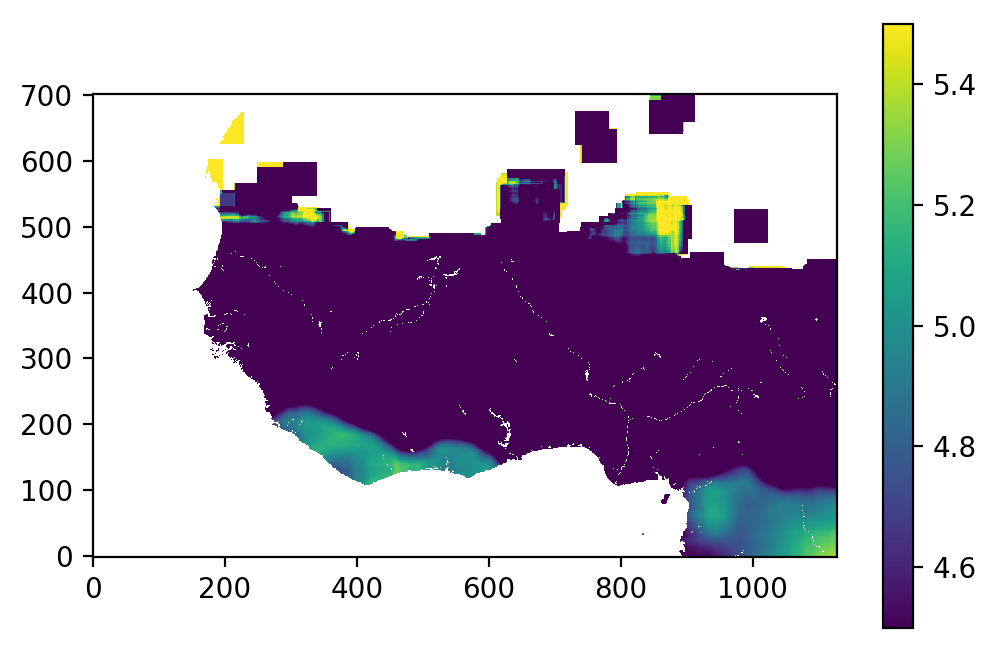

In [18]:
plt.figure(dpi=200)
plt.imshow(new_lai, origin='lower', vmin=4.5, vmax=5.5)
plt.colorbar()

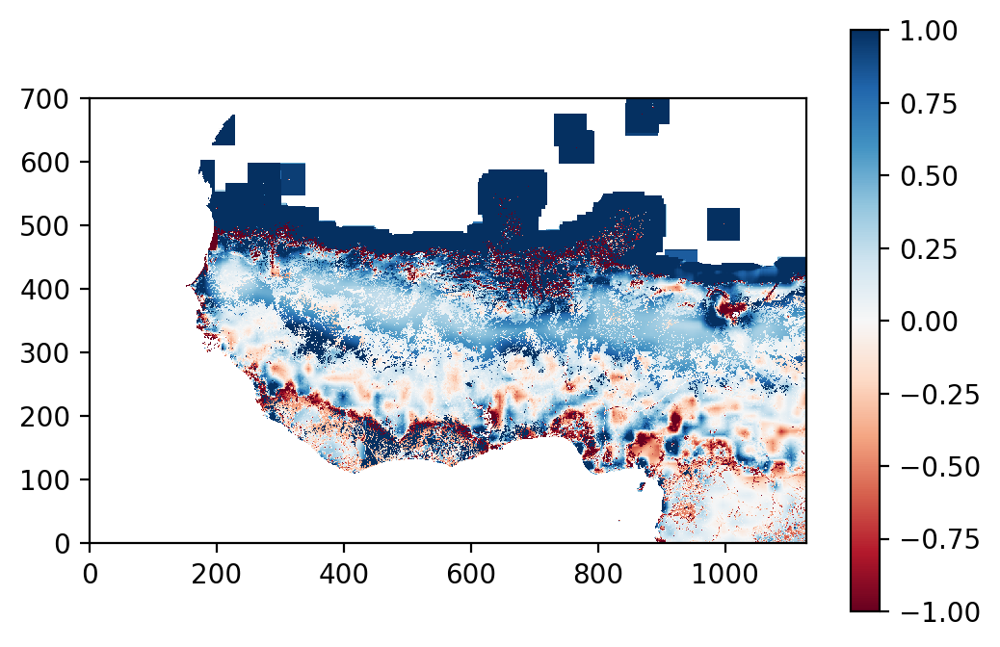

In [114]:
plt.figure(dpi=200)
plt.imshow(new_lai-lai, origin='lower', vmin=-1, vmax=1, cmap='RdBu')
plt.colorbar()

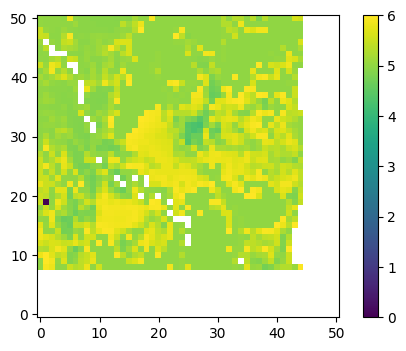

In [85]:
# check single pixel
y = pos[0][4000]
x = pos[1][3000]
box_lai = cut_kernel(lai, x, y, 25)  # 25 pixel ~ 110km
box_frac = cut_kernel(treefra, x, y, 25)  # 25 pixel ~ 110km

plt.figure(dpi=100)
plt.imshow(box_lai, origin='lower')
plt.colorbar()

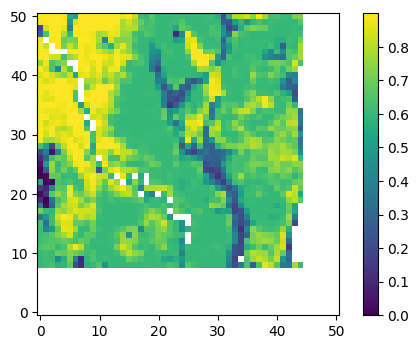

In [86]:
plt.figure(dpi=100)
plt.imshow(box_frac, origin='lower')
plt.colorbar()

In [89]:
bigger = np.where(box_lai>0.1)
new_point = np.sum((box_lai)[bigger])/len(bigger[0]) 

/users/global/cornkle/miniconda3/lib/python3.5/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.


In [90]:
new_point

5.2601746752207843